# Launch QtLab

In [1]:
#%matplotlib qt5
from qsweepy import *
from qsweepy.ponyfiles import *

# loading all modules from qsweepy.instrument_drivers
# omitting module's members which name starts with "__"
from qsweepy.instruments import *  

#import matplotlib.pyplot as plt
import numpy as np
#from matplotlib import interactive
#interactive(True)
from importlib import reload

sample_name = 'Fluxonium_1907_063_2'

Failed loading module Keysight_M3102A:  No module named 'keysightSD1'
Failed loading module Keysight_M3202A:  No module named 'keysightSD1'
[WinError 126] The specified module could not be found
Failed loading module Signal_Hound_SA:  name 'signal_hound_dll' is not defined


# initialize hardware in pulsed mode

In [2]:
from qsweepy.tunable_coupling_transmons.Misis_Fluxonium_September_2019_setup \
import device_settings, pulsed_settings, hardware_setup
hardware = hardware_setup(device_settings, pulsed_settings)
hardware.open_devices()
hardware.set_pulsed_mode()
hardware.coil.set_offset(0.0)

Discovered device `dev8108`: HDAWG8 with options MF.
Creating an API session for device `dev8108` on `127.0.0.1`, `8004` with apilevel `6`.
Trigger output is assigned to AWG Trigger 1, controlled by AWG sequencer commands.
Trigger output is assigned to AWG Trigger 2, controlled by AWG sequencer commands.
Trigger output is assigned to AWG Trigger 3, controlled by AWG sequencer commands.
Trigger output is assigned to AWG Trigger 4, controlled by AWG sequencer commands.
Output is assigned to Output 1 Marker 1.
Output is assigned to Output 1 Marker 2.
Output is assigned to Output 2 Marker 1.
Output is assigned to Output 2 Marker 2.
Compilation successful with no warnings, will upload the program to the instrument.
0 awgModule/progress: 0.00
1 awgModule/progress: 1.00
Upload to the instrument successful.
Time:  0.7105630145208794
Compilation successful with no warnings, will upload the program to the instrument.
0 awgModule/progress: 0.09
1 awgModule/progress: 0.45
2 awgModule/progress: 0.5

D:\qtlab_replacement\qsweepy\config.py:65: YAMLLoadWarning:

calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.



Compilation successful with no warnings, will upload the program to the instrument.
0 awgModule/progress: 0.00
1 awgModule/progress: 0.00
2 awgModule/progress: 0.06
3 awgModule/progress: 0.09
4 awgModule/progress: 0.12
5 awgModule/progress: 0.18
6 awgModule/progress: 0.19
7 awgModule/progress: 0.24
8 awgModule/progress: 0.30
9 awgModule/progress: 0.34
10 awgModule/progress: 0.37
11 awgModule/progress: 0.40
12 awgModule/progress: 0.44
13 awgModule/progress: 0.51
14 awgModule/progress: 0.54
15 awgModule/progress: 0.58
16 awgModule/progress: 0.62
17 awgModule/progress: 0.66
18 awgModule/progress: 0.71
19 awgModule/progress: 0.75
20 awgModule/progress: 0.80
21 awgModule/progress: 0.85
22 awgModule/progress: 0.88
23 awgModule/progress: 0.92
24 awgModule/progress: 0.96
25 awgModule/progress: 0.98
26 awgModule/progress: 0.98
27 awgModule/progress: 1.00
Upload to the instrument successful.
Time:  3.3662931482224447
Compilation successful with no warnings, will upload the program to the instrum

Compilation successful with no warnings, will upload the program to the instrument.
0 awgModule/progress: 0.00
1 awgModule/progress: 0.02
2 awgModule/progress: 0.04
3 awgModule/progress: 0.09
4 awgModule/progress: 0.15
5 awgModule/progress: 0.17
6 awgModule/progress: 0.19
7 awgModule/progress: 0.24
8 awgModule/progress: 0.28
9 awgModule/progress: 0.33
10 awgModule/progress: 0.37
11 awgModule/progress: 0.42
12 awgModule/progress: 0.44
13 awgModule/progress: 0.49
14 awgModule/progress: 0.54
15 awgModule/progress: 0.58
16 awgModule/progress: 0.63
17 awgModule/progress: 0.66
18 awgModule/progress: 0.72
19 awgModule/progress: 0.73
20 awgModule/progress: 0.79
21 awgModule/progress: 0.82
22 awgModule/progress: 0.88
23 awgModule/progress: 0.93
24 awgModule/progress: 0.96
25 awgModule/progress: 0.98
26 awgModule/progress: 0.98
27 awgModule/progress: 1.00
Upload to the instrument successful.
Time:  3.2710008490469207
Output is assigned to Output 1 Marker 1.
Output is assigned to Output 2 Marker 

# Reload scripts and start measuring

In [3]:
reload(exdir_db)
reload(database)
reload(sweep_extras)
import imp
from qsweepy.qubit_calibrations import readout_passthrough
from qsweepy.fitters import exp_sin, fit_dataset
from qsweepy import readout_classifier
from qsweepy.qubit_calibrations import gauss_hd
from qsweepy import tomography
from qsweepy import pulses
reload(awg_digital)
reload(awg_iq_multi)
reload(data_reduce)
reload(fitting)
reload(plotting)
reload(tomography)
reload(sweep)
reload(pulses)
reload(awg_channel)
reload(awg_iq_multi)
reload(modem_readout)
reload(qubit_device)
reload(single_shot_readout)
reload(readout_passthrough)
reload(exp_sin)
reload(fit_dataset)
reload(exdir_db)
reload(database)
reload(sweep_extras)
reload(readout_classifier)

db = database.MyDatabase()
sweeper = sweep_extras.Sweeper(db, sample_name=sample_name)
exdir_db_inst = exdir_db.Exdir_db(db=db, sample_name=sample_name)

hardware.setup_iq_channel_connections(exdir_db_inst)
device = qubit_device.qubit_device(exdir_db_inst, sweeper, controls = {'coil':hardware.coil})
device.create_pulsed_interfaces(hardware.iq_devices, hardware.fast_controls,
                                extra_channels = {'ro_trg':hardware.ro_trg})
device.setup_modem_readout(hardware)

<class 'ValueError'> could not convert string to float: '(-0.03872209901375755+0.010549486890503829j)'
reference: ('channel_calibration', 'iq_ro_q1') : 3776
Got delay calibration: -2.98e-07


D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  187200 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 2000 pre_delay 177200 pre_delay_reg 22150
reference: ('channel_calibration', 'iq_ro_q1') : 3776
reference: calibration : 3777
Validation measurement (delay): -1e-08
reference: delay_measurement : 3778
reference: delay_measurement : 3778


In [4]:
from qsweepy.qubit_calibrations import excitation_pulse
from qsweepy.qubit_calibrations import readout_pulse
from qsweepy.qubit_calibrations import channel_amplitudes
from qsweepy.qubit_calibrations import Rabi
from qsweepy.qubit_calibrations import Ramsey
from qsweepy.qubit_calibrations import calibrated_readout
from qsweepy.qubit_calibrations import gauss_hd
from qsweepy.qubit_calibrations import state_tomography
reload(Ramsey)
from qsweepy.fitters import exp_sin
from qsweepy.fitters import fit_dataset
reload(fit_dataset)
reload(exp_sin)
reload(excitation_pulse)
reload(readout_pulse)
reload(Rabi)
reload(single_shot_readout)
reload(calibrated_readout)
reload(readout_passthrough)
reload(gauss_hd)
reload(state_tomography)
#Rabi.Rabi_rect_adaptive(device, '1', channel_amplitudes.channel_amplitudes(device, iq_ex1_q1=1.0))
#Rabi.Rabi_rect_adaptive(device, '3', channel_amplitudes.channel_amplitudes(device, iq_ex3_q3=1.0))

<module 'qsweepy.qubit_calibrations.state_tomography' from 'D:\\qtlab_replacement\\qsweepy\\qubit_calibrations\\state_tomography.py'>

In [5]:
readout_passthrough.readout_passthrough(device=device, amplitudes=np.linspace(0, 1.0, 21), qubit_id='1', length=1.7e-6)
#readout_passthrough.readout_passthrough(device=device, amplitudes=np.linspace(0, 0.4, 21), qubit_id='3', length=1.7e-6)

first_point:  193984 last_point:  194392 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 4808 pre_delay 193792 pre_delay_reg 24224
Mean_Voltage_AC
Std_Voltage_AC
S21


D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_passthrough.py:71: RuntimeWarning:

invalid value encountered in less

D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_passthrough.py:48: RuntimeWarning:

invalid value encountered in greater



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
Mean_Voltage_AC
Std_Voltage_AC
S21
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
Mean_Voltage_AC
Std_Voltage_AC
S21
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
Mean_Voltage_AC
Std_Voltage_AC
S21
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
Mean_Voltage_AC

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\memmap.py:331: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



 0.19787836074829102
trace 9 time:  0.21286892890930176


start: 2019-09-11 11:41:44.219721, started/done/total sweeps: 0/21/21, 
Measured data: 
'Mean_Voltage_AC': parameters: amplitude (),:[0.0, 1.0] (21 points) with setter
Time (s),:[0.0, 2.047e-06] (2048 points) without setter
data: [[ -3.63523449-2.82497275e-01j   3.04490551-6.17117275e-01j
   -3.68097449-3.58777275e-01j ...   0.49798551+4.03940272e+00j
    1.36374551-6.46197275e-01j   0.99638551-1.01571728e+00j]
 [ -1.01695843+7.94330469e-02j   0.25372157+1.81389305e+00j
    0.79938157-2.08442695e+00j ...   2.59118157+1.74773305e+00j
    1.38510157+1.66427305e+00j  -5.11351843-2.77402695e+00j]
 [  0.31862244+4.52617803e-01j   3.05598244-5.63562197e-01j
    1.21342244-2.98866220e+00j ...  -1.78493756+7.43901780e+00j
   -5.66957756+5.50263780e+00j  -4.37405756-3.34650220e+00j]
 ...
 [ -3.8786865 +3.00329658e-01j   1.2614335 +1.64380966e+00j
    1.1775535 +3.30896582e-02j ...   3.8289535 +5.75684297e+01j
  -43.3472065 +3.61505697e+01j -55.3496665 -1.44606703e+01j]
 [ -3.59849775+8.71767002

In [6]:
Rabi.calibrate_all_single_channel_Rabi(device, transition='01', remove_bad=False)
#Rabi.calibrate_all_single_channel_Rabi(device, transition='12', remove_bad=False)

Requested:  metadata: {'coil_q1': '1.0'} references: {}
Obtained:  metadata: {'coil_q1': '1.0'} references: {}
good Rabi fits: []
0 8e-08 1e-09
reference: frequency_controls : 2083
reference: channel_calibration : 3776


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 93, in get_qubit_readout_pulse
    measurement = device.exdir_db.select_measurement(measurement_type='readout_fidelity_scan', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range


reference: channel_amplitudes : 3339
reference: gauss_hd_Rabi_amplitude_adaptive : 3439
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003339-channel_amplitudes-1906-002_4_down
Failed to get readout pulse from fidelity scan, fall back to passthrough
reference: frequency_controls : 2083
reference: channel_calibration : 3776


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 93, in get_qubit_readout_pulse
    measurement = device.exdir_db.select_measurement(measurement_type='readout_fidelity_scan', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 100, in get_qubit_readout_pulse
    measurement = readout_fidelity_scan(device, qubit_id, [length], amplitudes, recalibrate_excitation=False)
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 217, in readout_fidelity_scan
    qubit_excitation_pulse.get_pulse_sequenc

reference: passthrough_measurement : 3781
reference: ('readout_pulse', '1') : 3782
reference: readout_pulse : 3783
reference: delay_calibration : 3778
None


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 93, in get_qubit_readout_pulse
    measurement = device.exdir_db.select_measurement(measurement_type='readout_fidelity_scan', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 100, in get_qubit_readout_pulse
    measurement = readout_fidelity_scan(device, qubit_id, [length], amplitudes, recalibrate_excitation=False)
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 217, in readout_fidelity_scan
    qubit_excitation_pulse.get_pulse_sequenc

reference: frequency_controls : 2083
reference: channel_calibration : 3776


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 93, in get_qubit_readout_pulse
    measurement = device.exdir_db.select_measurement(measurement_type='readout_fidelity_scan', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range


reference: channel_amplitudes : 3339
reference: gauss_hd_Rabi_amplitude_adaptive : 3439
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003339-channel_amplitudes-1906-002_4_down
Failed to get readout pulse from fidelity scan, fall back to passthrough
reference: frequency_controls : 2083
reference: channel_calibration : 3776


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 93, in get_qubit_readout_pulse
    measurement = device.exdir_db.select_measurement(measurement_type='readout_fidelity_scan', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 100, in get_qubit_readout_pulse
    measurement = readout_fidelity_scan(device, qubit_id, [length], amplitudes, recalibrate_excitation=False)
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 217, in readout_fidelity_scan
    qubit_excitation_pulse.get_pulse_sequenc

reference: passthrough_measurement : 3781
reference: readout_pulse : 3782
reference: modem_calibration : 3780


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 126, in get_readout_calibration
    return device.exdir_db.select_measurement(measurement_type='readout_background_calibration', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range


Mean_Voltage_AC
Std_Voltage_AC
S21
Waiting to join deferred threads:
load time:  0.11193108558654785
pre_trace_time:  0.001997709274291992
trace 0 time:  0.015990734100341797
trace 1 time:  0.03098154067993164
trace 2 time:  0.044972896575927734
trace 3 time:  0.060962677001953125
trace 4 time:  0.07495450973510742
initial_axes_order [(2, 0)]


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193392 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193392 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193392 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193392 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.11313663]), 'T': array([2.35600427e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.0169779]), 'f': array([4.93021709e+08]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.05152234]), 'num_periods_decay': array([116.15612519]), 'num_periods_scan': array([1.97208684]), 'phi': array([-1.49306831]), 'points_per_period': array([2.02830825])}


C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\minpack.py:449: RuntimeWarning:

Number of calls to function has reached maxfev = 200.



first_point:  193384 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.06136722]), 'T': array([1.75678609e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.00028461]), 'f': array([3.27527758e+08]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.62051029]), 'num_periods_decay': array([5753.96210407]), 'num_periods_scan': array([1.63763879]), 'phi': array([-5.46586701]), 'points_per_period': array([3.05317634])}
first_point:  193384 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.06969078]), 'T': array([2.29855614e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_len

D:\qtlab_replacement\qsweepy\fitters\exp_sin.py:85: RuntimeWarning:

overflow encountered in square



first_point:  193384 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.82481251]), 'T': array([4.6194293e-11]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([173.18156604]), 'f': array([3.7754741e+08]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.52744524]), 'num_periods_decay': array([0.01744054]), 'num_periods_scan': array([3.02037928]), 'phi': array([-5.14575763]), 'points_per_period': array([2.64867398])}
first_point:  193376 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.53023305]), 'T': array([5.8877317e-09]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length'

first_point:  193352 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.41835858]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([35786659.69990207]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([-0.22109175]), 'num_periods_decay': array([inf]), 'num_periods_scan': array([0.75151985]), 'phi': array([-3.74014126]), 'points_per_period': array([27.94337355])}
first_point:  193352 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.36935021]), 'T': array([9.3829911e-09]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([2.34466811])

first_point:  193328 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.5716159]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([20816255.3344178]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.1379146]), 'num_periods_decay': array([inf]), 'num_periods_scan': array([0.70775268]), 'phi': array([-2.62066135]), 'points_per_period': array([48.03937999])}
first_point:  193328 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.58116199]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([20724296

iq1
{'MSE_rel': array([0.51033431]), 'T': array([4.21497921e-08]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([1.11507074]), 'f': array([32210010.89695324]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([-0.27140507]), 'num_periods_decay': array([1.35764526]), 'num_periods_scan': array([1.51387051]), 'phi': array([-3.63815836]), 'points_per_period': array([31.04624842])}
first_point:  193304 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.5191263]), 'T': array([4.09875483e-08]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([1.17108737]), 'f': array([32200756.69363052]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([-0.26797]), 'num_periods_decay': array([1.31983007]), 'num_periods_scan': array([1.54563632]

first_point:  193280 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.50497746]), 'T': array([3.77160649e-08]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([1.59083404]), 'f': array([30412216.32981865]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.28508687]), 'num_periods_decay': array([1.14702913]), 'num_periods_scan': array([1.82473298]), 'phi': array([-0.34928335]), 'points_per_period': array([32.8815233])}
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.50641104]), 'T': array([3.61314869e-08]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_len

first_point:  193248 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.53537828]), 'T': array([3.85098703e-08]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([1.89561791]), 'f': array([28714331.53507396]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([-0.29838832]), 'num_periods_decay': array([1.10578518]), 'num_periods_scan': array([2.0961462]), 'phi': array([-3.34798158]), 'points_per_period': array([34.82581507])}
first_point:  193248 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.53539543]), 'T': array([3.72683006e-08]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_le

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 93, in get_qubit_readout_pulse
    measurement = device.exdir_db.select_measurement(measurement_type='readout_fidelity_scan', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range


reference: channel_amplitudes : 3339
reference: gauss_hd_Rabi_amplitude_adaptive : 3439
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003339-channel_amplitudes-1906-002_4_down
Failed to get readout pulse from fidelity scan, fall back to passthrough
reference: frequency_controls : 2083
reference: channel_calibration : 3776


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 93, in get_qubit_readout_pulse
    measurement = device.exdir_db.select_measurement(measurement_type='readout_fidelity_scan', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 100, in get_qubit_readout_pulse
    measurement = readout_fidelity_scan(device, qubit_id, [length], amplitudes, recalibrate_excitation=False)
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 217, in readout_fidelity_scan
    qubit_excitation_pulse.get_pulse_sequenc

reference: passthrough_measurement : 3781
reference: ('readout_pulse', '1') : 3782
reference: readout_pulse : 3783
reference: delay_calibration : 3778
None
reference: frequency_controls : 2083
reference: channel_calibration : 3776


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 68, in get_calibrated_measurer
    references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range
Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 177, in get_uncalibrated_measurer
    qubit_readout_pulse_, measurer = get_calibrated_measurer(device, [qubit_id], recalibrate=False)
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 68, in get_calibrated_measurer
    references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
Inde

reference: channel_amplitudes : 3339
reference: gauss_hd_Rabi_amplitude_adaptive : 3439
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003339-channel_amplitudes-1906-002_4_down
Failed to get readout pulse from fidelity scan, fall back to passthrough
reference: frequency_controls : 2083
reference: channel_calibration : 3776


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 93, in get_qubit_readout_pulse
    measurement = device.exdir_db.select_measurement(measurement_type='readout_fidelity_scan', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 100, in get_qubit_readout_pulse
    measurement = readout_fidelity_scan(device, qubit_id, [length], amplitudes, recalibrate_excitation=False)
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 217, in readout_fidelity_scan
    qubit_excitation_pulse.get_pulse_sequenc

reference: passthrough_measurement : 3781
reference: readout_pulse : 3782
reference: modem_calibration : 3780
initial_axes_order [(2, 0)]


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193376 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193360 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193320 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.08134668]), 'T': array([4.69457459e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.08520474]), 'f': array([7484427.41729793]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.38361543]), 'num_periods_decay': array([3.51362028]), 'num_periods_scan': array([0.2993771]), 'phi': array([-1.37592831]), 'points_per_period': array([13.36107553])}
first_point:  193296 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.08137727]), 'T': array([9.0071543e-09]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_lengt

first_point:  193056 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq1
{'MSE_rel': array([0.15850273]), 'T': array([2.24058153e-08]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([7.58731597]), 'f': array([4816844.17957495]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.1488507]), 'num_periods_decay': array([0.10792532]), 'num_periods_scan': array([0.81886351]), 'phi': array([-5.00186724]), 'points_per_period': array([20.76048057])}
first_point:  193040 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq1
{'MSE_rel': array([0.26741186]), 'T': array([3.45262389e-08]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_leng

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

root: ERROR    Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\ProgramData\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3326, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-6-befb3f3ec8ff>", line 1, in <module>
    Rabi.calibrate_all_single_channel_Rabi(device, transition='01', remove_bad=False)
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\Rabi.py", line 118, in calibrate_all_single_channel_Rabi
    excitation_pulse.get_excitation_pulse(device, qubit_id, rotation_angle=np.pi/2., transition=transition, channel_amplitudes_override=ch)
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\excitation_pulse.py", line 212, in get_excitation_pulse
    channel_amplitudes_override=channel_amplitudes_override, recalibrate=recalibrate)
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\excitation_pulse.py", line 245, in get_rect_excitation_pulse
    Rabi.Rabi_rect_adaptive(device, qubit_id=qubit_id, transition=transition, channel_a

KeyboardInterrupt: 

In [10]:
reload(Rabi)
Rabi.calibrate_all_single_channel_Rabi(device, transition='12', channel_amplitudes={}, remove_bad=False)

Requested:  metadata: {'iq_ex1_q1_12': '1.0'} references: {('channel_calibration', 'iq_ex1_q1_12'): 3267}
reference: ('channel_calibration', 'iq_ex1_q1_12') : 3267
Obtained:  metadata: {'iq_ex1_q1_12': '1.0'} references: {'channel_calibration': 3267}
good Rabi fits: []
0 8e-08 1e-09


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 174, in get_uncalibrated_measurer
    assert transition == '01'
AssertionError


reference: frequency_controls : 2083
reference: channel_calibration : 3269
reference: fidelity_scan : 3281
reference: readout_pulse : 3282
reference: modem_calibration : 3278
initial_axes_order [(2, 0)]


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193392 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193392 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193392 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193392 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.01852343]), 'T': array([1.38779451e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.00028823]), 'f': array([1.41987952e+08]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([1.12061944]), 'num_periods_decay': array([1970.50100545]), 'num_periods_scan': array([0.56795181]), 'phi': array([-3.92387166]), 'points_per_period': array([7.04285105])}
first_point:  193384 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.01716432]), 'T': array([0.00463799]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length'

first_point:  193360 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.14392693]), 'T': array([2.07931762e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.00081758]), 'f': array([37330487.83900274]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([1.31098435]), 'num_periods_decay': array([776.21940999]), 'num_periods_scan': array([0.63461829]), 'phi': array([-1.57570113]), 'points_per_period': array([26.78775601])}
first_point:  193360 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.12469475]), 'T': array([2.43674883e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_

first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.36277844]), 'T': array([9.49005141e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.03161205]), 'f': array([48196206.09908636]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.61566931]), 'num_periods_decay': array([45.73844738]), 'num_periods_scan': array([1.44588618]), 'phi': array([-1.94495548]), 'points_per_period': array([20.74852112])}
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.39058331]), 'T': array([8.34851457e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_l

first_point:  193312 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.57786951]), 'T': array([2.72414336e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.01578478]), 'f': array([22845593.28549935]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.28001931]), 'num_periods_decay': array([62.23467123]), 'num_periods_scan': array([0.98236051]), 'phi': array([-4.9150896]), 'points_per_period': array([43.77211778])}
first_point:  193312 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.58751858]), 'T': array([7.44316183e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_le

first_point:  193288 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.58304112]), 'T': array([2.20317188e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.25417899]), 'f': array([16819724.92805725]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([-0.04965107]), 'num_periods_decay': array([3.70567451]), 'num_periods_scan': array([0.9419046]), 'phi': array([-4.42776679]), 'points_per_period': array([59.45400441])}
first_point:  193280 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.58561829]), 'T': array([1.22851907e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_le

KeyboardInterrupt: 

## Rabi

In [11]:
from qsweepy.qubit_calibrations import readout_pulse
qubit_readout_pulse = readout_pulse.get_qubit_readout_pulse(device, '1', 1.7e-6)
new_measurement = readout_pulse.measure_readout(device, qubit_readout_pulse)
new_measurement.measurement_type = 'readout_background_calibration'
device.exdir_db.db.update_in_database(new_measurement)

reference: frequency_controls : 2083
reference: channel_calibration : 3709


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 93, in get_qubit_readout_pulse
    measurement = device.exdir_db.select_measurement(measurement_type='readout_fidelity_scan', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range


reference: channel_amplitudes : 3339
reference: gauss_hd_Rabi_amplitude_adaptive : 3439
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003339-channel_amplitudes-1906-002_4_down
Failed to get readout pulse from fidelity scan, fall back to passthrough
reference: frequency_controls : 2083
reference: channel_calibration : 3709


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 93, in get_qubit_readout_pulse
    measurement = device.exdir_db.select_measurement(measurement_type='readout_fidelity_scan', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 100, in get_qubit_readout_pulse
    measurement = readout_fidelity_scan(device, qubit_id, [length], amplitudes, recalibrate_excitation=False)
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 217, in readout_fidelity_scan
    qubit_excitation_pulse.get_pulse_sequenc

reference: passthrough_measurement : 3715
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
Mean_Voltage_AC
Std_Voltage_AC
S21
Waiting to join deferred threads:
load time:  0.1009371280670166
pre_trace_time:  0.001999378204345703
trace 0 time:  0.013991117477416992
trace 1 time:  0.026982545852661133
trace 2 time:  0.03997492790222168
trace 3 time:  0.05296683311462402
trace 4 time:  0.06695842742919922


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\memmap.py:331: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



3728

In [12]:
try:
    Rabi.Rabi_rect_adaptive(device=device, qubit_id='1', 
        channel_amplitudes=channel_amplitudes.channel_amplitudes(device, coil_q1=1.0))
except:
    pass
try:
    Rabi.Rabi_rect_adaptive(device=device, qubit_id='1', 
        channel_amplitudes=channel_amplitudes.channel_amplitudes(device, coil_q1=0.5))
except:
    pass
try:
    Rabi.Rabi_rect_adaptive(device=device, qubit_id='1', 
        channel_amplitudes=channel_amplitudes.channel_amplitudes(device, coil_q1=0.2))
except:
    pass
try:
    Rabi.Rabi_rect_adaptive(device=device, qubit_id='1', 
        channel_amplitudes=channel_amplitudes.channel_amplitudes(device, coil_q1=0.1))
except:
    pass
#Rabi.Rabi_rect_adaptive(device=device, qubit_id='3', 
#    channel_amplitudes=channel_amplitudes.channel_amplitudes(device, iq_ex3_q3=1.0))

Requested:  metadata: {'coil_q1': '1.0'} references: {}
Obtained:  metadata: {'coil_q1': '1.0'} references: {}
0 8e-08 1e-09
reference: frequency_controls : 2083
reference: channel_calibration : 3709


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 93, in get_qubit_readout_pulse
    measurement = device.exdir_db.select_measurement(measurement_type='readout_fidelity_scan', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range


reference: channel_amplitudes : 3339
reference: gauss_hd_Rabi_amplitude_adaptive : 3439
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003339-channel_amplitudes-1906-002_4_down
Failed to get readout pulse from fidelity scan, fall back to passthrough
reference: frequency_controls : 2083
reference: channel_calibration : 3709


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 93, in get_qubit_readout_pulse
    measurement = device.exdir_db.select_measurement(measurement_type='readout_fidelity_scan', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 100, in get_qubit_readout_pulse
    measurement = readout_fidelity_scan(device, qubit_id, [length], amplitudes, recalibrate_excitation=False)
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 217, in readout_fidelity_scan
    qubit_excitation_pulse.get_pulse_sequenc

reference: passthrough_measurement : 3715
reference: ('readout_pulse', '1') : 3719
reference: readout_pulse : 3720
reference: delay_calibration : 3711
None
reference: frequency_controls : 2083
reference: channel_calibration : 3709


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 68, in get_calibrated_measurer
    references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range
Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 177, in get_uncalibrated_measurer
    qubit_readout_pulse_, measurer = get_calibrated_measurer(device, [qubit_id], recalibrate=False)
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 68, in get_calibrated_measurer
    references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
Inde

reference: channel_amplitudes : 3339
reference: gauss_hd_Rabi_amplitude_adaptive : 3439
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003339-channel_amplitudes-1906-002_4_down
Failed to get readout pulse from fidelity scan, fall back to passthrough
reference: frequency_controls : 2083
reference: channel_calibration : 3709


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 93, in get_qubit_readout_pulse
    measurement = device.exdir_db.select_measurement(measurement_type='readout_fidelity_scan', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 100, in get_qubit_readout_pulse
    measurement = readout_fidelity_scan(device, qubit_id, [length], amplitudes, recalibrate_excitation=False)
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 217, in readout_fidelity_scan
    qubit_excitation_pulse.get_pulse_sequenc

reference: passthrough_measurement : 3715
reference: readout_pulse : 3719
reference: modem_calibration : 3713
initial_axes_order [(2, 0)]


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193392 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193392 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193392 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193392 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.3490856]), 'T': array([1.92710963e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.02075647]), 'f': array([7.11811803e+08]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([1.84269265]), 'num_periods_decay': array([137.17393825]), 'num_periods_scan': array([2.84724721]), 'phi': array([-4.6620427]), 'points_per_period': array([1.40486572])}
first_point:  193384 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.34395853]), 'T': array([3.40288763e-08]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length

C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\minpack.py:449: RuntimeWarning:

Number of calls to function has reached maxfev = 200.



first_point:  193384 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.45422528]), 'T': array([1.52461833e-08]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.39354112]), 'f': array([5.267586e+08]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.62695496]), 'num_periods_decay': array([8.03105819]), 'num_periods_scan': array([3.1605516]), 'phi': array([-1.93860602]), 'points_per_period': array([1.8984028])}
first_point:  193384 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.621128]), 'T': array([7.470085e-08]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  193376 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.60844196]), 'T': array([6.18848886e-08]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.1939084]), 'f': array([3.5576182e+08]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.86044317]), 'num_periods_decay': array([22.01628056]), 'num_periods_scan': array([4.26914184]), 'phi': array([-2.45669245]), 'points_per_period': array([2.81086937])}
first_point:  193368 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.73629595]), 'T': array([2.96713433e-08]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length'

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  193344 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.77172771]), 'T': array([1.69193615e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.14775971]), 'f': array([1.40512204e+08]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.55293097]), 'num_periods_decay': array([23.7737677]), 'num_periods_scan': array([3.5128051]), 'phi': array([-5.10454735]), 'points_per_period': array([7.11681955])}
first_point:  193344 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  193344 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.77290327]), 'T': array([9.34831239e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.02888222]), 'f': array([7519490.81672329]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.96635864]), 'num_periods_decay': array([7.02945492]), 'num_periods_scan': array([0.20302625]), 'phi': array([-0.75153176]), 'points_per_period': array([132.98772808])}
first_point:  193344 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([10.80132387]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': arr

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  193328 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.8999737]), 'T': array([9.68041568e-08]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.36155472]), 'f': array([3.57104268e+08]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.27623558]), 'num_periods_decay': array([34.56917754]), 'num_periods_scan': array([12.49864938]), 'phi': array([-2.957684]), 'points_per_period': array([2.80030257])}
first_point:  193328 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.86442432]), 'T': array([8.44629175e-08]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length'

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  193320 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.86726816]), 'T': array([3.24966403e-08]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([1.16935165]), 'f': array([44652424.54527191]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.1875855]), 'num_periods_decay': array([1.45105378]), 'num_periods_scan': array([1.69679213]), 'phi': array([-3.90664307]), 'points_per_period': array([22.39520049])}
first_point:  193320 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.89078205]), 'T': array([2.36678703e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_len

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  193304 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  193296 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.8263878]), 'T': array([3.1703958e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.15455483]), 'f': array([82553948.05473973]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.25196893]), 'num_periods_decay': array([26.17286906]), 'num_periods_scan': array([4.04514345]), 'phi': array([-4.96340732]), 'points_per_period': array([12.11329105])}
first_point:  193296 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.81624209]), 'T': array([3.69057066e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_len

first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.82981407]), 'T': array([1.77347926e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.34959529]), 'f': array([32735879.6925173]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.53080423]), 'num_periods_decay': array([5.80564037]), 'num_periods_scan': array([2.02962454]), 'phi': array([-2.45274321]), 'points_per_period': array([30.54752184])}
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.82773737]), 'T': array([1.83932533e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_len

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  193264 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  193264 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.72966231]), 'T': array([2.82251258e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.02338342]), 'f': array([2006319.31290535]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.98310998]), 'num_periods_decay': array([5.66286149]), 'num_periods_scan': array([0.13241707]), 'phi': array([-0.38086463]), 'points_per_period': array([498.42514777])}
first_point:  193264 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.80219268]), 'T': array([1.90510768e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_le

first_point:  193240 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.76820376]), 'T': array([3.38554003e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.00233345]), 'f': array([11077798.83037347]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.8493392]), 'num_periods_decay': array([375.04331405]), 'num_periods_scan': array([0.87514611]), 'phi': array([-1.96261183]), 'points_per_period': array([90.27064088])}
Waiting to join deferred threads:
load time:  0.03897595405578613
pre_trace_time:  0.0009996891021728516
trace 0 time:  0.013991832733154297
trace 1 time:  0.02898240089416504
trace 2 time:  0.04197335243225098
trace 3 time:  0.05696439743041992
load time:  0.038977861404418945
pre_trace_time:  0.0009968280792236328
trace 0 time:  0.0149915218353271

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 93, in get_qubit_readout_pulse
    measurement = device.exdir_db.select_measurement(measurement_type='readout_fidelity_scan', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range


reference: channel_amplitudes : 3339
reference: gauss_hd_Rabi_amplitude_adaptive : 3439
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003339-channel_amplitudes-1906-002_4_down
Failed to get readout pulse from fidelity scan, fall back to passthrough
reference: frequency_controls : 2083
reference: channel_calibration : 3709


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 93, in get_qubit_readout_pulse
    measurement = device.exdir_db.select_measurement(measurement_type='readout_fidelity_scan', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 100, in get_qubit_readout_pulse
    measurement = readout_fidelity_scan(device, qubit_id, [length], amplitudes, recalibrate_excitation=False)
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 217, in readout_fidelity_scan
    qubit_excitation_pulse.get_pulse_sequenc

reference: passthrough_measurement : 3715
reference: ('readout_pulse', '1') : 3719
reference: readout_pulse : 3720
reference: delay_calibration : 3711
None
reference: frequency_controls : 2083
reference: channel_calibration : 3709


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 68, in get_calibrated_measurer
    references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range
Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 177, in get_uncalibrated_measurer
    qubit_readout_pulse_, measurer = get_calibrated_measurer(device, [qubit_id], recalibrate=False)
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 68, in get_calibrated_measurer
    references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
Inde

reference: channel_amplitudes : 3339
reference: gauss_hd_Rabi_amplitude_adaptive : 3439
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003339-channel_amplitudes-1906-002_4_down
Failed to get readout pulse from fidelity scan, fall back to passthrough
reference: frequency_controls : 2083
reference: channel_calibration : 3709


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 93, in get_qubit_readout_pulse
    measurement = device.exdir_db.select_measurement(measurement_type='readout_fidelity_scan', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 100, in get_qubit_readout_pulse
    measurement = readout_fidelity_scan(device, qubit_id, [length], amplitudes, recalibrate_excitation=False)
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 217, in readout_fidelity_scan
    qubit_excitation_pulse.get_pulse_sequenc

reference: passthrough_measurement : 3715
reference: readout_pulse : 3719
reference: modem_calibration : 3713
initial_axes_order [(2, 0)]


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193376 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193360 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193320 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.16908122]), 'T': array([1.38346921e-10]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([289.12822805]), 'f': array([41458253.22105262]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.27388934]), 'num_periods_decay': array([0.00573562]), 'num_periods_scan': array([1.65833013]), 'phi': array([-3.15179705]), 'points_per_period': array([2.41206496])}
first_point:  193296 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.45818918]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': arr

D:\qtlab_replacement\qsweepy\fitters\exp_sin.py:85: RuntimeWarning:

overflow encountered in square



first_point:  193240 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.47364661]), 'T': array([2.30091032e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.34768848]), 'f': array([21917008.99129002]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.51873846]), 'num_periods_decay': array([5.04290721]), 'num_periods_scan': array([1.75336072]), 'phi': array([-3.71595562]), 'points_per_period': array([4.56266638])}
first_point:  193216 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.52335111]), 'T': array([0.00014212]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length'

first_point:  192976 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq1
{'MSE_rel': array([0.66035482]), 'T': array([1.33831055e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.15691425]), 'f': array([31443859.59780768]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.64932682]), 'num_periods_decay': array([42.08164916]), 'num_periods_scan': array([6.60321052]), 'phi': array([-2.05010291]), 'points_per_period': array([3.18027117])}
first_point:  192960 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq1
{'MSE_rel': array([0.63104878]), 'T': array([1.36485777e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_le

first_point:  192720 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.70483905]), 'T': array([8.53209456e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.03984953]), 'f': array([30800133.00919528]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.77379823]), 'num_periods_decay': array([262.78964742]), 'num_periods_scan': array([10.47204522]), 'phi': array([-1.71848741]), 'points_per_period': array([3.24673923])}
first_point:  192696 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.7089162]), 'T': array([3.71352203e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan

first_point:  192456 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.7757082]), 'T': array([9.48930707e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.49529433]), 'f': array([4476503.36235548]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([1.41182237]), 'num_periods_decay': array([4.2478915]), 'num_periods_scan': array([2.10395658]), 'phi': array([-2.90409808]), 'points_per_period': array([22.33886404])}
first_point:  192440 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.77749702]), 'T': array([1.00679525e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_len

first_point:  192200 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.82666196]), 'T': array([9.83636542e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.60998141]), 'f': array([17880273.3106022]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([1.0525571]), 'num_periods_decay': array([17.58769021]), 'num_periods_scan': array([10.72816399]), 'phi': array([-2.92465304]), 'points_per_period': array([5.59275567])}
first_point:  192176 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.82315615]), 'T': array([9.82244537e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_l

first_point:  191936 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.84244729]), 'T': array([7.52881694e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.96960785]), 'f': array([17766542.48411193]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.87309021]), 'num_periods_decay': array([13.37610461]), 'num_periods_scan': array([12.96957601]), 'phi': array([-2.90759403]), 'points_per_period': array([5.62855717])}
first_point:  191920 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.82626169]), 'T': array([5.76442087e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 93, in get_qubit_readout_pulse
    measurement = device.exdir_db.select_measurement(measurement_type='readout_fidelity_scan', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range


reference: channel_amplitudes : 3339
reference: gauss_hd_Rabi_amplitude_adaptive : 3439
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003339-channel_amplitudes-1906-002_4_down
Failed to get readout pulse from fidelity scan, fall back to passthrough
reference: frequency_controls : 2083
reference: channel_calibration : 3709


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 93, in get_qubit_readout_pulse
    measurement = device.exdir_db.select_measurement(measurement_type='readout_fidelity_scan', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 100, in get_qubit_readout_pulse
    measurement = readout_fidelity_scan(device, qubit_id, [length], amplitudes, recalibrate_excitation=False)
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 217, in readout_fidelity_scan
    qubit_excitation_pulse.get_pulse_sequenc

reference: passthrough_measurement : 3715
reference: ('readout_pulse', '1') : 3719
reference: readout_pulse : 3720
reference: delay_calibration : 3711
None
reference: frequency_controls : 2083
reference: channel_calibration : 3709


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 68, in get_calibrated_measurer
    references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range
Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 177, in get_uncalibrated_measurer
    qubit_readout_pulse_, measurer = get_calibrated_measurer(device, [qubit_id], recalibrate=False)
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 68, in get_calibrated_measurer
    references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
Inde

reference: channel_amplitudes : 3339
reference: gauss_hd_Rabi_amplitude_adaptive : 3439
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003339-channel_amplitudes-1906-002_4_down
Failed to get readout pulse from fidelity scan, fall back to passthrough
reference: frequency_controls : 2083
reference: channel_calibration : 3709


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 93, in get_qubit_readout_pulse
    measurement = device.exdir_db.select_measurement(measurement_type='readout_fidelity_scan', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 100, in get_qubit_readout_pulse
    measurement = readout_fidelity_scan(device, qubit_id, [length], amplitudes, recalibrate_excitation=False)
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 217, in readout_fidelity_scan
    qubit_excitation_pulse.get_pulse_sequenc

reference: passthrough_measurement : 3715
reference: readout_pulse : 3719
reference: modem_calibration : 3713
initial_axes_order [(2, 0)]


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193200 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193000 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  192800 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  192600 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.41519943]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([399525.80091329]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([1.02105444]), 'num_periods_decay': array([inf]), 'num_periods_scan': array([0.15981032]), 'phi': array([-0.5210226]), 'points_per_period': array([25.02967262])}
first_point:  192400 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.25745007]), 'T': array([2.1764811e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([2.2972862]), '

first_point:  190000 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
iq1
{'MSE_rel': array([0.87896931]), 'T': array([1.1726674e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([1.44968642]), 'f': array([5004768.38927438]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.35157157]), 'num_periods_decay': array([5.86892872]), 'num_periods_scan': array([8.50810626]), 'phi': array([-3.69433862]), 'points_per_period': array([1.99809446])}
first_point:  189800 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
iq1
{'MSE_rel': array([0.78206575]), 'T': array([3.01483455e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_len

first_point:  187400 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
iq1
{'MSE_rel': array([0.81445837]), 'T': array([1.19396965e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.25126267]), 'f': array([1043884.38718443]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.93732725]), 'num_periods_decay': array([12.46366273]), 'num_periods_scan': array([3.13165316]), 'phi': array([-4.40331075]), 'points_per_period': array([9.57960491])}
first_point:  187200 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
{'MSE_rel': array([0.85949156]), 'T': array([0.00835996]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_leng

first_point:  184800 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
{'MSE_rel': array([0.91090018]), 'T': array([2.1310068e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.20178256]), 'f': array([322556.27566949]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.58231767]), 'num_periods_decay': array([6.87369616]), 'num_periods_scan': array([1.38699199]), 'phi': array([-1.7340719]), 'points_per_period': array([31.00234209])}
first_point:  184600 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
{'MSE_rel': array([0.91230393]), 'T': array([6.35070185e-09]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_le

first_point:  182200 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
{'MSE_rel': array([0.85130075]), 'T': array([2.67939061e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.20900275]), 'f': array([2293342.00097]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.96976442]), 'num_periods_decay': array([61.44759026]), 'num_periods_scan': array([12.84271521]), 'phi': array([-3.85834909]), 'points_per_period': array([4.36044864])}
first_point:  182000 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
{'MSE_rel': array([0.92235105]), 'T': array([1.44769894e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_l

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  180200 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
{'MSE_rel': array([0.94407757]), 'T': array([8.86809443e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.07442411]), 'f': array([1311261.53989835]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.87792147]), 'num_periods_decay': array([116.2839116]), 'num_periods_scan': array([8.65432616]), 'phi': array([-2.23613439]), 'points_per_period': array([7.62624366])}
first_point:  180000 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
{'MSE_rel': array([0.93656816]), 'T': array([7.35415092e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan

first_point:  177600 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
{'MSE_rel': array([0.88836928]), 'T': array([0.02024292]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.00039026]), 'f': array([1117924.68719345]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.83045129]), 'num_periods_decay': array([22630.0635539]), 'num_periods_scan': array([8.83160503]), 'phi': array([-5.05748002]), 'points_per_period': array([8.94514641])}
Waiting to join deferred threads:
load time:  0.03997683525085449
pre_trace_time:  0.0009982585906982422
trace 0 time:  0.013990163803100586
trace 1 time:  0.026983022689819336
trace 2 time:  0.03997492790222168
trace 3 time:  0.05396747589111328
load time:  0.03797769546508789
pre_trace_time:  0.0009987354278564453
trace 0 time:  0.013991832733154297

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 93, in get_qubit_readout_pulse
    measurement = device.exdir_db.select_measurement(measurement_type='readout_fidelity_scan', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range


reference: channel_amplitudes : 3339
reference: gauss_hd_Rabi_amplitude_adaptive : 3439
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003339-channel_amplitudes-1906-002_4_down
Failed to get readout pulse from fidelity scan, fall back to passthrough
reference: frequency_controls : 2083
reference: channel_calibration : 3709


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 93, in get_qubit_readout_pulse
    measurement = device.exdir_db.select_measurement(measurement_type='readout_fidelity_scan', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 100, in get_qubit_readout_pulse
    measurement = readout_fidelity_scan(device, qubit_id, [length], amplitudes, recalibrate_excitation=False)
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 217, in readout_fidelity_scan
    qubit_excitation_pulse.get_pulse_sequenc

reference: passthrough_measurement : 3715
reference: ('readout_pulse', '1') : 3719
reference: readout_pulse : 3720
reference: delay_calibration : 3711
None
reference: frequency_controls : 2083
reference: channel_calibration : 3709


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 68, in get_calibrated_measurer
    references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range
Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 177, in get_uncalibrated_measurer
    qubit_readout_pulse_, measurer = get_calibrated_measurer(device, [qubit_id], recalibrate=False)
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 68, in get_calibrated_measurer
    references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
Inde

reference: channel_amplitudes : 3339
reference: gauss_hd_Rabi_amplitude_adaptive : 3439
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003339-channel_amplitudes-1906-002_4_down
Failed to get readout pulse from fidelity scan, fall back to passthrough
reference: frequency_controls : 2083
reference: channel_calibration : 3709


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 93, in get_qubit_readout_pulse
    measurement = device.exdir_db.select_measurement(measurement_type='readout_fidelity_scan', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 100, in get_qubit_readout_pulse
    measurement = readout_fidelity_scan(device, qubit_id, [length], amplitudes, recalibrate_excitation=False)
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 217, in readout_fidelity_scan
    qubit_excitation_pulse.get_pulse_sequenc

reference: passthrough_measurement : 3715
reference: readout_pulse : 3719
reference: modem_calibration : 3713
initial_axes_order [(2, 0)]


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193392 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193392 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193392 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193392 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.69968969]), 'T': array([2.57875927e-08]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.15511335]), 'f': array([4.52124672e+08]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.76324798]), 'num_periods_decay': array([11.6592069]), 'num_periods_scan': array([1.80849869]), 'phi': array([-3.89133465]), 'points_per_period': array([2.21177932])}
first_point:  193384 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.1837259]), 'T': array([7.81198642e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length'

first_point:  193360 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.80828061]), 'T': array([2.06351918e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.08238353]), 'f': array([5.00241512e+08]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.09367106]), 'num_periods_decay': array([103.22579561]), 'num_periods_scan': array([8.5041057]), 'phi': array([-4.58938521]), 'points_per_period': array([1.99903442])}
first_point:  193360 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.77081675]), 'T': array([5.65169225e-08]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_lengt

first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.78081375]), 'T': array([3.37975816e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.00887637]), 'f': array([31240550.35276338]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.16240091]), 'num_periods_decay': array([105.58550483]), 'num_periods_scan': array([0.93721651]), 'phi': array([-4.09356938]), 'points_per_period': array([32.00967937])}
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.78489767]), 'T': array([3.8183085e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_l

first_point:  193312 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.71265703]), 'T': array([1.44372158e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.00297841]), 'f': array([31295010.93788244]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.22303125]), 'num_periods_decay': array([451.81282708]), 'num_periods_scan': array([1.34568547]), 'phi': array([-4.10753602]), 'points_per_period': array([31.95397509])}
first_point:  193312 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.71289661]), 'T': array([3.94051614e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_

first_point:  193288 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.85136866]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([19812812.66448081]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.54685979]), 'num_periods_decay': array([inf]), 'num_periods_scan': array([1.10951751]), 'phi': array([-2.54137057]), 'points_per_period': array([50.47238961])}
first_point:  193280 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  193280 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  193280 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  193280 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.95992672]), 'T': array([9.5332873e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.06293737]), 'f': array([22023575.56174051]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.44647467]), 'num_periods_decay': array([20.99570733]), 'num_periods_scan': array([1.32141453]), 'phi': array([-3.44849864]), 'points_per_period': array([45.40588776])}
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.93813604]), 'T': array([1.35798345e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_le

first_point:  193248 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.83920479]), 'T': array([5.378628e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.13572234]), 'f': array([22678163.37773382]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.46061993]), 'num_periods_decay': array([12.19774045]), 'num_periods_scan': array([1.65550593]), 'phi': array([-2.92679074]), 'points_per_period': array([44.09528159])}
first_point:  193248 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.83328178]), 'T': array([3.25348636e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_len

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 93, in get_qubit_readout_pulse
    measurement = device.exdir_db.select_measurement(measurement_type='readout_fidelity_scan', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range


reference: channel_amplitudes : 3339
reference: gauss_hd_Rabi_amplitude_adaptive : 3439
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003339-channel_amplitudes-1906-002_4_down
Failed to get readout pulse from fidelity scan, fall back to passthrough
reference: frequency_controls : 2083
reference: channel_calibration : 3709


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 93, in get_qubit_readout_pulse
    measurement = device.exdir_db.select_measurement(measurement_type='readout_fidelity_scan', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 100, in get_qubit_readout_pulse
    measurement = readout_fidelity_scan(device, qubit_id, [length], amplitudes, recalibrate_excitation=False)
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 217, in readout_fidelity_scan
    qubit_excitation_pulse.get_pulse_sequenc

reference: passthrough_measurement : 3715
reference: ('readout_pulse', '1') : 3719
reference: readout_pulse : 3720
reference: delay_calibration : 3711
None
reference: frequency_controls : 2083
reference: channel_calibration : 3709


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 68, in get_calibrated_measurer
    references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range
Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 177, in get_uncalibrated_measurer
    qubit_readout_pulse_, measurer = get_calibrated_measurer(device, [qubit_id], recalibrate=False)
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 68, in get_calibrated_measurer
    references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
Inde

reference: channel_amplitudes : 3339
reference: gauss_hd_Rabi_amplitude_adaptive : 3439
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003339-channel_amplitudes-1906-002_4_down
Failed to get readout pulse from fidelity scan, fall back to passthrough
reference: frequency_controls : 2083
reference: channel_calibration : 3709


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 93, in get_qubit_readout_pulse
    measurement = device.exdir_db.select_measurement(measurement_type='readout_fidelity_scan', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 100, in get_qubit_readout_pulse
    measurement = readout_fidelity_scan(device, qubit_id, [length], amplitudes, recalibrate_excitation=False)
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 217, in readout_fidelity_scan
    qubit_excitation_pulse.get_pulse_sequenc

reference: passthrough_measurement : 3715
reference: readout_pulse : 3719
reference: modem_calibration : 3713
initial_axes_order [(2, 0)]


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193376 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193360 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193320 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.03601765]), 'T': array([2.29904973e-08]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([1.73984927]), 'f': array([61019610.6488196]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([2.77851072]), 'num_periods_decay': array([1.40287119]), 'num_periods_scan': array([2.44078443]), 'phi': array([-0.95537843]), 'points_per_period': array([1.63881741])}
first_point:  193296 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.11054143]), 'T': array([1.69983075e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_leng

first_point:  193056 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq1
{'MSE_rel': array([0.48659424]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([9067710.62076362]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.83889527]), 'num_periods_decay': array([inf]), 'num_periods_scan': array([1.54151081]), 'phi': array([-4.86654059]), 'points_per_period': array([11.02814196])}
first_point:  193040 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq1
{'MSE_rel': array([0.53998035]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([789991

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  192816 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  192800 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  192776 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.72506264]), 'T': array([3.24691133e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.95475351]), 'f': array([9504286.36861244]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.79573145]), 'num_periods_decay': array([3.08595751]), 'num_periods_scan': array([2.94632877]), 'phi': array([-5.0316883]), 'points_per_period': array([10.52156849])}
first_point:  192760 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.72592535]), 'T': array([2.33934712e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_le

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  192696 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  192680 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  192656 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  192640 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  192616 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  192600 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  192576 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  192560 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  192536 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  192520 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.80940737]), 'T': array([1.65184637e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([2.66368597]), 'f': array([8479344.72695414]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.4068781]), 'num_periods_decay': array([1.40065748]), 'num_periods_scan': array([3.73091168]), 'phi': array([-4.64773422]), 'points_per_period': array([11.79336414])}
first_point:  192496 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.81908736]), 'T': array([1.62836541e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_le

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  192456 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.82041806]), 'T': array([1.68816795e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([2.78408319]), 'f': array([8539453.66599351]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.42151919]), 'num_periods_decay': array([1.4416032]), 'num_periods_scan': array([4.01354322]), 'phi': array([-4.67308503]), 'points_per_period': array([11.71035103])}
first_point:  192440 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.81241526]), 'T': array([2.1997678e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_len

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  192400 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  192376 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.98327358]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([2594741.25081284]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([4.6088749]), 'num_periods_decay': array([inf]), 'num_periods_scan': array([1.32331804]), 'phi': array([-5.0747666]), 'points_per_period': array([38.53948827])}
first_point:  192360 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.87619466]), 'T': array([2.85969526e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.18183756]),

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  192216 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  192200 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  192176 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  192160 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  192136 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  192120 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  192096 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  192080 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  192056 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.85149594]), 'T': array([2.08289165e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([3.21668196]), 'f': array([8771197.90093203]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.5521239]), 'num_periods_decay': array([1.82694549]), 'num_periods_scan': array([5.87670259]), 'phi': array([-4.78885566]), 'points_per_period': array([11.40095129])}
first_point:  192040 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.85531569]), 'T': array([2.28840727e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_le

Waiting to join deferred threads:
load time:  0.04097557067871094
pre_trace_time:  0.0010058879852294922
trace 0 time:  0.013984203338623047
trace 1 time:  0.028975486755371094
trace 2 time:  0.04196619987487793
trace 3 time:  0.05595850944519043
load time:  0.03997516632080078
pre_trace_time:  0.0009996891021728516
trace 0 time:  0.013990402221679688
trace 1 time:  0.026982545852661133
trace 2 time:  0.03997516632080078
trace 3 time:  0.053965091705322266
reference: frequency_controls : 2083
reference: channel_calibration : 3709


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 93, in get_qubit_readout_pulse
    measurement = device.exdir_db.select_measurement(measurement_type='readout_fidelity_scan', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range


reference: channel_amplitudes : 3339
reference: gauss_hd_Rabi_amplitude_adaptive : 3439
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003339-channel_amplitudes-1906-002_4_down
Failed to get readout pulse from fidelity scan, fall back to passthrough
reference: frequency_controls : 2083
reference: channel_calibration : 3709


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 93, in get_qubit_readout_pulse
    measurement = device.exdir_db.select_measurement(measurement_type='readout_fidelity_scan', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 100, in get_qubit_readout_pulse
    measurement = readout_fidelity_scan(device, qubit_id, [length], amplitudes, recalibrate_excitation=False)
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 217, in readout_fidelity_scan
    qubit_excitation_pulse.get_pulse_sequenc

reference: passthrough_measurement : 3715
reference: ('readout_pulse', '1') : 3719
reference: readout_pulse : 3720
reference: delay_calibration : 3711
None
reference: frequency_controls : 2083
reference: channel_calibration : 3709


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 68, in get_calibrated_measurer
    references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range
Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 177, in get_uncalibrated_measurer
    qubit_readout_pulse_, measurer = get_calibrated_measurer(device, [qubit_id], recalibrate=False)
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 68, in get_calibrated_measurer
    references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
Inde

reference: channel_amplitudes : 3339
reference: gauss_hd_Rabi_amplitude_adaptive : 3439
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003339-channel_amplitudes-1906-002_4_down
Failed to get readout pulse from fidelity scan, fall back to passthrough
reference: frequency_controls : 2083
reference: channel_calibration : 3709


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 93, in get_qubit_readout_pulse
    measurement = device.exdir_db.select_measurement(measurement_type='readout_fidelity_scan', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 100, in get_qubit_readout_pulse
    measurement = readout_fidelity_scan(device, qubit_id, [length], amplitudes, recalibrate_excitation=False)
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 217, in readout_fidelity_scan
    qubit_excitation_pulse.get_pulse_sequenc

reference: passthrough_measurement : 3715
reference: readout_pulse : 3719
reference: modem_calibration : 3713
initial_axes_order [(2, 0)]


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193200 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193000 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  192800 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  192600 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.04311816]), 'T': array([8.3379067e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.04797367]), 'f': array([15906049.77427278]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.67896538]), 'num_periods_decay': array([132.62315902]), 'num_periods_scan': array([6.36241991]), 'phi': array([-2.25950746]), 'points_per_period': array([0.62869161])}
first_point:  192400 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.14020126]), 'T': array([0.00245039]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_leng

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  191800 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.31303594]), 'T': array([1.17277495e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.68214281]), 'f': array([3404499.20633581]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.62076812]), 'num_periods_decay': array([3.99271139]), 'num_periods_scan': array([2.72359937]), 'phi': array([-3.23786665]), 'points_per_period': array([2.93728957])}
first_point:  191600 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.2908443]), 'T': array([1.17230756e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_len

first_point:  189200 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
iq1
{'MSE_rel': array([0.35581629]), 'T': array([2.77915758e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.75562466]), 'f': array([3397163.92285822]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.97128946]), 'num_periods_decay': array([9.44125388]), 'num_periods_scan': array([7.13404424]), 'phi': array([-3.14854656]), 'points_per_period': array([2.94363187])}
first_point:  189000 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
iq1
{'MSE_rel': array([0.36298118]), 'T': array([2.7830309e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_len

first_point:  186600 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
{'MSE_rel': array([0.74194873]), 'T': array([4.7073062e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.07222815]), 'f': array([632999.24789011]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([1.34056411]), 'num_periods_decay': array([29.79721284]), 'num_periods_scan': array([2.15219744]), 'phi': array([-2.79874161]), 'points_per_period': array([15.79780708])}
first_point:  186400 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
{'MSE_rel': array([0.74471467]), 'T': array([3.57935561e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_

first_point:  184000 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
{'MSE_rel': array([0.70307668]), 'T': array([3.37450066e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([1.39279866]), 'f': array([3509225.28796704]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.97033064]), 'num_periods_decay': array([11.84188305]), 'num_periods_scan': array([16.49335885]), 'phi': array([-3.49072832]), 'points_per_period': array([2.84963181])}
first_point:  183800 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
{'MSE_rel': array([0.70020877]), 'T': array([3.37403733e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_sca

first_point:  181400 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
{'MSE_rel': array([0.71516143]), 'T': array([2.33833649e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([2.56592669]), 'f': array([3533163.64875029]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.78760179]), 'num_periods_decay': array([8.26172547]), 'num_periods_scan': array([21.19898189]), 'phi': array([-3.74429704]), 'points_per_period': array([2.8303246])}
first_point:  181200 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
{'MSE_rel': array([0.71275456]), 'T': array([2.34024924e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_

first_point:  178800 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
{'MSE_rel': array([0.90321077]), 'T': array([4.29359428e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.17002072]), 'f': array([209529.6598627]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([1.9422698]), 'num_periods_decay': array([8.99635349]), 'num_periods_scan': array([1.52956652]), 'phi': array([-2.47150248]), 'points_per_period': array([47.72594012])}
first_point:  178600 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
{'MSE_rel': array([0.90534672]), 'T': array([5.39774221e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_le

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 93, in get_qubit_readout_pulse
    measurement = device.exdir_db.select_measurement(measurement_type='readout_fidelity_scan', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range


reference: channel_amplitudes : 3339
reference: gauss_hd_Rabi_amplitude_adaptive : 3439
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003339-channel_amplitudes-1906-002_4_down
Failed to get readout pulse from fidelity scan, fall back to passthrough
reference: frequency_controls : 2083
reference: channel_calibration : 3709


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 93, in get_qubit_readout_pulse
    measurement = device.exdir_db.select_measurement(measurement_type='readout_fidelity_scan', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 100, in get_qubit_readout_pulse
    measurement = readout_fidelity_scan(device, qubit_id, [length], amplitudes, recalibrate_excitation=False)
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 217, in readout_fidelity_scan
    qubit_excitation_pulse.get_pulse_sequenc

reference: passthrough_measurement : 3715
reference: ('readout_pulse', '1') : 3719
reference: readout_pulse : 3720
reference: delay_calibration : 3711
None
reference: frequency_controls : 2083
reference: channel_calibration : 3709


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 68, in get_calibrated_measurer
    references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range
Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 177, in get_uncalibrated_measurer
    qubit_readout_pulse_, measurer = get_calibrated_measurer(device, [qubit_id], recalibrate=False)
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 68, in get_calibrated_measurer
    references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
Inde

reference: channel_amplitudes : 3339
reference: gauss_hd_Rabi_amplitude_adaptive : 3439
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003339-channel_amplitudes-1906-002_4_down
Failed to get readout pulse from fidelity scan, fall back to passthrough
reference: frequency_controls : 2083
reference: channel_calibration : 3709


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 93, in get_qubit_readout_pulse
    measurement = device.exdir_db.select_measurement(measurement_type='readout_fidelity_scan', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 100, in get_qubit_readout_pulse
    measurement = readout_fidelity_scan(device, qubit_id, [length], amplitudes, recalibrate_excitation=False)
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 217, in readout_fidelity_scan
    qubit_excitation_pulse.get_pulse_sequenc

reference: passthrough_measurement : 3715
reference: readout_pulse : 3719
reference: modem_calibration : 3713
initial_axes_order [(2, 0)]


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193392 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193392 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193392 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193392 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.24130748]), 'T': array([1.58650158e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.02521271]), 'f': array([1.50801865e+09]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.417907]), 'num_periods_decay': array([239.24739814]), 'num_periods_scan': array([6.03207461]), 'phi': array([-4.60136595]), 'points_per_period': array([0.66312177])}
first_point:  193384 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.77879476]), 'T': array([5.54877075e-12]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length

first_point:  193360 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.54153033]), 'T': array([1.81440018e-08]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.93694876]), 'f': array([2.07884968e+08]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([1.82264875]), 'num_periods_decay': array([3.77186523]), 'num_periods_scan': array([3.53404445]), 'phi': array([-3.91658758]), 'points_per_period': array([4.81035262])}
first_point:  193360 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.54940707]), 'T': array([1.83703172e-08]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length

first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.70278334]), 'T': array([1.33475306e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.22476068]), 'f': array([2.49025705e+08]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([2.33770317]), 'num_periods_decay': array([33.23878221]), 'num_periods_scan': array([7.47077114]), 'phi': array([-5.66764968]), 'points_per_period': array([4.01564971])}
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.68115133]), 'T': array([3.95635287e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_lengt

first_point:  193312 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.75520784]), 'T': array([1.92582638e-08]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([2.23280772]), 'f': array([2.36652894e+08]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([1.51654412]), 'num_periods_decay': array([4.55752385]), 'num_periods_scan': array([10.17607443]), 'phi': array([-4.9335038]), 'points_per_period': array([4.22559803])}
first_point:  193312 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.74233315]), 'T': array([2.09586479e-08]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length

first_point:  193288 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.78426865]), 'T': array([9.05358559e-08]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.61853947]), 'f': array([2.48514562e+08]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([2.84483657]), 'num_periods_decay': array([22.49947853]), 'num_periods_scan': array([13.91681544]), 'phi': array([-5.59485001]), 'points_per_period': array([4.02390908])}
first_point:  193280 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.77839984]), 'T': array([1.184007e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length

first_point:  193256 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.79790584]), 'T': array([3.12689483e-09]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([22.06662001]), 'f': array([15988676.76505124]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([2.23425886]), 'num_periods_decay': array([0.04999491]), 'num_periods_scan': array([1.1032187]), 'phi': array([-5.39600209]), 'points_per_period': array([62.54426271])}
first_point:  193256 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.77699864]), 'T': array([4.12064149e-08]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_le

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 93, in get_qubit_readout_pulse
    measurement = device.exdir_db.select_measurement(measurement_type='readout_fidelity_scan', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range


reference: channel_amplitudes : 3339
reference: gauss_hd_Rabi_amplitude_adaptive : 3439
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003339-channel_amplitudes-1906-002_4_down
Failed to get readout pulse from fidelity scan, fall back to passthrough
reference: frequency_controls : 2083
reference: channel_calibration : 3709


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 93, in get_qubit_readout_pulse
    measurement = device.exdir_db.select_measurement(measurement_type='readout_fidelity_scan', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 100, in get_qubit_readout_pulse
    measurement = readout_fidelity_scan(device, qubit_id, [length], amplitudes, recalibrate_excitation=False)
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 217, in readout_fidelity_scan
    qubit_excitation_pulse.get_pulse_sequenc

reference: passthrough_measurement : 3715
reference: ('readout_pulse', '1') : 3719
reference: readout_pulse : 3720
reference: delay_calibration : 3711
None
reference: frequency_controls : 2083
reference: channel_calibration : 3709


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 68, in get_calibrated_measurer
    references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range
Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 177, in get_uncalibrated_measurer
    qubit_readout_pulse_, measurer = get_calibrated_measurer(device, [qubit_id], recalibrate=False)
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 68, in get_calibrated_measurer
    references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
Inde

reference: channel_amplitudes : 3339
reference: gauss_hd_Rabi_amplitude_adaptive : 3439
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003339-channel_amplitudes-1906-002_4_down
Failed to get readout pulse from fidelity scan, fall back to passthrough
reference: frequency_controls : 2083
reference: channel_calibration : 3709


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 93, in get_qubit_readout_pulse
    measurement = device.exdir_db.select_measurement(measurement_type='readout_fidelity_scan', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 100, in get_qubit_readout_pulse
    measurement = readout_fidelity_scan(device, qubit_id, [length], amplitudes, recalibrate_excitation=False)
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 217, in readout_fidelity_scan
    qubit_excitation_pulse.get_pulse_sequenc

reference: passthrough_measurement : 3715
reference: readout_pulse : 3719
reference: modem_calibration : 3713
initial_axes_order [(2, 0)]


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193376 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193360 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193320 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.90469282]), 'T': array([1.05801347e-10]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([378.06701899]), 'f': array([59271500.38191631]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([1.23750838]), 'num_periods_decay': array([0.006271]), 'num_periods_scan': array([2.37086002]), 'phi': array([-5.22019819]), 'points_per_period': array([1.68715149])}
first_point:  193296 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.13097506]), 'T': array([3.84261841e-08]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_len

first_point:  193056 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq1
{'MSE_rel': array([0.84313402]), 'T': array([1.74793372e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.09725769]), 'f': array([50013770.48323467]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.46758157]), 'num_periods_decay': array([87.42075601]), 'num_periods_scan': array([8.50234098]), 'phi': array([-1.36604285]), 'points_per_period': array([1.99944933])}
first_point:  193040 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq1
{'MSE_rel': array([0.86492475]), 'T': array([1.23856608e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_le

first_point:  192800 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq1
{'MSE_rel': array([0.78984737]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([3988187.93753537]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([3.47899482]), 'num_periods_decay': array([inf]), 'num_periods_scan': array([1.19645638]), 'phi': array([-2.47321578]), 'points_per_period': array([25.07404404])}
first_point:  192776 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.7688802]), 'T': array([9.48983838e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.00326665]),

iq1
{'MSE_rel': array([0.80052242]), 'T': array([3.16006698e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.13607307]), 'f': array([2966036.05629945]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([1.83096006]), 'num_periods_decay': array([9.37287261]), 'num_periods_scan': array([1.2753955]), 'phi': array([-1.71202357]), 'points_per_period': array([33.71503181])}
first_point:  192520 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.80100824]), 'T': array([2.83589378e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.15515391]), 'f': array([2968643.13396363]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([1.82256852]), 'num_periods_decay': array([8.41875661]), 'num_periods_scan': array([1.30620298]

iq1
{'MSE_rel': array([0.82855804]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([2358077.25533709]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([2.47450898]), 'num_periods_decay': array([inf]), 'num_periods_scan': array([1.32052326]), 'phi': array([-1.0208577]), 'points_per_period': array([42.40743164])}
first_point:  192256 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.82919178]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([2359576.77764356]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([2.47369344]), 'num_periods_decay': array([inf]), 'num_periods_scan': array([1.34495876]), 'phi': array([-1.02268024]), 'points_per_period':

iq1
{'MSE_rel': array([0.99240789]), 'T': array([0.00029314]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.0023538]), 'f': array([1214639.67998671]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([1.20873352]), 'num_periods_decay': array([356.06318184]), 'num_periods_scan': array([0.83810138]), 'phi': array([-5.35340073]), 'points_per_period': array([82.32894219])}
first_point:  192000 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.99409688]), 'T': array([0.00039178]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.00178673]), 'f': array([1225794.57524943]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([1.22927631]), 'num_periods_decay': array([480.23926159]), 'num_periods_scan': array([0.8580562]), 'p

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 93, in get_qubit_readout_pulse
    measurement = device.exdir_db.select_measurement(measurement_type='readout_fidelity_scan', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range


reference: channel_amplitudes : 3339
reference: gauss_hd_Rabi_amplitude_adaptive : 3439
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003339-channel_amplitudes-1906-002_4_down
Failed to get readout pulse from fidelity scan, fall back to passthrough
reference: frequency_controls : 2083
reference: channel_calibration : 3709


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 93, in get_qubit_readout_pulse
    measurement = device.exdir_db.select_measurement(measurement_type='readout_fidelity_scan', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 100, in get_qubit_readout_pulse
    measurement = readout_fidelity_scan(device, qubit_id, [length], amplitudes, recalibrate_excitation=False)
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 217, in readout_fidelity_scan
    qubit_excitation_pulse.get_pulse_sequenc

reference: passthrough_measurement : 3715
reference: ('readout_pulse', '1') : 3719
reference: readout_pulse : 3720
reference: delay_calibration : 3711
None
reference: frequency_controls : 2083
reference: channel_calibration : 3709


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 68, in get_calibrated_measurer
    references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range
Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 177, in get_uncalibrated_measurer
    qubit_readout_pulse_, measurer = get_calibrated_measurer(device, [qubit_id], recalibrate=False)
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 68, in get_calibrated_measurer
    references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
Inde

reference: channel_amplitudes : 3339
reference: gauss_hd_Rabi_amplitude_adaptive : 3439
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003339-channel_amplitudes-1906-002_4_down
Failed to get readout pulse from fidelity scan, fall back to passthrough
reference: frequency_controls : 2083
reference: channel_calibration : 3709


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 93, in get_qubit_readout_pulse
    measurement = device.exdir_db.select_measurement(measurement_type='readout_fidelity_scan', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 100, in get_qubit_readout_pulse
    measurement = readout_fidelity_scan(device, qubit_id, [length], amplitudes, recalibrate_excitation=False)
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 217, in readout_fidelity_scan
    qubit_excitation_pulse.get_pulse_sequenc

reference: passthrough_measurement : 3715
reference: readout_pulse : 3719
reference: modem_calibration : 3713
initial_axes_order [(2, 0)]


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193200 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193000 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  192800 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  192600 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.05524453]), 'T': array([4.58638803]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([8.72146005e-08]), 'f': array([2480723.81778413]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.63503024]), 'num_periods_decay': array([11377562.0346459]), 'num_periods_scan': array([0.99228953]), 'phi': array([-4.66493955]), 'points_per_period': array([4.03108154])}
first_point:  192400 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.56751122]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length'

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  190200 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
iq1
{'MSE_rel': array([0.50213757]), 'T': array([8.40797542e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.19029551]), 'f': array([1645611.60301285]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.85695184]), 'num_periods_decay': array([13.83626191]), 'num_periods_scan': array([2.63297856]), 'phi': array([-3.87774004]), 'points_per_period': array([6.07676804])}
first_point:  190000 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
iq1
{'MSE_rel': array([0.50726108]), 'T': array([7.83390495e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_l

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  189000 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
iq1
{'MSE_rel': array([0.60696571]), 'T': array([1.56583098e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([1.40500477]), 'f': array([1630983.01381255]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.67464254]), 'num_periods_decay': array([2.55384374]), 'num_periods_scan': array([3.58816263]), 'phi': array([-3.82214827]), 'points_per_period': array([6.1312717])}
first_point:  188800 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
iq1
{'MSE_rel': array([0.61423656]), 'T': array([1.61173044e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_len

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  187200 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
{'MSE_rel': array([0.69300725]), 'T': array([1.45816372e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([2.12596154]), 'f': array([1608876.19665461]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.65434398]), 'num_periods_decay': array([2.34600491]), 'num_periods_scan': array([4.98751621]), 'phi': array([-3.76514149]), 'points_per_period': array([6.21551865])}
first_point:  187000 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
{'MSE_rel': array([0.69727977]), 'T': array([1.44024764e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  186000 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  185800 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
{'MSE_rel': array([0.75620452]), 'T': array([2.08171966e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([1.8254139]), 'f': array([1587797.90414655]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.66514157]), 'num_periods_decay': array([3.30535011]), 'num_periods_scan': array([6.03363204]), 'phi': array([-3.69094485]), 'points_per_period': array([6.29803073])}
first_point:  185600 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
{'MSE_rel': array([0.78819755]), 'T': array([2.11014127e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_l

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  185200 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
{'MSE_rel': array([0.79898232]), 'T': array([2.04574568e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([2.00415919]), 'f': array([1665217.62406124]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.59690677]), 'num_periods_decay': array([3.40661176]), 'num_periods_scan': array([6.82739226]), 'phi': array([-3.96604269]), 'points_per_period': array([6.00522109])}
first_point:  185000 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  184800 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
{'MSE_rel': array([0.80623296]), 'T': array([2.16992322e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([1.98163693]), 'f': array([1666304.99943953]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.61175555]), 'num_periods_decay': array([3.61575392]), 'num_periods_scan': array([7.1651115]), 'phi': array([-3.97302942]), 'points_per_period': array([6.00130228])}
first_point:  184600 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  184400 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
{'MSE_rel': array([0.82014274]), 'T': array([1.89627429e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([2.37307441]), 'f': array([1613441.88215751]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.75674902]), 'num_periods_decay': array([3.05952837]), 'num_periods_scan': array([7.26048847]), 'phi': array([-3.81271224]), 'points_per_period': array([6.1979301])}
first_point:  184200 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  184000 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  183800 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
{'MSE_rel': array([0.86345116]), 'T': array([2.52734222e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([1.89922835]), 'f': array([1616433.00900735]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.78595368]), 'num_periods_decay': array([4.08527939]), 'num_periods_scan': array([7.75887844]), 'phi': array([-3.79928911]), 'points_per_period': array([6.18646114])}
first_point:  183600 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
{'MSE_rel': array([0.89214637]), 'T': array([3.07667506e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  183000 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  182800 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  182600 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  182400 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
{'MSE_rel': array([0.88324935]), 'T': array([2.20799533e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([2.4909473]), 'f': array([1634396.82432861]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.85250139]), 'num_periods_decay': array([3.60874056]), 'num_periods_scan': array([8.98918253]), 'phi': array([-3.90137334]), 'points_per_period': array([6.11846514])}
first_point:  182200 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  182000 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
{'MSE_rel': array([0.89438024]), 'T': array([2.95566938e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.19284972]), 'f': array([645330.15200667]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([1.2985301]), 'num_periods_decay': array([19.07382567]), 'num_periods_scan': array([3.67838187]), 'phi': array([-2.42215714]), 'points_per_period': array([15.49594416])}
first_point:  181800 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
{'MSE_rel': array([0.91829149]), 'T': array([0.00075497]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_leng

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  181200 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  181000 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  180800 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  180600 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  180400 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  180200 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  180000 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  179800 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  179600 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  179400 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  179200 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  179000 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  178800 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  178600 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  178400 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  178200 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  178000 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  177800 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  177600 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


Waiting to join deferred threads:
load time:  0.038976192474365234
pre_trace_time:  0.0009989738464355469
trace 0 time:  0.013991594314575195
trace 1 time:  0.0279843807220459
trace 2 time:  0.042974233627319336
trace 3 time:  0.05696511268615723
load time:  0.03797578811645508
pre_trace_time:  0.0009989738464355469
trace 0 time:  0.01499032974243164
trace 1 time:  0.02798318862915039
trace 2 time:  0.04297471046447754
trace 3 time:  0.05596637725830078
Requested:  metadata: {'coil_q1': '0.1'} references: {}
Obtained:  metadata: {'coil_q1': '0.1'} references: {}
0 8e-08 1e-09
reference: frequency_controls : 2083
reference: channel_calibration : 3709


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 93, in get_qubit_readout_pulse
    measurement = device.exdir_db.select_measurement(measurement_type='readout_fidelity_scan', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range


reference: channel_amplitudes : 3339
reference: gauss_hd_Rabi_amplitude_adaptive : 3439
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003339-channel_amplitudes-1906-002_4_down
Failed to get readout pulse from fidelity scan, fall back to passthrough
reference: frequency_controls : 2083
reference: channel_calibration : 3709


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 93, in get_qubit_readout_pulse
    measurement = device.exdir_db.select_measurement(measurement_type='readout_fidelity_scan', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 100, in get_qubit_readout_pulse
    measurement = readout_fidelity_scan(device, qubit_id, [length], amplitudes, recalibrate_excitation=False)
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 217, in readout_fidelity_scan
    qubit_excitation_pulse.get_pulse_sequenc

reference: passthrough_measurement : 3715
reference: ('readout_pulse', '1') : 3719
reference: readout_pulse : 3720
reference: delay_calibration : 3711
None
reference: frequency_controls : 2083
reference: channel_calibration : 3709


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 68, in get_calibrated_measurer
    references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range
Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 177, in get_uncalibrated_measurer
    qubit_readout_pulse_, measurer = get_calibrated_measurer(device, [qubit_id], recalibrate=False)
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 68, in get_calibrated_measurer
    references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
Inde

reference: channel_amplitudes : 3339
reference: gauss_hd_Rabi_amplitude_adaptive : 3439
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003339-channel_amplitudes-1906-002_4_down
Failed to get readout pulse from fidelity scan, fall back to passthrough
reference: frequency_controls : 2083
reference: channel_calibration : 3709


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 93, in get_qubit_readout_pulse
    measurement = device.exdir_db.select_measurement(measurement_type='readout_fidelity_scan', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 100, in get_qubit_readout_pulse
    measurement = readout_fidelity_scan(device, qubit_id, [length], amplitudes, recalibrate_excitation=False)
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 217, in readout_fidelity_scan
    qubit_excitation_pulse.get_pulse_sequenc

reference: passthrough_measurement : 3715
reference: readout_pulse : 3719
reference: modem_calibration : 3713
initial_axes_order [(2, 0)]


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193392 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193392 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193392 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193392 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.52907108]), 'T': array([3.16541923e-09]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([1.26365569]), 'f': array([1.09254985e+09]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([-0.34229793]), 'num_periods_decay': array([3.45837829]), 'num_periods_scan': array([4.37019939]), 'phi': array([-1.70119458]), 'points_per_period': array([0.91529005])}
first_point:  193384 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.39919159]), 'T': array([1.90873823e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_lengt

first_point:  193360 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.72304698]), 'T': array([2.29728108e-08]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.74000522]), 'f': array([1.18098332e+08]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.38548967]), 'num_periods_decay': array([2.71305065]), 'num_periods_scan': array([2.00767165]), 'phi': array([-1.7056629]), 'points_per_period': array([8.46752007])}
first_point:  193360 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.71946579]), 'T': array([2.10058039e-08]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length'

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  193344 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  193344 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  193344 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.88251691]), 'T': array([3.29379227e-10]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([88.04441082]), 'f': array([3.02538709e+08]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([1.51441732]), 'num_periods_decay': array([0.09964997]), 'num_periods_scan': array([8.77362256]), 'phi': array([-1.76824279]), 'points_per_period': array([3.30536216])}
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([1.01506687]), 'T': array([9.7805469e-08]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  193328 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.93574345]), 'T': array([6.1793469e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.05664029]), 'f': array([3.33011316e+08]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.68343885]), 'num_periods_decay': array([205.77924439]), 'num_periods_scan': array([11.65539606]), 'phi': array([-6.21823389]), 'points_per_period': array([3.00290096])}
first_point:  193328 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.95998626]), 'T': array([3.30655825e-08]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_leng

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  193312 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.95646233]), 'T': array([2.07772999e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.20214369]), 'f': array([3.38736899e+08]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.87115246]), 'num_periods_decay': array([70.38038147]), 'num_periods_scan': array([14.22694976]), 'phi': array([-0.48189513]), 'points_per_period': array([2.95214369])}
first_point:  193312 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.99659464]), 'T': array([2.01940647e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_leng

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  193304 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([1.34207073]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([16434857.43317749]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.96427444]), 'num_periods_decay': array([inf]), 'num_periods_scan': array([0.75600344]), 'phi': array([-5.93131401]), 'points_per_period': array([60.84628382])}
first_point:  193304 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([1.06544113]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([42867

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  193296 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  193296 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  193296 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  193296 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.9791208]), 'T': array([2.71837389e-11]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([1912.90830597]), 'f': array([23283503.48355374]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([1.03192593]), 'num_periods_decay': array([0.00063293]), 'num_periods_scan': array([1.21074218]), 'phi': array([-1.97561331]), 'points_per_period': array([42.94886295])}
first_point:  193288 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.97174478]), 'T': array([3.94061415e-10]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  193280 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([1.10246592]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([29552709.92349921]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([2.22185914]), 'num_periods_decay': array([inf]), 'num_periods_scan': array([1.71405718]), 'phi': array([-2.61048286]), 'points_per_period': array([33.8378444])}
first_point:  193280 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([1.07609697]), 'T': array([9.54172602e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.06183368]),

iq1
{'MSE_rel': array([1.0166499]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([19641427.53894098]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([-0.30971463]), 'num_periods_decay': array([inf]), 'num_periods_scan': array([1.39454136]), 'phi': array([-0.1808174]), 'points_per_period': array([50.91279633])}
first_point:  193256 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([1.02168854]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([19635440.6291542]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([-0.30185752]), 'num_periods_decay': array([inf]), 'num_periods_scan': array([1.41375173]), 'phi': array([-0.17989694]), 'points_per_period'

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 93, in get_qubit_readout_pulse
    measurement = device.exdir_db.select_measurement(measurement_type='readout_fidelity_scan', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range


reference: channel_amplitudes : 3339
reference: gauss_hd_Rabi_amplitude_adaptive : 3439
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003339-channel_amplitudes-1906-002_4_down
Failed to get readout pulse from fidelity scan, fall back to passthrough
reference: frequency_controls : 2083
reference: channel_calibration : 3709


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 93, in get_qubit_readout_pulse
    measurement = device.exdir_db.select_measurement(measurement_type='readout_fidelity_scan', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 100, in get_qubit_readout_pulse
    measurement = readout_fidelity_scan(device, qubit_id, [length], amplitudes, recalibrate_excitation=False)
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 217, in readout_fidelity_scan
    qubit_excitation_pulse.get_pulse_sequenc

reference: passthrough_measurement : 3715
reference: ('readout_pulse', '1') : 3719
reference: readout_pulse : 3720
reference: delay_calibration : 3711
None
reference: frequency_controls : 2083
reference: channel_calibration : 3709


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 68, in get_calibrated_measurer
    references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range
Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 177, in get_uncalibrated_measurer
    qubit_readout_pulse_, measurer = get_calibrated_measurer(device, [qubit_id], recalibrate=False)
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 68, in get_calibrated_measurer
    references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
Inde

reference: channel_amplitudes : 3339
reference: gauss_hd_Rabi_amplitude_adaptive : 3439
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003339-channel_amplitudes-1906-002_4_down
Failed to get readout pulse from fidelity scan, fall back to passthrough
reference: frequency_controls : 2083
reference: channel_calibration : 3709


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 93, in get_qubit_readout_pulse
    measurement = device.exdir_db.select_measurement(measurement_type='readout_fidelity_scan', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 100, in get_qubit_readout_pulse
    measurement = readout_fidelity_scan(device, qubit_id, [length], amplitudes, recalibrate_excitation=False)
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 217, in readout_fidelity_scan
    qubit_excitation_pulse.get_pulse_sequenc

reference: passthrough_measurement : 3715
reference: readout_pulse : 3719
reference: modem_calibration : 3713
initial_axes_order [(2, 0)]


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193376 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193360 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193320 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.34163392]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([5.33930567e+08]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([-0.3292847]), 'num_periods_decay': array([inf]), 'num_periods_scan': array([21.35722268]), 'phi': array([-4.33045917]), 'points_per_period': array([0.18729027])}
first_point:  193296 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.56101047]), 'T': array([2.33948919e-08]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([2.13721868]), '

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  193176 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq1
{'MSE_rel': array([0.96537605]), 'T': array([3.76835991e-10]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([291.90417773]), 'f': array([46418300.38928167]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.11270107]), 'num_periods_decay': array([0.01749209]), 'num_periods_scan': array([5.10601304]), 'phi': array([-1.67472016]), 'points_per_period': array([2.15432274])}
first_point:  193160 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  193136 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq1
{'MSE_rel': array([0.62339205]), 'T': array([5.97961392e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.02174053]), 'f': array([37420451.10227132]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.003844]), 'num_periods_decay': array([223.75985023]), 'num_periods_scan': array([4.86465864]), 'phi': array([-4.65459961]), 'points_per_period': array([2.6723355])}
first_point:  193120 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq1
{'MSE_rel': array([0.96606309]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array(

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  193040 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq1
{'MSE_rel': array([0.98139553]), 'T': array([6.9177951e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.26019851]), 'f': array([26982131.66637436]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.15468908]), 'num_periods_decay': array([18.66568583]), 'num_periods_scan': array([4.8567837]), 'phi': array([-3.99068501]), 'points_per_period': array([3.7061564])}
first_point:  193016 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq1
{'MSE_rel': array([0.96645868]), 'T': array([9.7379517e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  192936 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq1
{'MSE_rel': array([0.95439444]), 'T': array([9.52168122e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.24155398]), 'f': array([16289811.46535661]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.20059726]), 'num_periods_decay': array([15.51063919]), 'num_periods_scan': array([3.74665664]), 'phi': array([-1.51326488]), 'points_per_period': array([6.13880647])}
first_point:  192920 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq1
{'MSE_rel': array([0.86982672]), 'T': array([4.20153865e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_le

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  192880 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq1
{'MSE_rel': array([1.03643732]), 'T': array([1.16743183e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.22271108]), 'f': array([84914849.54587276]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.38229683]), 'num_periods_decay': array([99.132298]), 'num_periods_scan': array([22.07786088]), 'phi': array([-5.36162585]), 'points_per_period': array([1.17765032])}
first_point:  192856 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq1
{'MSE_rel': array([0.97542855]), 'T': array([5.68738796e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_len

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
    None)
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 122, in fit_data
    fit_3d[sweep_parameter_id, :, :] = y_fit[:num_amplitudes,:]+1j*y_fit[num_amplitudes:,:]
ValueError: could not broadcast input array from shape (0,501) into shape (1,501)


first_point:  192776 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.77513488]), 'T': array([2.16668556e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.01430757]), 'f': array([1404755.9277575]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.70637053]), 'num_periods_decay': array([30.43664382]), 'num_periods_scan': array([0.43547434]), 'phi': array([-0.25800757]), 'points_per_period': array([71.18674356])}
first_point:  192760 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.75271513]), 'T': array([8.44816362e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_l

first_point:  192520 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.70173968]), 'T': array([1.04547623e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.04208608]), 'f': array([1807283.02353586]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.67017033]), 'num_periods_decay': array([18.8947144]), 'num_periods_scan': array([0.79520453]), 'phi': array([-0.5386924]), 'points_per_period': array([55.33167672])}
first_point:  192496 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.70380639]), 'T': array([1.06435227e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_le

first_point:  192256 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.7366136]), 'T': array([4.28366813e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([1.33063529]), 'f': array([1655671.49773369]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.66544618]), 'num_periods_decay': array([0.70923472]), 'num_periods_scan': array([0.94373275]), 'phi': array([-0.67394754]), 'points_per_period': array([60.39845473])}
first_point:  192240 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.73875913]), 'T': array([3.74763235e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_le

first_point:  192000 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.75100142]), 'T': array([2.50778307e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([2.79131002]), 'f': array([1677559.48271089]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.60091885]), 'num_periods_decay': array([0.42069553]), 'num_periods_scan': array([1.17429164]), 'phi': array([-0.86506416]), 'points_per_period': array([59.6104049])}
first_point:  191976 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.75136917]), 'T': array([2.40525973e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_le

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 93, in get_qubit_readout_pulse
    measurement = device.exdir_db.select_measurement(measurement_type='readout_fidelity_scan', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range


reference: channel_amplitudes : 3339
reference: gauss_hd_Rabi_amplitude_adaptive : 3439
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003339-channel_amplitudes-1906-002_4_down
Failed to get readout pulse from fidelity scan, fall back to passthrough
reference: frequency_controls : 2083
reference: channel_calibration : 3709


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 93, in get_qubit_readout_pulse
    measurement = device.exdir_db.select_measurement(measurement_type='readout_fidelity_scan', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 100, in get_qubit_readout_pulse
    measurement = readout_fidelity_scan(device, qubit_id, [length], amplitudes, recalibrate_excitation=False)
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 217, in readout_fidelity_scan
    qubit_excitation_pulse.get_pulse_sequenc

reference: passthrough_measurement : 3715
reference: ('readout_pulse', '1') : 3719
reference: readout_pulse : 3720
reference: delay_calibration : 3711
None
reference: frequency_controls : 2083
reference: channel_calibration : 3709


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 68, in get_calibrated_measurer
    references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range
Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 177, in get_uncalibrated_measurer
    qubit_readout_pulse_, measurer = get_calibrated_measurer(device, [qubit_id], recalibrate=False)
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 68, in get_calibrated_measurer
    references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
Inde

reference: channel_amplitudes : 3339
reference: gauss_hd_Rabi_amplitude_adaptive : 3439
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003339-channel_amplitudes-1906-002_4_down
Failed to get readout pulse from fidelity scan, fall back to passthrough
reference: frequency_controls : 2083
reference: channel_calibration : 3709


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 93, in get_qubit_readout_pulse
    measurement = device.exdir_db.select_measurement(measurement_type='readout_fidelity_scan', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 100, in get_qubit_readout_pulse
    measurement = readout_fidelity_scan(device, qubit_id, [length], amplitudes, recalibrate_excitation=False)
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 217, in readout_fidelity_scan
    qubit_excitation_pulse.get_pulse_sequenc

reference: passthrough_measurement : 3715
reference: readout_pulse : 3719
reference: modem_calibration : 3713
initial_axes_order [(2, 0)]


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193200 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193000 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  192800 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  192600 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.1083923]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([2178008.95387582]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([2.87261599]), 'num_periods_decay': array([inf]), 'num_periods_scan': array([0.87120358]), 'phi': array([-1.37242461]), 'points_per_period': array([4.59134935])}
first_point:  192400 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.1236278]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([1872498

first_point:  190000 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
iq1
{'MSE_rel': array([0.28829059]), 'T': array([0.00213307]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.00079697]), 'f': array([2689656.36450414]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([3.48710224]), 'num_periods_decay': array([5737.22174992]), 'num_periods_scan': array([4.57241582]), 'phi': array([-1.6967123]), 'points_per_period': array([3.71794707])}
first_point:  189800 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
iq1
{'MSE_rel': array([0.31050928]), 'T': array([4.94656476e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_leng

first_point:  187400 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
iq1
{'MSE_rel': array([0.49754466]), 'T': array([1.06082279e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([2.82799355]), 'f': array([1340893.70088093]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([2.82600483]), 'num_periods_decay': array([1.42245059]), 'num_periods_scan': array([4.0226811]), 'phi': array([-0.90961194]), 'points_per_period': array([7.45771271])}
first_point:  187200 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
{'MSE_rel': array([0.45649261]), 'T': array([2.24180153e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_le

first_point:  184800 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
{'MSE_rel': array([0.7537743]), 'T': array([7.20292765e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.05969795]), 'f': array([137617.31156452]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([2.85679718]), 'num_periods_decay': array([9.91247538]), 'num_periods_scan': array([0.59175444]), 'phi': array([-4.53189736]), 'points_per_period': array([72.66527653])}
first_point:  184600 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
{'MSE_rel': array([0.74418128]), 'T': array([9.359562e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_len

first_point:  182200 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
{'MSE_rel': array([0.79137668]), 'T': array([0.00301269]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.0018588]), 'f': array([156522.90525605]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([3.45203367]), 'num_periods_decay': array([471.55519968]), 'num_periods_scan': array([0.87652827]), 'phi': array([-4.69868371]), 'points_per_period': array([63.8884129])}
first_point:  182000 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
{'MSE_rel': array([0.78662336]), 'T': array([0.00417358]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length':

first_point:  179600 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
{'MSE_rel': array([0.77246303]), 'T': array([0.00017875]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.03860111]), 'f': array([155408.59109445]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([3.30337413]), 'num_periods_decay': array([27.77949032]), 'num_periods_scan': array([1.07231928]), 'phi': array([-4.70043619]), 'points_per_period': array([64.34650703])}
first_point:  179400 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
{'MSE_rel': array([0.76351312]), 'T': array([0.00741977]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length'

In [ ]:
Rabi.calibrate_all_single_channel_Rabi(device)

## Testing simultaneous readout of two qubits (doesn't work =()

In [22]:
qubit_readout_pulse, readout_device = calibrated_readout.get_calibrated_measurer(device, device.get_qubit_list(), force_recalibration=True)
calibrated_readout.calibrate_preparation_and_readout_confusion(device, qubit_readout_pulse, readout_device, pause_length=50e-9)
qubit_readout_pulse, readout_device = calibrated_readout.get_calibrated_measurer(device, ['1'], force_recalibration=True)
calibrated_readout.calibrate_preparation_and_readout_confusion(device, qubit_readout_pulse, readout_device, pause_length=50e-9)
qubit_readout_pulse, readout_device = calibrated_readout.get_calibrated_measurer(device, ['3'], force_recalibration=True)
calibrated_readout.calibrate_preparation_and_readout_confusion(device, qubit_readout_pulse, readout_device, pause_length=50e-9)

reference: frequency_controls : 2083
reference: channel_calibration : 3269
reference: fidelity_scan : 3474
<class 'IndexError'> list index out of range
reference: frequency_controls : 2090
reference: channel_calibration : 3270
reference: fidelity_scan : 3477
<class 'IndexError'> list index out of range
reference: ('readout_pulse', '1') : 3478
reference: ('readout_pulse', '3') : 3479
None


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 60, in get_multi_qubit_readout_pulse
    multi_readout_pulse = qubit_readout_pulse(device.exdir_db.select_measurement(measurement_type='qubit_readout_pulse', references_that=references, metadata=metadata))
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range
Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 66, in get_calibrated_measurer
    raise ValueError('Forcing recalibration')
ValueError: Forcing recalibration


reference: channel_amplitudes : 3440
reference: gauss_hd_Rabi_amplitude_adaptive : 3471
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-31\003440-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 3339
reference: gauss_hd_Rabi_amplitude_adaptive : 3439
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003339-channel_amplitudes-1906-002_4_down


D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



fidelity
avg_sample0
avg_sample1
hists
proba_points
feature
threshold
load time:  0.25983715057373047
pre_trace_time:  0.0010008811950683594
trace 0 time:  0.016990184783935547
trace 1 time:  0.030980825424194336
trace 2 time:  0.04497265815734863
trace 3 time:  0.05896282196044922
trace 4 time:  0.07295489311218262
trace 5 time:  0.0869455337524414
trace 6 time:  0.10193729400634766
trace 7 time:  0.11792731285095215
trace 8 time:  0.13191771507263184
trace 9 time:  0.14590907096862793
trace 10 time:  0.15989995002746582
trace 11 time: 

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\memmap.py:331: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



 0.17389249801635742
trace 12 time:  0.20287394523620605
trace 13 time:  0.2178640365600586


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 66, in get_calibrated_measurer
    raise ValueError('Forcing recalibration')
ValueError: Forcing recalibration


None
reference: channel_amplitudes : 3339
reference: gauss_hd_Rabi_amplitude_adaptive : 3463
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003339-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 3440
reference: gauss_hd_Rabi_amplitude_adaptive : 3454
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-31\003440-channel_amplitudes-1906-002_4_down


D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193208 last_point:  193336 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5864 pre_delay 193136 pre_delay_reg 24142
first_point:  193208 last_point:  193272 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5928 pre_delay 193072 pre_delay_reg 24134
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



fidelity
avg_sample0
avg_sample1
hists
proba_points
feature
threshold
load time:  0.2558422088623047
pre_trace_time:  0.0009992122650146484
trace 0 time:  0.016988515853881836
trace 1 time:  0.030980348587036133
trace 2 time:  0.04497170448303223
trace 3 time:  0.05896282196044922
trace 4 time:  0.07395482063293457
trace 5 time:  0.08794498443603516
trace 6 time:  0.10193562507629395
trace 7 time:  0.1169281005859375
trace 8 time:  0.13191819190979004
trace 9 time:  0.14590930938720703
trace 10 time:  0.15990138053894043
trace 11 time:  0.17389297485351562
trace 12 time: 

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\memmap.py:331: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



 0.2018752098083496
trace 13 time:  0.2178645133972168
reference: channel_amplitudes : 3339
reference: gauss_hd_Rabi_amplitude_adaptive : 3439
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003339-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 3440
reference: gauss_hd_Rabi_amplitude_adaptive : 3454
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-31\003440-channel_amplitudes-1906-002_4_down


D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
resultnumbers
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
resultnumbers
first_point:  193168 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193168 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
resultnumbers
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ leng

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 60, in get_multi_qubit_readout_pulse
    multi_readout_pulse = qubit_readout_pulse(device.exdir_db.select_measurement(measurement_type='qubit_readout_pulse', references_that=references, metadata=metadata))
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range
Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 66, in get_calibrated_measurer
    raise ValueError('Forcing recalibration')
ValueError: Forcing recalibration


reference: channel_amplitudes : 3440
reference: gauss_hd_Rabi_amplitude_adaptive : 3471
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-31\003440-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 3339
reference: gauss_hd_Rabi_amplitude_adaptive : 3439
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003339-channel_amplitudes-1906-002_4_down


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193168 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



fidelity
avg_sample0
avg_sample1
hists
proba_points
feature
threshold
load time:  0.26183629035949707
pre_trace_time:  0.0009989738464355469
trace 0 time:  0.016991138458251953
trace 1 time:  0.0299832820892334
trace 2 time:  0.044972896575927734
trace 3 time:  0.058963775634765625
trace 4 time:  0.07395458221435547
trace 5 time:  0.08894586563110352
trace 6 time:  0.10393619537353516
trace 7 time:  0.1189265251159668
trace 8 time:  0.132918119430542
trace 9 time:  0.1469104290008545
trace 10 time:  0.16190147399902344
trace 11 time:  0.17689108848571777
trace 12 time: 

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\memmap.py:331: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



 0.2058727741241455
trace 13 time:  0.22086405754089355
reference: channel_amplitudes : 3339
reference: gauss_hd_Rabi_amplitude_adaptive : 3439
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003339-channel_amplitudes-1906-002_4_down


D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193208 last_point:  193336 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5864 pre_delay 193136 pre_delay_reg 24142
resultnumbers
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
resultnumbers
load time:  0.045969486236572266
pre_trace_time:  0.0010008811950683594
trace 0 time:  0.02698349952697754
reference: frequency_controls : 2090
reference: channel_calibration : 3270
reference: fidelity_scan : 3477
reference: ('readout_pulse', '3') : 3479
None


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 60, in get_multi_qubit_readout_pulse
    multi_readout_pulse = qubit_readout_pulse(device.exdir_db.select_measurement(measurement_type='qubit_readout_pulse', references_that=references, metadata=metadata))
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range
Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 66, in get_calibrated_measurer
    raise ValueError('Forcing recalibration')
ValueError: Forcing recalibration


reference: channel_amplitudes : 3339
reference: gauss_hd_Rabi_amplitude_adaptive : 3463
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003339-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 3440
reference: gauss_hd_Rabi_amplitude_adaptive : 3454
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-31\003440-channel_amplitudes-1906-002_4_down
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193208 last_point:  193272 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5928 pre_delay 193072 pre_delay_reg 24134
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



fidelity
avg_sample0
avg_sample1
hists
proba_points
feature
threshold
load time:  0.25684094429016113
pre_trace_time:  0.0009980201721191406
trace 0 time:  0.016989469528198242
trace 1 time:  0.030980587005615234
trace 2 time:  0.044971466064453125
trace 3 time:  0.05896425247192383
trace 4 time:  0.07295584678649902
trace 5 time:  0.08894562721252441
trace 6 time:  0.1029365062713623
trace 7 time:  0.11792707443237305
trace 8 time:  0.13191819190979004
trace 9 time:  0.14591050148010254
trace 10 time:  0.15990090370178223
trace 11 time:  0.17489290237426758
trace 12 time: 

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\memmap.py:331: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



 0.20287537574768066
trace 13 time:  0.2178659439086914
reference: channel_amplitudes : 3440
reference: gauss_hd_Rabi_amplitude_adaptive : 3454
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-31\003440-channel_amplitudes-1906-002_4_down


D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
resultnumbers
first_point:  193168 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193168 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
resultnumbers
load time:  0.045972347259521484
pre_trace_time:  0.0
trace 0 time:  0.02798151969909668


start: 2019-08-31 01:01:53.463697, started/done/total sweeps: 0/2/2, 
Measured data: 
'resultnumbers': parameters: Target state (),:[0, 1] (2 points) with setter
State (),:[0, 1] (2 points) without setter
data: [[7186. 2814.]
 [2106. 7894.]]

In [29]:
excitation_pulse.get_rect_excitation_pulse(device, '1', np.pi, transition='01')

good Rabi fits: []
Requested:  metadata: {'iq_ex1_q1': '1.0'} references: {('channel_calibration', 'iq_ex1_q1'): 2882}
reference: ('channel_calibration', 'iq_ex1_q1') : 2882
Obtained:  metadata: {'iq_ex1_q1': '1.0'} references: {'channel_calibration': 2882}
good Rabi fits: []
0 8e-08 1e-09
reference: frequency_controls : 2083
reference: channel_calibration : 2281
reference: fidelity_scan : 2525
reference: ('readout_pulse', '1') : 2529
reference: readout_pulse : 2544
reference: delay_calibration : 2888
None
reference: frequency_controls : 2083
reference: channel_calibration : 2281


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 68, in get_calibrated_measurer
    references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range
Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 173, in get_uncalibrated_measurer
    qubit_readout_pulse_, measurer = get_calibrated_measurer(device, [qubit_id], recalibrate=False)
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 68, in get_calibrated_measurer
    references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
Inde

reference: fidelity_scan : 2525
reference: readout_pulse : 2529
reference: modem_calibration : 2890
initial_axes_order [(2, 0)]


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193392 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193392 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193392 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193392 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.0084516]), 'T': array([2.47310953e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.0016174]), 'f': array([30310469.96836646]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.99233482]), 'num_periods_decay': array([74.96111203]), 'num_periods_scan': array([0.12124188]), 'phi': array([-6.04629591]), 'points_per_period': array([32.99190019])}
first_point:  193384 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.01082572]), 'T': array([7.70638536e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_len

iq1
{'MSE_rel': array([0.12670438]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([62855102.13281198]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([1.681057]), 'num_periods_decay': array([inf]), 'num_periods_scan': array([1.06853674]), 'phi': array([-0.06302488]), 'points_per_period': array([15.90960743])}
first_point:  193360 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.29768434]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([15056037.85388684]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.44089816]), 'num_periods_decay': array([inf]), 'num_periods_scan': array([0.27100868]), 'phi': array([-0.94790405]), 'points_per_period':

iq1
{'MSE_rel': array([0.1830985]), 'T': array([2.77232242e-08]), 'decay_goodness_test': array([1], dtype=int64), 'decays_in_scan_length': array([1.08212522]), 'f': array([64754965.44539001]), 'frequency_goodness_test': array([1], dtype=int64), 'inf': array([1.44407799]), 'num_periods_decay': array([1.79521642]), 'num_periods_scan': array([1.94264896]), 'phi': array([-0.14708946]), 'points_per_period': array([15.44283119])}
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.18255638]), 'T': array([2.89090383e-08]), 'decay_goodness_test': array([1], dtype=int64), 'decays_in_scan_length': array([1.072329]), 'f': array([64868306.58917184]), 'frequency_goodness_test': array([1], dtype=int64), 'inf': array([1.45766067]), 'num_periods_decay': array([1.87528036]), 'num_periods_scan': array([2.0109175]),

iq1
{'MSE_rel': array([0.18643024]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([63199905.24392972]), 'frequency_goodness_test': array([1], dtype=int64), 'inf': array([1.90512603]), 'num_periods_decay': array([inf]), 'num_periods_scan': array([2.71759593]), 'phi': array([-6.2624493]), 'points_per_period': array([15.82280853])}
first_point:  193312 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.17610446]), 'T': array([4.31439841e-08]), 'decay_goodness_test': array([1], dtype=int64), 'decays_in_scan_length': array([1.01984091]), 'f': array([63056609.50214024]), 'frequency_goodness_test': array([1], dtype=int64), 'inf': array([1.55027711]), 'num_periods_decay': array([2.72051336]), 'num_periods_scan': array([2.77449082]), 'phi': array([-0.02035

iq1
{'MSE_rel': array([0.26206985]), 'T': array([8.47829757e-08]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.66050996]), 'f': array([62279744.3391991]), 'frequency_goodness_test': array([1], dtype=int64), 'inf': array([2.83844363]), 'num_periods_decay': array([5.28026205]), 'num_periods_scan': array([3.48766568]), 'phi': array([-0.14886645]), 'points_per_period': array([16.05658486])}
first_point:  193280 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.61810932]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([1.01370676e+08]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([9.8210228]), 'num_periods_decay': array([inf]), 'num_periods_scan': array([5.77812854]), 'phi': array([-0.30148092]

iq1
{'MSE_rel': array([0.35131178]), 'T': array([4.04412936e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.17061769]), 'f': array([60298090.71784265]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([4.75378988]), 'num_periods_decay': array([24.38532788]), 'num_periods_scan': array([4.16056826]), 'phi': array([-6.18974963]), 'points_per_period': array([16.58427304])}
first_point:  193256 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.23452892]), 'T': array([4.79098272e-08]), 'decay_goodness_test': array([1], dtype=int64), 'decays_in_scan_length': array([1.46107811]), 'f': array([60471066.58499517]), 'frequency_goodness_test': array([1], dtype=int64), 'inf': array([1.63901056]), 'num_periods_decay': array([2.89715835]), 'num_periods_scan': array([4.232974

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\excitation_pulse.py", line 124, in __init__
    measurement = self.device.exdir_db.select_measurement(measurement_type='qubit_excitation_pulse', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range


good Rabi fits: [2918]
trying  2918
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-27\002918-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-27\002917-Rabi_rect-1906-002_4_down
reference: channel_amplitudes : 2898
reference: Rabi_rect : 2917
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-27\002898-channel_amplitudes-1906-002_4_down


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\excitation_pulse.py", line 124, in __init__
    measurement = self.device.exdir_db.select_measurement(measurement_type='qubit_excitation_pulse', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range


start: 2019-08-27 22:41:13.274598, started/done/total sweeps: 0/0/0, 
Measured data: 

## Ramsey

In [19]:
Ramsey.calibrate_all_T2(device)

Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003323-fit_dataset_1d-1906-002_4_down
reference: frequency_controls : 2090
reference: channel_calibration : 3270
reference: fidelity_scan : 3403
reference: ('readout_pulse', '3') : 3405
reference: readout_pulse : 3413
reference: delay_calibration : 3276
reference: channel_amplitudes : 3357
reference: gauss_hd_Rabi_amplitude_adaptive : 3390
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003357-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 3357
reference: gauss_hd_Rabi_amplitude_adaptive : 3390
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003357-channel_amplitudes-1906-002_4_down
initial_axes_order [(2, 0)]


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  193144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193136 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  193136 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193136 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  193136 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193136 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  193136 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193136 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  193136 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
{'MSE_rel': array([6.8140599e-05]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([84927181.46642151]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([1.85143298]), 'num_periods_decay': array([inf]), 'num_periods_scan': array([0.33970873]), 'phi': array([-3.18230535]), 'points_per_period': array([11.77479321])}
first_point:  193128 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 n

C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\minpack.py:449: RuntimeWarning:

Number of calls to function has reached maxfev = 200.



first_point:  193128 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  193128 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
{'MSE_rel': array([0.01260583]), 'T': array([0.10110448]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([7.91260678e-08]), 'f': array([1.07748116e+08]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([2.22877263]), 'num_periods_decay': array([10893817.34965862]), 'num_periods_scan': array([0.86198493]), 'phi': array([-3.42706223]), 'points_per_period': array([9.28090471])}
first_point:  193120 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ lengt

first_point:  193104 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  193104 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
{'MSE_rel': array([0.04824691]), 'T': array([0.52891899]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([3.40316765e-08]), 'f': array([1.01479408e+08]), 'frequency_goodness_test': array([1], dtype=int64), 'inf': array([1.94554198]), 'num_periods_decay': array([53674385.88601523]), 'num_periods_scan': array([1.82662934]), 'phi': array([-3.23357063]), 'points_per_period': array([9.85421597])}
first_point:  193104 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ lengt

first_point:  193088 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  193088 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
{'MSE_rel': array([0.0463857]), 'decay_goodness_test': array([0], dtype=int64), 'frequency_goodness_test': array([1], dtype=int64)}
first_point:  193080 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  193080 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_dela

D:\qtlab_replacement\qsweepy\fitters\exp_sin.py:39: RuntimeWarning:

overflow encountered in multiply

D:\qtlab_replacement\qsweepy\fitters\exp_sin.py:85: RuntimeWarning:

overflow encountered in square



first_point:  193072 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  193072 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
{'MSE_rel': array([0.04300947]), 'T': array([6.04102357e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.0579372]), 'f': array([1.00089568e+08]), 'frequency_goodness_test': array([1], dtype=int64), 'inf': array([1.96064957]), 'num_periods_decay': array([60.464344]), 'num_periods_scan': array([3.50313488]), 'phi': array([-3.14487356]), 'points_per_period': array([9.99105121])}
first_point:  193072 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 

first_point:  193048 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
{'MSE_rel': array([0.03848199]), 'T': array([3.86565747e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.11640969]), 'f': array([1.00048844e+08]), 'frequency_goodness_test': array([1], dtype=int64), 'inf': array([1.94304038]), 'num_periods_decay': array([38.67545617]), 'num_periods_scan': array([4.50219799]), 'phi': array([-3.13935294]), 'points_per_period': array([9.99511797])}
first_point:  193048 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  193048 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 1992

first_point:  193032 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  193032 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
{'MSE_rel': array([0.03524614]), 'T': array([2.60232816e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.21519192]), 'f': array([99996333.63779926]), 'frequency_goodness_test': array([1], dtype=int64), 'inf': array([1.91679508]), 'num_periods_decay': array([26.02232749]), 'num_periods_scan': array([5.59979468]), 'phi': array([-3.13353642]), 'points_per_period': array([10.00036665])}
first_point:  193024 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 

first_point:  193008 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  193008 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
{'MSE_rel': array([0.03423678]), 'T': array([2.46277261e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.2720511]), 'f': array([1.00019818e+08]), 'frequency_goodness_test': array([1], dtype=int64), 'inf': array([1.91394179]), 'num_periods_decay': array([24.6326069]), 'num_periods_scan': array([6.70132783]), 'phi': array([-3.13514755]), 'points_per_period': array([9.99801856])}
first_point:  193008 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200

first_point:  192984 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
{'MSE_rel': array([0.03351298]), 'decay_goodness_test': array([0], dtype=int64), 'frequency_goodness_test': array([1], dtype=int64)}
first_point:  192984 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  192984 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
{'MSE_rel': array([0.03350852]), 'decay_goodness_test': array([0], dtype=int64), 'frequency_goodness_test': array([1], dtype=int64)}
Waiting to join deferred threads:
load time:  0.03997635841369629
pre

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  192984 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  193144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193120 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  193120 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193104 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  193104 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193080 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  193080 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193064 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  193064 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
{'MSE_rel': array([0.0001147]), 'T': array([0.01577184]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([2.53616533e-06]), 'f': array([9874551.33557743]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([2.16745921]), 'num_periods_decay': array([155739.86787977]), 'num_periods_scan': array([0.39498205]), 'phi': array([-3.32954821]), 'points_per_period': array([10.12704239])}
first_point:  193040 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ lengt

first_point:  192864 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
{'MSE_rel': array([0.01674282]), 'T': array([8.997902e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.15559183]), 'f': array([9832564.41914153]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([2.49781246]), 'num_periods_decay': array([8.84724511]), 'num_periods_scan': array([1.37655902]), 'phi': array([-3.0793891]), 'points_per_period': array([10.17028679])}
first_point:  192840 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  192840 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 19920

iq3
{'MSE_rel': array([0.0156132]), 'T': array([0.00140929]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.00017739]), 'f': array([9885459.47861998]), 'frequency_goodness_test': array([1], dtype=int64), 'inf': array([2.64523961]), 'num_periods_decay': array([13931.50807009]), 'num_periods_scan': array([2.47136487]), 'phi': array([-3.11089418]), 'points_per_period': array([10.11586768])}
first_point:  192624 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
first_point:  192624 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq3
{'MSE_rel': array([0.0161196]), 'T': array([0.18991265]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length'

first_point:  192424 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
first_point:  192424 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq3
{'MSE_rel': array([0.0148497]), 'T': array([0.01924261]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([1.87084793e-05]), 'f': array([9913546.90307331]), 'frequency_goodness_test': array([1], dtype=int64), 'inf': array([2.5573679]), 'num_periods_decay': array([190762.53209552]), 'num_periods_scan': array([3.56887689]), 'phi': array([-3.12920165]), 'points_per_period': array([10.08720703])}
first_point:  192400 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ leng

first_point:  192184 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq3
{'MSE_rel': array([0.01775249]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([9943310.32986392]), 'frequency_goodness_test': array([1], dtype=int64), 'inf': array([2.68726407]), 'num_periods_decay': array([inf]), 'num_periods_scan': array([4.77278896]), 'phi': array([-3.15107765]), 'points_per_period': array([10.05701287])}
first_point:  192160 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
first_point:  192160 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 no

first_point:  191984 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq3
{'MSE_rel': array([0.01394952]), 'decay_goodness_test': array([0], dtype=int64), 'frequency_goodness_test': array([1], dtype=int64)}
first_point:  191960 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
first_point:  191960 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq3
{'MSE_rel': array([0.01543768]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([9933746.33368946]), 'frequency_goodness_test': ar

first_point:  191760 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
first_point:  191760 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq3
{'MSE_rel': array([0.01384849]), 'T': array([13.84938644]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([4.98217017e-08]), 'f': array([9941065.27617384]), 'frequency_goodness_test': array([1], dtype=int64), 'inf': array([2.55915969]), 'num_periods_decay': array([1.37677655e+08]), 'num_periods_scan': array([6.85933504]), 'phi': array([-3.15107741]), 'points_per_period': array([10.05928411])}
first_point:  191744 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ le

Waiting to join deferred threads:
load time:  0.03997635841369629
pre_trace_time:  0.0009989738464355469
trace 0 time:  0.013991594314575195
load time:  0.03897738456726074
pre_trace_time:  0.0009996891021728516
trace 0 time:  0.013990640640258789
reference: frequency_controls : 2090
reference: channel_calibration : 3270
reference: fidelity_scan : 3403
reference: ('readout_pulse', '3') : 3405
reference: readout_pulse : 3413
reference: delay_calibration : 3276
reference: channel_amplitudes : 3357
reference: gauss_hd_Rabi_amplitude_adaptive : 3390
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003357-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 3357
reference: gauss_hd_Rabi_amplitude_adaptive : 3390
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003357-channel_amplitudes-1906-002_4_down
initial_axes_order [(2, 0)]


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  191560 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
first_point:  193144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  192944 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  192944 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  192744 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
first_point:  192744 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq3
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  192544 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
first_point:  192544 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq3
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  192344 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
first_point:  192344 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq3
{'MSE_rel': array([0.00927538]), 'T': array([0.00061726]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.00064803]), 'f': array([462859.01247525]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([0.36758969]), 'num_periods_decay': array([285.70373095]), 'num_periods_scan': array([0.1851436]), 'phi': array([-3.12594882]), 'points_per_period': array([21.604851])}
first_point:  192144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200

iq3
{'MSE_rel': array([0.01783104]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([958150.26158756]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([2.76123245]), 'num_periods_decay': array([inf]), 'num_periods_scan': array([1.34141037]), 'phi': array([-3.22687074]), 'points_per_period': array([10.43677636])}
first_point:  190144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
first_point:  190144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
iq3
{'MSE_rel': array([0.01648458]), 'T': array([0.00178744]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.00083919]), 'f

iq3
{'MSE_rel': array([0.01846411]), 'T': array([0.02960072]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([8.10791075e-05]), 'f': array([951391.38401627]), 'frequency_goodness_test': array([1], dtype=int64), 'inf': array([2.59105028]), 'num_periods_decay': array([28161.87046462]), 'num_periods_scan': array([2.28333932]), 'phi': array([-3.20298262]), 'points_per_period': array([10.51092134])}
first_point:  188144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
first_point:  188144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
iq3
{'MSE_rel': array([0.01819852]), 'T': array([0.00337556]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_le

first_point:  186144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
first_point:  186144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq3
{'MSE_rel': array([0.01682083]), 'T': array([0.00012269]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.02852777]), 'f': array([948602.32350343]), 'frequency_goodness_test': array([1], dtype=int64), 'inf': array([2.55219976]), 'num_periods_decay': array([116.38160761]), 'num_periods_scan': array([3.32010813]), 'phi': array([-3.19086784]), 'points_per_period': array([10.54182533])}
first_point:  185944 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 1

first_point:  183944 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
first_point:  183944 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq3
{'MSE_rel': array([0.01872236]), 'T': array([6.14956031e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.0748021]), 'f': array([951239.14872504]), 'frequency_goodness_test': array([1], dtype=int64), 'inf': array([2.51026237]), 'num_periods_decay': array([58.49702512]), 'num_periods_scan': array([4.37570008]), 'phi': array([-3.20685648]), 'points_per_period': array([10.5126035])}
first_point:  183744 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 

iq3
{'MSE_rel': array([0.01834572]), 'T': array([4.11028943e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.13624345]), 'f': array([951573.95875151]), 'frequency_goodness_test': array([1], dtype=int64), 'inf': array([2.47451005]), 'num_periods_decay': array([39.1124438]), 'num_periods_scan': array([5.32881417]), 'phi': array([-3.20725753]), 'points_per_period': array([10.50890465])}
first_point:  181744 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
first_point:  181744 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq3
{'MSE_rel': array([0.01824305]), 'T': array([3.75013625e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_

first_point:  179744 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
first_point:  179744 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq3
{'MSE_rel': array([0.0200672]), 'T': array([2.22875614e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.30061611]), 'f': array([949236.47296328]), 'frequency_goodness_test': array([1], dtype=int64), 'inf': array([2.37793354]), 'num_periods_decay': array([21.15616618]), 'num_periods_scan': array([6.35988437]), 'phi': array([-3.18454018]), 'points_per_period': array([10.53478273])}
first_point:  179544 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length

first_point:  177744 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
first_point:  177744 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq3
{'MSE_rel': array([0.02358286]), 'decay_goodness_test': array([0], dtype=int64), 'frequency_goodness_test': array([1], dtype=int64)}
first_point:  177544 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
first_point:  177544 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400

dc:  1.45e-01-1.47e-01j	I:  4.00e-01	Q:-2.48e-01-3.03e-01j	B: -72.21 G: -50.09, C:0.00[-72.2061615  -72.9857254  -50.09259033]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.45e-01-1.47e-01j	I:  4.00e-01	Q:-2.32e-01-2.60e-01j	B: -71.25 G: -50.37, C:0.00[-71.24621582 -72.61451721 -50.37397385]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.45e-01-1.47e-01j	I:  4.00e-01	Q:-2.42e-01-2.73e-01j	B: -74.12 G: -50.19, C:0.00[-74.11872864 -72.75679779 -50.18590927]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.

dc:  1.45e-01-1.47e-01j	I:  4.00e-01	Q:-2.49e-01-2.81e-01j	B: -74.86 G: -50.07, C:0.00[-74.86123657 -72.85634613 -50.06903839]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.45e-01-1.47e-01j	I:  4.00e-01	Q:-2.49e-01-2.81e-01j	B: -74.89 G: -50.08, C:0.00[-74.88785553 -72.82601929 -50.07740021]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.45e-01-1.47e-01j	I:  4.00e-01	Q:-2.49e-01-2.80e-01j	B: -74.89 G: -50.07, C:0.00[-74.88804626 -72.8635025  -50.07011795]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.

dc:  1.45e-01-1.47e-01j	I:  4.00e-01	Q:-5.34e-01+1.15e-01j	B: -56.54 G: -47.24, C:0.00[-47.23755646 -73.77394867 -56.54389572]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.45e-01-1.47e-01j	I:  4.00e-01	Q:-5.33e-01+8.25e-02j	B: -56.92 G: -47.38, C:0.00[-47.38280869 -73.77669525 -56.91538239]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.45e-01-1.47e-01j	I:  4.00e-01	Q:-5.92e-01+3.75e-02j	B: -56.61 G: -46.99, C:0.00[-46.99164581 -73.83587646 -56.60541534]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.

dc:  1.45e-01-1.47e-01j	I:  4.00e-01	Q:-2.21e-01-3.21e-01j	B: -70.67 G: -52.39, C:0.00[-52.38616943 -73.59346008 -70.67422485]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.45e-01-1.47e-01j	I:  4.00e-01	Q:-2.91e-01-4.75e-01j	B: -63.56 G: -50.55, C:0.00[-50.54811096 -73.88596344 -63.56281281]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.45e-01-1.47e-01j	I:  4.00e-01	Q:-1.62e-01-2.76e-01j	B: -74.68 G: -53.66, C:0.00[-53.66257095 -73.46784973 -74.67670441]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.

dc:  1.45e-01-1.47e-01j	I:  4.00e-01	Q:-1.53e-01-2.80e-01j	B: -74.90 G: -53.85, C:0.00[-53.85124207 -73.43411255 -74.89699554]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.45e-01-1.47e-01j	I:  4.00e-01	Q:-1.57e-01-2.83e-01j	B: -74.83 G: -53.77, C:0.00[-53.76821899 -73.45049286 -74.8314743 ]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.45e-01-1.47e-01j	I:  4.00e-01	Q:-1.54e-01-2.81e-01j	B: -74.89 G: -53.82, C:0.00[-53.82341766 -73.44257355 -74.89134979]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
first_point:  193144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  191144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
first_point:  191144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
iq3
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  189144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
first_point:  189144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
iq3
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  187144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
first_point:  187144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq3
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  185144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
first_point:  185144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq3
{'MSE_rel': array([6.64767931e-07]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([74421.11536832]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([2.06546299]), 'num_periods_decay': array([inf]), 'num_periods_scan': array([0.29768446]), 'phi': array([-2.88674629]), 'points_per_period': array([13.43704666])}
first_point:  183144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200

iq3
{'MSE_rel': array([0.01207027]), 'T': array([2.11457781e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.66207069]), 'f': array([98611.21773738]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([2.47381379]), 'num_periods_decay': array([2.08521093]), 'num_periods_scan': array([1.38055705]), 'phi': array([-3.03297714]), 'points_per_period': array([10.14083411])}
first_point:  163144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
first_point:  163144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
iq3
{'MSE_rel': array([0.0150343]), 'T': array([1.82318039e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([

first_point:  141144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
iq3
{'MSE_rel': array([0.17868793]), 'decay_goodness_test': array([0], dtype=int64), 'frequency_goodness_test': array([0], dtype=int64)}
first_point:  139144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
first_point:  139144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
iq3
{'MSE_rel': array([0.18845113]), 'decay_goodness_test': array([0], dtype=int64), 'frequency_goodness_test': array([0], dtype=int64)}
first_point:  137144 last_point:  193400 waveformI length (199200,) waveformQ length

first_point:  111144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
first_point:  111144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
iq3
{'MSE_rel': array([0.30296805]), 'decay_goodness_test': array([0], dtype=int64), 'frequency_goodness_test': array([0], dtype=int64)}
first_point:  109144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
first_point:  109144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
iq3
{'M

iq3
{'MSE_rel': array([0.31547537]), 'decay_goodness_test': array([1], dtype=int64), 'frequency_goodness_test': array([1], dtype=int64)}
first_point:  83144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
first_point:  83144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
iq3
{'MSE_rel': array([0.31572115]), 'decay_goodness_test': array([1], dtype=int64), 'frequency_goodness_test': array([1], dtype=int64)}
first_point:  81144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
first_point:  81144 last_point:  193400 waveformI length (199200,) waveformQ length (19

first_point:  55144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
iq3
{'MSE_rel': array([0.32099281]), 'decay_goodness_test': array([1], dtype=int64), 'frequency_goodness_test': array([1], dtype=int64)}
first_point:  53144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
first_point:  53144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
iq3
{'MSE_rel': array([0.32115183]), 'decay_goodness_test': array([1], dtype=int64), 'frequency_goodness_test': array([1], dtype=int64)}
first_point:  51144 last_point:  193400 waveformI length (199200,) waveformQ length (19

dc:  1.45e-01-1.47e-01j	I:  4.00e-01	Q:-5.37e-01+1.80e-01j	B: -47.50 G: -44.32, C:0.00[-47.50161362 -73.75710297 -44.31545639]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.45e-01-1.47e-01j	I:  4.00e-01	Q:-5.62e-01+1.80e-01j	B: -47.29 G: -44.12, C:0.00[-47.28769302 -73.82714081 -44.11601639]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.45e-01-1.47e-01j	I:  4.00e-01	Q:-5.75e-01+1.60e-01j	B: -47.43 G: -44.12, C:0.00[-47.43169403 -73.82525635 -44.1159668 ]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.

dc:  1.45e-01-1.47e-01j	I:  4.00e-01	Q:-3.78e-01-2.34e-01j	B: -59.28 G: -47.85, C:0.00[-59.27950668 -73.15505219 -47.85102844]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.45e-01-1.47e-01j	I:  4.00e-01	Q:-5.22e-01-3.94e-01j	B: -52.88 G: -45.98, C:0.00[-52.883564   -73.73429871 -45.9769516 ]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.45e-01-1.47e-01j	I:  4.00e-01	Q:-2.58e-01-2.68e-01j	B: -73.11 G: -49.85, C:0.00[-73.10661316 -72.72168732 -49.85313034]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.

dc:  1.45e-01-1.47e-01j	I:  4.00e-01	Q:-2.49e-01-2.83e-01j	B: -74.84 G: -50.04, C:0.00[-74.83981323 -72.80925751 -50.03533173]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.45e-01-1.47e-01j	I:  4.00e-01	Q:-2.47e-01-2.84e-01j	B: -74.77 G: -50.07, C:0.00[-74.77364349 -72.82191467 -50.07181549]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.45e-01-1.47e-01j	I:  4.00e-01	Q:-2.49e-01-2.79e-01j	B: -74.81 G: -50.03, C:0.00[-74.81287384 -72.77741241 -50.03229904]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.

dc:  1.45e-01-1.47e-01j	I:  4.00e-01	Q:-2.49e-01-2.81e-01j	B: -74.86 G: -50.04, C:0.00[-74.85813904 -72.79104614 -50.0424881 ]Warning: Maximum number of iterations has been exceeded.
first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.45e-01-1.47e-01j	I:  4.00e-01	Q:-2.49e-01-2.81e-01j	B: -55.98 G: -50.04, C:0.00[-75.76615143 -75.66443634 -72.87850952 -74.83870697 -72.77288818
 -50.04216766 -72.03648376 -74.37568665 -74.82103729]list index out of range
-553865000.0 2746135000.0
first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200

dc:  1.45e-01-1.47e-01j	I:  4.00e-01	Q:-2.15e-01+3.69e-02j	B: -61.24 G: -51.19, C:0.00[-51.18987656 -73.16883087 -61.23733139]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.45e-01-1.47e-01j	I:  4.00e-01	Q:-4.20e-01-1.86e-01j	B: -61.92 G: -49.36, C:0.00[-49.36143875 -73.65564728 -61.91996384]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.45e-01-1.47e-01j	I:  4.00e-01	Q:-4.04e-01-2.67e-01j	B: -62.81 G: -49.59, C:0.00[-49.58721161 -73.69441223 -62.80851364]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.

dc:  1.45e-01-1.47e-01j	I:  4.00e-01	Q:-1.49e-01-2.71e-01j	B: -74.85 G: -53.91, C:0.00[-53.9149437  -73.37708282 -74.84884644]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.45e-01-1.47e-01j	I:  4.00e-01	Q:-1.52e-01-2.77e-01j	B: -74.86 G: -53.84, C:0.00[-53.83950424 -73.38237    -74.862854  ]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.45e-01-1.47e-01j	I:  4.00e-01	Q:-1.65e-01-2.63e-01j	B: -74.30 G: -53.58, C:0.00[-53.57694244 -73.36989594 -74.3004837 ]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.

dc:  1.45e-01-1.47e-01j	I:  4.00e-01	Q:-1.56e-01-2.82e-01j	B: -74.81 G: -53.74, C:0.00[-53.73656845 -73.42205811 -74.80941772]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.45e-01-1.47e-01j	I:  4.00e-01	Q:-1.56e-01-2.83e-01j	B: -74.79 G: -53.74, C:0.00[-53.74149323 -73.4298172  -74.78878021]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.45e-01-1.47e-01j	I:  4.00e-01	Q:-1.56e-01-2.83e-01j	B: -74.81 G: -53.74, C:0.00[-53.7370224  -73.37179565 -74.80943298]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.

In [23]:
device.pg.global_pre_old = device.pg.global_pre
#device.pg.global_pre = [device.pg.pmulti(2e-6, ('coil', device.pg.rect, 0.4)),device.pg.pmulti(0.1e-6)]
device.pg.global_pre = [device.pg.pmulti(1e-6)]

In [18]:
hardware.coil.set_offset(0.0)

In [23]:
reload(Ramsey)
Ramsey.Ramsey_adaptive(device=device, qubit_id='1')
Ramsey.Ramsey_adaptive(device=device, qubit_id='3')

reference: frequency_controls : 2083
reference: channel_calibration : 3269
reference: fidelity_scan : 3474
reference: ('readout_pulse', '1') : 3478
reference: readout_pulse : 3484
reference: delay_calibration : 3276
reference: channel_amplitudes : 3339
reference: gauss_hd_Rabi_amplitude_adaptive : 3463
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003339-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 3339
reference: gauss_hd_Rabi_amplitude_adaptive : 3463
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003339-channel_amplitudes-1906-002_4_down
initial_axes_order [(2, 0)]


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193168 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': ar

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193264 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193264 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193264 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193264 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.00105325]), 'T': array([0.01485621]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([2.69247608e-07]), 'f': array([1.02695065e+08]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([1.36726671]), 'num_periods_decay': array([1525659.82470312]), 'num_periods_scan': array([0.41078026]), 'phi': array([-3.28730044]), 'points_per_period': array([9.73756628])}
first_point:  193256 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.00066969]), 'T': array([0.00132776]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_leng

C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\minpack.py:449: RuntimeWarning:

Number of calls to function has reached maxfev = 200.



first_point:  193256 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.00073706]), 'T': array([0.04924623]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([1.42142874e-07]), 'f': array([1.04117778e+08]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([1.37919645]), 'num_periods_decay': array([5127407.56156898]), 'num_periods_scan': array([0.72882445]), 'phi': array([-3.30367439]), 'points_per_period': array([9.60450768])}
first_point:  193256 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.00071222]), 'decay_goodness_test': array([0], dtype=int64), 'frequency_goodness_test': array([0], dtype=in

first_point:  193224 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.00277238]), 'T': array([2.6033679e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.08450592]), 'f': array([1.00097219e+08]), 'frequency_goodness_test': array([1], dtype=int64), 'inf': array([1.39309956]), 'num_periods_decay': array([26.05898862]), 'num_periods_scan': array([2.20213882]), 'phi': array([-3.18688421]), 'points_per_period': array([9.99028755])}
first_point:  193224 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.00284034]), 'T': array([2.52326967e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length

iq1
{'MSE_rel': array([0.00278883]), 'T': array([4.27725428e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.08416614]), 'f': array([99987708.56869525]), 'frequency_goodness_test': array([1], dtype=int64), 'inf': array([1.40313279]), 'num_periods_decay': array([42.76728545]), 'num_periods_scan': array([3.59955751]), 'phi': array([-3.17986616]), 'points_per_period': array([10.00122929])}
first_point:  193192 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq1
{'MSE_rel': array([0.0027968]), 'T': array([4.28613412e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.08632488]), 'f': array([99982667.44423772]), 'frequency_goodness_test': array([1], dtype=int64), 'inf': array([1.40307438]), 'num_periods_decay': array([42.85391227]), 'num_periods_scan': array([3.699358

first_point:  193160 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq1
{'MSE_rel': array([0.00308343]), 'T': array([5.81006614e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.09122099]), 'f': array([99998757.7023926]), 'frequency_goodness_test': array([1], dtype=int64), 'inf': array([1.41725335]), 'num_periods_decay': array([58.09993962]), 'num_periods_scan': array([5.29993416]), 'phi': array([-3.18009141]), 'points_per_period': array([10.00012423])}
first_point:  193160 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq1
{'MSE_rel': array([0.003154]), 'decay_goodness_test': array([0], dtype=int64), 'frequency_goodness_test': array([1], dtype=int64)

iq1
{'MSE_rel': array([0.00346912]), 'T': array([1.3648297e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.05055576]), 'f': array([1.00028189e+08]), 'frequency_goodness_test': array([1], dtype=int64), 'inf': array([1.44396677]), 'num_periods_decay': array([136.52144265]), 'num_periods_scan': array([6.90194503]), 'phi': array([-3.18448404]), 'points_per_period': array([9.99718191])}
first_point:  193128 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq1
{'MSE_rel': array([0.00343779]), 'decay_goodness_test': array([0], dtype=int64), 'frequency_goodness_test': array([1], dtype=int64)}
first_point:  193128 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193248 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193232 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193208 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193192 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq1
{'MSE_rel': array([0.00038973]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([9333571.29982769]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([1.32053621]), 'num_periods_decay': array([inf]), 'num_periods_scan': array([0.37334285]), 'phi': array([-3.22260284]), 'points_per_period': array([10.71401255])}
first_point:  193168 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq1
{'MSE_rel': array([0.00028764]), 'T': array([0.09878166]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([5.06166833e-07]),

iq1
{'MSE_rel': array([0.00384299]), 'T': array([3.49891846e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.04858644]), 'f': array([10026669.83862691]), 'frequency_goodness_test': array([1], dtype=int64), 'inf': array([1.48076917]), 'num_periods_decay': array([35.08250021]), 'num_periods_scan': array([1.70453387]), 'phi': array([-3.20793495]), 'points_per_period': array([9.9734011])}
first_point:  192912 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq1
{'MSE_rel': array([0.00394365]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([10047079.05422419]), 'frequency_goodness_test': array([1], dtype=int64), 'inf': array([1.51340153]), 'num_periods_decay': array([inf]), 'num_periods_scan': array([1.80847423]), 'phi': array([-3.21614

first_point:  192632 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.00335953]), 'T': array([0.01130798]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([2.82985925e-05]), 'f': array([10025090.56641049]), 'frequency_goodness_test': array([1], dtype=int64), 'inf': array([1.51144143]), 'num_periods_decay': array([113363.55276633]), 'num_periods_scan': array([3.20802898]), 'phi': array([-3.20548234]), 'points_per_period': array([9.97497223])}


D:\qtlab_replacement\qsweepy\fitters\exp_sin.py:85: RuntimeWarning:

overflow encountered in square



first_point:  192608 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.00350475]), 'T': array([0.00761423]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([4.33399071e-05]), 'f': array([10018918.11024806]), 'frequency_goodness_test': array([1], dtype=int64), 'inf': array([1.51406876]), 'num_periods_decay': array([76286.34199697]), 'num_periods_scan': array([3.30624298]), 'phi': array([-3.20077842]), 'points_per_period': array([9.98111761])}
first_point:  192592 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.00338783]), 'decay_goodness_test': array([0], dtype=int64), 'frequency_goodness_test': array([1], dtype

iq1
{'MSE_rel': array([0.00400356]), 'decay_goodness_test': array([0], dtype=int64), 'frequency_goodness_test': array([1], dtype=int64)}
first_point:  192232 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.00403356]), 'decay_goodness_test': array([0], dtype=int64), 'frequency_goodness_test': array([1], dtype=int64)}
first_point:  192208 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.00422718]), 'decay_goodness_test': array([0], dtype=int64), 'frequency_goodness_test': array([1], dtype=int64)}
first_point:  192192 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_lengt

first_point:  191872 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.00393513]), 'decay_goodness_test': array([0], dtype=int64), 'frequency_goodness_test': array([1], dtype=int64)}
first_point:  191848 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.00390489]), 'decay_goodness_test': array([0], dtype=int64), 'frequency_goodness_test': array([1], dtype=int64)}
first_point:  191832 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.00398818]), 'T': array([1.80233177e-05]),

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193072 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  192872 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  192672 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  192472 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([2.0186909e-05]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([886863.71363879]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([1.23944658]), 'num_periods_decay': array([inf]), 'num_periods_scan': array([0.35474549]), 'phi': array([-3.15029044]), 'points_per_period': array([11.27568965])}
first_point:  192272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
{'MSE_rel': array([0.00040496]), 'T': array([1.89456923]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([2.63912235e-0

iq1
{'MSE_rel': array([0.00346388]), 'T': array([6.60983149e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.2874506]), 'f': array([1000834.86776903]), 'frequency_goodness_test': array([1], dtype=int64), 'inf': array([1.46907689]), 'num_periods_decay': array([6.61534982]), 'num_periods_scan': array([1.90158625]), 'phi': array([-3.17028977]), 'points_per_period': array([9.99165829])}
first_point:  189272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
iq1
{'MSE_rel': array([0.0033918]), 'T': array([6.99262215e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.28601574]), 'f': array([1000351.68542362]), 'frequency_goodness_test': array([1], dtype=int64), 'inf': array([1.47679775]), 'num_periods_decay': array([6.99508135]), 'num_periods_scan': array([2.00070337]),

first_point:  186072 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
{'MSE_rel': array([0.05456216]), 'decay_goodness_test': array([1], dtype=int64), 'frequency_goodness_test': array([1], dtype=int64)}
first_point:  185872 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
{'MSE_rel': array([0.0549764]), 'decay_goodness_test': array([1], dtype=int64), 'frequency_goodness_test': array([1], dtype=int64)}
first_point:  185672 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
{'MSE_rel': array([0.05674177]), 'decay_goodness_test': arra

first_point:  182072 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
{'MSE_rel': array([0.21170915]), 'decay_goodness_test': array([1], dtype=int64), 'frequency_goodness_test': array([1], dtype=int64)}
first_point:  181872 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
{'MSE_rel': array([0.21907368]), 'decay_goodness_test': array([1], dtype=int64), 'frequency_goodness_test': array([1], dtype=int64)}
first_point:  181672 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
{'MSE_rel': array([0.21912147]), 'decay_goodness_test': arr

first_point:  177872 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
{'MSE_rel': array([0.34278374]), 'decay_goodness_test': array([1], dtype=int64), 'frequency_goodness_test': array([1], dtype=int64)}
first_point:  177672 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
{'MSE_rel': array([0.34265131]), 'decay_goodness_test': array([1], dtype=int64), 'frequency_goodness_test': array([1], dtype=int64)}
first_point:  177472 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
{'MSE_rel': array([0.3425419]), 'decay_goodness_test': arra

dc:  1.63e-01-4.90e-02j	I:  4.00e-01	Q:-3.99e-01+7.11e-03j	B: -67.80 G: -51.25, C:0.00[-67.80098724 -75.02766418 -51.2497139 ]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.63e-01-4.90e-02j	I:  4.00e-01	Q:-4.69e-01+4.44e-02j	B: -66.14 G: -50.58, C:0.00[-66.13750458 -75.11683655 -50.58008575]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.63e-01-4.90e-02j	I:  4.00e-01	Q:-3.89e-01+1.10e-01j	B: -73.30 G: -51.42, C:0.00[-73.29863739 -75.03652191 -51.41898346]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.

dc:  1.63e-01-4.90e-02j	I:  4.00e-01	Q:-3.83e-01+8.14e-02j	B: -75.54 G: -51.46, C:0.00[-75.53683472 -75.01634216 -51.4629097 ]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.63e-01-4.90e-02j	I:  4.00e-01	Q:-3.85e-01+8.27e-02j	B: -75.52 G: -51.45, C:0.00[-75.51843262 -75.02493286 -51.4464035 ]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.63e-01-4.90e-02j	I:  4.00e-01	Q:-3.84e-01+8.17e-02j	B: -75.53 G: -51.46, C:0.00[-75.53062439 -75.00997162 -51.45868683]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.

dc:  1.63e-01-4.90e-02j	I:  4.00e-01	Q:-3.84e-01+8.10e-02j	B: -75.54 G: -51.45, C:0.00[-75.53598022 -75.02864075 -51.44753265]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.63e-01-4.90e-02j	I:  4.00e-01	Q:-3.84e-01+8.10e-02j	B: -75.54 G: -51.45, C:0.00[-75.54426575 -75.00579071 -51.4454155 ]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.63e-01-4.90e-02j	I:  4.00e-01	Q:-3.84e-01+8.11e-02j	B: -75.54 G: -51.45, C:0.00[-75.5383606  -75.00248718 -51.44512558]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.

dc:  1.63e-01-4.90e-02j	I:  4.00e-01	Q:-3.88e-01+1.54e-01j	B: -74.42 G: -50.66, C:0.00[-50.6649704  -74.45877838 -74.42276001]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.63e-01-4.90e-02j	I:  4.00e-01	Q:-3.79e-01+1.44e-01j	B: -74.61 G: -50.77, C:0.00[-50.76856232 -74.41487885 -74.60546875]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.63e-01-4.90e-02j	I:  4.00e-01	Q:-3.75e-01+1.49e-01j	B: -74.62 G: -50.82, C:0.00[-50.81542969 -74.43099976 -74.62424469]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.

dc:  1.63e-01-4.90e-02j	I:  4.00e-01	Q:-3.81e-01+1.44e-01j	B: -74.59 G: -50.75, C:0.00[-50.75468063 -74.42181396 -74.58674622]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.63e-01-4.90e-02j	I:  4.00e-01	Q:-3.81e-01+1.44e-01j	B: -74.59 G: -50.75, C:0.00[-50.75478745 -74.40484619 -74.58657837]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.63e-01-4.90e-02j	I:  4.00e-01	Q:-3.81e-01+1.44e-01j	B: -74.60 G: -50.76, C:0.00[-50.75512695 -74.42469025 -74.5969162 ]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.

dc:  1.63e-01-4.90e-02j	I:  4.00e-01	Q:-3.81e-01+1.44e-01j	B: -74.60 G: -50.76, C:0.00[-50.75535965 -74.42655182 -74.59779358]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.63e-01-4.90e-02j	I:  4.00e-01	Q:-3.81e-01+1.44e-01j	B: -74.60 G: -50.76, C:0.00[-50.75542831 -74.41821289 -74.60119629]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.63e-01-4.90e-02j	I:  4.00e-01	Q:-3.81e-01+1.44e-01j	B: -74.59 G: -50.76, C:0.00[-50.75606918 -74.40750885 -74.59293365]first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
dc:  1.

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  193144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': 

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193136 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  193136 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193136 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  193136 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193136 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  193136 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193136 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  193136 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
{'MSE_rel': array([0.00066126]), 'T': array([0.01014627]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([3.94233731e-07]), 'f': array([97253357.19735028]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([1.89171201]), 'num_periods_decay': array([986758.35605801]), 'num_periods_scan': array([0.38901343]), 'phi': array([-3.28712108]), 'points_per_period': array([10.28242139])}
first_point:  193128 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ len

iq3
{'MSE_rel': array([0.00951499]), 'T': array([1.33219884e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.10508942]), 'f': array([1.01249515e+08]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([2.07831924]), 'num_periods_decay': array([13.48844866]), 'num_periods_scan': array([1.41749322]), 'phi': array([-3.18832425]), 'points_per_period': array([9.87659049])}
first_point:  193112 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  193112 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
{'MSE_rel': array([0.01019611]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([

first_point:  193088 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
{'MSE_rel': array([0.00973835]), 'T': array([0.000297]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([8.41750597e-05]), 'f': array([1.00081771e+08]), 'frequency_goodness_test': array([1], dtype=int64), 'inf': array([2.15114738]), 'num_periods_decay': array([29724.29458547]), 'num_periods_scan': array([2.50204427]), 'phi': array([-3.14483646]), 'points_per_period': array([9.9918296])}
first_point:  193088 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  193088 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 1992

first_point:  193072 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  193072 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
{'MSE_rel': array([0.01000324]), 'T': array([0.00113312]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([3.17705758e-05]), 'f': array([1.00049847e+08]), 'frequency_goodness_test': array([1], dtype=int64), 'inf': array([2.14601363]), 'num_periods_decay': array([113368.87717183]), 'num_periods_scan': array([3.60179451]), 'phi': array([-3.14003201]), 'points_per_period': array([9.99501774])}
first_point:  193064 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 

iq3
{'MSE_rel': array([0.00954029]), 'T': array([0.00097464]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([4.71970739e-05]), 'f': array([1.00007816e+08]), 'frequency_goodness_test': array([1], dtype=int64), 'inf': array([2.13570023]), 'num_periods_decay': array([97471.28698057]), 'num_periods_scan': array([4.60035954]), 'phi': array([-3.13587739]), 'points_per_period': array([9.99921845])}
first_point:  193048 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  193048 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
{'MSE_rel': array([0.01087695]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': arra

iq3
{'MSE_rel': array([0.00954605]), 'T': array([0.00087594]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([6.50732455e-05]), 'f': array([99976275.2141265]), 'frequency_goodness_test': array([1], dtype=int64), 'inf': array([2.14020699]), 'num_periods_decay': array([87572.82113563]), 'num_periods_scan': array([5.69864769]), 'phi': array([-3.13266814]), 'points_per_period': array([10.00237304])}
first_point:  193024 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  193024 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
{'MSE_rel': array([0.0106743]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': ar

first_point:  193000 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
{'MSE_rel': array([0.00929438]), 'T': array([0.99131418]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([6.96045729e-08]), 'f': array([1.00009928e+08]), 'frequency_goodness_test': array([1], dtype=int64), 'inf': array([2.13758649]), 'num_periods_decay': array([99141260.05656905]), 'num_periods_scan': array([6.90068506]), 'phi': array([-3.13668535]), 'points_per_period': array([9.99900726])}
first_point:  193000 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  193000 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ lengt

reference: channel_amplitudes : 3440
reference: gauss_hd_Rabi_amplitude_adaptive : 3471
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-31\003440-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 3440
reference: gauss_hd_Rabi_amplitude_adaptive : 3471
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-31\003440-channel_amplitudes-1906-002_4_down
initial_axes_order [(2, 0)]


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  192984 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  193144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193120 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  193120 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193104 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  193104 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193080 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  193080 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193064 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  193064 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
{'MSE_rel': array([0.00023186]), 'T': array([0.01429728]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([2.79773585e-06]), 'f': array([8604362.54337839]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([1.60562072]), 'num_periods_decay': array([123018.94130092]), 'num_periods_scan': array([0.3441745]), 'phi': array([-3.20468833]), 'points_per_period': array([11.62201145])}
first_point:  193040 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ lengt

first_point:  192864 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  192864 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
{'MSE_rel': array([0.00953428]), 'T': array([1.06505105e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.01314491]), 'f': array([9893089.36062489]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([2.17536269]), 'num_periods_decay': array([105.36645192]), 'num_periods_scan': array([1.38503251]), 'phi': array([-3.09157527]), 'points_per_period': array([10.10806598])}
first_point:  192840 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 

first_point:  192664 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
first_point:  192664 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq3
{'MSE_rel': array([0.0110682]), 'decay_goodness_test': array([0], dtype=int64), 'frequency_goodness_test': array([1], dtype=int64)}
first_point:  192640 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
first_point:  192640 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_

first_point:  192464 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq3
{'MSE_rel': array([0.01130901]), 'decay_goodness_test': array([0], dtype=int64), 'frequency_goodness_test': array([1], dtype=int64)}
first_point:  192440 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
first_point:  192440 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq3
{'MSE_rel': array([0.01092062]), 'T': array([0.00012689]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.00275826]), 'f': array([9959252.63234012]), 'frequency_goo

iq3
{'MSE_rel': array([0.01072333]), 'decay_goodness_test': array([0], dtype=int64), 'frequency_goodness_test': array([1], dtype=int64)}
first_point:  192224 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
first_point:  192224 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq3
{'MSE_rel': array([0.01045028]), 'decay_goodness_test': array([0], dtype=int64), 'frequency_goodness_test': array([1], dtype=int64)}
first_point:  192200 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
first_point:  192200 last_point:  193400 waveformI length (199200,

iq3
{'MSE_rel': array([0.01155215]), 'T': array([5.94403972e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.0094212]), 'f': array([9979873.64830817]), 'frequency_goodness_test': array([1], dtype=int64), 'inf': array([2.21852475]), 'num_periods_decay': array([593.20765387]), 'num_periods_scan': array([5.58872924]), 'phi': array([-3.13055592]), 'points_per_period': array([10.02016694])}
first_point:  192000 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
first_point:  192000 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq3
{'MSE_rel': array([0.01179313]), 'T': array([5.03125598e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_

first_point:  191784 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq3
{'MSE_rel': array([0.01146085]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([9989223.93488481]), 'frequency_goodness_test': array([1], dtype=int64), 'inf': array([2.23288842]), 'num_periods_decay': array([inf]), 'num_periods_scan': array([6.79267228]), 'phi': array([-3.14468932]), 'points_per_period': array([10.01078769])}
first_point:  191760 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
first_point:  191760 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 no

iq3
{'MSE_rel': array([0.01217178]), 'decay_goodness_test': array([0], dtype=int64), 'frequency_goodness_test': array([1], dtype=int64)}
first_point:  191560 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
first_point:  191560 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq3
{'MSE_rel': array([0.01210346]), 'decay_goodness_test': array([0], dtype=int64), 'frequency_goodness_test': array([1], dtype=int64)}
Waiting to join deferred threads:
load time:  0.03897714614868164
pre_trace_time:  0.00099945068359375
trace 0 time:  0.013991117477416992
load time:  0.03997516632080078
pre_trace_time:  0.0009987354278564453
trace 0 time:  0.012992382049560547
reference: frequency_controls : 2090
ref

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  191560 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
first_point:  193144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  192944 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  192944 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  192744 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
first_point:  192744 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq3
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  192544 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
first_point:  192544 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq3
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  192344 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
first_point:  192344 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq3
{'MSE_rel': array([0.00056611]), 'T': array([0.01891401]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([2.11483414e-05]), 'f': array([671600.47790086]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([1.18082383]), 'num_periods_decay': array([12702.66006241]), 'num_periods_scan': array([0.26864019]), 'phi': array([-3.07224963]), 'points_per_period': array([14.88980477])}
first_point:  192144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ leng

iq3
{'MSE_rel': array([0.00798387]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([986616.57293437]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([2.40694799]), 'num_periods_decay': array([inf]), 'num_periods_scan': array([1.28260154]), 'phi': array([-3.11309276]), 'points_per_period': array([10.13564973])}
first_point:  190344 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
first_point:  190344 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
iq3
{'MSE_rel': array([0.00727007]), 'decay_goodness_test': array([0], dtype=int64), 'frequency_goodness_test': array([0], dtype=int64)}
first_point:  190144 l

first_point:  188144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
first_point:  188144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
iq3
{'MSE_rel': array([0.00863187]), 'T': array([3.35588285e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.07449605]), 'f': array([981549.8244585]), 'frequency_goodness_test': array([1], dtype=int64), 'inf': array([2.35900515]), 'num_periods_decay': array([32.93966225]), 'num_periods_scan': array([2.45387456]), 'phi': array([-3.09341499]), 'points_per_period': array([10.18796983])}
first_point:  187944 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 1

iq3
{'MSE_rel': array([0.00834659]), 'T': array([2.69404787e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.12991603]), 'f': array([979331.1789696]), 'frequency_goodness_test': array([1], dtype=int64), 'inf': array([2.34256638]), 'num_periods_decay': array([26.38365072]), 'num_periods_scan': array([3.42765913]), 'phi': array([-3.08243745]), 'points_per_period': array([10.21105037])}
first_point:  185944 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
first_point:  185944 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq3
{'MSE_rel': array([0.00821751]), 'decay_goodness_test': array([0], dtype=int64), 'frequency_goodness_test': array([1], dtype=in

iq3
{'MSE_rel': array([0.00838207]), 'T': array([2.48203202e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.18533202]), 'f': array([978915.2365178]), 'frequency_goodness_test': array([1], dtype=int64), 'inf': array([2.32888619]), 'num_periods_decay': array([24.29698962]), 'num_periods_scan': array([4.50301009]), 'phi': array([-3.07788647]), 'points_per_period': array([10.21538906])}
first_point:  183744 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
first_point:  183744 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq3
{'MSE_rel': array([0.00889806]), 'T': array([2.13037585e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_

iq3
{'MSE_rel': array([0.01139973]), 'T': array([1.7928092e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.31793679]), 'f': array([982652.58671403]), 'frequency_goodness_test': array([1], dtype=int64), 'inf': array([2.28329517]), 'num_periods_decay': array([17.617086]), 'num_periods_scan': array([5.60111974]), 'phi': array([-3.10445118]), 'points_per_period': array([10.17653659])}
first_point:  181544 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
first_point:  181544 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq3
{'MSE_rel': array([0.01516432]), 'decay_goodness_test': array([0], dtype=int64), 'frequency_goodness_test': array([1], dtype=int6

first_point:  179344 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
first_point:  179344 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq3
{'MSE_rel': array([0.01710301]), 'T': array([1.69095864e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.40805256]), 'f': array([987902.21046887]), 'frequency_goodness_test': array([1], dtype=int64), 'inf': array([2.29163724]), 'num_periods_decay': array([16.70501776]), 'num_periods_scan': array([6.81652525]), 'phi': array([-3.16777623]), 'points_per_period': array([10.12245938])}
first_point:  179144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ lengt

iq3
{'MSE_rel': array([0.01710435]), 'decay_goodness_test': array([0], dtype=int64), 'frequency_goodness_test': array([1], dtype=int64)}
Waiting to join deferred threads:
load time:  0.03897523880004883
pre_trace_time:  0.0010073184967041016
trace 0 time:  0.013984441757202148
load time:  0.03897452354431152
pre_trace_time:  0.0009987354278564453
trace 0 time:  0.012992620468139648
reference: frequency_controls : 2090
reference: channel_calibration : 3270
reference: fidelity_scan : 3477
reference: ('readout_pulse', '3') : 3479
reference: readout_pulse : 3487
reference: delay_calibration : 3276
reference: channel_amplitudes : 3440
reference: gauss_hd_Rabi_amplitude_adaptive : 3471
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-31\003440-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 3440
reference: gauss_hd_Rabi_amplitude_adaptive : 3471
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\20

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  177344 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
first_point:  193144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  191144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
first_point:  191144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
iq3
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  189144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
first_point:  189144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
iq3
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  187144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
first_point:  187144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq3
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  185144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
first_point:  185144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq3
{'MSE_rel': array([5.08877434e-05]), 'T': array([1.06208529]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([3.76617589e-06]), 'f': array([68619.69173542]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([2.32247569]), 'num_periods_decay': array([72879.96499507]), 'num_periods_scan': array([0.27447877]), 'phi': array([-2.91299424]), 'points_per_period': array([14.57307625])}
first_point:  183144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

iq3
{'MSE_rel': array([0.02614403]), 'decay_goodness_test': array([0], dtype=int64), 'frequency_goodness_test': array([0], dtype=int64)}
first_point:  163144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
first_point:  163144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
iq3
{'MSE_rel': array([0.03279435]), 'decay_goodness_test': array([0], dtype=int64), 'frequency_goodness_test': array([0], dtype=int64)}
first_point:  161144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
first_point:  161144 last_point:  193400 waveformI length (199200,) waveformQ length

first_point:  141144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
first_point:  141144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
iq3
{'MSE_rel': array([0.01613474]), 'T': array([1.35974174e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([1.91212781]), 'f': array([81896.68837268]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([2.40247567]), 'num_periods_decay': array([1.11358346]), 'num_periods_scan': array([2.1293139]), 'phi': array([-3.0195163]), 'points_per_period': array([12.21050594])}
first_point:  139144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_leng

iq3
{'MSE_rel': array([0.05693809]), 'T': array([1.13742249e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([3.42880506]), 'f': array([78515.55735685]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([2.29316072]), 'num_periods_decay': array([0.89305361]), 'num_periods_scan': array([3.06210674]), 'phi': array([-2.88173333]), 'points_per_period': array([12.73632938])}
first_point:  113144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
first_point:  113144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
iq3
{'MSE_rel': array([0.05833125]), 'decay_goodness_test': array([0], dtype=int64), 'frequency_goodness_test': array([0], dtype=int64)}
first_poi

iq3
{'MSE_rel': array([0.08280357]), 'decay_goodness_test': array([0], dtype=int64), 'frequency_goodness_test': array([0], dtype=int64)}
first_point:  87144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
first_point:  87144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
iq3
{'MSE_rel': array([0.08413786]), 'decay_goodness_test': array([0], dtype=int64), 'frequency_goodness_test': array([0], dtype=int64)}
first_point:  85144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
first_point:  85144 last_point:  193400 waveformI length (199200,) waveformQ length (19

first_point:  59144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
iq3
{'MSE_rel': array([0.09152355]), 'decay_goodness_test': array([0], dtype=int64), 'frequency_goodness_test': array([0], dtype=int64)}
first_point:  57144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
first_point:  57144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
iq3
{'MSE_rel': array([0.0919588]), 'decay_goodness_test': array([0], dtype=int64), 'frequency_goodness_test': array([0], dtype=int64)}
first_point:  55144 last_point:  193400 waveformI length (199200,) waveformQ length (199

Exception: Failed to calibrate Ramsey: frequency_goodness_test failed on qubit 3, measurement 3505

## Gauss calibrations

In [4]:
qubit_readout_pulse, readout_device = calibrated_readout.get_calibrated_measurer(device, ['1'])
qubit_readout_pulse, readout_device = calibrated_readout.get_calibrated_measurer(device, ['3'])

NameError: name 'calibrated_readout' is not defined

In [20]:
pulse = gauss_hd.gauss_hd_Rabi_amplitude_adaptive(device, '1', 2)
pulse = gauss_hd.gauss_hd_Rabi_amplitude_adaptive(device, '3', 2)
pulse = gauss_hd.gauss_hd_Rabi_amplitude_adaptive(device, '1', 4)
pulse = gauss_hd.gauss_hd_Rabi_amplitude_adaptive(device, '3', 4)

good Rabi fits: [3343]
trying  3343
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003343-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003342-Rabi_rect-1906-002_4_down
reference: channel_amplitudes : 3339
reference: Rabi_rect : 3342
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003339-channel_amplitudes-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003339-channel_amplitudes-1906-002_4_down
getting other qubit excitition pulse with qubit_id 1 and channel iq_ex1_q1
Requested:  metadata: {'iq_ex1_q1': '1.0'} references: {('channel_calibration', 'iq_ex1_q1'): 3325}
reference: ('channel_calibration', 'iq_ex1_q1') : 3325
Obtained:  metadata: {'iq_ex1_q1': '1.0'} references: {'channel_calibration': 3325}
good Rabi fits: [3343]
trying  3343
Exdir_db.selec

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  0 last_point:  199200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 0 pre_delay 0 pre_delay_reg 0
iq1
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ len

iq1
first_point:  193144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq1
first_point:  193144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq1
first_point:  193144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq1
first_point:  193144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq1
first_point:  193144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI l

iq1
first_point:  192376 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
first_point:  192376 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
first_point:  192376 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
first_point:  192376 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq1
first_point:  192376 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) marke

iq1
first_point:  189304 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
iq1
first_point:  189304 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
iq1
first_point:  189304 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
iq1
first_point:  189304 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
iq1
first_point:  189304 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) marke

iq1
first_point:  185208 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
first_point:  185208 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
first_point:  185208 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
Waiting to join deferred threads:
load time:  0.03897595405578613
pre_trace_time:  0.0
trace 0 time:  0.013990163803100586
reference: frequency_controls : 2083
reference: channel_calibration : 3269
reference: fidelity_scan : 3402
reference: ('readout_pulse', '1') : 3404
reference: readout_pulse : 3410
reference: delay_c

iq1
first_point:  160632 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
iq1
first_point:  160632 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
iq1
first_point:  160632 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
iq1
first_point:  160632 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
iq1
first_point:  160632 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
iq3
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193392 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193392 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq3
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193392 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193392 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq3
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193392 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193392 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq3
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193392 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193392 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq3
{'MSE_rel': array([0.11823324]), 'T': array([0.00262255]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([1.52523447e-06]), 'f': array([1.43291799e+08]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([6.93261324]), 'num_periods_decay': array([375789.56373609]), 'num_periods_scan': array([0.5731672]), 'phi': array([-0.17218974]), 'points_per_period': array([6.97876647])}
first_point:  193384 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 1

first_point:  193368 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193368 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq3
{'MSE_rel': array([0.01027398]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([25515592.1430744]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([1.54353655]), 'num_periods_decay': array([inf]), 'num_periods_scan': array([0.35721829]), 'phi': array([-6.04385644]), 'points_per_period': array([39.19172224])}
first_point:  193368 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 1

iq3
{'MSE_rel': array([0.00361578]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([17374054.0752846]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([1.2635762]), 'num_periods_decay': array([inf]), 'num_periods_scan': array([0.4169773]), 'phi': array([-5.80216756]), 'points_per_period': array([57.55709034])}
first_point:  193344 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193344 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq3
{'MSE_rel': array([0.00348301]), 'T': array([4.09951604e-08]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.60982808]), '

first_point:  193328 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq3
{'MSE_rel': array([0.00421011]), 'decay_goodness_test': array([0], dtype=int64), 'frequency_goodness_test': array([0], dtype=int64)}
first_point:  193320 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193320 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq3
{'MSE_rel': array([0.0042122]), 'decay_goodness_test': array([0], dtype=int64), 'frequency_goodness_test': array([0], dtype=int64)}
first_point:  193320 last_point:  193400 waveformI length (199200,) wa

first_point:  193304 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193304 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq3
{'MSE_rel': array([0.00455652]), 'T': array([2.35602209e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.19948879]), 'f': array([15635987.31547996]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([1.21160145]), 'num_periods_decay': array([3.68387315]), 'num_periods_scan': array([0.7348914]), 'phi': array([-5.7852951]), 'points_per_period': array([63.95502758])}
first_point:  193304 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199

iq3
{'MSE_rel': array([0.00619457]), 'T': array([1.06975513e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.52348429]), 'f': array([17857066.93337328]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([1.42427296]), 'num_periods_decay': array([1.91026889]), 'num_periods_scan': array([0.99999575]), 'phi': array([-6.14307441]), 'points_per_period': array([56.0002381])}
first_point:  193280 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193280 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq3
{'MSE_rel': array([0.00628846]), 'decay_goodness_test': array([0], dtype=int64), 'frequency_goodness_test': array([0], dtype=int64

first_point:  193264 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193264 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq3
{'MSE_rel': array([0.01904484]), 'T': array([1.22781711e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.55382841]), 'f': array([19682053.60070153]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([1.55939002]), 'num_periods_decay': array([2.41659622]), 'num_periods_scan': array([1.33837964]), 'phi': array([-0.12179477]), 'points_per_period': array([50.80770636])}
first_point:  193256 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 1

iq3
{'MSE_rel': array([0.02083186]), 'decay_goodness_test': array([0], dtype=int64), 'frequency_goodness_test': array([1], dtype=int64)}
first_point:  193240 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193240 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq3
{'MSE_rel': array([0.02151689]), 'T': array([1.77738807e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.4388462]), 'f': array([19813722.80447593]), 'frequency_goodness_test': array([1], dtype=int64), 'inf': array([1.61799612]), 'num_periods_decay': array([3.52166745]), 'num_periods_scan': array([1.54547038]), 'phi': array([-0.14921536]), 'points_per_period': array([50.47007117]

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\excitation_pulse.py", line 124, in __init__
    measurement = self.device.exdir_db.select_measurement(measurement_type='qubit_excitation_pulse', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range


 [3442]
trying  3442
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-31\003442-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-31\003441-Rabi_rect-1906-002_4_down
reference: channel_amplitudes : 3440
reference: Rabi_rect : 3441
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-31\003440-channel_amplitudes-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-31\003440-channel_amplitudes-1906-002_4_down


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\excitation_pulse.py", line 124, in __init__
    measurement = self.device.exdir_db.select_measurement(measurement_type='qubit_excitation_pulse', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range


getting other qubit excitition pulse with qubit_id 3 and channel iq_ex3_q3
Requested:  metadata: {'iq_ex3_q3': '1.0'} references: {('channel_calibration', 'iq_ex3_q3'): 3428}
reference: ('channel_calibration', 'iq_ex3_q3') : 3428
Obtained:  metadata: {'iq_ex3_q3': '1.0'} references: {'channel_calibration': 3428}
good Rabi fits: [3442]
trying  3442
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-31\003442-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-31\003441-Rabi_rect-1906-002_4_down
reference: channel_amplitudes : 3440
reference: Rabi_rect : 3441
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-31\003440-channel_amplitudes-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-31\003440-channel_amplitudes-1906-002_4_down
length:  1
sigma:  0.25
cutoff:  0.135335283236612

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\excitation_pulse.py", line 124, in __init__
    measurement = self.device.exdir_db.select_measurement(measurement_type='qubit_excitation_pulse', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range


reference: frequency_controls : 2090
reference: channel_calibration : 3270
reference: fidelity_scan : 3403
reference: ('readout_pulse', '3') : 3405
reference: readout_pulse : 3413
reference: delay_calibration : 3276
first_point:  193144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  193144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
first_point:  193144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  193144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marker

first_point:  193144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
first_point:  193144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  193144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
Waiting to join deferred threads:
load time:  0.03997516632080078
pre_trace_time:  0.0009999275207519531
trace 0 time:  0.012990474700927734
reference: frequency_controls : 2090
reference: channel_calibration : 3270
reference: fidelity_scan : 3403
reference: ('readout_pulse', '3') : 3405
reference: readout_pulse : 3413
reference: del

first_point:  192888 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
first_point:  192888 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  192888 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
first_point:  192888 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  192888 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200

first_point:  192376 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq3
first_point:  192376 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
first_point:  192376 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq3
first_point:  192376 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
first_point:  192376 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 19

first_point:  191352 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
iq3
first_point:  191352 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
first_point:  191352 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
iq3
first_point:  191352 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
first_point:  191352 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 19

first_point:  189304 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
iq3
first_point:  189304 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
first_point:  189304 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
iq3
first_point:  189304 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
first_point:  189304 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 19

first_point:  185208 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq3
first_point:  185208 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
first_point:  185208 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq3
first_point:  185208 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
first_point:  185208 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI lengt

first_point:  177016 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq3
first_point:  177016 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
first_point:  177016 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq3
first_point:  177016 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
first_point:  177016 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI lengt

first_point:  160632 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
iq3
first_point:  160632 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
first_point:  160632 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
iq3
first_point:  160632 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
first_point:  160632 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 1992

reference: frequency_controls : 2083
reference: channel_calibration : 3269
reference: fidelity_scan : 3402
reference: ('readout_pulse', '1') : 3404
reference: readout_pulse : 3410
reference: delay_calibration : 3276
first_point:  193144 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  160632 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ 

iq1
first_point:  192888 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq1
first_point:  192888 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq1
first_point:  192888 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq1
first_point:  192888 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq1
first_point:  192888 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI l

iq1
first_point:  191352 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
iq1
first_point:  191352 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
iq1
first_point:  191352 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
iq1
first_point:  191352 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
iq1
first_point:  191352 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) marke

first_point:  185208 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
first_point:  185208 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
first_point:  185208 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
first_point:  185208 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
first_point:  185208 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) marke

iq1
first_point:  177016 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
first_point:  177016 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
first_point:  177016 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
first_point:  177016 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq1
first_point:  177016 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) m

reference: fidelity_scan : 3403
reference: ('readout_pulse', '3') : 3405
reference: readout_pulse : 3413
reference: delay_calibration : 3276
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  192888 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  192888 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 p

first_point:  192888 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
first_point:  192888 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  192888 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
iq3
first_point:  192888 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
first_point:  192888 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200

first_point:  192376 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq3
first_point:  192376 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
first_point:  192376 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
iq3
first_point:  192376 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
first_point:  192376 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 19

first_point:  191352 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
iq3
first_point:  191352 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
first_point:  191352 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
iq3
first_point:  191352 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
first_point:  191352 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 19

first_point:  189304 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
iq3
first_point:  189304 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
first_point:  189304 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
iq3
first_point:  189304 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
first_point:  189304 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 19

first_point:  185208 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq3
first_point:  185208 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
first_point:  185208 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq3
first_point:  185208 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
first_point:  185208 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI lengt

first_point:  177016 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq3
first_point:  177016 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
first_point:  177016 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
iq3
first_point:  177016 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
first_point:  177016 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI lengt

first_point:  160632 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
iq3
first_point:  160632 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
first_point:  160632 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
iq3
first_point:  160632 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
first_point:  160632 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 1992

In [8]:
pulse1 = gauss_hd.get_excitation_pulse_from_gauss_hd_Rabi_amplitude(device, '1', np.pi, recalibrate=True)
pulse3 = gauss_hd.get_excitation_pulse_from_gauss_hd_Rabi_amplitude(device, '3', np.pi, recalibrate=True)
pulse2 = gauss_hd.get_excitation_pulse_from_gauss_hd_Rabi_amplitude(device, '1', np.pi/2., recalibrate=True)
pulse4 = gauss_hd.get_excitation_pulse_from_gauss_hd_Rabi_amplitude(device, '3', np.pi/2., recalibrate=True)

reference: channel_amplitudes : 351
reference: gauss_hd_Rabi_amplitude_adaptive : 504
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000351-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 345
reference: gauss_hd_Rabi_amplitude_adaptive : 514
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000345-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 351
reference: gauss_hd_Rabi_amplitude_adaptive : 523
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000351-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 345
reference: gauss_hd_Rabi_amplitude_adaptive : 532
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000345-channel_amplitudes-1906-002_4_down


## Readout fidelity scan, calibrated_readout, multiqubit confusion_matrix

In [21]:
calibrated_readout.readout_fidelity_scan(device=device, qubit_id='1',readout_pulse_lengths=[1.7e-6], readout_pulse_amplitudes=np.linspace(0.0, 0.4, 21))
calibrated_readout.readout_fidelity_scan(device=device, qubit_id='3',readout_pulse_lengths=[1.7e-6], readout_pulse_amplitudes=np.linspace(0.0, 0.4, 21))

reference: channel_amplitudes : 3440
reference: gauss_hd_Rabi_amplitude_adaptive : 3471
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-31\003440-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 3339
reference: gauss_hd_Rabi_amplitude_adaptive : 3439
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003339-channel_amplitudes-1906-002_4_down


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\gauss_hd.py", line 438, in __init__
    measurement = self.device.exdir_db.select_measurement(measurement_type='qubit_excitation_pulse', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range
Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\gauss_hd.py", line 438, in __init__
    measurement = self.device.exdir_db.select_measurement(measurement_type='qubit_excitation_pulse', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of rang

first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193992 last_point:  194392 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 4808 pre_delay 193792 pre_delay_reg 24224
first_point:  160632 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ len

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.

D:\qtlab_replacement\qsweepy\readout_classifier.py:222: RuntimeWarning:

invalid value encountered in true_divide



fidelity
avg_sample0
avg_sample1
hists
proba_points
feature
threshold


D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193208 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



fidelity
avg_sample0
avg_sample1
hists
proba_points
feature
threshold


D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193208 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



fidelity
avg_sample0
avg_sample1
hists
proba_points
feature
threshold


D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193208 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



fidelity
avg_sample0
avg_sample1
hists
proba_points
feature
threshold


D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193208 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



fidelity
avg_sample0
avg_sample1
hists
proba_points
feature
threshold


D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193208 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



fidelity
avg_sample0
avg_sample1
hists
proba_points
feature
threshold


D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193208 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



fidelity
avg_sample0
avg_sample1
hists
proba_points
feature
threshold


D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193208 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



fidelity
avg_sample0
avg_sample1
hists
proba_points
feature
threshold


D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193208 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



fidelity
avg_sample0
avg_sample1
hists
proba_points
feature
threshold


D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193208 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



fidelity
avg_sample0
avg_sample1
hists
proba_points
feature
threshold


D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193208 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



fidelity
avg_sample0
avg_sample1
hists
proba_points
feature
threshold


D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193208 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



fidelity
avg_sample0
avg_sample1
hists
proba_points
feature
threshold


D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193208 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



fidelity
avg_sample0
avg_sample1
hists
proba_points
feature
threshold


D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193208 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



fidelity
avg_sample0
avg_sample1
hists
proba_points
feature
threshold


D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193208 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



fidelity
avg_sample0
avg_sample1
hists
proba_points
feature
threshold


D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193208 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



fidelity
avg_sample0
avg_sample1
hists
proba_points
feature
threshold


D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193208 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



fidelity
avg_sample0
avg_sample1
hists
proba_points
feature
threshold


D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193208 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



fidelity
avg_sample0
avg_sample1
hists
proba_points
feature
threshold


D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193208 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



fidelity
avg_sample0
avg_sample1
hists
proba_points
feature
threshold


D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193208 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



fidelity
avg_sample0
avg_sample1
hists
proba_points
feature
threshold


D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193208 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



fidelity
avg_sample0
avg_sample1
hists
proba_points
feature
threshold
load time:  0.33379244804382324
pre_trace_time:  0.0009987354278564453
trace 0 time:  0.03597736358642578
trace 1 time:  0.06895875930786133
trace 2 time:  0.10393667221069336
trace 3 time:  0.13991475105285645
trace 4 time:  0.17389321327209473


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\memmap.py:331: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



trace 5 time:  0.20687246322631836
trace 6 time:  0.24384856224060059
trace 7 time:  0.2788271903991699
trace 8 time:  0.3108084201812744
trace 9 time:  0.34578680992126465
trace 10 time:  0.3807649612426758
trace 11 time:  0.41674137115478516
trace 12 time:  0.43872761726379395
trace 13 time:  0.4787027835845947
trace 14 time:  0.5126833915710449
trace 15 time:  0.5326712131500244
reference: channel_amplitudes : 3339
reference: gauss_hd_Rabi_amplitude_adaptive : 3463
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003339-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 3440
reference: gauss_hd_Rabi_amplitude_adaptive : 3454
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-31\003440-channel_amplitudes-1906-002_4_down


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\gauss_hd.py", line 438, in __init__
    measurement = self.device.exdir_db.select_measurement(measurement_type='qubit_excitation_pulse', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range
Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\gauss_hd.py", line 438, in __init__
    measurement = self.device.exdir_db.select_measurement(measurement_type='qubit_excitation_pulse', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of rang

first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193992 last_point:  194392 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 4808 pre_delay 193792 pre_delay_reg 24224
first_point:  193208 last_point:  193336 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5864 pre_delay 193136 pre_delay_reg 24142
first_point:  193208 last_point:  193272 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5928 pre_delay 193072 pre_delay_reg 24134
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marker

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



fidelity
avg_sample0
avg_sample1
hists
proba_points
feature
threshold


D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193208 last_point:  193272 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5928 pre_delay 193072 pre_delay_reg 24134
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



fidelity
avg_sample0
avg_sample1
hists
proba_points
feature
threshold


D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193208 last_point:  193272 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5928 pre_delay 193072 pre_delay_reg 24134
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



fidelity
avg_sample0
avg_sample1
hists
proba_points
feature
threshold


D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193208 last_point:  193272 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5928 pre_delay 193072 pre_delay_reg 24134
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



fidelity
avg_sample0
avg_sample1
hists
proba_points
feature
threshold


D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193208 last_point:  193272 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5928 pre_delay 193072 pre_delay_reg 24134
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



fidelity
avg_sample0
avg_sample1
hists
proba_points
feature
threshold


D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193208 last_point:  193272 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5928 pre_delay 193072 pre_delay_reg 24134
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



fidelity
avg_sample0
avg_sample1
hists
proba_points
feature
threshold


D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193208 last_point:  193272 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5928 pre_delay 193072 pre_delay_reg 24134
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



fidelity
avg_sample0
avg_sample1
hists
proba_points
feature
threshold


D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193208 last_point:  193272 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5928 pre_delay 193072 pre_delay_reg 24134
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



fidelity
avg_sample0
avg_sample1
hists
proba_points
feature
threshold


D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193208 last_point:  193272 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5928 pre_delay 193072 pre_delay_reg 24134
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



fidelity
avg_sample0
avg_sample1
hists
proba_points
feature
threshold


D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193208 last_point:  193272 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5928 pre_delay 193072 pre_delay_reg 24134
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



fidelity
avg_sample0
avg_sample1
hists
proba_points
feature
threshold


D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193208 last_point:  193272 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5928 pre_delay 193072 pre_delay_reg 24134
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.

D:\qtlab_replacement\qsweepy\readout_classifier.py:222: RuntimeWarning:

invalid value encountered in true_divide



fidelity
avg_sample0
avg_sample1
hists
proba_points
feature
threshold


D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193208 last_point:  193272 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5928 pre_delay 193072 pre_delay_reg 24134
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



fidelity
avg_sample0
avg_sample1
hists
proba_points
feature
threshold


D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193208 last_point:  193272 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5928 pre_delay 193072 pre_delay_reg 24134
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



fidelity
avg_sample0
avg_sample1
hists
proba_points
feature
threshold


D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193208 last_point:  193272 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5928 pre_delay 193072 pre_delay_reg 24134
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



fidelity
avg_sample0
avg_sample1
hists
proba_points
feature
threshold


D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193208 last_point:  193272 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5928 pre_delay 193072 pre_delay_reg 24134
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.

D:\qtlab_replacement\qsweepy\readout_classifier.py:222: RuntimeWarning:

invalid value encountered in true_divide



fidelity
avg_sample0
avg_sample1
hists
proba_points
feature
threshold


D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193208 last_point:  193272 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5928 pre_delay 193072 pre_delay_reg 24134
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



fidelity
avg_sample0
avg_sample1
hists
proba_points
feature
threshold


D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193208 last_point:  193272 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5928 pre_delay 193072 pre_delay_reg 24134
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



fidelity
avg_sample0
avg_sample1
hists
proba_points
feature
threshold


D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193208 last_point:  193272 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5928 pre_delay 193072 pre_delay_reg 24134
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



fidelity
avg_sample0
avg_sample1
hists
proba_points
feature
threshold


D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193208 last_point:  193272 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5928 pre_delay 193072 pre_delay_reg 24134
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



fidelity
avg_sample0
avg_sample1
hists
proba_points
feature
threshold


D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193208 last_point:  193272 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5928 pre_delay 193072 pre_delay_reg 24134
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.

D:\qtlab_replacement\qsweepy\readout_classifier.py:222: RuntimeWarning:

invalid value encountered in true_divide



fidelity
avg_sample0
avg_sample1
hists
proba_points
feature
threshold


D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193208 last_point:  193272 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5928 pre_delay 193072 pre_delay_reg 24134
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.



fidelity
avg_sample0
avg_sample1
hists
proba_points
feature
threshold
load time:  0.3327934741973877
pre_trace_time:  0.0009996891021728516
trace 0 time:  0.035977840423583984
trace 1 time:  0.07095599174499512
trace 2 time:  0.1049349308013916
trace 3 time:  0.13991165161132812
trace 4 time:  0.17489027976989746


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\memmap.py:331: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



trace 5 time:  0.20886945724487305
trace 6 time:  0.24384832382202148
trace 7 time:  0.2788267135620117
trace 8 time:  0.31180644035339355
trace 9 time:  0.3447847366333008
trace 10 time:  0.37876391410827637
trace 11 time:  0.41474294662475586
trace 12 time:  0.4357295036315918
trace 13 time:  0.4757041931152344
trace 14 time:  0.5106823444366455
trace 15 time:  0.5306696891784668


start: 2019-08-31 00:46:21.087974, started/done/total sweeps: 0/21/21, 
Measured data: 
'fidelity': parameters: length (s),:[1.7e-06, 1.7e-06] (1 points) with setter
amplitude (),:[0.0, 0.4] (21 points) with setter
data: [[0.49684998 0.53860004 0.60629992 0.66247499 0.72147509 0.75047527
  0.76672411 0.75612519 0.7051749  0.61602502 0.58817514 0.57162513
  0.55702496 0.56115027 0.55322502 0.54362522 0.53999968 0.54964955
  0.55432504 0.56157594 0.54792525]]
'avg_sample0': parameters: length (s),:[1.7e-06, 1.7e-06] (1 points) with setter
amplitude (),:[0.0, 0.4] (21 points) with setter
Time (s),:[0.0, 2.047e-06] (2048 points) without setter
data: [[[ -2.84    +0.4409j    2.0771  +1.0089j    0.6294  +5.19805j ...
     0.0631  -5.32005j   5.36525 -3.68385j   4.2035  +2.458j  ]
  [ -3.8525  -0.3381j   -1.27775 +0.6274j   -1.193   -3.5265j  ...
     3.10235 -2.93625j  -3.46275 +2.76765j   5.02625 -5.4926j ]
  [ -3.94905 +0.356j     5.07125 +0.46765j   2.06425 +2.80485j ...
     4.0717  +3.1

In [ ]:
reload(calibrated_readout)
qubit_readout_pulse, readout_device, confusion_matrix = \
    calibrated_readout.get_confusion_matrix(device, 
            qubit_ids=device.get_qubit_list(), pause_length=50e-9, force_recalibration=True)

## State tomography

In [5]:
from qsweepy.qubit_calibrations import state_tomography
from qsweepy import multiqubit_tomography
reload(multiqubit_tomography)
reload(state_tomography)
qubit_ids = ['1']
state_tomography_inst = state_tomography.StateTomography(device, qubit_ids, pause_length=50e-9)

reference: frequency_controls : 113
reference: channel_calibration : 140
reference: fidelity_scan : 610
reference: ('readout_pulse', '1') : 612
reference: readout_pulse : 613
reference: delay_calibration : 142
reference: channel_amplitudes : 351
reference: gauss_hd_Rabi_amplitude_adaptive : 504
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000351-channel_amplitudes-1906-002_4_down
reference: ('excitation_pulse', '1') : 534
reference: readout_pulse : 613
reference: channel_amplitudes : 351
reference: gauss_hd_Rabi_amplitude_adaptive : 523
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000351-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 351
reference: gauss_hd_Rabi_amplitude_adaptive : 523
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000351-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 351
reference: 

In [6]:
state_tomography_inst.set_prepare_seq([])
superposition_state_tomography = sweeper.sweep(state_tomography_inst, 
                                               measurement_type='state_tomography_ground')

first_point:  188600 last_point:  198600 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 20000 nop 199600 post_delay 1000 pre_delay 178600 pre_delay_reg 22325
first_point:  188600 last_point:  198600 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 20000 nop 199600 post_delay 1000 pre_delay 178600 pre_delay_reg 22325
first_point:  196896 last_point:  198600 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 1000 pre_delay 196600 pre_delay_reg 24575
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 ma

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\memmap.py:331: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



In [ ]:
state_tomography_inst.reconstruct(state_tomography_inst.measurement_results)

In [10]:
state_tomography_inst.set_prepare_seq(
    excitation_pulse.get_excitation_pulse(device=device, 
                                          qubit_id='1', rotation_angle=np.pi/2.).get_pulse_sequence(np.pi/2.)+
    excitation_pulse.get_excitation_pulse(device=device, 
                                          qubit_id='3', rotation_angle=np.pi/2.).get_pulse_sequence(np.pi/2.))
superposition_state_tomography = sweeper.sweep(state_tomography_inst, 
                                               measurement_type='state_tomography_superposition')

reference: channel_amplitudes : 8941
reference: gauss_hd_Rabi_amplitude_adaptive : 8978
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  c:\data\2019-08-05\008941-channel_amplitudes-1906-001_1_down
reference: channel_amplitudes : 8953
reference: gauss_hd_Rabi_amplitude_adaptive : 8980
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  c:\data\2019-08-05\008953-channel_amplitudes-1906-001_1_down


C:\ProgramData\Anaconda3\lib\site-packages\pyvisa\resources\messagebased.py:573: FutureWarning:

ask is deprecated and will be removed in 1.10, use query instead.

C:\qtlab_replacement\qsweepy\instrument_drivers\Tektronix_AWG5014.py:651: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  38344 last_point:  47648 waveformI length (49600,) waveformQ length (49600,) markerI length 49600 markerQ length 49600 wave_length 20000 nop 49600 post_delay 1952 pre_delay 27648 pre_delay_reg 3456
first_point:  38344 last_point:  47648 waveformI length (49600,) waveformQ length (49600,) markerI length 49600 markerQ length 49600 wave_length 20000 nop 49600 post_delay 1952 pre_delay 27648 pre_delay_reg 3456
first_point:  38248 last_point:  47656 waveformI length (49600,) waveformQ length (49600,) markerI length 49600 markerQ length 49600 wave_length 20000 nop 49600 post_delay 1944 pre_delay 27656 pre_delay_reg 3457
first_point:  38248 last_point:  47656 waveformI length (49600,) waveformQ length (49600,) markerI length 49600 markerQ length 49600 wave_length 20000 nop 49600 post_delay 1944 pre_delay 27656 pre_delay_reg 3457
first_point:  38248 last_point:  47656 waveformI length (49600,) waveformQ length (49600,) markerI length 49600 markerQ length 49600 wave_length 20000 n

first_point:  29048 last_point:  47656 waveformI length (49600,) waveformQ length (49600,) markerI length 49600 markerQ length 49600 wave_length 20000 nop 49600 post_delay 1944 pre_delay 27656 pre_delay_reg 3457
first_point:  29048 last_point:  47656 waveformI length (49600,) waveformQ length (49600,) markerI length 49600 markerQ length 49600 wave_length 20000 nop 49600 post_delay 1944 pre_delay 27656 pre_delay_reg 3457
first_point:  29048 last_point:  47656 waveformI length (49600,) waveformQ length (49600,) markerI length 49600 markerQ length 49600 wave_length 20000 nop 49600 post_delay 1944 pre_delay 27656 pre_delay_reg 3457
first_point:  29048 last_point:  47656 waveformI length (49600,) waveformQ length (49600,) markerI length 49600 markerQ length 49600 wave_length 20000 nop 49600 post_delay 1944 pre_delay 27656 pre_delay_reg 3457
first_point:  29048 last_point:  47656 waveformI length (49600,) waveformQ length (49600,) markerI length 49600 markerQ length 49600 wave_length 20000 n

load time:  0.09892940521240234
pre_trace_time:  0.0009987354278564453
trace 0 time:  0.03400874137878418
trace 1 time:  0.05999302864074707
trace 2 time:  0.0869607925415039
trace 3 time:  0.11394476890563965
trace 4 time:  0.14193129539489746


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\memmap.py:335: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



In [18]:
from qsweepy.qubit_calibrations import state_tomography
from qsweepy import multiqubit_tomography 
reload(multiqubit_tomography)
reload(state_tomography)
qubit_ids = ['1']#,'3']
process_tomography_inst = state_tomography.ProcessTomography(device, qubit_ids, pause_length=50e-9)
process_tomography_inst.set_prepare_seq(excitation_pulse.get_s(device, '1', phase=np.pi/2.))

tomography_1q = sweeper.sweep(process_tomography_inst, measurement_type='process_tomography_Zpihalf')

reference: frequency_controls : 113
reference: channel_calibration : 140
reference: fidelity_scan : 610
reference: ('readout_pulse', '1') : 612
reference: readout_pulse : 613
reference: delay_calibration : 1170
reference: channel_amplitudes : 351
reference: gauss_hd_Rabi_amplitude_adaptive : 504
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000351-channel_amplitudes-1906-002_4_down
reference: ('excitation_pulse', '1') : 534
reference: readout_pulse : 613
reference: channel_amplitudes : 351
reference: gauss_hd_Rabi_amplitude_adaptive : 523
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000351-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 351
reference: gauss_hd_Rabi_amplitude_adaptive : 523
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000351-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 351
reference:

D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  196896 last_point:  198600 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 1000 pre_delay 196600 pre_delay_reg 24575
first_point:  196896 last_point:  198600 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 1000 pre_delay 196600 pre_delay_reg 24575
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 marke

     pcost       dcost       gap    pres   dres   k/t
 0:  0.0000e+00 -1.0000e+00  1e+02  1e+00  9e+00  1e+00
 1:  7.9770e-01  1.1142e-01  2e+01  4e-01  3e+00  5e-03
 2:  1.5832e-01  4.9106e-02  1e+00  7e-02  5e-01  2e-03
 3:  3.3802e-02  2.0009e-02  9e-02  9e-03  7e-02  4e-04
 4:  2.4440e-02  2.2793e-02  1e-02  1e-03  8e-03  7e-05
 5:  2.3273e-02  2.2824e-02  3e-03  3e-04  2e-03  2e-05
 6:  2.3316e-02  2.3193e-02  7e-04  8e-05  6e-04  6e-06
 7:  2.3210e-02  2.3188e-02  1e-04  1e-05  1e-04  1e-06
 8:  2.3202e-02  2.3200e-02  9e-06  1e-06  8e-06  9e-08
 9:  2.3202e-02  2.3201e-02  1e-06  2e-07  1e-06  1e-08
10:  2.3201e-02  2.3201e-02  2e-07  2e-08  2e-07  2e-09
11:  2.3201e-02  2.3201e-02  1e-08  2e-09  1e-08  1e-10
Optimal solution found.
+Z+Z-P0
+Z+Z-P1
+Z+X-P0
+Z+X-P1
+Z+Y-P0
+Z+Y-P1
+Z-Z-P0
+Z-Z-P1
+Z-X-P0
+Z-X-P1
+Z-Y-P0
+Z-Y-P1
+X+Z-P0
+X+Z-P1
+X+X-P0
+X+X-P1
+X+Y-P0
+X+Y-P1
+X-Z-P0
+X-Z-P1
+X-X-P0
+X-X-P1
+X-Y-P0
+X-Y-P1
+Y+Z-P0
+Y+Z-P1
+Y+X-P0
+Y+X-P1
+Y+Y-P0
+Y+Y-P1
+Y-Z-P0
+Y

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\memmap.py:331: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



trace 1 time:  0.24884557723999023
trace 2 time:  0.274829626083374
trace 3 time:  0.3028123378753662
trace 4 time:  0.33579158782958984


In [23]:
float(Ramsey.get_Ramsey_coherence_measurement(device, '3').metadata['T'])/32e-9

Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-22\001869-fit_dataset_1d-1906-002_4_down


654.5023571584871

In [24]:
excitation_pulse.get_excitation_pulse(device, '3', np.pi / 2.).metadata['length']

reference: channel_amplitudes : 1860
reference: gauss_hd_Rabi_amplitude_adaptive : 1909
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-22\001860-channel_amplitudes-1906-002_4_down


'6.4e-08'

## Benchmarking pi/2 pulses

In [ ]:
from qsweepy.qubit_calibrations import benchmarking
from qsweepy import interleaved_benchmarking 
from qsweepy import clifford
#from qsweepy import pulses
from qsweepy.qubit_calibrations import excitation_pulse
reload(clifford)
reload(interleaved_benchmarking)
reload(excitation_pulse)
reload(benchmarking)
reload(fit_dataset)
#reload(pulses)

not_pulse1_references = excitation_pulse.get_excitation_pulse(device=device, qubit_id='1', rotation_angle=np.pi)
not_pulse3_references = excitation_pulse.get_excitation_pulse(device=device, qubit_id='3', rotation_angle=np.pi)
h_pulse1_references = excitation_pulse.get_excitation_pulse(device=device, qubit_id='1', rotation_angle=np.pi/2.)
h_pulse3_references = excitation_pulse.get_excitation_pulse(device=device, qubit_id='3', rotation_angle=np.pi/2.)

not_pulse1 = excitation_pulse.get_not(device=device, qubit_id='1')
not_pulse3 = excitation_pulse.get_not(device=device, qubit_id='3')
h_pulse1 = excitation_pulse.get_hadamard(device=device, qubit_id='1')
h_pulse3 = excitation_pulse.get_hadamard(device=device, qubit_id='3')

not_pulse1_unitary = np.kron([[0, 1], [1, 0]], [[1, 0], [0, 1]])
not_pulse3_unitary = np.kron([[1, 0], [0, 1]], [[0, 1], [1, 0]])
h_pulse1_unitary = np.sqrt(0.5)*np.kron([[1, 1], [1, -1]], [[1, 0], [0, 1]])
h_pulse3_unitary = np.sqrt(0.5)*np.kron([[1, 0], [0, 1]], [[1, 1], [1, -1]])

not_pulse = np.asarray([[0,1],[1,0]])
h_unitary = np.sqrt(0.5)*np.asarray(([1,1],[1,-1]))

qubits = 2

bench_gates = {'not1': {'references':{'ex_pulse': not_pulse1_references.id}, 
                        'pulses': not_pulse1,
                        'unitary': not_pulse1_unitary if qubits==2 else not_pulse},
               'not3': {'references':{'ex_pulse': not_pulse3_references.id},
                        'pulses': not_pulse3,
                        'unitary': not_pulse3_unitary if qubits==2 else not_pulse},
               'h1':   {'references':{'ex_pulse': h_pulse1_references.id},
                        'pulses': h_pulse1,
                        'unitary': h_pulse1_unitary if qubits==2 else h_unitary},
               'h3':   {'references':{'ex_pulse': h_pulse3_references.id},
                        'pulses': h_pulse3,
                        'unitary': h_pulse3_unitary if qubits==2 else h_unitary}
               }

#benchmarking.benchmarking_pi2_multi(device=device, 
#                                    pause_length=20e-9, 
#                                    qubit_ids=['1', '3'],
#                                    interleaver=None,
#                                    random_sequence_num=1,
#                                    seq_lengths_num=1000)

#benchmarking.benchmarking_pi2_multi(device=device, 
#                                    pause_length=20e-9, 
#                                    qubit_ids=['1', '3'],
#                                    interleaver=bench_gates['not1'],
#                                    random_sequence_num=1,
#                                    seq_lengths_num=1000)


benchmarking.benchmarking_pi2_multi(device=device, 
                                    pause_length=20e-9, 
                                    qubit_ids=['1', '3'],
                                    interleaver=bench_gates['h1'],
                                    random_sequence_num=1,
                                    seq_lengths_num=1000)

benchmarking.benchmarking_pi2_multi(device=device, 
                                    pause_length=20e-9, 
                                    qubit_ids=['1', '3'],
                                    interleaver=bench_gates['not3'],
                                    random_sequence_num=1,
                                    seq_lengths_num=1000)

benchmarking.benchmarking_pi2_multi(device=device, 
                                    pause_length=20e-9, 
                                    qubit_ids=['1', '3'],
                                    interleaver=bench_gates['h3'],
                                    random_sequence_num=1,
                                    seq_lengths_num=1000)


In [37]:
Rabi.Rabi_rect(device, '1', channel_amplitudes.channel_amplitudes(device, iq_ex1_q1_r1=1.0), 
        lengths=np.linspace(0.0, 10e-6, 51), 
              pre_pulses=[excitation_pulse.get_excitation_pulse(device=device, qubit_id='1', rotation_angle=np.pi),], 
          repeats=1, measurement_type='Rabi_rect_cooling', additional_metadata={}, readout_delay=1e-6)

Requested:  metadata: {'iq_ex1_q1_r1': '1.0'} references: {('channel_calibration', 'iq_ex1_q1_r1'): 2554}
reference: ('channel_calibration', 'iq_ex1_q1_r1') : 2554
Obtained:  metadata: {'iq_ex1_q1_r1': '1.0'} references: {'channel_calibration': 2554}
reference: channel_amplitudes : 2597
reference: gauss_hd_Rabi_amplitude_adaptive : 2612
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-26\002597-channel_amplitudes-1906-002_4_down
reference: frequency_controls : 2083
reference: channel_calibration : 2281
Requested:  metadata: {'iq_ex1_q1_r1': '1.0'} references: {('channel_calibration', 'iq_ex1_q1_r1'): 2554}
reference: ('channel_calibration', 'iq_ex1_q1_r1') : 2554
Obtained:  metadata: {'iq_ex1_q1_r1': '1.0'} references: {'channel_calibration': 2554}
reference: channel_amplitudes : 2597
reference: gauss_hd_Rabi_amplitude_adaptive : 2612
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-26\002597-channel_

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError
Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  189336 last_point:  189400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 9800 pre_delay 189200 pre_delay_reg 23650
first_point:  189336 last_point:  189400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 9800 pre_delay 189200 pre_delay_reg 23650
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'i

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError
Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  188936 last_point:  191400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 7800 pre_delay 185400 pre_delay_reg 23175
first_point:  188936 last_point:  191400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 7800 pre_delay 185400 pre_delay_reg 23175
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError
Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  188536 last_point:  191400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 7800 pre_delay 185400 pre_delay_reg 23175
first_point:  188536 last_point:  191400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 7800 pre_delay 185400 pre_delay_reg 23175
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError
Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  188136 last_point:  191400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 7800 pre_delay 185400 pre_delay_reg 23175
first_point:  188136 last_point:  191400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 7800 pre_delay 185400 pre_delay_reg 23175
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError
Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  187736 last_point:  191400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 7800 pre_delay 185400 pre_delay_reg 23175
first_point:  187736 last_point:  191400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 7800 pre_delay 185400 pre_delay_reg 23175
iq1
{'MSE_rel': array([0.07357771]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([556467.63233251]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([12.76818212]), 'num_periods_decay': array([inf]), 'num_periods_scan': array([0.44517411]), 'phi': array([-1.60190056]), 'points_per_period': array([8.98524857])}
iq1
{'MSE_rel': array([0.07357771]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([55646

iq1
{'MSE_rel': array([0.59489512]), 'decay_goodness_test': array([0], dtype=int64), 'frequency_goodness_test': array([0], dtype=int64)}
first_point:  184936 last_point:  191400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 7800 pre_delay 171400 pre_delay_reg 21425
first_point:  184936 last_point:  191400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 7800 pre_delay 171400 pre_delay_reg 21425
iq1
{'MSE_rel': array([0.74599173]), 'T': array([1.85386774e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([1.18670817]), 'f': array([4113945.40640466]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([21.7036796]), 'num_periods_decay': array([7.62671069]), 'num_periods_scan': array([9.05067989]), 'phi': array([-3.2684229]), 'points_per_period': array([1.2153783

iq1
{'MSE_rel': array([0.82471238]), 'T': array([6.92071761e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.52017727]), 'f': array([1021483.94249092]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([28.63186523]), 'num_periods_decay': array([7.0694019]), 'num_periods_scan': array([3.67734219]), 'phi': array([-3.55148374]), 'points_per_period': array([4.89483955])}
first_point:  181736 last_point:  191400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 7800 pre_delay 171400 pre_delay_reg 21425
first_point:  181736 last_point:  191400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 7800 pre_delay 171400 pre_delay_reg 21425
iq1
{'MSE_rel': array([0.81926379]), 'decay_goodness_test': array([0], dtype=int64), 'frequency_goodness_test': array([0], dtype=in

iq1
{'MSE_rel': array([0.86880028]), 'decay_goodness_test': array([0], dtype=int64), 'frequency_goodness_test': array([0], dtype=int64)}
iq1
{'MSE_rel': array([0.86880028]), 'decay_goodness_test': array([0], dtype=int64), 'frequency_goodness_test': array([0], dtype=int64)}
first_point:  178136 last_point:  191400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 7800 pre_delay 171400 pre_delay_reg 21425
first_point:  178136 last_point:  191400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 7800 pre_delay 171400 pre_delay_reg 21425
iq1
{'MSE_rel': array([0.86749355]), 'decay_goodness_test': array([0], dtype=int64), 'frequency_goodness_test': array([0], dtype=int64)}
iq1
{'MSE_rel': array([0.86749355]), 'decay_goodness_test': array([0], dtype=int64), 'frequency_goodness_test': array([0], dtype=int64)}
first_poin

first_point:  175336 last_point:  191400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 7800 pre_delay 171400 pre_delay_reg 21425
iq1
{'MSE_rel': array([0.63957686]), 'decay_goodness_test': array([0], dtype=int64), 'frequency_goodness_test': array([0], dtype=int64)}
iq1
{'MSE_rel': array([0.63957686]), 'decay_goodness_test': array([0], dtype=int64), 'frequency_goodness_test': array([0], dtype=int64)}
first_point:  174936 last_point:  191400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 7800 pre_delay 171400 pre_delay_reg 21425
first_point:  174936 last_point:  191400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 7800 pre_delay 171400 pre_delay_reg 21425
iq1
{'MSE_rel': array([0.65705417]), 'decay_goodness_test': arr

iq1
{'MSE_rel': array([6.85157612]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([34353.80416021]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([23.01354619]), 'num_periods_decay': array([inf]), 'num_periods_scan': array([0.30231348]), 'phi': array([-5.60246447]), 'points_per_period': array([145.54428897])}
first_point:  171336 last_point:  191400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 15600 pre_delay 0 pre_delay_reg 0
first_point:  171336 last_point:  191400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 15600 pre_delay 0 pre_delay_reg 0
iq1
{'MSE_rel': array([1.31116342]), 'T': array([0.00283641]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.00317303]), 'f': array([6

start: 2019-08-26 16:53:45.842774, started/done/total sweeps: 0/51/51, 
Measured data: 
'iq1': parameters: Excitation length (s),:[0.0, 1e-05] (51 points) with setter
data: [7537. 7022. 6931. 6999. 7190. 6768. 7329. 6664. 6990. 6587. 6962. 7329.
 6518. 7080. 6961. 7052. 6703. 6480. 6765. 7220. 6424. 6806. 6722. 6888.
 6372. 6663. 6787. 5994. 6675. 6788. 6704. 6536. 6637. 6728. 6299. 6413.
 6796. 6279. 6649. 6265. 6829. 6664. 6326. 6869. 6630. 6613. 6830. 6588.
 6740. 6503. 6588.]

start: 2019-08-26 16:53:45.842774, started/done/total sweeps: 0/51/51, 
Measured data: 
'iq1': parameters: Excitation length (s),:[0.0, 1e-05] (51 points) with setter
data: [7537. 7022. 6931. 6999. 7190. 6768. 7329. 6664. 6990. 6587. 6962. 7329.
 6518. 7080. 6961. 7052. 6703. 6480. 6765. 7220. 6424. 6806. 6722. 6888.
 6372. 6663. 6787. 5994. 6675. 6788. 6704. 6536. 6637. 6728. 6299. 6413.
 6796. 6279. 6649. 6265. 6829. 6664. 6326. 6869. 6630. 6613. 6830. 6588.
 6740. 6503. 6588.]

In [25]:
plt.plot(device.pg.channels['iq_ex1_q1_r1'].get_waveform())

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



In [22]:
%pylab qt
plt.plot(hardware.hdawg._waveforms[3])

Populating the interactive namespace from numpy and matplotlib


Populating the interactive namespace from numpy and matplotlib


In [12]:
state_tomography_inst = state_tomography.StateTomography(device, ['1'], pause_length=0)
seq= excitation_pulse.get_excitation_pulse(device=device, qubit_id='1', rotation_angle=np.pi).get_pulse_sequence(0)
state_tomography_inst.set_prepare_seq(seq)
state_tomography_inst.measure()


reference: frequency_controls : 1644
reference: channel_calibration : 1730
reference: fidelity_scan : 1761
reference: ('readout_pulse', '1') : 1762
reference: readout_pulse : 1763
reference: delay_calibration : 1917
reference: channel_amplitudes : 1839
reference: gauss_hd_Rabi_amplitude_adaptive : 1983
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-22\001839-channel_amplitudes-1906-002_4_down
reference: ('excitation_pulse', '1') : 2013
reference: readout_pulse : 1763
reference: channel_amplitudes : 1839
reference: gauss_hd_Rabi_amplitude_adaptive : 2002
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-22\001839-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 1839
reference: gauss_hd_Rabi_amplitude_adaptive : 2002
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-22\001839-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 1

D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

{'measurement': array([[7751., 2249.],
        [7564., 2436.],
        [7348., 2652.],
        [6903., 3097.],
        [7651., 2349.],
        [7829., 2171.]]),
 'reconstruction': array([[ 0.90634798+0.j        , -0.04320902-0.23865942j],
        [-0.04320902+0.23865942j,  0.0649037 +0.j        ]])}

## Process tomography of single-qubit gates 

In [16]:
from qsweepy.qubit_calibrations import state_tomography
reload(state_tomography)
qubit_ids = ['1', '3']
process_tomography_inst = state_tomography.ProcessTomography(device, qubit_ids, pause_length=50e-9)

pulse = excitation_pulse.get_excitation_pulse(device=device, qubit_id='1', rotation_angle=np.pi/2.)
process_tomography_inst.set_prepare_seq(pulse.get_pulse_sequence(0.0))
tomography = sweeper.sweep(process_tomography_inst, 
                           measurement_type='process_tomography_pihalf_0',
                          references={'confusion_matrix': process_tomography_inst.confusion_matrix_id})
pulse = excitation_pulse.get_excitation_pulse(device=device, qubit_id='1', rotation_angle=np.pi/2.)
process_tomography_inst.set_prepare_seq(pulse.get_pulse_sequence(np.pi/2.))
tomography = sweeper.sweep(process_tomography_inst, 
                           measurement_type='process_tomography_pihalf_pihalf',
                          references={'confusion_matrix': process_tomography_inst.confusion_matrix_id})
#pulse = excitation_pulse.get_excitation_pulse(device=device, qubit_id='1', rotation_angle=np.pi)
#process_tomography_inst.set_prepare_seq(pulse.get_excitation_pulse(0.0))
#tomography = sweeper.sweep(process_tomography_inst, 
#                           measurement_type='process_tomography_pihalf_0',
#                          references={'confusion_matrix': process_tomography_inst.confusion_matrix_id})
#process_tomography_inst.set_prepare_seq(excitation_pulse.get_not(device=device, qubit_id='3'))
#tomography = sweeper.sweep(process_tomography_inst, measurement_type='process_tomography_not3',
#                          references={'confusion_matrix': process_tomography_inst.confusion_matrix_id})
#process_tomography_inst.set_prepare_seq(excitation_pulse.get_hadamard(device=device, qubit_id='1'))
#tomography = sweeper.sweep(process_tomography_inst, measurement_type='process_tomography_h1',
#                          references={'confusion_matrix': process_tomography_inst.confusion_matrix_id})
#process_tomography_inst.set_prepare_seq(excitation_pulse.get_hadamard(device=device, qubit_id='3'))
#tomography = sweeper.sweep(process_tomography_inst, measurement_type='process_tomography_h3',
#                          references={'confusion_matrix': process_tomography_inst.confusion_matrix_id})

reference: frequency_controls : 113
reference: channel_calibration : 140
reference: fidelity_scan : 610
reference: frequency_controls : 114
reference: channel_calibration : 91
reference: fidelity_scan : 611
reference: ('readout_pulse', '1') : 612
reference: ('readout_pulse', '3') : 629
reference: readout_pulse : 630
reference: delay_calibration : 1170
reference: readout_pulse : 630
reference: delay_calibration : 1170
reference: channel_amplitudes : 351
reference: gauss_hd_Rabi_amplitude_adaptive : 504
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000351-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 345
reference: gauss_hd_Rabi_amplitude_adaptive : 514
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000345-channel_amplitudes-1906-002_4_down
reference: ('excitation_pulse', '1') : 534
reference: ('excitation_pulse', '3') : 537
reference: readout_pulse : 630
reference: chann

D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  195936 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196584 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196584 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196584 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 marker

first_point:  196552 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196584 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196584 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196552 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3008 pre_delay 196392 pre_delay_reg 24549
first_point:  196520 last_point:  196560 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3040 pre_delay 196360 pre_delay_reg 24545
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196560 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3040 pre_delay 196360 pre_delay_reg 24545
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3008 pre_delay 196392 pre_delay_reg 24549
first_point:  196520 last_point:  196560 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3040 pre_delay 196360 pre_delay_reg 24545
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3008 pre_delay 196392 pre_delay_reg 24549
first_point:  196520 last_point:  196560 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3040 pre_delay 196360 pre_delay_reg 24545
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3008 pre_delay 196392 pre_delay_reg 24549
first_point:  196520 last_point:  196560 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3040 pre_delay 196360 pre_delay_reg 24545
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3008 pre_delay 196392 pre_delay_reg 24549
first_point:  196520 last_point:  196560 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3040 pre_delay 196360 pre_delay_reg 24545
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196552 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196552 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196552 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196552 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196552 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196552 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196552 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196584 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196584 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196584 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196488 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196552 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196552 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196552 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196584 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196552 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196552 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196552 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196552 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196552 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196584 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196552 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196552 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196584 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196584 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:661: RuntimeWarning:

overflow encountered in long_scalars

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:662: RuntimeWarning:

overflow encountered in long_scalars

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:661: RuntimeWarning:

overflow encountered in long_scalars

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:662: RuntimeWarning:

overflow encountered in long_scalars



     pcost       dcost       gap    pres   dres   k/t
 0:  0.0000e+00 -1.0000e+00  7e+03  1e+00  7e+01  1e+00
 1:  7.7543e+00  6.7366e+00  2e+03  6e-01  4e+01  5e-03
 2:  1.0638e+01  1.0161e+01  4e+02  3e-01  2e+01  3e-03
 3:  1.3344e+01  1.3072e+01  2e+02  2e-01  1e+01  2e-03
 4:  1.9614e+01  1.9474e+01  9e+01  8e-02  5e+00  1e-03
 5:  2.8102e+01  2.8019e+01  6e+01  5e-02  3e+00  3e-03
 6:  3.1755e+01  3.1710e+01  3e+01  3e-02  2e+00  2e-03
 7:  3.2395e+01  3.2343e+01  4e+01  3e-02  2e+00  3e-03
 8:  3.5331e+01  3.5306e+01  2e+01  2e-02  1e+00  2e-03
 9:  3.7351e+01  3.7345e+01  6e+00  4e-03  3e-01  7e-04
10:  3.7881e+01  3.7879e+01  2e+00  2e-03  1e-01  3e-04
11:  3.8215e+01  3.8215e+01  2e-01  2e-04  9e-03  3e-05
12:  3.8252e+01  3.8252e+01  1e-02  7e-06  4e-04  1e-06
13:  3.8254e+01  3.8254e+01  9e-04  6e-07  4e-05  1e-07
14:  3.8254e+01  3.8254e+01  5e-05  3e-08  2e-06  7e-09
15:  3.8254e+01  3.8254e+01  7e-06  5e-09  3e-07  1e-09
16:  3.8254e+01  3.8254e+01  2e-06  1e-09  7e-08  

+Y+Z+Y-X-P2
+Y+Z+Y-X-P3
+Y+Z+Y-Y-P0
+Y+Z+Y-Y-P1
+Y+Z+Y-Y-P2
+Y+Z+Y-Y-P3
+Y+Z-Z+Z-P0
+Y+Z-Z+Z-P1
+Y+Z-Z+Z-P2
+Y+Z-Z+Z-P3
+Y+Z-Z+X-P0
+Y+Z-Z+X-P1
+Y+Z-Z+X-P2
+Y+Z-Z+X-P3
+Y+Z-Z+Y-P0
+Y+Z-Z+Y-P1
+Y+Z-Z+Y-P2
+Y+Z-Z+Y-P3
+Y+Z-Z-Z-P0
+Y+Z-Z-Z-P1
+Y+Z-Z-Z-P2
+Y+Z-Z-Z-P3
+Y+Z-Z-X-P0
+Y+Z-Z-X-P1
+Y+Z-Z-X-P2
+Y+Z-Z-X-P3
+Y+Z-Z-Y-P0
+Y+Z-Z-Y-P1
+Y+Z-Z-Y-P2
+Y+Z-Z-Y-P3
+Y+Z-X+Z-P0
+Y+Z-X+Z-P1
+Y+Z-X+Z-P2
+Y+Z-X+Z-P3
+Y+Z-X+X-P0
+Y+Z-X+X-P1
+Y+Z-X+X-P2
+Y+Z-X+X-P3
+Y+Z-X+Y-P0
+Y+Z-X+Y-P1
+Y+Z-X+Y-P2
+Y+Z-X+Y-P3
+Y+Z-X-Z-P0
+Y+Z-X-Z-P1
+Y+Z-X-Z-P2
+Y+Z-X-Z-P3
+Y+Z-X-X-P0
+Y+Z-X-X-P1
+Y+Z-X-X-P2
+Y+Z-X-X-P3
+Y+Z-X-Y-P0
+Y+Z-X-Y-P1
+Y+Z-X-Y-P2
+Y+Z-X-Y-P3
+Y+Z-Y+Z-P0
+Y+Z-Y+Z-P1
+Y+Z-Y+Z-P2
+Y+Z-Y+Z-P3
+Y+Z-Y+X-P0
+Y+Z-Y+X-P1
+Y+Z-Y+X-P2
+Y+Z-Y+X-P3
+Y+Z-Y+Y-P0
+Y+Z-Y+Y-P1
+Y+Z-Y+Y-P2
+Y+Z-Y+Y-P3
+Y+Z-Y-Z-P0
+Y+Z-Y-Z-P1
+Y+Z-Y-Z-P2
+Y+Z-Y-Z-P3
+Y+Z-Y-X-P0
+Y+Z-Y-X-P1
+Y+Z-Y-X-P2
+Y+Z-Y-X-P3
+Y+Z-Y-Y-P0
+Y+Z-Y-Y-P1
+Y+Z-Y-Y-P2
+Y+Z-Y-Y-P3
+Y+X+Z+Z-P0
+Y+X+Z+Z-P1
+Y+X+Z+Z-P2
+Y+X+Z+Z-P3
+Y+X+Z+X-P0
+Y+X

-Z-Y-Y+X-P3
-Z-Y-Y+Y-P0
-Z-Y-Y+Y-P1
-Z-Y-Y+Y-P2
-Z-Y-Y+Y-P3
-Z-Y-Y-Z-P0
-Z-Y-Y-Z-P1
-Z-Y-Y-Z-P2
-Z-Y-Y-Z-P3
-Z-Y-Y-X-P0
-Z-Y-Y-X-P1
-Z-Y-Y-X-P2
-Z-Y-Y-X-P3
-Z-Y-Y-Y-P0
-Z-Y-Y-Y-P1
-Z-Y-Y-Y-P2
-Z-Y-Y-Y-P3
-X+Z+Z+Z-P0
-X+Z+Z+Z-P1
-X+Z+Z+Z-P2
-X+Z+Z+Z-P3
-X+Z+Z+X-P0
-X+Z+Z+X-P1
-X+Z+Z+X-P2
-X+Z+Z+X-P3
-X+Z+Z+Y-P0
-X+Z+Z+Y-P1
-X+Z+Z+Y-P2
-X+Z+Z+Y-P3
-X+Z+Z-Z-P0
-X+Z+Z-Z-P1
-X+Z+Z-Z-P2
-X+Z+Z-Z-P3
-X+Z+Z-X-P0
-X+Z+Z-X-P1
-X+Z+Z-X-P2
-X+Z+Z-X-P3
-X+Z+Z-Y-P0
-X+Z+Z-Y-P1
-X+Z+Z-Y-P2
-X+Z+Z-Y-P3
-X+Z+X+Z-P0
-X+Z+X+Z-P1
-X+Z+X+Z-P2
-X+Z+X+Z-P3
-X+Z+X+X-P0
-X+Z+X+X-P1
-X+Z+X+X-P2
-X+Z+X+X-P3
-X+Z+X+Y-P0
-X+Z+X+Y-P1
-X+Z+X+Y-P2
-X+Z+X+Y-P3
-X+Z+X-Z-P0
-X+Z+X-Z-P1
-X+Z+X-Z-P2
-X+Z+X-Z-P3
-X+Z+X-X-P0
-X+Z+X-X-P1
-X+Z+X-X-P2
-X+Z+X-X-P3
-X+Z+X-Y-P0
-X+Z+X-Y-P1
-X+Z+X-Y-P2
-X+Z+X-Y-P3
-X+Z+Y+Z-P0
-X+Z+Y+Z-P1
-X+Z+Y+Z-P2
-X+Z+Y+Z-P3
-X+Z+Y+X-P0
-X+Z+Y+X-P1
-X+Z+Y+X-P2
-X+Z+Y+X-P3
-X+Z+Y+Y-P0
-X+Z+Y+Y-P1
-X+Z+Y+Y-P2
-X+Z+Y+Y-P3
-X+Z+Y-Z-P0
-X+Z+Y-Z-P1
-X+Z+Y-Z-P2
-X+Z+Y-Z-P3
-X+Z+Y-X-P0
-X+Z+Y-X-P1
-X+Z

load time:  0.10793447494506836
pre_trace_time:  0.0009975433349609375
trace 0 time:  0.04896879196166992
trace 1 time:  0.07495284080505371
trace 2 time:  0.1029353141784668
trace 3 time:  0.1289198398590088
trace 4 time:  0.15490460395812988


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\memmap.py:331: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



reference: channel_amplitudes : 351
reference: gauss_hd_Rabi_amplitude_adaptive : 523
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000351-channel_amplitudes-1906-002_4_down


D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196584 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196584 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196584 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196552 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196584 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196584 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196552 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3008 pre_delay 196392 pre_delay_reg 24549
first_point:  196520 last_point:  196560 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3040 pre_delay 196360 pre_delay_reg 24545
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196560 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3040 pre_delay 196360 pre_delay_reg 24545
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3008 pre_delay 196392 pre_delay_reg 24549
first_point:  196520 last_point:  196560 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3040 pre_delay 196360 pre_delay_reg 24545
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3008 pre_delay 196392 pre_delay_reg 24549
first_point:  196520 last_point:  196560 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3040 pre_delay 196360 pre_delay_reg 24545
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3008 pre_delay 196392 pre_delay_reg 24549
first_point:  196520 last_point:  196560 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3040 pre_delay 196360 pre_delay_reg 24545
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3008 pre_delay 196392 pre_delay_reg 24549
first_point:  196520 last_point:  196560 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3040 pre_delay 196360 pre_delay_reg 24545
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196552 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196552 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196552 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196552 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196552 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196552 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196552 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196584 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196584 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196584 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196488 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196552 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196552 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196552 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196584 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196552 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196552 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196552 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196552 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196552 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196584 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196552 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196552 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196584 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196584 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2976 pre_delay 196424 pre_delay_reg 24553
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196520 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196552 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196488 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:661: RuntimeWarning:

overflow encountered in long_scalars

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:662: RuntimeWarning:

overflow encountered in long_scalars

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:661: RuntimeWarning:

overflow encountered in long_scalars

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:662: RuntimeWarning:

overflow encountered in long_scalars



     pcost       dcost       gap    pres   dres   k/t
 0:  0.0000e+00 -1.0000e+00  7e+03  1e+00  7e+01  1e+00
 1:  8.1635e+00  7.1459e+00  2e+03  6e-01  4e+01  5e-03
 2:  1.1255e+01  1.0780e+01  4e+02  3e-01  2e+01  4e-03
 3:  1.4080e+01  1.3793e+01  2e+02  2e-01  1e+01  2e-03
 4:  2.0939e+01  2.0793e+01  1e+02  9e-02  5e+00  1e-03
 5:  3.0007e+01  2.9914e+01  7e+01  6e-02  3e+00  4e-03
 6:  3.4621e+01  3.4576e+01  4e+01  3e-02  2e+00  2e-03
 7:  3.5161e+01  3.5111e+01  4e+01  3e-02  2e+00  3e-03
 8:  3.8205e+01  3.8181e+01  2e+01  2e-02  9e-01  2e-03
 9:  3.7919e+01  3.7890e+01  3e+01  2e-02  1e+00  3e-03
10:  3.9754e+01  3.9739e+01  2e+01  1e-02  6e-01  2e-03
11:  4.1037e+01  4.1031e+01  6e+00  4e-03  2e-01  7e-04
12:  4.1628e+01  4.1627e+01  2e+00  1e-03  7e-02  2e-04
13:  4.1888e+01  4.1888e+01  8e-02  6e-05  3e-03  1e-05
14:  4.1901e+01  4.1901e+01  6e-03  4e-06  2e-04  8e-07
15:  4.1902e+01  4.1902e+01  7e-04  5e-07  3e-05  1e-07
16:  4.1902e+01  4.1902e+01  4e-05  3e-08  2e-06  

+Y+X+Z-Y-P3
+Y+X+X+Z-P0
+Y+X+X+Z-P1
+Y+X+X+Z-P2
+Y+X+X+Z-P3
+Y+X+X+X-P0
+Y+X+X+X-P1
+Y+X+X+X-P2
+Y+X+X+X-P3
+Y+X+X+Y-P0
+Y+X+X+Y-P1
+Y+X+X+Y-P2
+Y+X+X+Y-P3
+Y+X+X-Z-P0
+Y+X+X-Z-P1
+Y+X+X-Z-P2
+Y+X+X-Z-P3
+Y+X+X-X-P0
+Y+X+X-X-P1
+Y+X+X-X-P2
+Y+X+X-X-P3
+Y+X+X-Y-P0
+Y+X+X-Y-P1
+Y+X+X-Y-P2
+Y+X+X-Y-P3
+Y+X+Y+Z-P0
+Y+X+Y+Z-P1
+Y+X+Y+Z-P2
+Y+X+Y+Z-P3
+Y+X+Y+X-P0
+Y+X+Y+X-P1
+Y+X+Y+X-P2
+Y+X+Y+X-P3
+Y+X+Y+Y-P0
+Y+X+Y+Y-P1
+Y+X+Y+Y-P2
+Y+X+Y+Y-P3
+Y+X+Y-Z-P0
+Y+X+Y-Z-P1
+Y+X+Y-Z-P2
+Y+X+Y-Z-P3
+Y+X+Y-X-P0
+Y+X+Y-X-P1
+Y+X+Y-X-P2
+Y+X+Y-X-P3
+Y+X+Y-Y-P0
+Y+X+Y-Y-P1
+Y+X+Y-Y-P2
+Y+X+Y-Y-P3
+Y+X-Z+Z-P0
+Y+X-Z+Z-P1
+Y+X-Z+Z-P2
+Y+X-Z+Z-P3
+Y+X-Z+X-P0
+Y+X-Z+X-P1
+Y+X-Z+X-P2
+Y+X-Z+X-P3
+Y+X-Z+Y-P0
+Y+X-Z+Y-P1
+Y+X-Z+Y-P2
+Y+X-Z+Y-P3
+Y+X-Z-Z-P0
+Y+X-Z-Z-P1
+Y+X-Z-Z-P2
+Y+X-Z-Z-P3
+Y+X-Z-X-P0
+Y+X-Z-X-P1
+Y+X-Z-X-P2
+Y+X-Z-X-P3
+Y+X-Z-Y-P0
+Y+X-Z-Y-P1
+Y+X-Z-Y-P2
+Y+X-Z-Y-P3
+Y+X-X+Z-P0
+Y+X-X+Z-P1
+Y+X-X+Z-P2
+Y+X-X+Z-P3
+Y+X-X+X-P0
+Y+X-X+X-P1
+Y+X-X+X-P2
+Y+X-X+X-P3
+Y+X-X+Y-P0
+Y+X-X+Y-P1
+Y+X

-Z-Y-Z+Y-P3
-Z-Y-Z-Z-P0
-Z-Y-Z-Z-P1
-Z-Y-Z-Z-P2
-Z-Y-Z-Z-P3
-Z-Y-Z-X-P0
-Z-Y-Z-X-P1
-Z-Y-Z-X-P2
-Z-Y-Z-X-P3
-Z-Y-Z-Y-P0
-Z-Y-Z-Y-P1
-Z-Y-Z-Y-P2
-Z-Y-Z-Y-P3
-Z-Y-X+Z-P0
-Z-Y-X+Z-P1
-Z-Y-X+Z-P2
-Z-Y-X+Z-P3
-Z-Y-X+X-P0
-Z-Y-X+X-P1
-Z-Y-X+X-P2
-Z-Y-X+X-P3
-Z-Y-X+Y-P0
-Z-Y-X+Y-P1
-Z-Y-X+Y-P2
-Z-Y-X+Y-P3
-Z-Y-X-Z-P0
-Z-Y-X-Z-P1
-Z-Y-X-Z-P2
-Z-Y-X-Z-P3
-Z-Y-X-X-P0
-Z-Y-X-X-P1
-Z-Y-X-X-P2
-Z-Y-X-X-P3
-Z-Y-X-Y-P0
-Z-Y-X-Y-P1
-Z-Y-X-Y-P2
-Z-Y-X-Y-P3
-Z-Y-Y+Z-P0
-Z-Y-Y+Z-P1
-Z-Y-Y+Z-P2
-Z-Y-Y+Z-P3
-Z-Y-Y+X-P0
-Z-Y-Y+X-P1
-Z-Y-Y+X-P2
-Z-Y-Y+X-P3
-Z-Y-Y+Y-P0
-Z-Y-Y+Y-P1
-Z-Y-Y+Y-P2
-Z-Y-Y+Y-P3
-Z-Y-Y-Z-P0
-Z-Y-Y-Z-P1
-Z-Y-Y-Z-P2
-Z-Y-Y-Z-P3
-Z-Y-Y-X-P0
-Z-Y-Y-X-P1
-Z-Y-Y-X-P2
-Z-Y-Y-X-P3
-Z-Y-Y-Y-P0
-Z-Y-Y-Y-P1
-Z-Y-Y-Y-P2
-Z-Y-Y-Y-P3
-X+Z+Z+Z-P0
-X+Z+Z+Z-P1
-X+Z+Z+Z-P2
-X+Z+Z+Z-P3
-X+Z+Z+X-P0
-X+Z+Z+X-P1
-X+Z+Z+X-P2
-X+Z+Z+X-P3
-X+Z+Z+Y-P0
-X+Z+Z+Y-P1
-X+Z+Z+Y-P2
-X+Z+Z+Y-P3
-X+Z+Z-Z-P0
-X+Z+Z-Z-P1
-X+Z+Z-Z-P2
-X+Z+Z-Z-P3
-X+Z+Z-X-P0
-X+Z+Z-X-P1
-X+Z+Z-X-P2
-X+Z+Z-X-P3
-X+Z+Z-Y-P0
-X+Z+Z-Y-P1
-X+Z

-Y-Y+Y+X-P0
-Y-Y+Y+X-P1
-Y-Y+Y+X-P2
-Y-Y+Y+X-P3
-Y-Y+Y+Y-P0
-Y-Y+Y+Y-P1
-Y-Y+Y+Y-P2
-Y-Y+Y+Y-P3
-Y-Y+Y-Z-P0
-Y-Y+Y-Z-P1
-Y-Y+Y-Z-P2
-Y-Y+Y-Z-P3
-Y-Y+Y-X-P0
-Y-Y+Y-X-P1
-Y-Y+Y-X-P2
-Y-Y+Y-X-P3
-Y-Y+Y-Y-P0
-Y-Y+Y-Y-P1
-Y-Y+Y-Y-P2
-Y-Y+Y-Y-P3
-Y-Y-Z+Z-P0
-Y-Y-Z+Z-P1
-Y-Y-Z+Z-P2
-Y-Y-Z+Z-P3
-Y-Y-Z+X-P0
-Y-Y-Z+X-P1
-Y-Y-Z+X-P2
-Y-Y-Z+X-P3
-Y-Y-Z+Y-P0
-Y-Y-Z+Y-P1
-Y-Y-Z+Y-P2
-Y-Y-Z+Y-P3
-Y-Y-Z-Z-P0
-Y-Y-Z-Z-P1
-Y-Y-Z-Z-P2
-Y-Y-Z-Z-P3
-Y-Y-Z-X-P0
-Y-Y-Z-X-P1
-Y-Y-Z-X-P2
-Y-Y-Z-X-P3
-Y-Y-Z-Y-P0
-Y-Y-Z-Y-P1
-Y-Y-Z-Y-P2
-Y-Y-Z-Y-P3
-Y-Y-X+Z-P0
-Y-Y-X+Z-P1
-Y-Y-X+Z-P2
-Y-Y-X+Z-P3
-Y-Y-X+X-P0
-Y-Y-X+X-P1
-Y-Y-X+X-P2
-Y-Y-X+X-P3
-Y-Y-X+Y-P0
-Y-Y-X+Y-P1
-Y-Y-X+Y-P2
-Y-Y-X+Y-P3
-Y-Y-X-Z-P0
-Y-Y-X-Z-P1
-Y-Y-X-Z-P2
-Y-Y-X-Z-P3
-Y-Y-X-X-P0
-Y-Y-X-X-P1
-Y-Y-X-X-P2
-Y-Y-X-X-P3
-Y-Y-X-Y-P0
-Y-Y-X-Y-P1
-Y-Y-X-Y-P2
-Y-Y-X-Y-P3
-Y-Y-Y+Z-P0
-Y-Y-Y+Z-P1
-Y-Y-Y+Z-P2
-Y-Y-Y+Z-P3
-Y-Y-Y+X-P0
-Y-Y-Y+X-P1
-Y-Y-Y+X-P2
-Y-Y-Y+X-P3
-Y-Y-Y+Y-P0
-Y-Y-Y+Y-P1
-Y-Y-Y+Y-P2
-Y-Y-Y+Y-P3
-Y-Y-Y-Z-P0
-Y-Y-Y-Z-P1
-Y-Y-Y-Z-P2
-Y-Y

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\memmap.py:331: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



## Calibrating parametric iSWAP gate

In [6]:
from qsweepy.qubit_calibrations import parametric_two_qubit_gate
reload(parametric_two_qubit_gate)
reload(Rabi)
reload(Ramsey)
reload(exp_sin)
reload(excitation_pulse)
iswap = parametric_two_qubit_gate.get_gate_calibration(device, device.get_two_qubit_gates()['iSWAP(1,3)'])
#parametric_two_qubit_gate.calibrate_parametric_iswap_length_adaptive(device, device.get_two_qubit_gates()['iSWAP(1,3)'], 
#                                                                    frequency_shift=-210e3)

Requested:  metadata: {'coil_f13_2': '0.71'} references: {}
Obtained:  metadata: {'coil_f13_2': '0.71'} references: {}
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-27\002833-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-27\002833-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-26\002737-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-26\002737-fit_dataset_1d-1906-002_4_down
Requested:  metadata: {'coil_f13_2': '0.71'} references: {}
Obtained:  metadata: {'coil_f13_2': '0.71'} references: {}
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-26\002705-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-26\00

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
resultnumbers
first_point:  192720 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
resultnumbers
first_point:  192720 last_point:  193400 waveformI length (199200,) waveformQ length (199200,

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range


0 8e-08 1e-09
reference: frequency_controls : 2083
reference: channel_calibration : 2281
reference: fidelity_scan : 2971
reference: frequency_controls : 2090
reference: channel_calibration : 2282
reference: fidelity_scan : 2974
reference: ('readout_pulse', '1') : 2975
reference: ('readout_pulse', '3') : 2976
reference: readout_pulse : 2977
reference: delay_calibration : 2993
reference: readout_pulse : 2977
reference: delay_calibration : 2993
initial_axes_order [(1, 1), (2, 0)]


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193016 last_point:  193080 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6120 pre_delay 192880 pre_delay_reg 24110
first_point:  193080 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  192928 last_point:  193000 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6200 pre_delay 192800 pre_delay_reg 24100
first_point:  192992 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  192840 last_point:  192912 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6288 pre_delay 192712 pre_delay_reg 24089
first_point:  192912 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  192760 last_point:  192824 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6376 pre_delay 192624 pre_delay_reg 24078
first_point:  192824 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  192672 last_point:  192744 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6456 pre_delay 192544 pre_delay_reg 24068
first_point:  192736 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
resultnumbers
{'MSE_rel': array([0.01046691]), 'T': array([8.36504709e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.00203425]), 'f': array([1493952.47387111]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([124.96982793]), 'num_periods_scan': array([0.25422012]), 'phi': array([-3.03013345]), 'points_per_period': array([15.73439615])}


C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\minpack.py:449: RuntimeWarning:

Number of calls to function has reached maxfev = 200.



first_point:  192592 last_point:  192656 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6544 pre_delay 192456 pre_delay_reg 24057
first_point:  192656 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
resultnumbers
{'MSE_rel': array([0.01550052]), 'T': array([8.36504709e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.00254281]), 'f': array([1493952.47387111]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([124.96982793]), 'num_periods_scan': array([0.31777514]), 'phi': array([-3.03013345]), 'points_per_period': array([15.73439615])}
first_point:  192504 last_point:  192576 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_lengt

first_point:  191736 last_point:  191808 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7392 pre_delay 191608 pre_delay_reg 23951
first_point:  191800 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
resultnumbers
{'MSE_rel': array([0.00586832]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([884470.6556549]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([inf]), 'num_periods_scan': array([0.56440107]), 'phi': array([-2.91678514]), 'points_per_period': array([26.5768456])}
first_point:  191656 last_point:  191720 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 748

first_point:  190888 last_point:  190952 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 8248 pre_delay 190752 pre_delay_reg 23844
first_point:  190952 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
resultnumbers
{'MSE_rel': array([0.01493546]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([830818.01636565]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([inf]), 'num_periods_scan': array([0.88360681]), 'phi': array([-5.95812082]), 'points_per_period': array([28.29312748])}
first_point:  190800 last_point:  190872 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 8

D:\qtlab_replacement\qsweepy\fitters\exp_sin.py:85: RuntimeWarning:

overflow encountered in square



first_point:  190632 last_point:  190704 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 8496 pre_delay 190504 pre_delay_reg 23813
first_point:  190696 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
resultnumbers
{'MSE_rel': array([0.00743659]), 'T': array([5.0131413e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.23760809]), 'f': array([855052.17388926]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([4.28649737]), 'num_periods_scan': array([1.01850645]), 'phi': array([-2.92224459]), 'points_per_period': array([27.49123476])}
first_point:  190544 last_point:  190616 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20

first_point:  189784 last_point:  189848 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 9352 pre_delay 189648 pre_delay_reg 23706
first_point:  189848 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
resultnumbers
{'MSE_rel': array([0.00696832]), 'T': array([5.57475564e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.28998191]), 'f': array([857950.80507641]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([4.78286609]), 'num_periods_scan': array([1.38694462]), 'phi': array([-6.07758629]), 'points_per_period': array([27.39835421])}
first_point:  189696 last_point:  189768 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2

first_point:  188928 last_point:  189000 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 10200 pre_delay 188800 pre_delay_reg 23600
first_point:  188992 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
resultnumbers
{'MSE_rel': array([0.0102709]), 'T': array([5.57475564e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.36629293]), 'f': array([857950.80507641]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([4.78286609]), 'num_periods_scan': array([1.75193005]), 'phi': array([-6.07758629]), 'points_per_period': array([27.39835421])}


D:\qtlab_replacement\qsweepy\fitters\exp_sin.py:39: RuntimeWarning:

overflow encountered in multiply



first_point:  188848 last_point:  188912 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 10288 pre_delay 188712 pre_delay_reg 23589
first_point:  188912 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
resultnumbers
{'MSE_rel': array([0.01035397]), 'T': array([5.57475564e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.37392404]), 'f': array([857950.80507641]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([4.78286609]), 'num_periods_scan': array([1.78842859]), 'phi': array([-6.07758629]), 'points_per_period': array([27.39835421])}
first_point:  188760 last_point:  188832 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 

first_point:  187992 last_point:  188064 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 11136 pre_delay 187864 pre_delay_reg 23483
first_point:  188056 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
resultnumbers
{'MSE_rel': array([0.01977585]), 'T': array([5.57475564e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.45023506]), 'f': array([857950.80507641]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([4.78286609]), 'num_periods_scan': array([2.15341402]), 'phi': array([-6.07758629]), 'points_per_period': array([27.39835421])}
first_point:  187912 last_point:  187976 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 

first_point:  187144 last_point:  187208 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 11992 pre_delay 187008 pre_delay_reg 23376
first_point:  187208 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
resultnumbers
{'MSE_rel': array([0.00895602]), 'T': array([1.859342e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.15787121]), 'f': array([853461.61075811]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([15.86877021]), 'num_periods_scan': array([2.50522202]), 'phi': array([-2.92471638]), 'points_per_period': array([27.54246911])}
first_point:  187056 last_point:  187128 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 

first_point:  186288 last_point:  186360 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 12840 pre_delay 186160 pre_delay_reg 23270
first_point:  186352 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
resultnumbers
{'MSE_rel': array([0.01023319]), 'T': array([1.859342e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.1807511]), 'f': array([853461.61075811]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([15.86877021]), 'num_periods_scan': array([2.86829767]), 'phi': array([-2.92471638]), 'points_per_period': array([27.54246911])}
first_point:  186208 last_point:  186272 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 389, in __init__
    measurement = self.device.exdir_db.select_measurement(measurement_type='parametric_two_qubit_gate', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range


reference: channel_amplitudes : 2898
reference: gauss_hd_Rabi_amplitude_adaptive : 2939
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-27\002898-channel_amplitudes-1906-002_4_down
reference: parametric_pulse : 3007
reference: excitation_pulse : 2970
reference: frequency_controls : 2083
reference: channel_calibration : 2281
reference: fidelity_scan : 2971
reference: frequency_controls : 2090
reference: channel_calibration : 2282
reference: fidelity_scan : 2974
reference: ('readout_pulse', '1') : 2975
reference: ('readout_pulse', '3') : 2976
reference: readout_pulse : 2977
reference: delay_calibration : 2993
reference: readout_pulse : 2977
reference: delay_calibration : 2993
reference: channel_amplitudes : 2898
reference: gauss_hd_Rabi_amplitude_adaptive : 2939
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-27\002898-channel_amplitudes-1906-002_4_down
first_point:  191920 last_point:  191992 wavefor

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range


0 8e-08 1e-09
reference: frequency_controls : 2083
reference: channel_calibration : 2281
reference: fidelity_scan : 2971
reference: frequency_controls : 2090
reference: channel_calibration : 2282
reference: fidelity_scan : 2974
reference: ('readout_pulse', '1') : 2975
reference: ('readout_pulse', '3') : 2976
reference: readout_pulse : 2977
reference: delay_calibration : 2993
reference: readout_pulse : 2977
reference: delay_calibration : 2993
initial_axes_order [(1, 1), (2, 0)]


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193016 last_point:  193080 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6120 pre_delay 192880 pre_delay_reg 24110
first_point:  193080 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  192752 last_point:  192824 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6376 pre_delay 192624 pre_delay_reg 24078
first_point:  192816 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  192496 last_point:  192560 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6640 pre_delay 192360 pre_delay_reg 24045
first_point:  192560 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  192232 last_point:  192304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6896 pre_delay 192104 pre_delay_reg 24013
first_point:  192296 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  191968 last_point:  192040 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7160 pre_delay 191840 pre_delay_reg 23980
first_point:  192032 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
resultnumbers
{'MSE_rel': array([0.00037437]), 'T': array([1.01910268]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([5.10993703e-07]), 'f': array([808001.91157997]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([823436.91207675]), 'num_periods_scan': array([0.42077108]), 'phi': array([-2.80356251]), 'points_per_period': array([9.50635684])}
first_point:  191712 last_point:  191784 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_leng

first_point:  189368 last_point:  189440 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 9760 pre_delay 189240 pre_delay_reg 23655
first_point:  189432 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
resultnumbers
{'MSE_rel': array([0.00226682]), 'T': array([1.45843416e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.12497257]), 'f': array([833869.51605127]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([12.16143787]), 'num_periods_scan': array([1.51984617]), 'phi': array([-2.9325117]), 'points_per_period': array([9.21145857])}
first_point:  189104 last_point:  189176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20

first_point:  186768 last_point:  186832 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 12368 pre_delay 186632 pre_delay_reg 23329
first_point:  186832 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
resultnumbers
{'MSE_rel': array([0.0068011]), 'T': array([1.45843416e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.21423869]), 'f': array([833869.51605127]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([12.16143787]), 'num_periods_scan': array([2.60545057]), 'phi': array([-2.9325117]), 'points_per_period': array([9.21145857])}
first_point:  186504 last_point:  186576 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2

first_point:  184160 last_point:  184232 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 14968 pre_delay 184032 pre_delay_reg 23004
first_point:  184224 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
resultnumbers
{'MSE_rel': array([0.01020383]), 'T': array([1.45843416e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.30350482]), 'f': array([833869.51605127]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([12.16143787]), 'num_periods_scan': array([3.69105498]), 'phi': array([-2.9325117]), 'points_per_period': array([9.21145857])}
first_point:  183904 last_point:  183968 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 

first_point:  181560 last_point:  181624 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 17576 pre_delay 181424 pre_delay_reg 22678
first_point:  181624 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
resultnumbers
{'MSE_rel': array([0.01352914]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([833113.20227473]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([inf]), 'num_periods_scan': array([4.77232699]), 'phi': array([-2.90713714]), 'points_per_period': array([9.21982088])}
first_point:  181296 last_point:  181368 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 

first_point:  178952 last_point:  179024 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 20176 pre_delay 178824 pre_delay_reg 22353
first_point:  179016 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
resultnumbers
{'MSE_rel': array([0.01239292]), 'T': array([1.84223737e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.38161169]), 'f': array([830323.3955339]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([15.29652791]), 'num_periods_scan': array([5.83733388]), 'phi': array([-2.87337243]), 'points_per_period': array([9.25079859])}
first_point:  178696 last_point:  178760 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 

first_point:  176352 last_point:  176416 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 22784 pre_delay 176216 pre_delay_reg 22027
first_point:  176416 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
resultnumbers
{'MSE_rel': array([0.01407738]), 'T': array([1.84223737e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.45228052]), 'f': array([830323.3955339]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([15.29652791]), 'num_periods_scan': array([6.91832163]), 'phi': array([-2.87337243]), 'points_per_period': array([9.25079859])}
first_point:  176088 last_point:  176160 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 

first_point:  173744 last_point:  173816 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 25384 pre_delay 173616 pre_delay_reg 21702
first_point:  173808 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
resultnumbers
{'MSE_rel': array([0.01627128]), 'T': array([2.02380795e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.47603175]), 'f': array([830853.85727418]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([16.81488641]), 'num_periods_scan': array([8.00441984]), 'phi': array([-2.8800853]), 'points_per_period': array([9.24489238])}
first_point:  173488 last_point:  173552 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 389, in __init__
    measurement = self.device.exdir_db.select_measurement(measurement_type='parametric_two_qubit_gate', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range


reference: channel_amplitudes : 2898
reference: gauss_hd_Rabi_amplitude_adaptive : 2939
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-27\002898-channel_amplitudes-1906-002_4_down
reference: parametric_pulse : 3011
reference: excitation_pulse : 2970
reference: frequency_controls : 2083
reference: channel_calibration : 2281
reference: fidelity_scan : 2971
reference: frequency_controls : 2090
reference: channel_calibration : 2282
reference: fidelity_scan : 2974
reference: ('readout_pulse', '1') : 2975
reference: ('readout_pulse', '3') : 2976
reference: readout_pulse : 2977
reference: delay_calibration : 2993
reference: readout_pulse : 2977
reference: delay_calibration : 2993
reference: channel_amplitudes : 2898
reference: gauss_hd_Rabi_amplitude_adaptive : 2939
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-27\002898-channel_amplitudes-1906-002_4_down
first_point:  184688 last_point:  184760 wavefor

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range


0 8e-08 1e-09
reference: frequency_controls : 2083
reference: channel_calibration : 2281
reference: fidelity_scan : 2971
reference: frequency_controls : 2090
reference: channel_calibration : 2282
reference: fidelity_scan : 2974
reference: ('readout_pulse', '1') : 2975
reference: ('readout_pulse', '3') : 2976
reference: readout_pulse : 2977
reference: delay_calibration : 2993
reference: readout_pulse : 2977
reference: delay_calibration : 2993
initial_axes_order [(1, 1), (2, 0)]


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193016 last_point:  193080 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6120 pre_delay 192880 pre_delay_reg 24110
first_point:  193080 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  192744 last_point:  192816 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6384 pre_delay 192616 pre_delay_reg 24077
first_point:  192808 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  192480 last_point:  192544 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6656 pre_delay 192344 pre_delay_reg 24043
first_point:  192544 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  192208 last_point:  192280 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6920 pre_delay 192080 pre_delay_reg 24010
first_point:  192272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  191944 last_point:  192016 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7184 pre_delay 191816 pre_delay_reg 23977
first_point:  192008 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
resultnumbers
{'MSE_rel': array([0.00070894]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([882416.62665878]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([inf]), 'num_periods_scan': array([0.47202666]), 'phi': array([-2.95136487]), 'points_per_period': array([8.47409771])}
first_point:  191680 last_point:  191744 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 74

first_point:  189272 last_point:  189336 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 9864 pre_delay 189136 pre_delay_reg 23642
first_point:  189336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
resultnumbers
{'MSE_rel': array([0.00550058]), 'T': array([8.25756462e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.22672996]), 'f': array([838168.13417629]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([6.92122753]), 'num_periods_scan': array([1.56924962]), 'phi': array([-2.96327234]), 'points_per_period': array([8.92146147])}
first_point:  189000 last_point:  189072 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20

first_point:  186592 last_point:  186664 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 12536 pre_delay 186464 pre_delay_reg 23308
first_point:  186656 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
resultnumbers
{'MSE_rel': array([0.01610979]), 'T': array([8.25756462e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.38867993]), 'f': array([838168.13417629]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([6.92122753]), 'num_periods_scan': array([2.6901422]), 'phi': array([-2.96327234]), 'points_per_period': array([8.92146147])}
first_point:  186328 last_point:  186392 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2

first_point:  183920 last_point:  183992 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 15208 pre_delay 183792 pre_delay_reg 22974
first_point:  183984 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
resultnumbers
{'MSE_rel': array([0.00673892]), 'T': array([2.17865821e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.2087001]), 'f': array([826341.50880735]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([18.00315709]), 'num_periods_scan': array([3.75726075]), 'phi': array([-6.01340638]), 'points_per_period': array([9.04914571])}
first_point:  183656 last_point:  183720 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 

first_point:  181248 last_point:  181312 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 17888 pre_delay 181112 pre_delay_reg 22639
first_point:  181312 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
resultnumbers
{'MSE_rel': array([0.00837211]), 'T': array([2.51567452e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.23390046]), 'f': array([828589.16645987]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([20.84460651]), 'num_periods_scan': array([4.87556305]), 'phi': array([-2.88901986]), 'points_per_period': array([9.0245987])}
first_point:  180976 last_point:  181048 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 

first_point:  178568 last_point:  178640 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 20560 pre_delay 178440 pre_delay_reg 22305
first_point:  178632 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
resultnumbers
{'MSE_rel': array([0.01022911]), 'T': array([2.63024799e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.27455535]), 'f': array([828498.83732658]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([21.791574]), 'num_periods_scan': array([5.98299325]), 'phi': array([-6.02926392]), 'points_per_period': array([9.02558263])}
first_point:  178304 last_point:  178376 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2

first_point:  175896 last_point:  175968 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 23232 pre_delay 175768 pre_delay_reg 21971
first_point:  175960 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
resultnumbers
{'MSE_rel': array([0.01391509]), 'T': array([2.40229037e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.35627662]), 'f': array([828553.65846824]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([19.90426479]), 'num_periods_scan': array([7.09142417]), 'phi': array([-2.8808284]), 'points_per_period': array([9.02498545])}
first_point:  175632 last_point:  175696 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 

first_point:  173224 last_point:  173288 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 25912 pre_delay 173088 pre_delay_reg 21636
first_point:  173288 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
resultnumbers
{'MSE_rel': array([0.01893099]), 'T': array([1.89394944e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.5225119]), 'f': array([828999.86428673]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([15.70083826]), 'num_periods_scan': array([8.2038749]), 'phi': array([-2.8804527]), 'points_per_period': array([9.02012779])}
first_point:  172952 last_point:  173024 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 1

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 389, in __init__
    measurement = self.device.exdir_db.select_measurement(measurement_type='parametric_two_qubit_gate', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range


reference: gate : 2077
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-27\002833-fit_dataset_1d-1906-002_4_down


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range


Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-27\002833-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-26\002737-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-26\002737-fit_dataset_1d-1906-002_4_down
reference: channel_amplitudes : 2898
reference: gauss_hd_Rabi_amplitude_adaptive : 2939
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-27\002898-channel_amplitudes-1906-002_4_down
Requested:  metadata: {'coil_f13_2': '0.71'} references: {}
Obtained:  metadata: {'coil_f13_2': '0.71'} references: {}
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-28\003014-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-28\003013-two_photon_parametric_

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 389, in __init__
    measurement = self.device.exdir_db.select_measurement(measurement_type='parametric_two_qubit_gate', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measur

reference: frequency_controls : 2083
reference: channel_calibration : 2281
reference: fidelity_scan : 2971
reference: frequency_controls : 2090
reference: channel_calibration : 2282
reference: fidelity_scan : 2974
reference: ('readout_pulse', '1') : 2975
reference: ('readout_pulse', '3') : 2976
reference: readout_pulse : 2977
reference: delay_calibration : 2993
reference: readout_pulse : 2977
reference: delay_calibration : 2993
initial_axes_order [(1, 1), (2, 0)]


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  191584 last_point:  191656 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7544 pre_delay 191456 pre_delay_reg 23932
first_point:  191648 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  191472 last_point:  191544 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7656 pre_delay 191344 pre_delay_reg 23918
first_point:  191536 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  191352 last_point:  191424 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7776 pre_delay 191224 pre_delay_reg 23903
first_point:  191416 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  191240 last_point:  191304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7896 pre_delay 191104 pre_delay_reg 23888
first_point:  191304 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  191120 last_point:  191192 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 8008 pre_delay 190992 pre_delay_reg 23874
first_point:  191184 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
resultnumbers
{'MSE_rel': array([0.07484482]), 'T': array([4.0658814e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.28633742]), 'f': array([6288947.1818486]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([2.55701134]), 'num_periods_scan': array([0.73216802]), 'phi': array([-5.45159885]), 'points_per_period': array([5.46322684])}
first_point:  191008 last_point:  191072 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200

first_point:  189960 last_point:  190024 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 9176 pre_delay 189824 pre_delay_reg 23728
first_point:  190024 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
resultnumbers
{'MSE_rel': array([0.00146426]), 'T': array([0.00205748]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.00019805]), 'f': array([1642727.69956458]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([3379.87269134]), 'num_periods_scan': array([0.6693703]), 'phi': array([-2.69203202]), 'points_per_period': array([20.91517969])}
first_point:  189840 last_point:  189912 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  188648 last_point:  188720 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 10480 pre_delay 188520 pre_delay_reg 23565
first_point:  188712 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  188528 last_point:  188600 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 10600 pre_delay 188400 pre_delay_reg 23550
first_point:  188592 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  188408 last_point:  188480 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 10720 pre_delay 188280 pre_delay_reg 23535
first_point:  188472 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  188288 last_point:  188360 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 10840 pre_delay 188160 pre_delay_reg 23520
first_point:  188352 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  188168 last_point:  188240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 10960 pre_delay 188040 pre_delay_reg 23505
first_point:  188232 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
resultnumbers
{'MSE_rel': array([0.06015697]), 'T': array([4.00264745e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.14925761]), 'f': array([10798058.33899075]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([4.32208207]), 'num_periods_scan': array([0.64510364]), 'phi': array([-4.46483256]), 'points_per_period': array([6.20055403])}
first_point:  188048 last_point:  188120 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length

first_point:  186976 last_point:  187040 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 12160 pre_delay 186840 pre_delay_reg 23355
first_point:  187040 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
resultnumbers
{'MSE_rel': array([0.10337279]), 'T': array([1.20320996e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.17378426]), 'f': array([4711417.61042092]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([5.6688246]), 'num_periods_scan': array([0.98515252]), 'phi': array([-0.53774199]), 'points_per_period': array([14.21099755])}
first_point:  186856 last_point:  186928 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  182936 last_point:  183000 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 16200 pre_delay 182800 pre_delay_reg 22850
first_point:  183000 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  182816 last_point:  182880 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 16320 pre_delay 182680 pre_delay_reg 22835
first_point:  182880 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  182696 last_point:  182760 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 16440 pre_delay 182560 pre_delay_reg 22820
first_point:  182760 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  182584 last_point:  182648 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 16552 pre_delay 182448 pre_delay_reg 22806
first_point:  182648 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  182464 last_point:  182528 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 16672 pre_delay 182328 pre_delay_reg 22791
first_point:  182528 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
resultnumbers
{'MSE_rel': array([0.00352346]), 'T': array([1.54341374e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.01909937]), 'f': array([19884778.65517762]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([30.69044053]), 'num_periods_scan': array([0.58616821]), 'phi': array([-2.12980115]), 'points_per_period': array([6.82397975])}
first_point:  182344 last_point:  182408 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_leng

first_point:  181288 last_point:  181352 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 17848 pre_delay 181152 pre_delay_reg 22644
first_point:  181352 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
resultnumbers
{'MSE_rel': array([0.04662087]), 'T': array([1.49468564e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.06902711]), 'f': array([6939308.28125768]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([10.37208444]), 'num_periods_scan': array([0.715955]), 'phi': array([-2.38330377]), 'points_per_period': array([19.55430157])}
first_point:  181168 last_point:  181232 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  171528 last_point:  171592 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 27608 pre_delay 171392 pre_delay_reg 21424
first_point:  171592 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  171400 last_point:  171464 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 27736 pre_delay 171264 pre_delay_reg 21408
first_point:  171464 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  171288 last_point:  171352 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 27848 pre_delay 171152 pre_delay_reg 21394
first_point:  171352 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  171176 last_point:  171240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 27960 pre_delay 171040 pre_delay_reg 21380
first_point:  171240 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  171048 last_point:  171112 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 28088 pre_delay 170912 pre_delay_reg 21364
first_point:  171112 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
resultnumbers
{'MSE_rel': array([0.13443468]), 'T': array([5.05700034e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.02895422]), 'f': array([4.58505723e+09]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([2318.66359964]), 'num_periods_scan': array([67.13509779]), 'phi': array([-2.95325842]), 'points_per_period': array([0.05958135])}
first_point:  170936 last_point:  171000 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 

first_point:  169880 last_point:  169944 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 29256 pre_delay 169744 pre_delay_reg 21218
first_point:  169944 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
resultnumbers
{'MSE_rel': array([0.00290688]), 'T': array([3.0263941e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.00169335]), 'f': array([2.74480254e+09]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([83068.54197214]), 'num_periods_scan': array([140.66434081]), 'phi': array([-4.71601092]), 'points_per_period': array([0.09952771])}
first_point:  169768 last_point:  169832 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 389, in __init__
    measurement = self.device.exdir_db.select_measurement(measurement_type='parametric_two_qubit_gate', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range
Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 325, in get_gate_calibration
    phase_scan1 = device.exdir_db.select_measurement(measurement_type='Ramsey_process', metadata=metadata_scan1, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].f

reference: fidelity_scan : 2974
reference: ('readout_pulse', '3') : 2976
reference: readout_pulse : 2984
reference: delay_calibration : 2993
reference: channel_amplitudes : 2898
reference: gauss_hd_Rabi_amplitude_adaptive : 2959
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-27\002898-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 2892
reference: gauss_hd_Rabi_amplitude_adaptive : 2968
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-27\002892-channel_amplitudes-1906-002_4_down
initial_axes_order [(2, 0)]


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 325, in get_gate_calibration
    phase_scan1 = device.exdir_db.select_measurement(measurement_type='Ramsey_process', metadata=metadata_scan1, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\single_period_sin.py", line 28, in single_period_sin_fit
    raise IndexError
IndexError
D:\qtlab_replacement\qsweepy\fitters\single_period_sin.py:111: RuntimeWarning:

invalid value encountered in greater



first_point:  191832 last_point:  191904 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7296 pre_delay 191704 pre_delay_reg 23963
first_point:  191896 last_point:  193336 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5864 pre_delay 191336 pre_delay_reg 23917
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mark

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 325, in get_gate_calibration
    phase_scan1 = device.exdir_db.select_measurement(measurement_type='Ramsey_process', metadata=metadata_scan1, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\single_period_sin.py", line 28, in single_period_sin_fit
    raise IndexError
IndexError


first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq3


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 325, in get_gate_calibration
    phase_scan1 = device.exdir_db.select_measurement(measurement_type='Ramsey_process', metadata=metadata_scan1, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
  

first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq3
{'MSE_rel': array([0.01309261]), 'inf': array([-0.30769873]), 'phase_goodness_test': array([1], dtype=int64), 'phi': array([-3.07351009])}
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 p

first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq3
{'MSE_rel': array([0.0573353]), 'inf': array([3.75137677]), 'phase_goodness_test': array([1], dtype=int64), 'phi': array([-2.07551121])}
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq3
{'MSE_rel': array([0.05276177]), 'inf': array([3.7502215]), 'phase_goodness_test': array([1], dtype=int64), 'phi': array([-2.09268627])}
first_point:  193336 last_point:  193400 waveformI length (19

iq3
{'MSE_rel': array([0.05300944]), 'phase_goodness_test': array([1], dtype=int64)}
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq3
{'MSE_rel': array([0.06273913]), 'inf': array([3.44815507]), 'phase_goodness_test': array([1], dtype=int64), 'phi': array([-2.37013114])}
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200

first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq3
{'MSE_rel': array([0.04390038]), 'inf': array([3.68466199]), 'phase_goodness_test': array([1], dtype=int64), 'phi': array([-2.39872243])}
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq3
{'MSE_rel': array([0.04335505]), 'inf': array([3.70662844]), 'phase_goodness_test': array([1], dtype=int64), 'phi': array([-2.39821263])}
first_point:  193336 last_point:  193400 waveformI length (

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 325, in get_gate_calibration
    phase_scan1 = device.exdir_db.select_measurement(measurement_type='Ramsey_process', metadata=metadata_scan1, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\single_period_sin.py", line 28, in single_period_sin_fit
    raise IndexError
IndexError


first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  191832 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
first_point:  191832 last_point:  191904 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mark

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 325, in get_gate_calibration
    phase_scan1 = device.exdir_db.select_measurement(measurement_type='Ramsey_process', metadata=metadata_scan1, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\single_period_sin.py", line 28, in single_period_sin_fit
    raise IndexError
IndexError


first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 325, in get_gate_calibration
    phase_scan1 = device.exdir_db.select_measurement(measurement_type='Ramsey_process', metadata=metadata_scan1, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
  

first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.05533858]), 'inf': array([-0.62283071]), 'phase_goodness_test': array([1], dtype=int64), 'phi': array([-3.16789429])}
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.05480609]), 'inf': array([-0.37620286]), 'phase_goodness_test': array([1], dtype=int64), 'phi': array([-3.11270132])}
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.22397838]), 'inf': array([2.4225

first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.07003805]), 'phase_goodness_test': array([1], dtype=int64)}
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.07026564]), 'inf': array([3.82489861]), 'phase_goodness_test': array([1], dtype=int64), 'phi': array([-2.09193864])}
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.07506274]), 'phase_goodness_test': array([1], dtype=int64)}
first_point:  193336 last_point

load time:  0.039975643157958984
pre_trace_time:  0.0010001659393310547
trace 0 time:  0.014990568161010742
reference: channel_amplitudes : 2701
reference: Rabi_rect : 3026
reference: gate_settings : 2077
reference: phase_scan_q1 : 3027
reference: phase_scan_q2 : 3029
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-26\002701-channel_amplitudes-1906-002_4_down


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 389, in __init__
    measurement = self.device.exdir_db.select_measurement(measurement_type='parametric_two_qubit_gate', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range


In [20]:
sweeper.ignore_callback_errors = False

In [5]:
from qsweepy.qubit_calibrations import parametric_two_qubit_gate
reload(parametric_two_qubit_gate)
reload(Rabi)
reload(Ramsey)
reload(exp_sin)
parametric_two_qubit_gate.calibrate_parametric_iswap(device, device.get_two_qubit_gates()['iSWAP(1,3)'])

AttributeError: module 'qsweepy.qubit_calibrations.parametric_two_qubit_gate' has no attribute 'calibrate_parametric_iswap'

AttributeError: module 'qsweepy.qubit_calibrations.parametric_two_qubit_gate' has no attribute 'calibrate_parametric_iswap'

In [8]:
from qsweepy.qubit_calibrations import parametric_two_qubit_gate
reload(parametric_two_qubit_gate)
reload(Rabi)
reload(Ramsey)
reload(exp_sin)
reload(excitation_pulse)
iswap = parametric_two_qubit_gate.get_gate_calibration(device, device.get_two_qubit_gates()['iSWAP(1,3)'])
#parametric_two_qubit_gate.calibrate_iswap_phase_single_pulse(device, iswap, 1)

Requested:  metadata: {'coil_f13_2': '0.71'} references: {}
Obtained:  metadata: {'coil_f13_2': '0.71'} references: {}
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-27\002833-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-27\002833-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-26\002737-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-26\002737-fit_dataset_1d-1906-002_4_down
Requested:  metadata: {'coil_f13_2': '0.71'} references: {}
Obtained:  metadata: {'coil_f13_2': '0.71'} references: {}
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-26\002705-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-26\00

## Benchmarking  of iSWAP

In [11]:
from qsweepy.qubit_calibrations import parametric_two_qubit_gate
reload(parametric_two_qubit_gate)
from qsweepy.qubit_calibrations import benchmarking
from qsweepy import interleaved_benchmarking 
from qsweepy import clifford
reload(clifford)
reload(interleaved_benchmarking)
reload(benchmarking)
iswap = parametric_two_qubit_gate.get_gate_calibration(device, device.get_two_qubit_gates()['iSWAP(1,3)'])
benchmarking.benchmarking_pi2_multi(device=device, 
                                    pause_length=100e-9, 
                                    two_qubit_gate = {'pulses': iswap.get_pulse_sequence(0.0),
                                                      'unitary': np.asarray([[1,0,0,0],[0,0,1j,0],[0,1j,0,0],[0,0,0,1]])},
                                    qubit_ids=['1', '3'])

Requested:  metadata: {'coil_f13_2': '0.71'} references: {}
Obtained:  metadata: {'coil_f13_2': '0.71'} references: {}
reference: frequency_controls : 2083
reference: channel_calibration : 3269
reference: fidelity_scan : 3281
reference: ('readout_pulse', '1') : 3282
reference: readout_pulse : 3283
reference: delay_calibration : 3276
None
reference: frequency_controls : 2083
reference: channel_calibration : 3269


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 68, in get_calibrated_measurer
    references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range
Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\readout_pulse.py", line 175, in get_uncalibrated_measurer
    qubit_readout_pulse_, measurer = get_calibrated_measurer(device, [qubit_id], recalibrate=False)
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\calibrated_readout.py", line 68, in get_calibrated_measurer
    references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
Inde

reference: fidelity_scan : 3281
reference: readout_pulse : 3282
reference: modem_calibration : 3278
reference: channel_amplitudes : 2898
reference: gauss_hd_Rabi_amplitude_adaptive : 2959
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-27\002898-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 2898
reference: gauss_hd_Rabi_amplitude_adaptive : 2959
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-27\002898-channel_amplitudes-1906-002_4_down
initial_axes_order [(2, 0)]


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193272 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193264 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193264 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'inf': array([nan]), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193264 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150


KeyboardInterrupt: 

## Process tomography of iSWAP

In [62]:
reload(parametric_two_qubit_gate)
iswap = parametric_two_qubit_gate.get_gate_calibration(device, device.get_two_qubit_gates()['iSWAP(1,3)'])
iswap_pulse_seq = iswap.get_pulse_sequence(0.0)
print('pulse: ')
print(iswap_pulse_seq[0]['coil_f13_2'].freq)
print(len(iswap_pulse_seq[1]['coil_f13_2']))
print(iswap_pulse_seq[2]['coil_f13_2'].freq)
print(iswap_pulse_seq[3]['coil_f13_2'].phi,
      'should be: ', 2*np.pi*iswap_pulse_seq[0]['coil_f13_2'].freq*len(iswap_pulse_seq[1]['coil_f13_2'])*1e-9)
print('qubit phase:', iswap_pulse_seq[4]['iq_ex1_q1'].phi, iswap_pulse_seq[4]['coil_f13_2'].phi)
print('qubit phase:', iswap_pulse_seq[5]['iq_ex3_q3'].phi, iswap_pulse_seq[5]['coil_f13_2'].phi)
total_accumulated_phase = 2*np.pi*iswap_pulse_seq[0]['coil_f13_2'].freq*len(iswap_pulse_seq[1]['coil_f13_2'])*1e-9+ \
iswap_pulse_seq[3]['coil_f13_2'].phi +  iswap_pulse_seq[4]['coil_f13_2'].phi + iswap_pulse_seq[5]['coil_f13_2'].phi
total_accumulated_phase

Requested:  metadata: {'coil_f13_2': '0.795'} references: {}
Obtained:  metadata: {'coil_f13_2': '0.795'} references: {}
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000270-fit_dataset_1d-1906-002_4_down
coherence_measurement id  270
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000270-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000270-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000350-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000350-fit_dataset_1d-1906-002_4_down
Requested:  metadata: {'coil_f13_2': '0.795'} references: {}
Obtained:  metadata: {'coil_f13_2': '0.795'} references: {}
Exdir_db.select_measurement_by_id: trying to load measurement s

1.6810857547773383

In [22]:
from qsweepy.qubit_calibrations import state_tomography
from qsweepy.qubit_calibrations import parametric_two_qubit_gate
reload(parametric_two_qubit_gate)
reload(Rabi)
reload(state_tomography)
qubit_ids = ['1', '3']
#iswap = parametric_two_qubit_gate.get_gate_calibration(device, device.get_two_qubit_gates()['iSWAP(1,3)'])
process_tomography_inst = state_tomography.ProcessTomography(device, qubit_ids, pause_length=50e-9)
process_tomography_inst.set_prepare_seq(
    excitation_pulse.get_excitation_pulse(device, qubit_id='1', rotation_angle=np.pi/2.).get_pulse_sequence(0.0))

tomography = sweeper.sweep(process_tomography_inst, measurement_type='process_tomography_pi2_q1')

reference: frequency_controls : 2083
reference: channel_calibration : 2281
reference: fidelity_scan : 2971
reference: frequency_controls : 2090
reference: channel_calibration : 2282
reference: fidelity_scan : 2974
reference: ('readout_pulse', '1') : 2975
reference: ('readout_pulse', '3') : 2976
reference: readout_pulse : 2977
reference: delay_calibration : 2993
reference: readout_pulse : 2977
reference: delay_calibration : 2993
reference: channel_amplitudes : 2898
reference: gauss_hd_Rabi_amplitude_adaptive : 2939
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-27\002898-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 2892
reference: gauss_hd_Rabi_amplitude_adaptive : 2950
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-27\002892-channel_amplitudes-1906-002_4_down
reference: ('excitation_pulse', '1') : 2970
reference: ('excitation_pulse', '3') : 2973
reference: readout_pulse : 297

D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  179664 last_point:  193360 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5840 pre_delay 173360 pre_delay_reg 21670
first_point:  193168 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193168 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193168 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193168 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193168 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193040 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193040 last_point:  193112 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6088 pre_delay 192912 pre_delay_reg 24114
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193168 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193040 last_point:  193112 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6088 pre_delay 192912 pre_delay_reg 24114
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193040 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193040 last_point:  193112 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193040 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193040 last_point:  193112 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6088 pre_delay 192912 pre_delay_reg 24114
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193168 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193040 last_point:  193112 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6088 pre_delay 192912 pre_delay_reg 24114
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193040 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193040 last_point:  193112 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193040 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193040 last_point:  193112 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6088 pre_delay 192912 pre_delay_reg 24114
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193168 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193168 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193168 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193168 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193168 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193168 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193168 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193168 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:661: RuntimeWarning:

overflow encountered in long_scalars

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:662: RuntimeWarning:

overflow encountered in long_scalars

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:661: RuntimeWarning:

overflow encountered in long_scalars

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:662: RuntimeWarning:

overflow encountered in long_scalars



     pcost       dcost       gap    pres   dres   k/t
 0:  0.0000e+00 -1.0000e+00  8e+03  1e+00  7e+01  1e+00
 1:  1.0672e+01  9.6513e+00  2e+03  7e-01  4e+01  5e-03
 2:  1.4926e+01  1.4368e+01  7e+02  4e-01  2e+01  5e-03
 3:  1.9623e+01  1.9257e+01  4e+02  3e-01  1e+01  3e-03
 4:  3.1267e+01  3.1100e+01  2e+02  1e-01  6e+00  2e-03
 5:  4.6357e+01  4.6293e+01  6e+01  4e-02  2e+00  2e-03
 6:  5.1001e+01  5.0955e+01  5e+01  3e-02  2e+00  2e-03
 7:  5.2881e+01  5.2838e+01  5e+01  3e-02  2e+00  4e-03
 8:  5.7377e+01  5.7364e+01  1e+01  1e-02  5e-01  1e-03
 9:  5.7925e+01  5.7915e+01  1e+01  8e-03  4e-01  1e-03
10:  5.9497e+01  5.9496e+01  1e+00  7e-04  4e-02  1e-04
11:  5.9664e+01  5.9664e+01  9e-02  6e-05  3e-03  1e-05
12:  5.9681e+01  5.9681e+01  4e-03  3e-06  2e-04  6e-07
13:  5.9681e+01  5.9681e+01  6e-04  4e-07  2e-05  8e-08
14:  5.9681e+01  5.9681e+01  2e-04  1e-07  7e-06  3e-08
15:  5.9681e+01  5.9681e+01  3e-05  2e-08  1e-06  5e-09
16:  5.9681e+01  5.9681e+01  6e-06  4e-09  2e-07  

+Y+X+X-Z-P1
+Y+X+X-Z-P2
+Y+X+X-Z-P3
+Y+X+X-X-P0
+Y+X+X-X-P1
+Y+X+X-X-P2
+Y+X+X-X-P3
+Y+X+X-Y-P0
+Y+X+X-Y-P1
+Y+X+X-Y-P2
+Y+X+X-Y-P3
+Y+X+Y+Z-P0
+Y+X+Y+Z-P1
+Y+X+Y+Z-P2
+Y+X+Y+Z-P3
+Y+X+Y+X-P0
+Y+X+Y+X-P1
+Y+X+Y+X-P2
+Y+X+Y+X-P3
+Y+X+Y+Y-P0
+Y+X+Y+Y-P1
+Y+X+Y+Y-P2
+Y+X+Y+Y-P3
+Y+X+Y-Z-P0
+Y+X+Y-Z-P1
+Y+X+Y-Z-P2
+Y+X+Y-Z-P3
+Y+X+Y-X-P0
+Y+X+Y-X-P1
+Y+X+Y-X-P2
+Y+X+Y-X-P3
+Y+X+Y-Y-P0
+Y+X+Y-Y-P1
+Y+X+Y-Y-P2
+Y+X+Y-Y-P3
+Y+X-Z+Z-P0
+Y+X-Z+Z-P1
+Y+X-Z+Z-P2
+Y+X-Z+Z-P3
+Y+X-Z+X-P0
+Y+X-Z+X-P1
+Y+X-Z+X-P2
+Y+X-Z+X-P3
+Y+X-Z+Y-P0
+Y+X-Z+Y-P1
+Y+X-Z+Y-P2
+Y+X-Z+Y-P3
+Y+X-Z-Z-P0
+Y+X-Z-Z-P1
+Y+X-Z-Z-P2
+Y+X-Z-Z-P3
+Y+X-Z-X-P0
+Y+X-Z-X-P1
+Y+X-Z-X-P2
+Y+X-Z-X-P3
+Y+X-Z-Y-P0
+Y+X-Z-Y-P1
+Y+X-Z-Y-P2
+Y+X-Z-Y-P3
+Y+X-X+Z-P0
+Y+X-X+Z-P1
+Y+X-X+Z-P2
+Y+X-X+Z-P3
+Y+X-X+X-P0
+Y+X-X+X-P1
+Y+X-X+X-P2
+Y+X-X+X-P3
+Y+X-X+Y-P0
+Y+X-X+Y-P1
+Y+X-X+Y-P2
+Y+X-X+Y-P3
+Y+X-X-Z-P0
+Y+X-X-Z-P1
+Y+X-X-Z-P2
+Y+X-X-Z-P3
+Y+X-X-X-P0
+Y+X-X-X-P1
+Y+X-X-X-P2
+Y+X-X-X-P3
+Y+X-X-Y-P0
+Y+X-X-Y-P1
+Y+X-X-Y-P2
+Y+X-X-Y-P3
+Y+X

-X+Z+Y+Z-P0
-X+Z+Y+Z-P1
-X+Z+Y+Z-P2
-X+Z+Y+Z-P3
-X+Z+Y+X-P0
-X+Z+Y+X-P1
-X+Z+Y+X-P2
-X+Z+Y+X-P3
-X+Z+Y+Y-P0
-X+Z+Y+Y-P1
-X+Z+Y+Y-P2
-X+Z+Y+Y-P3
-X+Z+Y-Z-P0
-X+Z+Y-Z-P1
-X+Z+Y-Z-P2
-X+Z+Y-Z-P3
-X+Z+Y-X-P0
-X+Z+Y-X-P1
-X+Z+Y-X-P2
-X+Z+Y-X-P3
-X+Z+Y-Y-P0
-X+Z+Y-Y-P1
-X+Z+Y-Y-P2
-X+Z+Y-Y-P3
-X+Z-Z+Z-P0
-X+Z-Z+Z-P1
-X+Z-Z+Z-P2
-X+Z-Z+Z-P3
-X+Z-Z+X-P0
-X+Z-Z+X-P1
-X+Z-Z+X-P2
-X+Z-Z+X-P3
-X+Z-Z+Y-P0
-X+Z-Z+Y-P1
-X+Z-Z+Y-P2
-X+Z-Z+Y-P3
-X+Z-Z-Z-P0
-X+Z-Z-Z-P1
-X+Z-Z-Z-P2
-X+Z-Z-Z-P3
-X+Z-Z-X-P0
-X+Z-Z-X-P1
-X+Z-Z-X-P2
-X+Z-Z-X-P3
-X+Z-Z-Y-P0
-X+Z-Z-Y-P1
-X+Z-Z-Y-P2
-X+Z-Z-Y-P3
-X+Z-X+Z-P0
-X+Z-X+Z-P1
-X+Z-X+Z-P2
-X+Z-X+Z-P3
-X+Z-X+X-P0
-X+Z-X+X-P1
-X+Z-X+X-P2
-X+Z-X+X-P3
-X+Z-X+Y-P0
-X+Z-X+Y-P1
-X+Z-X+Y-P2
-X+Z-X+Y-P3
-X+Z-X-Z-P0
-X+Z-X-Z-P1
-X+Z-X-Z-P2
-X+Z-X-Z-P3
-X+Z-X-X-P0
-X+Z-X-X-P1
-X+Z-X-X-P2
-X+Z-X-X-P3
-X+Z-X-Y-P0
-X+Z-X-Y-P1
-X+Z-X-Y-P2
-X+Z-X-Y-P3
-X+Z-Y+Z-P0
-X+Z-Y+Z-P1
-X+Z-Y+Z-P2
-X+Z-Y+Z-P3
-X+Z-Y+X-P0
-X+Z-Y+X-P1
-X+Z-Y+X-P2
-X+Z-Y+X-P3
-X+Z-Y+Y-P0
-X+Z-Y+Y-P1
-X+Z-Y+Y-P2
-X+Z

load time:  0.1069328784942627
pre_trace_time:  0.0
trace 0 time:  0.04997062683105469
trace 1 time:  0.07595276832580566
trace 2 time:  0.10193824768066406
trace 3 time:  0.12792015075683594
trace 4 time:  0.15590357780456543


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\memmap.py:331: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



In [23]:
from qsweepy.qubit_calibrations import state_tomography
from qsweepy.qubit_calibrations import parametric_two_qubit_gate
reload(parametric_two_qubit_gate)
reload(Rabi)
reload(state_tomography)
qubit_ids = ['1', '3']
#iswap = parametric_two_qubit_gate.get_gate_calibration(device, device.get_two_qubit_gates()['iSWAP(1,3)'])
process_tomography_inst = state_tomography.ProcessTomography(device, qubit_ids, pause_length=50e-9)
process_tomography_inst.set_prepare_seq(
    excitation_pulse.get_excitation_pulse(device, qubit_id='3', rotation_angle=np.pi/2.).get_pulse_sequence(0.0))

tomography = sweeper.sweep(process_tomography_inst, measurement_type='process_tomography_pi2_q3')

reference: frequency_controls : 2083
reference: channel_calibration : 2281
reference: fidelity_scan : 2971
reference: frequency_controls : 2090
reference: channel_calibration : 2282
reference: fidelity_scan : 2974
reference: ('readout_pulse', '1') : 2975
reference: ('readout_pulse', '3') : 2976
reference: readout_pulse : 2977
reference: delay_calibration : 2993
reference: readout_pulse : 2977
reference: delay_calibration : 2993
reference: channel_amplitudes : 2898
reference: gauss_hd_Rabi_amplitude_adaptive : 2939
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-27\002898-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 2892
reference: gauss_hd_Rabi_amplitude_adaptive : 2950
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-27\002892-channel_amplitudes-1906-002_4_down
reference: ('excitation_pulse', '1') : 2970
reference: ('excitation_pulse', '3') : 2973
reference: readout_pulse : 297

D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  192976 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193168 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193168 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193168 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193168 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193168 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193168 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193168 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193168 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193168 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  192976 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193168 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  192976 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193168 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  192976 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193168 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  192976 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193168 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:661: RuntimeWarning:

overflow encountered in long_scalars

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:662: RuntimeWarning:

overflow encountered in long_scalars

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:661: RuntimeWarning:

overflow encountered in long_scalars

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:662: RuntimeWarning:

overflow encountered in long_scalars



     pcost       dcost       gap    pres   dres   k/t
 0:  0.0000e+00 -1.0000e+00  8e+03  1e+00  7e+01  1e+00
 1:  2.0149e+01  1.9115e+01  2e+03  7e-01  4e+01  5e-03
 2:  2.8984e+01  2.8409e+01  8e+02  4e-01  2e+01  7e-03
 3:  4.3099e+01  4.2742e+01  5e+02  3e-01  1e+01  5e-03
 4:  7.9060e+01  7.8943e+01  2e+02  9e-02  4e+00  2e-03
 5:  1.0708e+02  1.0703e+02  8e+01  4e-02  2e+00  4e-03
 6:  1.1590e+02  1.1588e+02  4e+01  2e-02  8e-01  2e-03
 7:  1.2025e+02  1.2024e+02  1e+01  6e-03  3e-01  1e-03
 8:  1.2215e+02  1.2215e+02  2e+00  9e-04  5e-02  2e-04
 9:  1.2251e+02  1.2251e+02  6e-02  3e-05  1e-03  6e-06
10:  1.2252e+02  1.2252e+02  3e-03  1e-06  7e-05  4e-07
11:  1.2252e+02  1.2252e+02  5e-04  2e-07  1e-05  6e-08
12:  1.2252e+02  1.2252e+02  2e-04  7e-08  4e-06  2e-08
13:  1.2252e+02  1.2252e+02  2e-05  9e-09  4e-07  3e-09
14:  1.2252e+02  1.2252e+02  3e-06  1e-09  7e-08  4e-10
Optimal solution found.
+Z+Z+Z+Z-P0
+Z+Z+Z+Z-P1
+Z+Z+Z+Z-P2
+Z+Z+Z+Z-P3
+Z+Z+Z+X-P0
+Z+Z+Z+X-P1
+Z+Z+Z+X-P

+Y+Z-Z+X-P3
+Y+Z-Z+Y-P0
+Y+Z-Z+Y-P1
+Y+Z-Z+Y-P2
+Y+Z-Z+Y-P3
+Y+Z-Z-Z-P0
+Y+Z-Z-Z-P1
+Y+Z-Z-Z-P2
+Y+Z-Z-Z-P3
+Y+Z-Z-X-P0
+Y+Z-Z-X-P1
+Y+Z-Z-X-P2
+Y+Z-Z-X-P3
+Y+Z-Z-Y-P0
+Y+Z-Z-Y-P1
+Y+Z-Z-Y-P2
+Y+Z-Z-Y-P3
+Y+Z-X+Z-P0
+Y+Z-X+Z-P1
+Y+Z-X+Z-P2
+Y+Z-X+Z-P3
+Y+Z-X+X-P0
+Y+Z-X+X-P1
+Y+Z-X+X-P2
+Y+Z-X+X-P3
+Y+Z-X+Y-P0
+Y+Z-X+Y-P1
+Y+Z-X+Y-P2
+Y+Z-X+Y-P3
+Y+Z-X-Z-P0
+Y+Z-X-Z-P1
+Y+Z-X-Z-P2
+Y+Z-X-Z-P3
+Y+Z-X-X-P0
+Y+Z-X-X-P1
+Y+Z-X-X-P2
+Y+Z-X-X-P3
+Y+Z-X-Y-P0
+Y+Z-X-Y-P1
+Y+Z-X-Y-P2
+Y+Z-X-Y-P3
+Y+Z-Y+Z-P0
+Y+Z-Y+Z-P1
+Y+Z-Y+Z-P2
+Y+Z-Y+Z-P3
+Y+Z-Y+X-P0
+Y+Z-Y+X-P1
+Y+Z-Y+X-P2
+Y+Z-Y+X-P3
+Y+Z-Y+Y-P0
+Y+Z-Y+Y-P1
+Y+Z-Y+Y-P2
+Y+Z-Y+Y-P3
+Y+Z-Y-Z-P0
+Y+Z-Y-Z-P1
+Y+Z-Y-Z-P2
+Y+Z-Y-Z-P3
+Y+Z-Y-X-P0
+Y+Z-Y-X-P1
+Y+Z-Y-X-P2
+Y+Z-Y-X-P3
+Y+Z-Y-Y-P0
+Y+Z-Y-Y-P1
+Y+Z-Y-Y-P2
+Y+Z-Y-Y-P3
+Y+X+Z+Z-P0
+Y+X+Z+Z-P1
+Y+X+Z+Z-P2
+Y+X+Z+Z-P3
+Y+X+Z+X-P0
+Y+X+Z+X-P1
+Y+X+Z+X-P2
+Y+X+Z+X-P3
+Y+X+Z+Y-P0
+Y+X+Z+Y-P1
+Y+X+Z+Y-P2
+Y+X+Z+Y-P3
+Y+X+Z-Z-P0
+Y+X+Z-Z-P1
+Y+X+Z-Z-P2
+Y+X+Z-Z-P3
+Y+X+Z-X-P0
+Y+X+Z-X-P1
+Y+X

-Z-Y-Y-Z-P3
-Z-Y-Y-X-P0
-Z-Y-Y-X-P1
-Z-Y-Y-X-P2
-Z-Y-Y-X-P3
-Z-Y-Y-Y-P0
-Z-Y-Y-Y-P1
-Z-Y-Y-Y-P2
-Z-Y-Y-Y-P3
-X+Z+Z+Z-P0
-X+Z+Z+Z-P1
-X+Z+Z+Z-P2
-X+Z+Z+Z-P3
-X+Z+Z+X-P0
-X+Z+Z+X-P1
-X+Z+Z+X-P2
-X+Z+Z+X-P3
-X+Z+Z+Y-P0
-X+Z+Z+Y-P1
-X+Z+Z+Y-P2
-X+Z+Z+Y-P3
-X+Z+Z-Z-P0
-X+Z+Z-Z-P1
-X+Z+Z-Z-P2
-X+Z+Z-Z-P3
-X+Z+Z-X-P0
-X+Z+Z-X-P1
-X+Z+Z-X-P2
-X+Z+Z-X-P3
-X+Z+Z-Y-P0
-X+Z+Z-Y-P1
-X+Z+Z-Y-P2
-X+Z+Z-Y-P3
-X+Z+X+Z-P0
-X+Z+X+Z-P1
-X+Z+X+Z-P2
-X+Z+X+Z-P3
-X+Z+X+X-P0
-X+Z+X+X-P1
-X+Z+X+X-P2
-X+Z+X+X-P3
-X+Z+X+Y-P0
-X+Z+X+Y-P1
-X+Z+X+Y-P2
-X+Z+X+Y-P3
-X+Z+X-Z-P0
-X+Z+X-Z-P1
-X+Z+X-Z-P2
-X+Z+X-Z-P3
-X+Z+X-X-P0
-X+Z+X-X-P1
-X+Z+X-X-P2
-X+Z+X-X-P3
-X+Z+X-Y-P0
-X+Z+X-Y-P1
-X+Z+X-Y-P2
-X+Z+X-Y-P3
-X+Z+Y+Z-P0
-X+Z+Y+Z-P1
-X+Z+Y+Z-P2
-X+Z+Y+Z-P3
-X+Z+Y+X-P0
-X+Z+Y+X-P1
-X+Z+Y+X-P2
-X+Z+Y+X-P3
-X+Z+Y+Y-P0
-X+Z+Y+Y-P1
-X+Z+Y+Y-P2
-X+Z+Y+Y-P3
-X+Z+Y-Z-P0
-X+Z+Y-Z-P1
-X+Z+Y-Z-P2
-X+Z+Y-Z-P3
-X+Z+Y-X-P0
-X+Z+Y-X-P1
-X+Z+Y-X-P2
-X+Z+Y-X-P3
-X+Z+Y-Y-P0
-X+Z+Y-Y-P1
-X+Z+Y-Y-P2
-X+Z+Y-Y-P3
-X+Z-Z+Z-P0
-X+Z-Z+Z-P1
-X+Z

load time:  0.1089327335357666
pre_trace_time:  0.0009989738464355469
trace 0 time:  0.04996967315673828
trace 1 time:  0.07595372200012207
trace 2 time:  0.1029350757598877
trace 3 time:  0.12991905212402344
trace 4 time:  0.15690350532531738


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\memmap.py:331: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



In [24]:
from qsweepy.qubit_calibrations import state_tomography
from qsweepy.qubit_calibrations import parametric_two_qubit_gate
reload(parametric_two_qubit_gate)
reload(Rabi)
reload(state_tomography)
qubit_ids = ['1', '3']
#iswap = parametric_two_qubit_gate.get_gate_calibration(device, device.get_two_qubit_gates()['iSWAP(1,3)'])
process_tomography_inst = state_tomography.ProcessTomography(device, qubit_ids, pause_length=50e-9)
process_tomography_inst.set_prepare_seq(
    excitation_pulse.get_excitation_pulse(device, qubit_id='1', rotation_angle=np.pi).get_pulse_sequence(0.0))

tomography = sweeper.sweep(process_tomography_inst, measurement_type='process_tomography_pi_q1')

reference: frequency_controls : 2083
reference: channel_calibration : 2281
reference: fidelity_scan : 2971
reference: frequency_controls : 2090
reference: channel_calibration : 2282
reference: fidelity_scan : 2974
reference: ('readout_pulse', '1') : 2975
reference: ('readout_pulse', '3') : 2976
reference: readout_pulse : 2977
reference: delay_calibration : 2993
reference: readout_pulse : 2977
reference: delay_calibration : 2993
reference: channel_amplitudes : 2898
reference: gauss_hd_Rabi_amplitude_adaptive : 2939
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-27\002898-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 2892
reference: gauss_hd_Rabi_amplitude_adaptive : 2950
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-27\002892-channel_amplitudes-1906-002_4_down
reference: ('excitation_pulse', '1') : 2970
reference: ('excitation_pulse', '3') : 2973
reference: readout_pulse : 297

D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193168 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193168 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193168 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193168 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193168 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193040 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193040 last_point:  193112 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6088 pre_delay 192912 pre_delay_reg 24114
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193168 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193040 last_point:  193112 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6088 pre_delay 192912 pre_delay_reg 24114
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193040 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193040 last_point:  193112 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193040 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193040 last_point:  193112 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6088 pre_delay 192912 pre_delay_reg 24114
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193168 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193040 last_point:  193112 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6088 pre_delay 192912 pre_delay_reg 24114
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193040 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193040 last_point:  193112 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193040 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193040 last_point:  193112 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6088 pre_delay 192912 pre_delay_reg 24114
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193168 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193168 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193168 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193168 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193168 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193168 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193168 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193168 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:661: RuntimeWarning:

overflow encountered in long_scalars

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:662: RuntimeWarning:

overflow encountered in long_scalars

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:661: RuntimeWarning:

overflow encountered in long_scalars

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:662: RuntimeWarning:

overflow encountered in long_scalars



     pcost       dcost       gap    pres   dres   k/t
 0:  0.0000e+00 -1.0000e+00  8e+03  1e+00  7e+01  1e+00
 1:  1.2209e+01  1.1184e+01  2e+03  7e-01  4e+01  5e-03
 2:  1.8059e+01  1.7579e+01  5e+02  3e-01  2e+01  5e-03
 3:  2.5255e+01  2.4962e+01  3e+02  2e-01  1e+01  3e-03
 4:  4.4684e+01  4.4593e+01  9e+01  6e-02  3e+00  1e-03
 5:  5.8713e+01  5.8674e+01  4e+01  3e-02  1e+00  2e-03
 6:  6.3589e+01  6.3575e+01  2e+01  1e-02  5e-01  1e-03
 7:  6.5262e+01  6.5257e+01  6e+00  4e-03  2e-01  7e-04
 8:  6.6270e+01  6.6269e+01  4e-01  3e-04  2e-02  5e-05
 9:  6.6345e+01  6.6345e+01  2e-02  2e-05  9e-04  3e-06
10:  6.6349e+01  6.6349e+01  1e-03  8e-07  4e-05  1e-07
11:  6.6350e+01  6.6350e+01  2e-04  1e-07  7e-06  2e-08
12:  6.6350e+01  6.6350e+01  7e-05  4e-08  2e-06  8e-09
13:  6.6350e+01  6.6350e+01  9e-06  6e-09  3e-07  1e-09
14:  6.6350e+01  6.6350e+01  1e-06  9e-10  5e-08  2e-10
Optimal solution found.
+Z+Z+Z+Z-P0
+Z+Z+Z+Z-P1
+Z+Z+Z+Z-P2
+Z+Z+Z+Z-P3
+Z+Z+Z+X-P0
+Z+Z+Z+X-P1
+Z+Z+Z+X-P

+Y+Y+Z-Z-P2
+Y+Y+Z-Z-P3
+Y+Y+Z-X-P0
+Y+Y+Z-X-P1
+Y+Y+Z-X-P2
+Y+Y+Z-X-P3
+Y+Y+Z-Y-P0
+Y+Y+Z-Y-P1
+Y+Y+Z-Y-P2
+Y+Y+Z-Y-P3
+Y+Y+X+Z-P0
+Y+Y+X+Z-P1
+Y+Y+X+Z-P2
+Y+Y+X+Z-P3
+Y+Y+X+X-P0
+Y+Y+X+X-P1
+Y+Y+X+X-P2
+Y+Y+X+X-P3
+Y+Y+X+Y-P0
+Y+Y+X+Y-P1
+Y+Y+X+Y-P2
+Y+Y+X+Y-P3
+Y+Y+X-Z-P0
+Y+Y+X-Z-P1
+Y+Y+X-Z-P2
+Y+Y+X-Z-P3
+Y+Y+X-X-P0
+Y+Y+X-X-P1
+Y+Y+X-X-P2
+Y+Y+X-X-P3
+Y+Y+X-Y-P0
+Y+Y+X-Y-P1
+Y+Y+X-Y-P2
+Y+Y+X-Y-P3
+Y+Y+Y+Z-P0
+Y+Y+Y+Z-P1
+Y+Y+Y+Z-P2
+Y+Y+Y+Z-P3
+Y+Y+Y+X-P0
+Y+Y+Y+X-P1
+Y+Y+Y+X-P2
+Y+Y+Y+X-P3
+Y+Y+Y+Y-P0
+Y+Y+Y+Y-P1
+Y+Y+Y+Y-P2
+Y+Y+Y+Y-P3
+Y+Y+Y-Z-P0
+Y+Y+Y-Z-P1
+Y+Y+Y-Z-P2
+Y+Y+Y-Z-P3
+Y+Y+Y-X-P0
+Y+Y+Y-X-P1
+Y+Y+Y-X-P2
+Y+Y+Y-X-P3
+Y+Y+Y-Y-P0
+Y+Y+Y-Y-P1
+Y+Y+Y-Y-P2
+Y+Y+Y-Y-P3
+Y+Y-Z+Z-P0
+Y+Y-Z+Z-P1
+Y+Y-Z+Z-P2
+Y+Y-Z+Z-P3
+Y+Y-Z+X-P0
+Y+Y-Z+X-P1
+Y+Y-Z+X-P2
+Y+Y-Z+X-P3
+Y+Y-Z+Y-P0
+Y+Y-Z+Y-P1
+Y+Y-Z+Y-P2
+Y+Y-Z+Y-P3
+Y+Y-Z-Z-P0
+Y+Y-Z-Z-P1
+Y+Y-Z-Z-P2
+Y+Y-Z-Z-P3
+Y+Y-Z-X-P0
+Y+Y-Z-X-P1
+Y+Y-Z-X-P2
+Y+Y-Z-X-P3
+Y+Y-Z-Y-P0
+Y+Y-Z-Y-P1
+Y+Y-Z-Y-P2
+Y+Y-Z-Y-P3
+Y+Y-X+Z-P0
+Y+Y

-X+Z-Z+Z-P1
-X+Z-Z+Z-P2
-X+Z-Z+Z-P3
-X+Z-Z+X-P0
-X+Z-Z+X-P1
-X+Z-Z+X-P2
-X+Z-Z+X-P3
-X+Z-Z+Y-P0
-X+Z-Z+Y-P1
-X+Z-Z+Y-P2
-X+Z-Z+Y-P3
-X+Z-Z-Z-P0
-X+Z-Z-Z-P1
-X+Z-Z-Z-P2
-X+Z-Z-Z-P3
-X+Z-Z-X-P0
-X+Z-Z-X-P1
-X+Z-Z-X-P2
-X+Z-Z-X-P3
-X+Z-Z-Y-P0
-X+Z-Z-Y-P1
-X+Z-Z-Y-P2
-X+Z-Z-Y-P3
-X+Z-X+Z-P0
-X+Z-X+Z-P1
-X+Z-X+Z-P2
-X+Z-X+Z-P3
-X+Z-X+X-P0
-X+Z-X+X-P1
-X+Z-X+X-P2
-X+Z-X+X-P3
-X+Z-X+Y-P0
-X+Z-X+Y-P1
-X+Z-X+Y-P2
-X+Z-X+Y-P3
-X+Z-X-Z-P0
-X+Z-X-Z-P1
-X+Z-X-Z-P2
-X+Z-X-Z-P3
-X+Z-X-X-P0
-X+Z-X-X-P1
-X+Z-X-X-P2
-X+Z-X-X-P3
-X+Z-X-Y-P0
-X+Z-X-Y-P1
-X+Z-X-Y-P2
-X+Z-X-Y-P3
-X+Z-Y+Z-P0
-X+Z-Y+Z-P1
-X+Z-Y+Z-P2
-X+Z-Y+Z-P3
-X+Z-Y+X-P0
-X+Z-Y+X-P1
-X+Z-Y+X-P2
-X+Z-Y+X-P3
-X+Z-Y+Y-P0
-X+Z-Y+Y-P1
-X+Z-Y+Y-P2
-X+Z-Y+Y-P3
-X+Z-Y-Z-P0
-X+Z-Y-Z-P1
-X+Z-Y-Z-P2
-X+Z-Y-Z-P3
-X+Z-Y-X-P0
-X+Z-Y-X-P1
-X+Z-Y-X-P2
-X+Z-Y-X-P3
-X+Z-Y-Y-P0
-X+Z-Y-Y-P1
-X+Z-Y-Y-P2
-X+Z-Y-Y-P3
-X+X+Z+Z-P0
-X+X+Z+Z-P1
-X+X+Z+Z-P2
-X+X+Z+Z-P3
-X+X+Z+X-P0
-X+X+Z+X-P1
-X+X+Z+X-P2
-X+X+Z+X-P3
-X+X+Z+Y-P0
-X+X+Z+Y-P1
-X+X+Z+Y-P2
-X+X+Z+Y-P3
-X+X

load time:  0.10493707656860352
pre_trace_time:  0.00099945068359375
trace 0 time:  0.04996752738952637
trace 1 time:  0.0749521255493164
trace 2 time:  0.1009368896484375
trace 3 time:  0.12791872024536133
trace 4 time:  0.15390396118164062


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\memmap.py:331: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



In [25]:
from qsweepy.qubit_calibrations import state_tomography
from qsweepy.qubit_calibrations import parametric_two_qubit_gate
reload(parametric_two_qubit_gate)
reload(Rabi)
reload(state_tomography)
qubit_ids = ['1', '3']
#iswap = parametric_two_qubit_gate.get_gate_calibration(device, device.get_two_qubit_gates()['iSWAP(1,3)'])
process_tomography_inst = state_tomography.ProcessTomography(device, qubit_ids, pause_length=50e-9)
process_tomography_inst.set_prepare_seq(
    excitation_pulse.get_excitation_pulse(device, qubit_id='3', rotation_angle=np.pi).get_pulse_sequence(0.0))

tomography = sweeper.sweep(process_tomography_inst, measurement_type='process_tomography_pi_q3')

reference: frequency_controls : 2083
reference: channel_calibration : 2281
reference: fidelity_scan : 2971
reference: frequency_controls : 2090
reference: channel_calibration : 2282
reference: fidelity_scan : 2974
reference: ('readout_pulse', '1') : 2975
reference: ('readout_pulse', '3') : 2976
reference: readout_pulse : 2977
reference: delay_calibration : 2993
reference: readout_pulse : 2977
reference: delay_calibration : 2993
reference: channel_amplitudes : 2898
reference: gauss_hd_Rabi_amplitude_adaptive : 2939
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-27\002898-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 2892
reference: gauss_hd_Rabi_amplitude_adaptive : 2950
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-27\002892-channel_amplitudes-1906-002_4_down
reference: ('excitation_pulse', '1') : 2970
reference: ('excitation_pulse', '3') : 2973
reference: readout_pulse : 297

D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  192976 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193168 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193168 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193168 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193168 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193168 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193168 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193168 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193168 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193104 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193168 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  192976 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193168 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  192976 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193168 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  192976 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193168 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  192976 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193168 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6024 pre_delay 192976 pre_delay_reg 24122
first_point:  193104 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193104 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  193040 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5896 pre_delay 192704 pre_delay_reg 24088
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  192976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5960 pre_delay 192640 pre_delay_reg 24080
first_point:  193040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:661: RuntimeWarning:

overflow encountered in long_scalars

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:662: RuntimeWarning:

overflow encountered in long_scalars

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:661: RuntimeWarning:

overflow encountered in long_scalars

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:662: RuntimeWarning:

overflow encountered in long_scalars



     pcost       dcost       gap    pres   dres   k/t
 0:  0.0000e+00 -1.0000e+00  7e+03  1e+00  7e+01  1e+00
 1:  8.5357e+00  7.5155e+00  2e+03  6e-01  4e+01  5e-03
 2:  1.2125e+01  1.1653e+01  4e+02  3e-01  2e+01  4e-03
 3:  1.5650e+01  1.5371e+01  2e+02  2e-01  1e+01  2e-03
 4:  2.4861e+01  2.4749e+01  8e+01  7e-02  4e+00  9e-04
 5:  3.3481e+01  3.3422e+01  4e+01  4e-02  2e+00  2e-03
 6:  3.5986e+01  3.5943e+01  3e+01  3e-02  2e+00  3e-03
 7:  3.8740e+01  3.8724e+01  1e+01  1e-02  6e-01  1e-03
 8:  3.9083e+01  3.9069e+01  1e+01  9e-03  6e-01  1e-03
 9:  4.0305e+01  4.0302e+01  3e+00  2e-03  1e-01  3e-04
10:  4.0580e+01  4.0580e+01  5e-01  4e-04  2e-02  7e-05
11:  4.0654e+01  4.0653e+01  3e-02  3e-05  2e-03  5e-06
12:  4.0659e+01  4.0659e+01  2e-03  1e-06  7e-05  2e-07
13:  4.0659e+01  4.0659e+01  1e-04  9e-08  6e-06  2e-08
14:  4.0659e+01  4.0659e+01  3e-05  2e-08  1e-06  4e-09
15:  4.0659e+01  4.0659e+01  4e-06  3e-09  2e-07  6e-10
16:  4.0659e+01  4.0659e+01  5e-07  3e-10  3e-08  

+Y+X+Y+X-P1
+Y+X+Y+X-P2
+Y+X+Y+X-P3
+Y+X+Y+Y-P0
+Y+X+Y+Y-P1
+Y+X+Y+Y-P2
+Y+X+Y+Y-P3
+Y+X+Y-Z-P0
+Y+X+Y-Z-P1
+Y+X+Y-Z-P2
+Y+X+Y-Z-P3
+Y+X+Y-X-P0
+Y+X+Y-X-P1
+Y+X+Y-X-P2
+Y+X+Y-X-P3
+Y+X+Y-Y-P0
+Y+X+Y-Y-P1
+Y+X+Y-Y-P2
+Y+X+Y-Y-P3
+Y+X-Z+Z-P0
+Y+X-Z+Z-P1
+Y+X-Z+Z-P2
+Y+X-Z+Z-P3
+Y+X-Z+X-P0
+Y+X-Z+X-P1
+Y+X-Z+X-P2
+Y+X-Z+X-P3
+Y+X-Z+Y-P0
+Y+X-Z+Y-P1
+Y+X-Z+Y-P2
+Y+X-Z+Y-P3
+Y+X-Z-Z-P0
+Y+X-Z-Z-P1
+Y+X-Z-Z-P2
+Y+X-Z-Z-P3
+Y+X-Z-X-P0
+Y+X-Z-X-P1
+Y+X-Z-X-P2
+Y+X-Z-X-P3
+Y+X-Z-Y-P0
+Y+X-Z-Y-P1
+Y+X-Z-Y-P2
+Y+X-Z-Y-P3
+Y+X-X+Z-P0
+Y+X-X+Z-P1
+Y+X-X+Z-P2
+Y+X-X+Z-P3
+Y+X-X+X-P0
+Y+X-X+X-P1
+Y+X-X+X-P2
+Y+X-X+X-P3
+Y+X-X+Y-P0
+Y+X-X+Y-P1
+Y+X-X+Y-P2
+Y+X-X+Y-P3
+Y+X-X-Z-P0
+Y+X-X-Z-P1
+Y+X-X-Z-P2
+Y+X-X-Z-P3
+Y+X-X-X-P0
+Y+X-X-X-P1
+Y+X-X-X-P2
+Y+X-X-X-P3
+Y+X-X-Y-P0
+Y+X-X-Y-P1
+Y+X-X-Y-P2
+Y+X-X-Y-P3
+Y+X-Y+Z-P0
+Y+X-Y+Z-P1
+Y+X-Y+Z-P2
+Y+X-Y+Z-P3
+Y+X-Y+X-P0
+Y+X-Y+X-P1
+Y+X-Y+X-P2
+Y+X-Y+X-P3
+Y+X-Y+Y-P0
+Y+X-Y+Y-P1
+Y+X-Y+Y-P2
+Y+X-Y+Y-P3
+Y+X-Y-Z-P0
+Y+X-Y-Z-P1
+Y+X-Y-Z-P2
+Y+X-Y-Z-P3
+Y+X

-Z-Y-X-X-P0
-Z-Y-X-X-P1
-Z-Y-X-X-P2
-Z-Y-X-X-P3
-Z-Y-X-Y-P0
-Z-Y-X-Y-P1
-Z-Y-X-Y-P2
-Z-Y-X-Y-P3
-Z-Y-Y+Z-P0
-Z-Y-Y+Z-P1
-Z-Y-Y+Z-P2
-Z-Y-Y+Z-P3
-Z-Y-Y+X-P0
-Z-Y-Y+X-P1
-Z-Y-Y+X-P2
-Z-Y-Y+X-P3
-Z-Y-Y+Y-P0
-Z-Y-Y+Y-P1
-Z-Y-Y+Y-P2
-Z-Y-Y+Y-P3
-Z-Y-Y-Z-P0
-Z-Y-Y-Z-P1
-Z-Y-Y-Z-P2
-Z-Y-Y-Z-P3
-Z-Y-Y-X-P0
-Z-Y-Y-X-P1
-Z-Y-Y-X-P2
-Z-Y-Y-X-P3
-Z-Y-Y-Y-P0
-Z-Y-Y-Y-P1
-Z-Y-Y-Y-P2
-Z-Y-Y-Y-P3
-X+Z+Z+Z-P0
-X+Z+Z+Z-P1
-X+Z+Z+Z-P2
-X+Z+Z+Z-P3
-X+Z+Z+X-P0
-X+Z+Z+X-P1
-X+Z+Z+X-P2
-X+Z+Z+X-P3
-X+Z+Z+Y-P0
-X+Z+Z+Y-P1
-X+Z+Z+Y-P2
-X+Z+Z+Y-P3
-X+Z+Z-Z-P0
-X+Z+Z-Z-P1
-X+Z+Z-Z-P2
-X+Z+Z-Z-P3
-X+Z+Z-X-P0
-X+Z+Z-X-P1
-X+Z+Z-X-P2
-X+Z+Z-X-P3
-X+Z+Z-Y-P0
-X+Z+Z-Y-P1
-X+Z+Z-Y-P2
-X+Z+Z-Y-P3
-X+Z+X+Z-P0
-X+Z+X+Z-P1
-X+Z+X+Z-P2
-X+Z+X+Z-P3
-X+Z+X+X-P0
-X+Z+X+X-P1
-X+Z+X+X-P2
-X+Z+X+X-P3
-X+Z+X+Y-P0
-X+Z+X+Y-P1
-X+Z+X+Y-P2
-X+Z+X+Y-P3
-X+Z+X-Z-P0
-X+Z+X-Z-P1
-X+Z+X-Z-P2
-X+Z+X-Z-P3
-X+Z+X-X-P0
-X+Z+X-X-P1
-X+Z+X-X-P2
-X+Z+X-X-P3
-X+Z+X-Y-P0
-X+Z+X-Y-P1
-X+Z+X-Y-P2
-X+Z+X-Y-P3
-X+Z+Y+Z-P0
-X+Z+Y+Z-P1
-X+Z+Y+Z-P2
-X+Z

load time:  0.10493612289428711
pre_trace_time:  0.0009987354278564453
trace 0 time:  0.04797053337097168
trace 1 time:  0.07495331764221191
trace 2 time:  0.10093832015991211
trace 3 time:  0.12792134284973145
trace 4 time:  0.15290570259094238


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\memmap.py:331: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



In [10]:
from qsweepy.qubit_calibrations import state_tomography
from qsweepy.qubit_calibrations import parametric_two_qubit_gate
reload(parametric_two_qubit_gate)
reload(Rabi)
reload(state_tomography)
qubit_ids = ['1', '3']
iswap = parametric_two_qubit_gate.get_gate_calibration(device, device.get_two_qubit_gates()['iSWAP(1,3)'])
process_tomography_inst = state_tomography.ProcessTomography(device, qubit_ids, pause_length=50e-9)
process_tomography_inst.set_prepare_seq(
    iswap.get_pulse_sequence(0.0))

tomography = sweeper.sweep(process_tomography_inst, measurement_type='process_tomography_iswap')

Requested:  metadata: {'coil_f13_2': '0.71'} references: {}
Obtained:  metadata: {'coil_f13_2': '0.71'} references: {}
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-23\002396-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-23\002396-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-23\002474-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-23\002474-fit_dataset_1d-1906-002_4_down
Requested:  metadata: {'coil_f13_2': '0.71'} references: {}
Obtained:  metadata: {'coil_f13_2': '0.71'} references: {}
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-26\002705-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-26\00

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 390, in __init__
    measurement = self.device.exdir_db.select_measurement(measurement_type='parametric_two_qubit_gate', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range


reference: channel_amplitudes : 2898
reference: gauss_hd_Rabi_amplitude_adaptive : 2939
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-27\002898-channel_amplitudes-1906-002_4_down
reference: parametric_pulse : 3223
reference: excitation_pulse : 2970
reference: frequency_controls : 2083
reference: channel_calibration : 2281
reference: fidelity_scan : 2971
reference: frequency_controls : 2090
reference: channel_calibration : 2282
reference: fidelity_scan : 2974
reference: ('readout_pulse', '1') : 2975
reference: ('readout_pulse', '3') : 2976
reference: readout_pulse : 2977
reference: delay_calibration : 2993
reference: readout_pulse : 2977
reference: delay_calibration : 2993
reference: channel_amplitudes : 2898
reference: gauss_hd_Rabi_amplitude_adaptive : 2939
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-27\002898-channel_amplitudes-1906-002_4_down


D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  192680 last_point:  192744 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6456 pre_delay 192544 pre_delay_reg 24068
first_point:  192744 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
resultnumbers
first_point:  192744 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
resultnumbers
first_point:  192744 last_point:  193400 waveformI length (199200,) waveformQ length (199200,

resultnumbers
first_point:  192744 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
resultnumbers
first_point:  192744 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
resultnumbers
first_point:  192744 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
resultnumbers
first_point:  192744 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
resultnumbers
first_point:  192744 last_point:  193400 waveformI

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range


0 8e-08 1e-09
reference: frequency_controls : 2083
reference: channel_calibration : 2281
reference: fidelity_scan : 2971
reference: frequency_controls : 2090
reference: channel_calibration : 2282
reference: fidelity_scan : 2974
reference: ('readout_pulse', '1') : 2975
reference: ('readout_pulse', '3') : 2976
reference: readout_pulse : 2977
reference: delay_calibration : 2993
reference: readout_pulse : 2977
reference: delay_calibration : 2993
initial_axes_order [(1, 1), (2, 0)]


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  193032 last_point:  193104 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6096 pre_delay 192904 pre_delay_reg 24113
first_point:  193096 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  192952 last_point:  193016 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6184 pre_delay 192816 pre_delay_reg 24102
first_point:  193016 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  192864 last_point:  192936 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6264 pre_delay 192736 pre_delay_reg 24092
first_point:  192928 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  192776 last_point:  192848 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6352 pre_delay 192648 pre_delay_reg 24081
first_point:  192840 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 600 nop 199200 post_delay 5800 pre_delay 192800 pre_delay_reg 24100
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  192696 last_point:  192760 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6440 pre_delay 192560 pre_delay_reg 24070
first_point:  192760 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
resultnumbers
{'MSE_rel': array([0.00053565]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([1662056.5167849]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([inf]), 'num_periods_scan': array([0.28282573]), 'phi': array([-3.01946385]), 'points_per_period': array([14.1429848])}


C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\minpack.py:449: RuntimeWarning:

Number of calls to function has reached maxfev = 200.



first_point:  192608 last_point:  192680 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 6520 pre_delay 192480 pre_delay_reg 24060
first_point:  192672 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
resultnumbers
{'MSE_rel': array([0.00137553]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([1662056.5167849]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([inf]), 'num_periods_scan': array([0.35353216]), 'phi': array([-3.01946385]), 'points_per_period': array([14.1429848])}
first_point:  192520 last_point:  192592 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 66

first_point:  191760 last_point:  191824 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7376 pre_delay 191624 pre_delay_reg 23953
first_point:  191824 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
resultnumbers
{'MSE_rel': array([0.00163537]), 'T': array([2.85290299e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.0223675]), 'f': array([868552.25517379]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([24.77895327]), 'num_periods_scan': array([0.55424317]), 'phi': array([-2.89942052]), 'points_per_period': array([27.06393301])}
first_point:  191672 last_point:  191744 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2

first_point:  190904 last_point:  190976 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 8224 pre_delay 190776 pre_delay_reg 23847
first_point:  190968 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
resultnumbers
{'MSE_rel': array([0.00608795]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([828636.22304831]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([inf]), 'num_periods_scan': array([0.88128639]), 'phi': array([-5.94714325]), 'points_per_period': array([28.36762308])}
first_point:  190824 last_point:  190888 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 8

first_point:  190056 last_point:  190128 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 9072 pre_delay 189928 pre_delay_reg 23741
first_point:  190120 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
resultnumbers
{'MSE_rel': array([0.00386598]), 'T': array([7.57870843e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.19646536]), 'f': array([851299.34320356]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([6.45174951]), 'num_periods_scan': array([1.26754527]), 'phi': array([-6.03364651]), 'points_per_period': array([27.61242592])}
first_point:  189968 last_point:  190040 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2

D:\qtlab_replacement\qsweepy\fitters\exp_sin.py:85: RuntimeWarning:

overflow encountered in square



first_point:  189288 last_point:  189360 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 9840 pre_delay 189160 pre_delay_reg 23645
first_point:  189352 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
resultnumbers
{'MSE_rel': array([0.00583505]), 'T': array([1.26522713e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.14794399]), 'f': array([856715.12313379]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([10.83939216]), 'num_periods_scan': array([1.60362289]), 'phi': array([-6.06093799]), 'points_per_period': array([27.43787219])}
first_point:  189208 last_point:  189272 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 

first_point:  188440 last_point:  188512 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 10688 pre_delay 188312 pre_delay_reg 23539
first_point:  188504 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
resultnumbers
{'MSE_rel': array([0.00749228]), 'T': array([1.27960606e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.17952735]), 'f': array([857606.19585945]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([10.97398087]), 'num_periods_scan': array([1.97012965]), 'phi': array([-6.05781176]), 'points_per_period': array([27.4093636])}
first_point:  188352 last_point:  188424 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 

first_point:  187592 last_point:  187656 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 11544 pre_delay 187456 pre_delay_reg 23432
first_point:  187656 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
resultnumbers
{'MSE_rel': array([0.00926534]), 'T': array([1.42860069e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.19058217]), 'f': array([861494.64017238]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([12.30731836]), 'num_periods_scan': array([2.34555538]), 'phi': array([-2.93764398]), 'points_per_period': array([27.28564863])}
first_point:  187504 last_point:  187576 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length

first_point:  186736 last_point:  186808 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 12392 pre_delay 186608 pre_delay_reg 23326
first_point:  186800 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
resultnumbers
{'MSE_rel': array([0.01084418]), 'T': array([1.42860069e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.22036063]), 'f': array([861494.64017238]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([12.30731836]), 'num_periods_scan': array([2.71204841]), 'phi': array([-2.93764398]), 'points_per_period': array([27.28564863])}
first_point:  186656 last_point:  186720 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_lengt

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 390, in __init__
    measurement = self.device.exdir_db.select_measurement(measurement_type='parametric_two_qubit_gate', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range


reference: gate : 3222
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-23\002396-fit_dataset_1d-1906-002_4_down


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range


Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-23\002396-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-23\002474-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-23\002474-fit_dataset_1d-1906-002_4_down
reference: channel_amplitudes : 2898
reference: gauss_hd_Rabi_amplitude_adaptive : 2939
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-27\002898-channel_amplitudes-1906-002_4_down
Requested:  metadata: {'coil_f13_2': '0.71'} references: {}
Obtained:  metadata: {'coil_f13_2': '0.71'} references: {}
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003226-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003225-two_photon_parametric_

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 390, in __init__
    measurement = self.device.exdir_db.select_measurement(measurement_type='parametric_two_qubit_gate', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measur

reference: frequency_controls : 2083
reference: channel_calibration : 2281
reference: fidelity_scan : 2971
reference: frequency_controls : 2090
reference: channel_calibration : 2282
reference: fidelity_scan : 2974
reference: ('readout_pulse', '1') : 2975
reference: ('readout_pulse', '3') : 2976
reference: readout_pulse : 2977
reference: delay_calibration : 2993
reference: readout_pulse : 2977
reference: delay_calibration : 2993
initial_axes_order [(1, 1), (2, 0)]


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  191648 last_point:  191720 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7480 pre_delay 191520 pre_delay_reg 23940
first_point:  191712 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  191536 last_point:  191600 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7600 pre_delay 191400 pre_delay_reg 23925
first_point:  191600 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  191416 last_point:  191488 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7712 pre_delay 191288 pre_delay_reg 23911
first_point:  191480 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  191304 last_point:  191376 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7824 pre_delay 191176 pre_delay_reg 23897
first_point:  191368 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  191192 last_point:  191264 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7936 pre_delay 191064 pre_delay_reg 23883
first_point:  191256 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
resultnumbers
{'MSE_rel': array([0.20358995]), 'T': array([1.89372584e-08]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([6.03331496]), 'f': array([5792953.9345448]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([0.10970267]), 'num_periods_scan': array([0.66187073]), 'phi': array([-0.70404381]), 'points_per_period': array([6.04347616])}
first_point:  191080 last_point:  191144 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20

first_point:  190048 last_point:  190120 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 9080 pre_delay 189920 pre_delay_reg 23740
first_point:  190112 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
resultnumbers
{'MSE_rel': array([0.00548571]), 'T': array([2.99353855e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.13358457]), 'f': array([1871386.32700054]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([5.6020671]), 'num_periods_scan': array([0.74834972]), 'phi': array([-0.13917704]), 'points_per_period': array([18.70783092])}
first_point:  189936 last_point:  190000 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  188792 last_point:  188864 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 10336 pre_delay 188664 pre_delay_reg 23583
first_point:  188856 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  188672 last_point:  188744 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 10456 pre_delay 188544 pre_delay_reg 23568
first_point:  188736 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  188560 last_point:  188624 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 10576 pre_delay 188424 pre_delay_reg 23553
first_point:  188624 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  188440 last_point:  188512 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 10688 pre_delay 188312 pre_delay_reg 23539
first_point:  188504 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  188320 last_point:  188392 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 10808 pre_delay 188192 pre_delay_reg 23524
first_point:  188384 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
resultnumbers
{'MSE_rel': array([0.26704678]), 'T': array([3.12405984e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.18767429]), 'f': array([10621456.79391825]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([3.31820667]), 'num_periods_scan': array([0.62274207]), 'phi': array([-3.08468862]), 'points_per_period': array([6.42320505])}
first_point:  188208 last_point:  188272 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length

first_point:  187152 last_point:  187216 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 11984 pre_delay 187016 pre_delay_reg 23377
first_point:  187216 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
resultnumbers
{'MSE_rel': array([0.00562812]), 'T': array([2.8309453e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.07248709]), 'f': array([3600448.07594845]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([10.19267156]), 'num_periods_scan': array([0.73883713]), 'phi': array([-5.93336233]), 'points_per_period': array([18.9486957])}
first_point:  187032 last_point:  187104 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  183448 last_point:  183512 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 15688 pre_delay 183312 pre_delay_reg 22914
first_point:  183512 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  183336 last_point:  183400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 15800 pre_delay 183200 pre_delay_reg 22900
first_point:  183400 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  183224 last_point:  183288 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 15912 pre_delay 183088 pre_delay_reg 22886
first_point:  183288 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  183112 last_point:  183176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 16024 pre_delay 182976 pre_delay_reg 22872
first_point:  183176 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  182992 last_point:  183056 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 16144 pre_delay 182856 pre_delay_reg 22857
first_point:  183056 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
resultnumbers
{'MSE_rel': array([0.17200878]), 'T': array([8.98502273e-11]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([313.38933299]), 'f': array([69148966.34523168]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([0.00621305]), 'num_periods_scan': array([1.9471037]), 'phi': array([-4.83902691]), 'points_per_period': array([2.05433331])}
first_point:  182880 last_point:  182944 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_leng

first_point:  181872 last_point:  181936 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 17264 pre_delay 181736 pre_delay_reg 22717
first_point:  181936 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 20000 nop 199200 post_delay 5800 pre_delay 173400 pre_delay_reg 21675
resultnumbers
{'MSE_rel': array([0.05017547]), 'T': array([2.41377064e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.04082963]), 'f': array([8283344.97923616]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([19.99409491]), 'num_periods_scan': array([0.81635148]), 'phi': array([-5.82063049]), 'points_per_period': array([17.1494759])}
first_point:  181760 last_point:  181824 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_lengt

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  172584 last_point:  172648 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 26552 pre_delay 172448 pre_delay_reg 21556
first_point:  172648 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  172472 last_point:  172536 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 26664 pre_delay 172336 pre_delay_reg 21542
first_point:  172536 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  172360 last_point:  172424 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 26776 pre_delay 172224 pre_delay_reg 21528
first_point:  172424 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  172248 last_point:  172312 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 26888 pre_delay 172112 pre_delay_reg 21514
first_point:  172312 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  172136 last_point:  172200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 27000 pre_delay 172000 pre_delay_reg 21500
first_point:  172200 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
resultnumbers
{'MSE_rel': array([0.01575492]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([75639564.33967565]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([inf]), 'num_periods_scan': array([1.05792717]), 'phi': array([-2.33113092]), 'points_per_period': array([3.7809786])}
first_point:  172040 last_point:  172104 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 27096 

first_point:  171032 last_point:  171096 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 28104 pre_delay 170896 pre_delay_reg 21362
first_point:  171096 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 199200 nop 199200 post_delay 11600 pre_delay 0 pre_delay_reg 0
resultnumbers
{'MSE_rel': array([0.4673368]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([4.70688871e+09]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([inf]), 'num_periods_scan': array([230.41392831]), 'phi': array([-3.6912015]), 'points_per_period': array([0.06076022])}
first_point:  170920 last_point:  170984 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 28216 pr

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 390, in __init__
    measurement = self.device.exdir_db.select_measurement(measurement_type='parametric_two_qubit_gate', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range
Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 326, in get_gate_calibration
    phase_scan1 = device.exdir_db.select_measurement(measurement_type='Ramsey_process', metadata=metadata_scan1, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].f

reference: fidelity_scan : 2974
reference: ('readout_pulse', '3') : 2976
reference: readout_pulse : 2984
reference: delay_calibration : 2993
reference: channel_amplitudes : 2898
reference: gauss_hd_Rabi_amplitude_adaptive : 2959
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-27\002898-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 2892
reference: gauss_hd_Rabi_amplitude_adaptive : 2968
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-27\002892-channel_amplitudes-1906-002_4_down
initial_axes_order [(2, 0)]


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 326, in get_gate_calibration
    phase_scan1 = device.exdir_db.select_measurement(measurement_type='Ramsey_process', metadata=metadata_scan1, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\single_period_sin.py", line 28, in single_period_sin_fit
    raise IndexError
IndexError
D:\qtlab_replacement\qsweepy\fitters\single_period_sin.py:111: RuntimeWarning:

invalid value encountered in greater



first_point:  191888 last_point:  191960 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7240 pre_delay 191760 pre_delay_reg 23970
first_point:  191952 last_point:  193336 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5864 pre_delay 191336 pre_delay_reg 23917


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq3
{'MSE_rel': array([nan]), 'inf': array([nan]), 'phase_goodness_test': array([0], dtype=int64), 'phi': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 326, in get_gate_calibration
    phase_scan1 = device.exdir_db.select_measurement(measurement_type='Ramsey_process', metadata=metadata_scan1, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\single_period_sin.py", line 28, in single_period_sin_fit
    raise IndexError
IndexError


first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq3


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 326, in get_gate_calibration
    phase_scan1 = device.exdir_db.select_measurement(measurement_type='Ramsey_process', metadata=metadata_scan1, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
  

first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq3
{'MSE_rel': array([0.58624565]), 'inf': array([1.7823107]), 'phase_goodness_test': array([1], dtype=int64), 'phi': array([-0.37904204])}
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre

first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq3
{'MSE_rel': array([0.0285679]), 'phase_goodness_test': array([1], dtype=int64)}
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq3
{'MSE_rel': array([0.03171687]), 'inf': array([2.73855339]), 'phase_goodness_test': array([1], dtype=int64), 'phi': array([-2.21296113])}
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 

iq3
{'MSE_rel': array([0.05738009]), 'inf': array([2.87655842]), 'phase_goodness_test': array([1], dtype=int64), 'phi': array([-2.29451138])}
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq3
{'MSE_rel': array([0.05620894]), 'inf': array([2.87282818]), 'phase_goodness_test': array([1], dtype=int64), 'phi': array([-2.29245871])}
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193336 last_point:  193400 waveformI length (

iq3
{'MSE_rel': array([0.02323194]), 'phase_goodness_test': array([1], dtype=int64)}
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq3
{'MSE_rel': array([0.02231689]), 'phase_goodness_test': array([1], dtype=int64)}
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_de

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 326, in get_gate_calibration
    phase_scan1 = device.exdir_db.select_measurement(measurement_type='Ramsey_process', metadata=metadata_scan1, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\single_period_sin.py", line 28, in single_period_sin_fit
    raise IndexError
IndexError


first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  193800 last_point:  197200 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 2000 pre_delay 191200 pre_delay_reg 23900
first_point:  191888 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5800 pre_delay 191400 pre_delay_reg 23925
first_point:  191888 last_point:  191960 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mark

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 326, in get_gate_calibration
    phase_scan1 = device.exdir_db.select_measurement(measurement_type='Ramsey_process', metadata=metadata_scan1, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\single_period_sin.py", line 28, in single_period_sin_fit
    raise IndexError
IndexError


first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 326, in get_gate_calibration
    phase_scan1 = device.exdir_db.select_measurement(measurement_type='Ramsey_process', metadata=metadata_scan1, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 203, in updater
  

first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([9.89633089e-15]), 'inf': array([3.15500004]), 'phase_goodness_test': array([1], dtype=int64), 'phi': array([-1.44156165])}
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([8.63072871e-05]), 'inf': array([2.88674783]), 'phase_goodness_test': array([1], dtype=int64), 'phi': array([-1.79199169])}
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.00044131]), 'inf': array([

first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.03043258]), 'inf': array([2.48425828]), 'phase_goodness_test': array([1], dtype=int64), 'phi': array([-2.09315565])}
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.03033919]), 'phase_goodness_test': array([1], dtype=int64)}
first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.03018473]), 'inf': array([2.48293738]), 'phase_goodness_test': array([1], dtype=int64), 'ph

first_point:  193336 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5800 pre_delay 193200 pre_delay_reg 24150
iq1
{'MSE_rel': array([0.01582143]), 'phase_goodness_test': array([1], dtype=int64)}
Waiting to join deferred threads:
load time:  0.0409696102142334
pre_trace_time:  0.00099945068359375
trace 0 time:  0.013991594314575195
load time:  0.04197263717651367
pre_trace_time:  0.0
trace 0 time:  0.014991044998168945
reference: channel_amplitudes : 2701
reference: Rabi_rect : 3238
reference: gate_settings : 3222
reference: phase_scan_q1 : 3239
reference: phase_scan_q2 : 3241
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-26\002701-channel_amplitudes-1906-002_4_down
reference: frequency_controls : 2083
reference: channel_calibration : 2281


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 390, in __init__
    measurement = self.device.exdir_db.select_measurement(measurement_type='parametric_two_qubit_gate', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range


reference: fidelity_scan : 2971
reference: frequency_controls : 2090
reference: channel_calibration : 2282
reference: fidelity_scan : 2974
reference: ('readout_pulse', '1') : 2975
reference: ('readout_pulse', '3') : 2976
reference: readout_pulse : 2977
reference: delay_calibration : 2993
reference: readout_pulse : 2977
reference: delay_calibration : 2993
reference: channel_amplitudes : 2898
reference: gauss_hd_Rabi_amplitude_adaptive : 2939
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-27\002898-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 2892
reference: gauss_hd_Rabi_amplitude_adaptive : 2950
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-27\002892-channel_amplitudes-1906-002_4_down
reference: ('excitation_pulse', '1') : 2970
reference: ('excitation_pulse', '3') : 2973
reference: readout_pulse : 2977
reference: channel_amplitudes : 2898
reference: gauss_hd_Rabi_amplitude_a

first_point:  191856 last_point:  191920 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7280 pre_delay 191720 pre_delay_reg 23965
first_point:  191792 last_point:  191920 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7280 pre_delay 191720 pre_delay_reg 23965
first_point:  191792 last_point:  191856 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7344 pre_delay 191656 pre_delay_reg 23957
first_point:  191856 last_point:  191920 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7280 pre_delay 191720 pre_delay_reg 23965
first_point:  191856 last_point:  191920 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  191792 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191792 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191792 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191792 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191728 last_point:  191856 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7344 pre_delay 191656 pre_delay_reg 23957
first_point:  191728 last_point:  191792 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7408 pre_delay 191592 pre_delay_reg 23949
first_point:  191792 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191792 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191792 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

first_point:  191728 last_point:  191792 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7408 pre_delay 191592 pre_delay_reg 23949
first_point:  191792 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191792 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191792 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191792 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mark

first_point:  191792 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191792 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191792 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191792 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191728 last_point:  191856 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7344 pre_delay 191656 pre_delay_reg 23957
first_point:  191728 last_point:  191792 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7408 pre_delay 191592 pre_delay_reg 23949
first_point:  191792 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191792 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191792 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

first_point:  191728 last_point:  191792 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7408 pre_delay 191592 pre_delay_reg 23949
first_point:  191792 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191792 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191792 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191792 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mark

first_point:  191792 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191792 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191792 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191792 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191728 last_point:  191856 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7344 pre_delay 191656 pre_delay_reg 23957
first_point:  191728 last_point:  191792 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7408 pre_delay 191592 pre_delay_reg 23949
first_point:  191792 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191792 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191792 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

first_point:  191792 last_point:  191856 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7344 pre_delay 191656 pre_delay_reg 23957
first_point:  191792 last_point:  191856 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7344 pre_delay 191656 pre_delay_reg 23957
first_point:  191792 last_point:  191856 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7344 pre_delay 191656 pre_delay_reg 23957
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191792 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marker

first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  191728 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191728 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mark

first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  191664 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mark

first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  191664 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mark

first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  191728 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mark

first_point:  191664 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191664 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191664 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191664 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191792 last_point:  191856 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7344 pre_delay 191656 pre_delay_reg 23957
first_point:  191792 last_point:  191856 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7344 pre_delay 191656 pre_delay_reg 23957
first_point:  191792 last_point:  191856 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7344 pre_delay 191656 pre_delay_reg 23957
first_point:  191792 last_point:  191856 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marker

first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  191728 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mark

first_point:  191664 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191664 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191664 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191664 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191664 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191664 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191664 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  193168 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mark

first_point:  191664 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191728 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191664 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191664 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191792 last_point:  191856 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7344 pre_delay 191656 pre_delay_reg 23957
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191792 last_point:  191856 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7344 pre_delay 191656 pre_delay_reg 23957
first_point:  191792 last_point:  191856 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191664 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191664 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191664 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191664 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191664 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  193168 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mark

first_point:  191664 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191728 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191664 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191664 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191664 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191728 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191664 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191664 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  191664 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  193168 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  191664 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191728 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mark

first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191792 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191792 last_point:  191856 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7344 pre_delay 191656 pre_delay_reg 23957
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mark

first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  193168 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mark

first_point:  191664 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191728 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191664 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191664 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191664 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191728 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191664 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191664 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  191664 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  193168 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  191664 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191728 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mark

first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  191664 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191728 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mark

first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  191664 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mark

first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  191664 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mark

first_point:  191792 last_point:  191856 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7344 pre_delay 191656 pre_delay_reg 23957
first_point:  191792 last_point:  191856 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7344 pre_delay 191656 pre_delay_reg 23957
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191792 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191792 last_point:  191856 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  191792 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 6024 pre_delay 191176 pre_delay_reg 23897
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  193168 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5960 pre_delay 193040 pre_delay_reg 24130
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  191664 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191728 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mark

first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  191664 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191728 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mark

first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  191664 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mark

first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  191664 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mark

first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  191664 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mark

first_point:  191664 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191664 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191728 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:661: RuntimeWarning:

overflow encountered in long_scalars

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:662: RuntimeWarning:

overflow encountered in long_scalars

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:661: RuntimeWarning:

overflow encountered in long_scalars

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:662: RuntimeWarning:

overflow encountered in long_scalars



     pcost       dcost       gap    pres   dres   k/t
 0:  0.0000e+00 -1.0000e+00  8e+03  1e+00  7e+01  1e+00
 1:  1.0260e+01  9.2384e+00  2e+03  7e-01  4e+01  5e-03
 2:  1.5076e+01  1.4587e+01  5e+02  3e-01  2e+01  5e-03
 3:  1.9806e+01  1.9482e+01  3e+02  2e-01  1e+01  3e-03
 4:  3.2527e+01  3.2356e+01  1e+02  1e-01  6e+00  5e-03
 5:  4.2148e+01  4.2030e+01  1e+02  8e-02  4e+00  5e-03
 6:  5.1869e+01  5.1809e+01  6e+01  4e-02  2e+00  3e-03
 7:  5.3207e+01  5.3151e+01  6e+01  4e-02  2e+00  4e-03
 8:  5.9719e+01  5.9702e+01  2e+01  1e-02  7e-01  1e-03
 9:  5.9908e+01  5.9892e+01  2e+01  1e-02  6e-01  1e-03
10:  6.2272e+01  6.2268e+01  5e+00  3e-03  2e-01  4e-04
11:  6.2370e+01  6.2367e+01  4e+00  3e-03  1e-01  4e-04
12:  6.2977e+01  6.2976e+01  8e-01  5e-04  3e-02  8e-05
13:  6.3043e+01  6.3043e+01  4e-01  3e-04  1e-02  5e-05
14:  6.3108e+01  6.3108e+01  7e-02  4e-05  2e-03  8e-06
15:  6.3117e+01  6.3117e+01  2e-02  1e-05  7e-04  3e-06
16:  6.3121e+01  6.3121e+01  4e-03  2e-06  1e-04  

+Y+Z+X-Z-P2
+Y+Z+X-Z-P3
+Y+Z+X-X-P0
+Y+Z+X-X-P1
+Y+Z+X-X-P2
+Y+Z+X-X-P3
+Y+Z+X-Y-P0
+Y+Z+X-Y-P1
+Y+Z+X-Y-P2
+Y+Z+X-Y-P3
+Y+Z+Y+Z-P0
+Y+Z+Y+Z-P1
+Y+Z+Y+Z-P2
+Y+Z+Y+Z-P3
+Y+Z+Y+X-P0
+Y+Z+Y+X-P1
+Y+Z+Y+X-P2
+Y+Z+Y+X-P3
+Y+Z+Y+Y-P0
+Y+Z+Y+Y-P1
+Y+Z+Y+Y-P2
+Y+Z+Y+Y-P3
+Y+Z+Y-Z-P0
+Y+Z+Y-Z-P1
+Y+Z+Y-Z-P2
+Y+Z+Y-Z-P3
+Y+Z+Y-X-P0
+Y+Z+Y-X-P1
+Y+Z+Y-X-P2
+Y+Z+Y-X-P3
+Y+Z+Y-Y-P0
+Y+Z+Y-Y-P1
+Y+Z+Y-Y-P2
+Y+Z+Y-Y-P3
+Y+Z-Z+Z-P0
+Y+Z-Z+Z-P1
+Y+Z-Z+Z-P2
+Y+Z-Z+Z-P3
+Y+Z-Z+X-P0
+Y+Z-Z+X-P1
+Y+Z-Z+X-P2
+Y+Z-Z+X-P3
+Y+Z-Z+Y-P0
+Y+Z-Z+Y-P1
+Y+Z-Z+Y-P2
+Y+Z-Z+Y-P3
+Y+Z-Z-Z-P0
+Y+Z-Z-Z-P1
+Y+Z-Z-Z-P2
+Y+Z-Z-Z-P3
+Y+Z-Z-X-P0
+Y+Z-Z-X-P1
+Y+Z-Z-X-P2
+Y+Z-Z-X-P3
+Y+Z-Z-Y-P0
+Y+Z-Z-Y-P1
+Y+Z-Z-Y-P2
+Y+Z-Z-Y-P3
+Y+Z-X+Z-P0
+Y+Z-X+Z-P1
+Y+Z-X+Z-P2
+Y+Z-X+Z-P3
+Y+Z-X+X-P0
+Y+Z-X+X-P1
+Y+Z-X+X-P2
+Y+Z-X+X-P3
+Y+Z-X+Y-P0
+Y+Z-X+Y-P1
+Y+Z-X+Y-P2
+Y+Z-X+Y-P3
+Y+Z-X-Z-P0
+Y+Z-X-Z-P1
+Y+Z-X-Z-P2
+Y+Z-X-Z-P3
+Y+Z-X-X-P0
+Y+Z-X-X-P1
+Y+Z-X-X-P2
+Y+Z-X-X-P3
+Y+Z-X-Y-P0
+Y+Z-X-Y-P1
+Y+Z-X-Y-P2
+Y+Z-X-Y-P3
+Y+Z-Y+Z-P0
+Y+Z

-X+Z+Z-Z-P3
-X+Z+Z-X-P0
-X+Z+Z-X-P1
-X+Z+Z-X-P2
-X+Z+Z-X-P3
-X+Z+Z-Y-P0
-X+Z+Z-Y-P1
-X+Z+Z-Y-P2
-X+Z+Z-Y-P3
-X+Z+X+Z-P0
-X+Z+X+Z-P1
-X+Z+X+Z-P2
-X+Z+X+Z-P3
-X+Z+X+X-P0
-X+Z+X+X-P1
-X+Z+X+X-P2
-X+Z+X+X-P3
-X+Z+X+Y-P0
-X+Z+X+Y-P1
-X+Z+X+Y-P2
-X+Z+X+Y-P3
-X+Z+X-Z-P0
-X+Z+X-Z-P1
-X+Z+X-Z-P2
-X+Z+X-Z-P3
-X+Z+X-X-P0
-X+Z+X-X-P1
-X+Z+X-X-P2
-X+Z+X-X-P3
-X+Z+X-Y-P0
-X+Z+X-Y-P1
-X+Z+X-Y-P2
-X+Z+X-Y-P3
-X+Z+Y+Z-P0
-X+Z+Y+Z-P1
-X+Z+Y+Z-P2
-X+Z+Y+Z-P3
-X+Z+Y+X-P0
-X+Z+Y+X-P1
-X+Z+Y+X-P2
-X+Z+Y+X-P3
-X+Z+Y+Y-P0
-X+Z+Y+Y-P1
-X+Z+Y+Y-P2
-X+Z+Y+Y-P3
-X+Z+Y-Z-P0
-X+Z+Y-Z-P1
-X+Z+Y-Z-P2
-X+Z+Y-Z-P3
-X+Z+Y-X-P0
-X+Z+Y-X-P1
-X+Z+Y-X-P2
-X+Z+Y-X-P3
-X+Z+Y-Y-P0
-X+Z+Y-Y-P1
-X+Z+Y-Y-P2
-X+Z+Y-Y-P3
-X+Z-Z+Z-P0
-X+Z-Z+Z-P1
-X+Z-Z+Z-P2
-X+Z-Z+Z-P3
-X+Z-Z+X-P0
-X+Z-Z+X-P1
-X+Z-Z+X-P2
-X+Z-Z+X-P3
-X+Z-Z+Y-P0
-X+Z-Z+Y-P1
-X+Z-Z+Y-P2
-X+Z-Z+Y-P3
-X+Z-Z-Z-P0
-X+Z-Z-Z-P1
-X+Z-Z-Z-P2
-X+Z-Z-Z-P3
-X+Z-Z-X-P0
-X+Z-Z-X-P1
-X+Z-Z-X-P2
-X+Z-Z-X-P3
-X+Z-Z-Y-P0
-X+Z-Z-Y-P1
-X+Z-Z-Y-P2
-X+Z-Z-Y-P3
-X+Z-X+Z-P0
-X+Z-X+Z-P1
-X+Z

-Y+Y+X-X-P3
-Y+Y+X-Y-P0
-Y+Y+X-Y-P1
-Y+Y+X-Y-P2
-Y+Y+X-Y-P3
-Y+Y+Y+Z-P0
-Y+Y+Y+Z-P1
-Y+Y+Y+Z-P2
-Y+Y+Y+Z-P3
-Y+Y+Y+X-P0
-Y+Y+Y+X-P1
-Y+Y+Y+X-P2
-Y+Y+Y+X-P3
-Y+Y+Y+Y-P0
-Y+Y+Y+Y-P1
-Y+Y+Y+Y-P2
-Y+Y+Y+Y-P3
-Y+Y+Y-Z-P0
-Y+Y+Y-Z-P1
-Y+Y+Y-Z-P2
-Y+Y+Y-Z-P3
-Y+Y+Y-X-P0
-Y+Y+Y-X-P1
-Y+Y+Y-X-P2
-Y+Y+Y-X-P3
-Y+Y+Y-Y-P0
-Y+Y+Y-Y-P1
-Y+Y+Y-Y-P2
-Y+Y+Y-Y-P3
-Y+Y-Z+Z-P0
-Y+Y-Z+Z-P1
-Y+Y-Z+Z-P2
-Y+Y-Z+Z-P3
-Y+Y-Z+X-P0
-Y+Y-Z+X-P1
-Y+Y-Z+X-P2
-Y+Y-Z+X-P3
-Y+Y-Z+Y-P0
-Y+Y-Z+Y-P1
-Y+Y-Z+Y-P2
-Y+Y-Z+Y-P3
-Y+Y-Z-Z-P0
-Y+Y-Z-Z-P1
-Y+Y-Z-Z-P2
-Y+Y-Z-Z-P3
-Y+Y-Z-X-P0
-Y+Y-Z-X-P1
-Y+Y-Z-X-P2
-Y+Y-Z-X-P3
-Y+Y-Z-Y-P0
-Y+Y-Z-Y-P1
-Y+Y-Z-Y-P2
-Y+Y-Z-Y-P3
-Y+Y-X+Z-P0
-Y+Y-X+Z-P1
-Y+Y-X+Z-P2
-Y+Y-X+Z-P3
-Y+Y-X+X-P0
-Y+Y-X+X-P1
-Y+Y-X+X-P2
-Y+Y-X+X-P3
-Y+Y-X+Y-P0
-Y+Y-X+Y-P1
-Y+Y-X+Y-P2
-Y+Y-X+Y-P3
-Y+Y-X-Z-P0
-Y+Y-X-Z-P1
-Y+Y-X-Z-P2
-Y+Y-X-Z-P3
-Y+Y-X-X-P0
-Y+Y-X-X-P1
-Y+Y-X-X-P2
-Y+Y-X-X-P3
-Y+Y-X-Y-P0
-Y+Y-X-Y-P1
-Y+Y-X-Y-P2
-Y+Y-X-Y-P3
-Y+Y-Y+Z-P0
-Y+Y-Y+Z-P1
-Y+Y-Y+Z-P2
-Y+Y-Y+Z-P3
-Y+Y-Y+X-P0
-Y+Y-Y+X-P1
-Y+Y

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\memmap.py:331: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



In [7]:
from qsweepy.qubit_calibrations import state_tomography
from qsweepy.qubit_calibrations import parametric_two_qubit_gate
reload(parametric_two_qubit_gate)
reload(Rabi)
reload(state_tomography)
qubit_ids = ['1', '3']
iswap = parametric_two_qubit_gate.get_gate_calibration(device, device.get_two_qubit_gates()['iSWAP(1,3)'])
process_tomography_inst = state_tomography.ProcessTomography(device, qubit_ids, pause_length=50e-9)
process_tomography_inst.set_prepare_seq(
    excitation_pulse.get_excitation_pulse(device=device, qubit_id='3', rotation_angle=np.pi).get_pulse_sequence(0.0)+\
    iswap.get_pulse_sequence(0.0)+
    excitation_pulse.get_excitation_pulse(device=device, qubit_id='3', rotation_angle=np.pi).get_pulse_sequence(0.0))

tomography = sweeper.sweep(process_tomography_inst, measurement_type='process_tomography_bswap')

Requested:  metadata: {'coil_f13_2': '0.73'} references: {}
Obtained:  metadata: {'coil_f13_2': '0.73'} references: {}
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-23\002396-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-23\002396-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-23\002474-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-23\002474-fit_dataset_1d-1906-002_4_down
Requested:  metadata: {'coil_f13_2': '0.73'} references: {}
Obtained:  metadata: {'coil_f13_2': '0.73'} references: {}
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\003172-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-30\00

first_point:  192040 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191976 last_point:  192040 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7160 pre_delay 191840 pre_delay_reg 23980
first_point:  191976 last_point:  192040 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7160 pre_delay 191840 pre_delay_reg 23980
first_point:  191976 last_point:  192040 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7160 pre_delay 191840 pre_delay_reg 23980
first_point:  191976 last_point:  192040 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marker

first_point:  191976 last_point:  192040 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7160 pre_delay 191840 pre_delay_reg 23980
first_point:  191976 last_point:  192040 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7160 pre_delay 191840 pre_delay_reg 23980
first_point:  191976 last_point:  192040 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7160 pre_delay 191840 pre_delay_reg 23980
first_point:  191976 last_point:  192040 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7160 pre_delay 191840 pre_delay_reg 23980
first_point:  191912 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  191912 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191912 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191912 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191912 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191912 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191912 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191912 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191912 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191848 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191848 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191912 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191912 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191912 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191848 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191848 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191912 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191912 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191912 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191976 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191912 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191912 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191912 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191912 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191912 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191912 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191848 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191912 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191912 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191912 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191848 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191912 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191976 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191912 last_point:  191976 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7224 pre_delay 191776 pre_delay_reg 23972
first_point:  191912 last_point:  191976 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7224 pre_delay 191776 pre_delay_reg 23972
first_point:  191912 last_point:  191976 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191912 last_point:  191976 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7224 pre_delay 191776 pre_delay_reg 23972
first_point:  191912 last_point:  191976 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7224 pre_delay 191776 pre_delay_reg 23972
first_point:  191912 last_point:  191976 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7224 pre_delay 191776 pre_delay_reg 23972
first_point:  191912 last_point:  191976 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marker

first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191912 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191848 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191848 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  192040 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 6024 pre_delay 191176 pre_delay_reg 23897
first_point:  191784 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191976 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191912 last_point:  191976 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191912 last_point:  191976 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7224 pre_delay 191776 pre_delay_reg 23972
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191912 last_point:  191976 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7224 pre_delay 191776 pre_delay_reg 23972
first_point:  191912 last_point:  191976 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191912 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191848 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191848 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191912 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mark

first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191848 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mark

first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191848 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mark

first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  192040 last_point:  193176 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 6024 pre_delay 191176 pre_delay_reg 23897
first_point:  191784 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191912 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191912 last_point:  191976 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7224 pre_delay 191776 pre_delay_reg 23972
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mark

first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191848 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191912 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mark

first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191848 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mark

first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191848 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mark

first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mark

first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mark

first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mark

first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191912 last_point:  191976 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7224 pre_delay 191776 pre_delay_reg 23972
first_point:  191912 last_point:  191976 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7224 pre_delay 191776 pre_delay_reg 23972
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191912 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191912 last_point:  191976 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 marke

first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191848 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mark

first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mark

first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mark

first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mark

first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191912 last_point:  191976 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7224 pre_delay 191776 pre_delay_reg 23972
first_point:  191912 last_point:  191976 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7224 pre_delay 191776 pre_delay_reg 23972
first_point:  191912 last_point:  191976 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7224 pre_delay 191776 pre_delay_reg 23972
first_point:  191912 last_point:  191976 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 7224 pre_delay 191776 pre_delay_reg 23972
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ

first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  193232 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 200 nop 199200 post_delay 5896 pre_delay 193104 pre_delay_reg 24138
first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mark

first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191848 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191848 last_point:  193304 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5896 pre_delay 191304 pre_delay_reg 23913
first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 2000 nop 199200 post_delay 5960 pre_delay 191240 pre_delay_reg 23905
first_point:  191784 last_point:  193240 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 mar

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:661: RuntimeWarning:

overflow encountered in long_scalars

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:662: RuntimeWarning:

overflow encountered in long_scalars

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:661: RuntimeWarning:

overflow encountered in long_scalars

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:662: RuntimeWarning:

overflow encountered in long_scalars



     pcost       dcost       gap    pres   dres   k/t
 0:  0.0000e+00 -1.0000e+00  7e+03  1e+00  7e+01  1e+00
 1:  7.7912e+00  6.7739e+00  2e+03  7e-01  4e+01  5e-03
 2:  1.1372e+01  1.0916e+01  4e+02  3e-01  2e+01  3e-03
 3:  1.4394e+01  1.4106e+01  2e+02  2e-01  1e+01  2e-03
 4:  2.1554e+01  2.1396e+01  1e+02  1e-01  6e+00  2e-03
 5:  3.1790e+01  3.1709e+01  6e+01  6e-02  3e+00  3e-03
 6:  3.5715e+01  3.5656e+01  5e+01  4e-02  2e+00  3e-03
 7:  4.1313e+01  4.1300e+01  1e+01  1e-02  5e-01  9e-04
 8:  4.3036e+01  4.3034e+01  1e+00  1e-03  6e-02  1e-04
 9:  4.3261e+01  4.3260e+01  2e-01  1e-04  7e-03  2e-05
10:  4.3290e+01  4.3290e+01  1e-02  1e-05  5e-04  1e-06
11:  4.3292e+01  4.3292e+01  1e-03  8e-07  4e-05  1e-07
12:  4.3293e+01  4.3293e+01  9e-05  7e-08  4e-06  1e-08
13:  4.3293e+01  4.3293e+01  2e-05  2e-08  9e-07  3e-09
14:  4.3293e+01  4.3293e+01  6e-06  5e-09  3e-07  8e-10
15:  4.3293e+01  4.3293e+01  3e-06  2e-09  1e-07  4e-10
16:  4.3293e+01  4.3293e+01  5e-07  5e-10  7e-07  

+Y+X-X+Z-P0
+Y+X-X+Z-P1
+Y+X-X+Z-P2
+Y+X-X+Z-P3
+Y+X-X+X-P0
+Y+X-X+X-P1
+Y+X-X+X-P2
+Y+X-X+X-P3
+Y+X-X+Y-P0
+Y+X-X+Y-P1
+Y+X-X+Y-P2
+Y+X-X+Y-P3
+Y+X-X-Z-P0
+Y+X-X-Z-P1
+Y+X-X-Z-P2
+Y+X-X-Z-P3
+Y+X-X-X-P0
+Y+X-X-X-P1
+Y+X-X-X-P2
+Y+X-X-X-P3
+Y+X-X-Y-P0
+Y+X-X-Y-P1
+Y+X-X-Y-P2
+Y+X-X-Y-P3
+Y+X-Y+Z-P0
+Y+X-Y+Z-P1
+Y+X-Y+Z-P2
+Y+X-Y+Z-P3
+Y+X-Y+X-P0
+Y+X-Y+X-P1
+Y+X-Y+X-P2
+Y+X-Y+X-P3
+Y+X-Y+Y-P0
+Y+X-Y+Y-P1
+Y+X-Y+Y-P2
+Y+X-Y+Y-P3
+Y+X-Y-Z-P0
+Y+X-Y-Z-P1
+Y+X-Y-Z-P2
+Y+X-Y-Z-P3
+Y+X-Y-X-P0
+Y+X-Y-X-P1
+Y+X-Y-X-P2
+Y+X-Y-X-P3
+Y+X-Y-Y-P0
+Y+X-Y-Y-P1
+Y+X-Y-Y-P2
+Y+X-Y-Y-P3
+Y+Y+Z+Z-P0
+Y+Y+Z+Z-P1
+Y+Y+Z+Z-P2
+Y+Y+Z+Z-P3
+Y+Y+Z+X-P0
+Y+Y+Z+X-P1
+Y+Y+Z+X-P2
+Y+Y+Z+X-P3
+Y+Y+Z+Y-P0
+Y+Y+Z+Y-P1
+Y+Y+Z+Y-P2
+Y+Y+Z+Y-P3
+Y+Y+Z-Z-P0
+Y+Y+Z-Z-P1
+Y+Y+Z-Z-P2
+Y+Y+Z-Z-P3
+Y+Y+Z-X-P0
+Y+Y+Z-X-P1
+Y+Y+Z-X-P2
+Y+Y+Z-X-P3
+Y+Y+Z-Y-P0
+Y+Y+Z-Y-P1
+Y+Y+Z-Y-P2
+Y+Y+Z-Y-P3
+Y+Y+X+Z-P0
+Y+Y+X+Z-P1
+Y+Y+X+Z-P2
+Y+Y+X+Z-P3
+Y+Y+X+X-P0
+Y+Y+X+X-P1
+Y+Y+X+X-P2
+Y+Y+X+X-P3
+Y+Y+X+Y-P0
+Y+Y+X+Y-P1
+Y+Y+X+Y-P2
+Y+Y

-X+Z+Z-Z-P0
-X+Z+Z-Z-P1
-X+Z+Z-Z-P2
-X+Z+Z-Z-P3
-X+Z+Z-X-P0
-X+Z+Z-X-P1
-X+Z+Z-X-P2
-X+Z+Z-X-P3
-X+Z+Z-Y-P0
-X+Z+Z-Y-P1
-X+Z+Z-Y-P2
-X+Z+Z-Y-P3
-X+Z+X+Z-P0
-X+Z+X+Z-P1
-X+Z+X+Z-P2
-X+Z+X+Z-P3
-X+Z+X+X-P0
-X+Z+X+X-P1
-X+Z+X+X-P2
-X+Z+X+X-P3
-X+Z+X+Y-P0
-X+Z+X+Y-P1
-X+Z+X+Y-P2
-X+Z+X+Y-P3
-X+Z+X-Z-P0
-X+Z+X-Z-P1
-X+Z+X-Z-P2
-X+Z+X-Z-P3
-X+Z+X-X-P0
-X+Z+X-X-P1
-X+Z+X-X-P2
-X+Z+X-X-P3
-X+Z+X-Y-P0
-X+Z+X-Y-P1
-X+Z+X-Y-P2
-X+Z+X-Y-P3
-X+Z+Y+Z-P0
-X+Z+Y+Z-P1
-X+Z+Y+Z-P2
-X+Z+Y+Z-P3
-X+Z+Y+X-P0
-X+Z+Y+X-P1
-X+Z+Y+X-P2
-X+Z+Y+X-P3
-X+Z+Y+Y-P0
-X+Z+Y+Y-P1
-X+Z+Y+Y-P2
-X+Z+Y+Y-P3
-X+Z+Y-Z-P0
-X+Z+Y-Z-P1
-X+Z+Y-Z-P2
-X+Z+Y-Z-P3
-X+Z+Y-X-P0
-X+Z+Y-X-P1
-X+Z+Y-X-P2
-X+Z+Y-X-P3
-X+Z+Y-Y-P0
-X+Z+Y-Y-P1
-X+Z+Y-Y-P2
-X+Z+Y-Y-P3
-X+Z-Z+Z-P0
-X+Z-Z+Z-P1
-X+Z-Z+Z-P2
-X+Z-Z+Z-P3
-X+Z-Z+X-P0
-X+Z-Z+X-P1
-X+Z-Z+X-P2
-X+Z-Z+X-P3
-X+Z-Z+Y-P0
-X+Z-Z+Y-P1
-X+Z-Z+Y-P2
-X+Z-Z+Y-P3
-X+Z-Z-Z-P0
-X+Z-Z-Z-P1
-X+Z-Z-Z-P2
-X+Z-Z-Z-P3
-X+Z-Z-X-P0
-X+Z-Z-X-P1
-X+Z-Z-X-P2
-X+Z-Z-X-P3
-X+Z-Z-Y-P0
-X+Z-Z-Y-P1
-X+Z-Z-Y-P2
-X+Z

load time:  0.10393595695495605
pre_trace_time:  0.0019991397857666016
trace 0 time:  0.04697012901306152
trace 1 time:  0.07495284080505371
trace 2 time:  0.1009371280670166
trace 3 time:  0.12592172622680664
trace 4 time:  0.15190529823303223


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\memmap.py:331: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



In [63]:
from qsweepy.qubit_calibrations import state_tomography
from qsweepy.qubit_calibrations import parametric_two_qubit_gate
reload(parametric_two_qubit_gate)
reload(state_tomography)
qubit_ids = ['1', '3']
iswap = parametric_two_qubit_gate.get_gate_calibration(device, device.get_two_qubit_gates()['iSWAP(1,3)'])
process_tomography_inst = state_tomography.ProcessTomography(device, qubit_ids, pause_length=50e-9)
process_tomography_inst.set_prepare_seq(iswap.get_pulse_sequence(0.0)+iswap.get_pulse_sequence(0.0))

tomography_iswap_sqr = sweeper.sweep(process_tomography_inst, measurement_type='process_tomography_iswap_sqr')

Requested:  metadata: {'coil_f13_2': '0.795'} references: {}
Obtained:  metadata: {'coil_f13_2': '0.795'} references: {}
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000270-fit_dataset_1d-1906-002_4_down
coherence_measurement id  270
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000270-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000270-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000350-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000350-fit_dataset_1d-1906-002_4_down
Requested:  metadata: {'coil_f13_2': '0.795'} references: {}
Obtained:  metadata: {'coil_f13_2': '0.795'} references: {}
Exdir_db.select_measurement_by_id: trying to load measurement s

reference: channel_amplitudes : 351
reference: gauss_hd_Rabi_amplitude_adaptive : 523
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000351-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 351
reference: gauss_hd_Rabi_amplitude_adaptive : 523
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000351-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 345
reference: gauss_hd_Rabi_amplitude_adaptive : 532
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000345-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 345
reference: gauss_hd_Rabi_amplitude_adaptive : 532
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000345-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 345
reference: gauss_hd_Rabi_amplitude_adaptive : 514
Exdir_db.select_measur

D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  195232 last_point:  196552 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3048 pre_delay 194552 pre_delay_reg 24319
first_point:  195808 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  195240 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4360 pre_delay 195040 pre_delay_reg 24380
first_point:  195200 last_point:  195240 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4360 pre_delay 195040 pre_delay_reg 24380
first_point:  195200 last_point:  195240 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 marke

first_point:  195200 last_point:  195240 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4360 pre_delay 195040 pre_delay_reg 24380
first_point:  195200 last_point:  195240 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4360 pre_delay 195040 pre_delay_reg 24380
first_point:  195200 last_point:  195240 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4360 pre_delay 195040 pre_delay_reg 24380
first_point:  195200 last_point:  195240 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4360 pre_delay 195040 pre_delay_reg 24380
first_point:  195168 last_point:  195240 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  195168 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  195136 last_point:  195208 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

first_point:  195168 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  195168 last_point:  195208 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4392 pre_delay 195008 pre_delay_reg 24376
first_point:  195168 last_point:  195208 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 marke

first_point:  195168 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195168 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  195136 last_point:  195208 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

first_point:  195168 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  195168 last_point:  195208 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4392 pre_delay 195008 pre_delay_reg 24376
first_point:  195168 last_point:  195208 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 marke

first_point:  195168 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195168 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  195136 last_point:  195208 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

first_point:  195168 last_point:  195208 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4392 pre_delay 195008 pre_delay_reg 24376
first_point:  195168 last_point:  195208 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4392 pre_delay 195008 pre_delay_reg 24376
first_point:  195168 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  195208 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 marke

first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  195208 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4392 pre_delay 195008 pre_delay_reg 24376
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  195104 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195136 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195104 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  195136 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195136 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195104 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  195104 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195136 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  195104 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195136 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  195136 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195136 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195168 last_point:  195208 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4392 pre_delay 195008 pre_delay_reg 24376
first_point:  195168 last_point:  195208 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4392 pre_delay 195008 pre_delay_reg 24376
first_point:  195168 last_point:  195208 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4392 pre_delay 195008 pre_delay_reg 24376
first_point:  195168 last_point:  195208 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4392 pre_delay 195008 pre_delay_reg 24376
first_point:  195168 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  195168 last_point:  195208 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4392 pre_delay 195008 pre_delay_reg 24376
first_point:  195168 last_point:  195208 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4392 pre_delay 195008 pre_delay_reg 24376
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  195208 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 marke

first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  195104 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195136 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  195136 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195136 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195104 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195104 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195104 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195104 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195168 last_point:  195208 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4392 pre_delay 195008 pre_delay_reg 24376
first_point:  195168 last_point:  195208 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4392 pre_delay 195008 pre_delay_reg 24376
first_point:  195168 last_point:  195208 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4392 pre_delay 195008 pre_delay_reg 24376
first_point:  195168 last_point:  195208 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4392 pre_delay 195008 pre_delay_reg 24376
first_point:  195168 last_point:  195208 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  195168 last_point:  195208 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4392 pre_delay 195008 pre_delay_reg 24376
first_point:  195168 last_point:  195208 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4392 pre_delay 195008 pre_delay_reg 24376
first_point:  195168 last_point:  195208 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4392 pre_delay 195008 pre_delay_reg 24376
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 marker

first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  195104 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  195136 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195104 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195104 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195104 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195104 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195168 last_point:  195208 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4392 pre_delay 195008 pre_delay_reg 24376
first_point:  195168 last_point:  195208 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4392 pre_delay 195008 pre_delay_reg 24376
first_point:  195168 last_point:  195208 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4392 pre_delay 195008 pre_delay_reg 24376
first_point:  195168 last_point:  195208 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4392 pre_delay 195008 pre_delay_reg 24376
first_point:  195168 last_point:  195208 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  195168 last_point:  195208 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4392 pre_delay 195008 pre_delay_reg 24376
first_point:  195168 last_point:  195208 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4392 pre_delay 195008 pre_delay_reg 24376
first_point:  195168 last_point:  195208 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4392 pre_delay 195008 pre_delay_reg 24376
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 marker

first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  195104 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  195136 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195104 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195104 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195104 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195104 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195168 last_point:  195208 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4392 pre_delay 195008 pre_delay_reg 24376
first_point:  195168 last_point:  195208 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4392 pre_delay 195008 pre_delay_reg 24376
first_point:  195168 last_point:  195208 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4392 pre_delay 195008 pre_delay_reg 24376
first_point:  195168 last_point:  195208 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4392 pre_delay 195008 pre_delay_reg 24376
first_point:  195168 last_point:  195208 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  195168 last_point:  195208 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4392 pre_delay 195008 pre_delay_reg 24376
first_point:  195168 last_point:  195208 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4392 pre_delay 195008 pre_delay_reg 24376
first_point:  195168 last_point:  195208 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4392 pre_delay 195008 pre_delay_reg 24376
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 marker

first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  195104 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  195136 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195104 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195104 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195104 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195104 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195136 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:661: RuntimeWarning:

overflow encountered in long_scalars

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:662: RuntimeWarning:

overflow encountered in long_scalars

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:661: RuntimeWarning:

overflow encountered in long_scalars

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:662: RuntimeWarning:

overflow encountered in long_scalars



     pcost       dcost       gap    pres   dres   k/t
 0:  0.0000e+00 -1.0000e+00  7e+03  1e+00  7e+01  1e+00
 1:  8.3129e+00  7.2929e+00  2e+03  6e-01  4e+01  5e-03
 2:  1.2182e+01  1.1720e+01  4e+02  3e-01  2e+01  4e-03
 3:  1.5794e+01  1.5526e+01  2e+02  2e-01  1e+01  2e-03
 4:  2.5836e+01  2.5745e+01  6e+01  5e-02  3e+00  7e-04
 5:  3.4916e+01  3.4889e+01  2e+01  2e-02  1e+00  5e-04
 6:  3.8342e+01  3.8335e+01  5e+00  4e-03  3e-01  3e-04
 7:  3.9162e+01  3.9161e+01  1e+00  9e-04  5e-02  1e-04
 8:  3.9347e+01  3.9347e+01  3e-02  3e-05  2e-03  3e-06
 9:  3.9352e+01  3.9352e+01  2e-03  2e-06  1e-04  2e-07
10:  3.9353e+01  3.9353e+01  4e-04  3e-07  2e-05  4e-08
11:  3.9353e+01  3.9353e+01  1e-04  9e-08  5e-06  1e-08
12:  3.9353e+01  3.9353e+01  3e-05  2e-08  1e-06  3e-09
13:  3.9353e+01  3.9353e+01  2e-06  2e-09  9e-08  3e-10
Optimal solution found.
+Z+Z+Z+Z-P0
+Z+Z+Z+Z-P1
+Z+Z+Z+Z-P2
+Z+Z+Z+Z-P3
+Z+Z+Z+X-P0
+Z+Z+Z+X-P1
+Z+Z+Z+X-P2
+Z+Z+Z+X-P3
+Z+Z+Z+Y-P0
+Z+Z+Z+Y-P1
+Z+Z+Z+Y-P2
+Z+Z+Z

+Y+X+X+Y-P3
+Y+X+X-Z-P0
+Y+X+X-Z-P1
+Y+X+X-Z-P2
+Y+X+X-Z-P3
+Y+X+X-X-P0
+Y+X+X-X-P1
+Y+X+X-X-P2
+Y+X+X-X-P3
+Y+X+X-Y-P0
+Y+X+X-Y-P1
+Y+X+X-Y-P2
+Y+X+X-Y-P3
+Y+X+Y+Z-P0
+Y+X+Y+Z-P1
+Y+X+Y+Z-P2
+Y+X+Y+Z-P3
+Y+X+Y+X-P0
+Y+X+Y+X-P1
+Y+X+Y+X-P2
+Y+X+Y+X-P3
+Y+X+Y+Y-P0
+Y+X+Y+Y-P1
+Y+X+Y+Y-P2
+Y+X+Y+Y-P3
+Y+X+Y-Z-P0
+Y+X+Y-Z-P1
+Y+X+Y-Z-P2
+Y+X+Y-Z-P3
+Y+X+Y-X-P0
+Y+X+Y-X-P1
+Y+X+Y-X-P2
+Y+X+Y-X-P3
+Y+X+Y-Y-P0
+Y+X+Y-Y-P1
+Y+X+Y-Y-P2
+Y+X+Y-Y-P3
+Y+X-Z+Z-P0
+Y+X-Z+Z-P1
+Y+X-Z+Z-P2
+Y+X-Z+Z-P3
+Y+X-Z+X-P0
+Y+X-Z+X-P1
+Y+X-Z+X-P2
+Y+X-Z+X-P3
+Y+X-Z+Y-P0
+Y+X-Z+Y-P1
+Y+X-Z+Y-P2
+Y+X-Z+Y-P3
+Y+X-Z-Z-P0
+Y+X-Z-Z-P1
+Y+X-Z-Z-P2
+Y+X-Z-Z-P3
+Y+X-Z-X-P0
+Y+X-Z-X-P1
+Y+X-Z-X-P2
+Y+X-Z-X-P3
+Y+X-Z-Y-P0
+Y+X-Z-Y-P1
+Y+X-Z-Y-P2
+Y+X-Z-Y-P3
+Y+X-X+Z-P0
+Y+X-X+Z-P1
+Y+X-X+Z-P2
+Y+X-X+Z-P3
+Y+X-X+X-P0
+Y+X-X+X-P1
+Y+X-X+X-P2
+Y+X-X+X-P3
+Y+X-X+Y-P0
+Y+X-X+Y-P1
+Y+X-X+Y-P2
+Y+X-X+Y-P3
+Y+X-X-Z-P0
+Y+X-X-Z-P1
+Y+X-X-Z-P2
+Y+X-X-Z-P3
+Y+X-X-X-P0
+Y+X-X-X-P1
+Y+X-X-X-P2
+Y+X-X-X-P3
+Y+X-X-Y-P0
+Y+X-X-Y-P1
+Y+X

-Z-Y-Z-Y-P3
-Z-Y-X+Z-P0
-Z-Y-X+Z-P1
-Z-Y-X+Z-P2
-Z-Y-X+Z-P3
-Z-Y-X+X-P0
-Z-Y-X+X-P1
-Z-Y-X+X-P2
-Z-Y-X+X-P3
-Z-Y-X+Y-P0
-Z-Y-X+Y-P1
-Z-Y-X+Y-P2
-Z-Y-X+Y-P3
-Z-Y-X-Z-P0
-Z-Y-X-Z-P1
-Z-Y-X-Z-P2
-Z-Y-X-Z-P3
-Z-Y-X-X-P0
-Z-Y-X-X-P1
-Z-Y-X-X-P2
-Z-Y-X-X-P3
-Z-Y-X-Y-P0
-Z-Y-X-Y-P1
-Z-Y-X-Y-P2
-Z-Y-X-Y-P3
-Z-Y-Y+Z-P0
-Z-Y-Y+Z-P1
-Z-Y-Y+Z-P2
-Z-Y-Y+Z-P3
-Z-Y-Y+X-P0
-Z-Y-Y+X-P1
-Z-Y-Y+X-P2
-Z-Y-Y+X-P3
-Z-Y-Y+Y-P0
-Z-Y-Y+Y-P1
-Z-Y-Y+Y-P2
-Z-Y-Y+Y-P3
-Z-Y-Y-Z-P0
-Z-Y-Y-Z-P1
-Z-Y-Y-Z-P2
-Z-Y-Y-Z-P3
-Z-Y-Y-X-P0
-Z-Y-Y-X-P1
-Z-Y-Y-X-P2
-Z-Y-Y-X-P3
-Z-Y-Y-Y-P0
-Z-Y-Y-Y-P1
-Z-Y-Y-Y-P2
-Z-Y-Y-Y-P3
-X+Z+Z+Z-P0
-X+Z+Z+Z-P1
-X+Z+Z+Z-P2
-X+Z+Z+Z-P3
-X+Z+Z+X-P0
-X+Z+Z+X-P1
-X+Z+Z+X-P2
-X+Z+Z+X-P3
-X+Z+Z+Y-P0
-X+Z+Z+Y-P1
-X+Z+Z+Y-P2
-X+Z+Z+Y-P3
-X+Z+Z-Z-P0
-X+Z+Z-Z-P1
-X+Z+Z-Z-P2
-X+Z+Z-Z-P3
-X+Z+Z-X-P0
-X+Z+Z-X-P1
-X+Z+Z-X-P2
-X+Z+Z-X-P3
-X+Z+Z-Y-P0
-X+Z+Z-Y-P1
-X+Z+Z-Y-P2
-X+Z+Z-Y-P3
-X+Z+X+Z-P0
-X+Z+X+Z-P1
-X+Z+X+Z-P2
-X+Z+X+Z-P3
-X+Z+X+X-P0
-X+Z+X+X-P1
-X+Z+X+X-P2
-X+Z+X+X-P3
-X+Z+X+Y-P0
-X+Z+X+Y-P1
-X+Z

load time:  0.10793423652648926
pre_trace_time:  0.0019991397857666016
trace 0 time:  0.04896831512451172
trace 1 time:  0.07695221900939941
trace 2 time:  0.10393548011779785
trace 3 time:  0.13091754913330078
trace 4 time:  0.15790081024169922


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\memmap.py:331: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



In [31]:
# constructing cnot from iswaps
cnot_pulse_sequence = excitation_pulse.get_excitation_pulse(device, qubit_id='1', rotation_angle=np.pi/2.).get_pulse_sequence(0) + \
                      excitation_pulse.get_s(device, qubit_id='1', phase=-np.pi/2.) + \
                      excitation_pulse.get_s(device, qubit_id='3', phase=np.pi/2.) + \
                      iswap.get_pulse_sequence(0.0)+\
                      excitation_pulse.get_excitation_pulse(device, qubit_id='3', rotation_angle=np.pi/2.).get_pulse_sequence(0) + \
                      iswap.get_pulse_sequence(0.0)+\
                      excitation_pulse.get_s(device, qubit_id='1', phase=-np.pi/2.)
process_tomography_inst.set_prepare_seq(cnot_pulse_sequence)
tomography_cnot = sweeper.sweep(process_tomography_inst, measurement_type='process_tomography_cnot')      

reference: channel_amplitudes : 351
reference: gauss_hd_Rabi_amplitude_adaptive : 523
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000351-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 351
reference: gauss_hd_Rabi_amplitude_adaptive : 523
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000351-channel_amplitudes-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000351-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 345
reference: gauss_hd_Rabi_amplitude_adaptive : 532
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000345-channel_amplitudes-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000345-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 351
reference: gauss_hd_R

D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  195296 last_point:  195336 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4264 pre_delay 195136 pre_delay_reg 24392
first_point:  195328 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195880 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195976 last_point:  196008 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3592 pre_delay 195808 pre_delay_reg 24476
first_point:  195264 last_point:  195336 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 marke

first_point:  195264 last_point:  195336 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4264 pre_delay 195136 pre_delay_reg 24392
first_point:  195296 last_point:  195336 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4264 pre_delay 195136 pre_delay_reg 24392
first_point:  195232 last_point:  196008 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3592 pre_delay 194008 pre_delay_reg 24251
first_point:  195264 last_point:  196008 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3592 pre_delay 194008 pre_delay_reg 24251
first_point:  195264 last_point:  195336 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 marke

first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195264 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  195976 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3624 pre_delay 193976 pre_delay_reg 24247
first_point:  195232 last_point:  195976 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195264 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195264 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195264 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  195976 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3624 pre_delay 193976 pre_delay_reg 24247
first_point:  195200 last_point:  195976 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3624 pre_delay 193976 pre_delay_reg 24247
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  195976 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3624 pre_delay 193976 pre_delay_reg 24247
first_point:  195200 last_point:  195976 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3624 pre_delay 193976 pre_delay_reg 24247
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  195976 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3624 pre_delay 193976 pre_delay_reg 24247
first_point:  195200 last_point:  195976 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3624 pre_delay 193976 pre_delay_reg 24247
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  195976 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3624 pre_delay 193976 pre_delay_reg 24247
first_point:  195200 last_point:  195976 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3624 pre_delay 193976 pre_delay_reg 24247
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195232 last_point:  195304 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4296 pre_delay 195104 pre_delay_reg 24388
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195232 last_point:  195304 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4296 pre_delay 195104 pre_delay_reg 24388
first_point:  195232 last_point:  195304 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 marke

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195232 last_point:  195304 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4296 pre_delay 195104 pre_delay_reg 24388
first_point:  195232 last_point:  195304 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4296 pre_delay 195104 pre_delay_reg 24388
first_point:  195232 last_point:  195304 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4296 pre_delay 195104 pre_delay_reg 24388
first_point:  195232 last_point:  195304 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4296 pre_delay 195104 pre_delay_reg 24388
first_point:  195264 last_point:  195304 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195912 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195912 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195232 last_point:  195304 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4296 pre_delay 195104 pre_delay_reg 24388
first_point:  195232 last_point:  195304 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4296 pre_delay 195104 pre_delay_reg 24388
first_point:  195264 last_point:  195304 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4296 pre_delay 195104 pre_delay_reg 24388
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 marker

first_point:  195232 last_point:  195304 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4296 pre_delay 195104 pre_delay_reg 24388
first_point:  195232 last_point:  195304 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4296 pre_delay 195104 pre_delay_reg 24388
first_point:  195232 last_point:  195304 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4296 pre_delay 195104 pre_delay_reg 24388
first_point:  195232 last_point:  195304 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4296 pre_delay 195104 pre_delay_reg 24388
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195232 last_point:  195304 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4296 pre_delay 195104 pre_delay_reg 24388
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195232 last_point:  195304 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4296 pre_delay 195104 pre_delay_reg 24388
first_point:  195232 last_point:  195304 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 marke

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195232 last_point:  195304 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4296 pre_delay 195104 pre_delay_reg 24388
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195232 last_point:  195304 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4296 pre_delay 195104 pre_delay_reg 24388
first_point:  195232 last_point:  195304 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4296 pre_delay 195104 pre_delay_reg 24388
first_point:  195232 last_point:  195304 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4296 pre_delay 195104 pre_delay_reg 24388
first_point:  195232 last_point:  195304 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4296 pre_delay 195104 pre_delay_reg 24388
first_point:  195232 last_point:  195304 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  195232 last_point:  195304 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4296 pre_delay 195104 pre_delay_reg 24388
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195232 last_point:  195304 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4296 pre_delay 195104 pre_delay_reg 24388
first_point:  195232 last_point:  195304 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 marke

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195912 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195912 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332


C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:661: RuntimeWarning:

overflow encountered in long_scalars

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:662: RuntimeWarning:

overflow encountered in long_scalars

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:661: RuntimeWarning:

overflow encountered in long_scalars

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:662: RuntimeWarning:

overflow encountered in long_scalars



     pcost       dcost       gap    pres   dres   k/t
 0:  0.0000e+00 -1.0000e+00  7e+03  1e+00  7e+01  1e+00
 1:  4.9160e+00  3.9043e+00  2e+03  6e-01  4e+01  5e-03
 2:  6.6683e+00  6.2006e+00  4e+02  3e-01  2e+01  2e-03
 3:  7.7208e+00  7.4438e+00  2e+02  2e-01  1e+01  1e-03
 4:  1.0547e+01  1.0410e+01  7e+01  8e-02  5e+00  7e-04
 5:  1.5204e+01  1.5117e+01  4e+01  5e-02  3e+00  2e-03
 6:  1.8137e+01  1.8100e+01  2e+01  2e-02  1e+00  9e-04
 7:  1.9249e+01  1.9222e+01  1e+01  2e-02  1e+00  1e-03
 8:  2.0762e+01  2.0757e+01  2e+00  3e-03  2e-01  2e-04
 9:  2.1086e+01  2.1085e+01  3e-01  3e-04  2e-02  2e-05
10:  2.1125e+01  2.1125e+01  2e-02  2e-05  1e-03  2e-06
11:  2.1127e+01  2.1127e+01  3e-03  3e-06  2e-04  3e-07
12:  2.1128e+01  2.1128e+01  6e-04  7e-07  4e-05  7e-08
13:  2.1128e+01  2.1128e+01  1e-04  2e-07  9e-06  1e-08
14:  2.1128e+01  2.1128e+01  7e-05  8e-08  5e-06  8e-09
15:  2.1128e+01  2.1128e+01  2e-05  2e-08  1e-06  2e-09
16:  2.1128e+01  2.1128e+01  6e-07  6e-10  4e-08  

+Y+X-X-X-P1
+Y+X-X-X-P2
+Y+X-X-X-P3
+Y+X-X-Y-P0
+Y+X-X-Y-P1
+Y+X-X-Y-P2
+Y+X-X-Y-P3
+Y+X-Y+Z-P0
+Y+X-Y+Z-P1
+Y+X-Y+Z-P2
+Y+X-Y+Z-P3
+Y+X-Y+X-P0
+Y+X-Y+X-P1
+Y+X-Y+X-P2
+Y+X-Y+X-P3
+Y+X-Y+Y-P0
+Y+X-Y+Y-P1
+Y+X-Y+Y-P2
+Y+X-Y+Y-P3
+Y+X-Y-Z-P0
+Y+X-Y-Z-P1
+Y+X-Y-Z-P2
+Y+X-Y-Z-P3
+Y+X-Y-X-P0
+Y+X-Y-X-P1
+Y+X-Y-X-P2
+Y+X-Y-X-P3
+Y+X-Y-Y-P0
+Y+X-Y-Y-P1
+Y+X-Y-Y-P2
+Y+X-Y-Y-P3
+Y+Y+Z+Z-P0
+Y+Y+Z+Z-P1
+Y+Y+Z+Z-P2
+Y+Y+Z+Z-P3
+Y+Y+Z+X-P0
+Y+Y+Z+X-P1
+Y+Y+Z+X-P2
+Y+Y+Z+X-P3
+Y+Y+Z+Y-P0
+Y+Y+Z+Y-P1
+Y+Y+Z+Y-P2
+Y+Y+Z+Y-P3
+Y+Y+Z-Z-P0
+Y+Y+Z-Z-P1
+Y+Y+Z-Z-P2
+Y+Y+Z-Z-P3
+Y+Y+Z-X-P0
+Y+Y+Z-X-P1
+Y+Y+Z-X-P2
+Y+Y+Z-X-P3
+Y+Y+Z-Y-P0
+Y+Y+Z-Y-P1
+Y+Y+Z-Y-P2
+Y+Y+Z-Y-P3
+Y+Y+X+Z-P0
+Y+Y+X+Z-P1
+Y+Y+X+Z-P2
+Y+Y+X+Z-P3
+Y+Y+X+X-P0
+Y+Y+X+X-P1
+Y+Y+X+X-P2
+Y+Y+X+X-P3
+Y+Y+X+Y-P0
+Y+Y+X+Y-P1
+Y+Y+X+Y-P2
+Y+Y+X+Y-P3
+Y+Y+X-Z-P0
+Y+Y+X-Z-P1
+Y+Y+X-Z-P2
+Y+Y+X-Z-P3
+Y+Y+X-X-P0
+Y+Y+X-X-P1
+Y+Y+X-X-P2
+Y+Y+X-X-P3
+Y+Y+X-Y-P0
+Y+Y+X-Y-P1
+Y+Y+X-Y-P2
+Y+Y+X-Y-P3
+Y+Y+Y+Z-P0
+Y+Y+Y+Z-P1
+Y+Y+Y+Z-P2
+Y+Y+Y+Z-P3
+Y+Y

-X+X+Z+X-P0
-X+X+Z+X-P1
-X+X+Z+X-P2
-X+X+Z+X-P3
-X+X+Z+Y-P0
-X+X+Z+Y-P1
-X+X+Z+Y-P2
-X+X+Z+Y-P3
-X+X+Z-Z-P0
-X+X+Z-Z-P1
-X+X+Z-Z-P2
-X+X+Z-Z-P3
-X+X+Z-X-P0
-X+X+Z-X-P1
-X+X+Z-X-P2
-X+X+Z-X-P3
-X+X+Z-Y-P0
-X+X+Z-Y-P1
-X+X+Z-Y-P2
-X+X+Z-Y-P3
-X+X+X+Z-P0
-X+X+X+Z-P1
-X+X+X+Z-P2
-X+X+X+Z-P3
-X+X+X+X-P0
-X+X+X+X-P1
-X+X+X+X-P2
-X+X+X+X-P3
-X+X+X+Y-P0
-X+X+X+Y-P1
-X+X+X+Y-P2
-X+X+X+Y-P3
-X+X+X-Z-P0
-X+X+X-Z-P1
-X+X+X-Z-P2
-X+X+X-Z-P3
-X+X+X-X-P0
-X+X+X-X-P1
-X+X+X-X-P2
-X+X+X-X-P3
-X+X+X-Y-P0
-X+X+X-Y-P1
-X+X+X-Y-P2
-X+X+X-Y-P3
-X+X+Y+Z-P0
-X+X+Y+Z-P1
-X+X+Y+Z-P2
-X+X+Y+Z-P3
-X+X+Y+X-P0
-X+X+Y+X-P1
-X+X+Y+X-P2
-X+X+Y+X-P3
-X+X+Y+Y-P0
-X+X+Y+Y-P1
-X+X+Y+Y-P2
-X+X+Y+Y-P3
-X+X+Y-Z-P0
-X+X+Y-Z-P1
-X+X+Y-Z-P2
-X+X+Y-Z-P3
-X+X+Y-X-P0
-X+X+Y-X-P1
-X+X+Y-X-P2
-X+X+Y-X-P3
-X+X+Y-Y-P0
-X+X+Y-Y-P1
-X+X+Y-Y-P2
-X+X+Y-Y-P3
-X+X-Z+Z-P0
-X+X-Z+Z-P1
-X+X-Z+Z-P2
-X+X-Z+Z-P3
-X+X-Z+X-P0
-X+X-Z+X-P1
-X+X-Z+X-P2
-X+X-Z+X-P3
-X+X-Z+Y-P0
-X+X-Z+Y-P1
-X+X-Z+Y-P2
-X+X-Z+Y-P3
-X+X-Z-Z-P0
-X+X-Z-Z-P1
-X+X-Z-Z-P2
-X+X

load time:  0.10593438148498535
pre_trace_time:  0.0010008811950683594
trace 0 time:  0.048969268798828125
trace 1 time:  0.07495236396789551
trace 2 time:  0.1009366512298584
trace 3 time:  0.12792038917541504
trace 4 time:  0.15490317344665527


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\memmap.py:331: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



In [29]:
# constructing cnot from iswaps
from qsweepy.qubit_calibrations import state_tomography
from qsweepy.qubit_calibrations import parametric_two_qubit_gate
reload(parametric_two_qubit_gate)
reload(state_tomography)
qubit_ids = ['1', '3']
iswap = parametric_two_qubit_gate.get_gate_calibration(device, device.get_two_qubit_gates()['iSWAP(1,3)'])
process_tomography_inst = state_tomography.ProcessTomography(device, qubit_ids, pause_length=50e-9)

iswap_yy_iswap = iswap.get_pulse_sequence(0.0)+\
    excitation_pulse.get_excitation_pulse(device, qubit_id='1', rotation_angle=np.pi/2.).get_pulse_sequence(-np.pi/2.) + \
    excitation_pulse.get_excitation_pulse(device, qubit_id='3', rotation_angle=np.pi/2.).get_pulse_sequence(-np.pi/2.) + \
    iswap.get_pulse_sequence(0.0)
process_tomography_inst.set_prepare_seq(iswap_yy_iswap)
tomography_cnot = sweeper.sweep(process_tomography_inst, measurement_type='process_tomography_iswap_yy_iswap')      

Requested:  metadata: {'coil_f13_2': '0.8'} references: {}
Obtained:  metadata: {'coil_f13_2': '0.8'} references: {}
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000270-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000270-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000350-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000350-fit_dataset_1d-1906-002_4_down
Requested:  metadata: {'coil_f13_2': '0.8'} references: {}
Obtained:  metadata: {'coil_f13_2': '0.8'} references: {}
reference: channel_amplitudes : 351
reference: gauss_hd_Rabi_amplitude_adaptive : 504
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000351-channel_amplitudes-1906-002_4_down
Requested: 

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range


0 1.0000000000000001e-07 1e-09
reference: frequency_controls : 113
reference: channel_calibration : 140
reference: fidelity_scan : 610
reference: frequency_controls : 114
reference: channel_calibration : 91
reference: fidelity_scan : 611
reference: ('readout_pulse', '1') : 612
reference: ('readout_pulse', '3') : 629
reference: readout_pulse : 630
reference: delay_calibration : 1251
reference: readout_pulse : 630
reference: delay_calibration : 1251
initial_axes_order [(1, 1), (2, 0)]


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  196504 last_point:  196544 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3056 pre_delay 196344 pre_delay_reg 24543
first_point:  196536 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2896 pre_delay 196504 pre_delay_reg 24563


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  196896 last_point:  198600 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 1000 pre_delay 196600 pre_delay_reg 24575
first_point:  196896 last_point:  198600 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 1000 pre_delay 196600 pre_delay_reg 24575
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  196504 last_point:  196544 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3056 pre_delay 196344 pre_delay_reg 24543
first_point:  196536 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2896 pre_delay 196504 pre_delay_reg 24563
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  196504 last_point:  196544 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3056 pre_delay 196344 pre_delay_reg 24543
first_point:  196536 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2896 pre_delay 196504 pre_delay_reg 24563
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  196504 last_point:  196536 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3064 pre_delay 196336 pre_delay_reg 24542
first_point:  196536 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2896 pre_delay 196504 pre_delay_reg 24563
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  196504 last_point:  196536 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3064 pre_delay 196336 pre_delay_reg 24542
first_point:  196536 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2896 pre_delay 196504 pre_delay_reg 24563
resultnumbers
{'MSE_rel': array([0.00156038]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([3.36072048e+08]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([inf]), 'num_periods_scan': array([1.34428819]), 'phi': array([-0.65322364]), 'points_per_period': array([2.97555243])}


C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\minpack.py:449: RuntimeWarning:

Number of calls to function has reached maxfev = 200.



first_point:  196504 last_point:  196536 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3064 pre_delay 196336 pre_delay_reg 24542
first_point:  196536 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2896 pre_delay 196504 pre_delay_reg 24563
resultnumbers
{'MSE_rel': array([0.00049619]), 'T': array([0.0001005]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([4.97516202e-05]), 'f': array([1.1285238e+08]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([11341.57837295]), 'num_periods_scan': array([0.5642619]), 'phi': array([-5.35870658]), 'points_per_period': array([8.86113347])}
first_point:  196496 last_point:  196536 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200

first_point:  196488 last_point:  196528 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3072 pre_delay 196328 pre_delay_reg 24541
first_point:  196520 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2896 pre_delay 196504 pre_delay_reg 24563
resultnumbers
{'MSE_rel': array([0.00161553]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([85252464.64052276]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([inf]), 'num_periods_scan': array([1.27878697]), 'phi': array([-5.29503062]), 'points_per_period': array([11.72986616])}
first_point:  196488 last_point:  196528 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 

first_point:  196480 last_point:  196520 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3080 pre_delay 196320 pre_delay_reg 24540
first_point:  196512 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2896 pre_delay 196504 pre_delay_reg 24563
resultnumbers
{'MSE_rel': array([0.00210598]), 'T': array([2.22233186e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.00112494]), 'f': array([22997795.99346953]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([511.0873464]), 'num_periods_scan': array([0.5749449]), 'phi': array([-3.07225327]), 'points_per_period': array([43.48242763])}
first_point:  196480 last_point:  196520 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 

first_point:  196472 last_point:  196504 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3096 pre_delay 196304 pre_delay_reg 24538
first_point:  196504 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2896 pre_delay 196504 pre_delay_reg 24563
resultnumbers
{'MSE_rel': array([0.00328904]), 'T': array([2.22233186e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.00157492]), 'f': array([22997795.99346953]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([511.0873464]), 'num_periods_scan': array([0.80492286]), 'phi': array([-3.07225327]), 'points_per_period': array([43.48242763])}
first_point:  196472 last_point:  196504 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length

first_point:  196464 last_point:  196496 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3104 pre_delay 196296 pre_delay_reg 24537
first_point:  196496 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2896 pre_delay 196104 pre_delay_reg 24513
resultnumbers
{'MSE_rel': array([0.00282352]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([8520737.69787828]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([inf]), 'num_periods_scan': array([0.3834332]), 'phi': array([-2.11402125]), 'points_per_period': array([117.36073043])}
first_point:  196456 last_point:  196496 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3

first_point:  196448 last_point:  196488 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3112 pre_delay 196288 pre_delay_reg 24536
first_point:  196480 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2896 pre_delay 196104 pre_delay_reg 24513
resultnumbers
{'MSE_rel': array([0.00343937]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([8520737.69787828]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([inf]), 'num_periods_scan': array([0.46864057]), 'phi': array([-2.11402125]), 'points_per_period': array([117.36073043])}
first_point:  196448 last_point:  196488 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 

first_point:  196440 last_point:  196480 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3120 pre_delay 196280 pre_delay_reg 24535
first_point:  196472 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2896 pre_delay 196104 pre_delay_reg 24513
resultnumbers
{'MSE_rel': array([0.00567574]), 'T': array([8.59985018e-08]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.75582712]), 'f': array([4728890.72255366]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([0.40667752]), 'num_periods_scan': array([0.3073779]), 'phi': array([-3.17873148]), 'points_per_period': array([211.46608342])}
first_point:  196440 last_point:  196480 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2

first_point:  196432 last_point:  196464 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3136 pre_delay 196264 pre_delay_reg 24533
first_point:  196464 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2896 pre_delay 196104 pre_delay_reg 24513
resultnumbers
{'MSE_rel': array([0.00385894]), 'T': array([9.03391059e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.08302053]), 'f': array([4938062.10969095]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([4.46100116]), 'num_periods_scan': array([0.37035466]), 'phi': array([-2.86352672]), 'points_per_period': array([202.50859098])}
first_point:  196432 last_point:  196464 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 

first_point:  196424 last_point:  196456 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3144 pre_delay 196256 pre_delay_reg 24532
first_point:  196456 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2896 pre_delay 196104 pre_delay_reg 24513
resultnumbers
{'MSE_rel': array([0.00447591]), 'T': array([8.51325449e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.00998443]), 'f': array([6515580.91838567]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([55.46879849]), 'num_periods_scan': array([0.55382438]), 'phi': array([-3.17576003]), 'points_per_period': array([153.47825659])}
first_point:  196416 last_point:  196456 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length

first_point:  196408 last_point:  196448 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3152 pre_delay 196248 pre_delay_reg 24531
first_point:  196440 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2896 pre_delay 196104 pre_delay_reg 24513
resultnumbers
{'MSE_rel': array([0.00440643]), 'T': array([2.25783976e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.04207562]), 'f': array([5301751.30629666]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([11.97050492]), 'num_periods_scan': array([0.50366637]), 'phi': array([-3.17678405]), 'points_per_period': array([188.61691962])}
first_point:  196408 last_point:  196448 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  196504 last_point:  196544 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3056 pre_delay 196344 pre_delay_reg 24543
first_point:  196536 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2896 pre_delay 196504 pre_delay_reg 24563
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  196496 last_point:  196536 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3064 pre_delay 196336 pre_delay_reg 24542
first_point:  196528 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2896 pre_delay 196504 pre_delay_reg 24563
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  196488 last_point:  196520 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3080 pre_delay 196320 pre_delay_reg 24540
first_point:  196520 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2896 pre_delay 196504 pre_delay_reg 24563
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  196472 last_point:  196512 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3088 pre_delay 196312 pre_delay_reg 24539
first_point:  196504 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2896 pre_delay 196504 pre_delay_reg 24563
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  196464 last_point:  196504 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3096 pre_delay 196304 pre_delay_reg 24538
first_point:  196496 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2896 pre_delay 196104 pre_delay_reg 24513
resultnumbers
{'MSE_rel': array([0.00026516]), 'T': array([0.00541725]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([7.38381904e-06]), 'f': array([12399612.55958325]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([67171.81175491]), 'num_periods_scan': array([0.4959845]), 'phi': array([-3.18148946]), 'points_per_period': array([8.06476811])}
first_point:  196456 last_point:  196496 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_lengt

first_point:  196368 last_point:  196400 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3200 pre_delay 196200 pre_delay_reg 24525
first_point:  196400 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2896 pre_delay 196104 pre_delay_reg 24513
resultnumbers
{'MSE_rel': array([0.00103193]), 'T': array([0.00017237]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.0008122]), 'f': array([1813968.0088541]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([312.67606787]), 'num_periods_scan': array([0.25395552]), 'phi': array([-2.72076432]), 'points_per_period': array([55.12776384])}
first_point:  196352 last_point:  196392 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 n

first_point:  196264 last_point:  196304 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3296 pre_delay 196104 pre_delay_reg 24513
first_point:  196296 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2896 pre_delay 196104 pre_delay_reg 24513
resultnumbers
{'MSE_rel': array([0.00121829]), 'T': array([0.00065078]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.00036879]), 'f': array([757043.34514772]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([492.6696668]), 'num_periods_scan': array([0.1816904]), 'phi': array([-2.85204608]), 'points_per_period': array([132.09283278])}
first_point:  196256 last_point:  196296 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 n

first_point:  196168 last_point:  196200 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3400 pre_delay 196000 pre_delay_reg 24500
first_point:  196200 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2896 pre_delay 196104 pre_delay_reg 24513
resultnumbers
{'MSE_rel': array([0.00162696]), 'T': array([0.00060669]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.00056042]), 'f': array([1046102.62141274]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([634.66165234]), 'num_periods_scan': array([0.35567489]), 'phi': array([-2.89369087]), 'points_per_period': array([95.59291598])}
first_point:  196152 last_point:  196192 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200

first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196096 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2896 pre_delay 194704 pre_delay_reg 24338
resultnumbers
{'MSE_rel': array([0.00144278]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([981463.59530332]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([inf]), 'num_periods_scan': array([0.43184398]), 'phi': array([-2.82504364]), 'points_per_period': array([101.88864924])}
first_point:  196056 last_point:  196096 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 

first_point:  195968 last_point:  196000 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3600 pre_delay 195800 pre_delay_reg 24475
first_point:  196000 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2896 pre_delay 194704 pre_delay_reg 24338
resultnumbers
{'MSE_rel': array([0.00163643]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([981463.59530332]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([inf]), 'num_periods_scan': array([0.52999034]), 'phi': array([-2.82504364]), 'points_per_period': array([101.88864924])}
first_point:  195952 last_point:  195992 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 

first_point:  195864 last_point:  195904 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3696 pre_delay 195704 pre_delay_reg 24463
first_point:  195896 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2896 pre_delay 194704 pre_delay_reg 24338
resultnumbers
{'MSE_rel': array([0.0018208]), 'T': array([1.92422119e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.3326021]), 'f': array([1003685.81816627]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([1.93131352]), 'num_periods_scan': array([0.64235892]), 'phi': array([-6.13791522]), 'points_per_period': array([99.63277172])}
first_point:  195856 last_point:  195896 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 20

first_point:  195768 last_point:  195800 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3800 pre_delay 195600 pre_delay_reg 24450
first_point:  195800 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2896 pre_delay 194704 pre_delay_reg 24338
resultnumbers
{'MSE_rel': array([0.00240994]), 'T': array([2.2897071e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.32318544]), 'f': array([995126.36820618]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([2.27854791]), 'num_periods_scan': array([0.73639351]), 'phi': array([-2.96325409]), 'points_per_period': array([100.48975004])}
first_point:  195752 last_point:  195792 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2

first_point:  195664 last_point:  195704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3896 pre_delay 195504 pre_delay_reg 24438
first_point:  195696 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2896 pre_delay 194704 pre_delay_reg 24338
resultnumbers
{'MSE_rel': array([0.00525703]), 'T': array([2.2897071e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.36685915]), 'f': array([995126.36820618]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([2.27854791]), 'num_periods_scan': array([0.83590615]), 'phi': array([-2.96325409]), 'points_per_period': array([100.48975004])}
first_point:  195656 last_point:  195696 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2

first_point:  195568 last_point:  195600 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4000 pre_delay 195400 pre_delay_reg 24425
first_point:  195600 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2896 pre_delay 194704 pre_delay_reg 24338
resultnumbers
{'MSE_rel': array([0.00941648]), 'T': array([2.2897071e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.41053286]), 'f': array([995126.36820618]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([2.27854791]), 'num_periods_scan': array([0.93541879]), 'phi': array([-2.96325409]), 'points_per_period': array([100.48975004])}
first_point:  195552 last_point:  195592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  196504 last_point:  196544 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3056 pre_delay 196344 pre_delay_reg 24543
first_point:  196536 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2896 pre_delay 196504 pre_delay_reg 24563
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  196408 last_point:  196440 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3160 pre_delay 196240 pre_delay_reg 24530
first_point:  196440 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2896 pre_delay 196104 pre_delay_reg 24513
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  196304 last_point:  196344 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3256 pre_delay 196144 pre_delay_reg 24518
first_point:  196336 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2896 pre_delay 196104 pre_delay_reg 24513
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  196208 last_point:  196240 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3360 pre_delay 196040 pre_delay_reg 24505
first_point:  196240 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2896 pre_delay 196104 pre_delay_reg 24513
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  196104 last_point:  196144 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3456 pre_delay 195944 pre_delay_reg 24493
first_point:  196136 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2896 pre_delay 196104 pre_delay_reg 24513
resultnumbers
{'MSE_rel': array([0.34585865]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([150767.97398428]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([inf]), 'num_periods_scan': array([0.06030719]), 'phi': array([-4.41557409]), 'points_per_period': array([66.3270835])}
first_point:  196008 last_point:  196040 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 356

first_point:  195104 last_point:  195144 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4456 pre_delay 194944 pre_delay_reg 24368
first_point:  195136 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2896 pre_delay 194704 pre_delay_reg 24338
resultnumbers
{'MSE_rel': array([0.00536941]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([993925.46664523]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([inf]), 'num_periods_scan': array([1.39149565]), 'phi': array([-6.04586221]), 'points_per_period': array([10.06111659])}
first_point:  195008 last_point:  195040 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4

first_point:  194104 last_point:  194144 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 5456 pre_delay 193944 pre_delay_reg 24243
first_point:  194136 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 6000 nop 199600 post_delay 2896 pre_delay 190704 pre_delay_reg 23838
resultnumbers
{'MSE_rel': array([0.02852403]), 'T': array([1.02564812e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.23399838]), 'f': array([985528.60535274]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([10.10805563]), 'num_periods_scan': array([2.36526865]), 'phi': array([-6.0234287]), 'points_per_period': array([10.14683891])}
first_point:  194008 last_point:  194040 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2

first_point:  193104 last_point:  193144 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 6456 pre_delay 192944 pre_delay_reg 24118
first_point:  193136 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 6000 nop 199600 post_delay 2896 pre_delay 190704 pre_delay_reg 23838
resultnumbers
{'MSE_rel': array([0.06952555]), 'T': array([1.02564812e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.33149771]), 'f': array([985528.60535274]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([10.10805563]), 'num_periods_scan': array([3.35079726]), 'phi': array([-6.0234287]), 'points_per_period': array([10.14683891])}
first_point:  193008 last_point:  193040 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2

first_point:  192104 last_point:  192144 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 7456 pre_delay 191944 pre_delay_reg 23993
first_point:  192136 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 6000 nop 199600 post_delay 2896 pre_delay 190704 pre_delay_reg 23838
resultnumbers
{'MSE_rel': array([0.03803255]), 'T': array([9.78470128e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.44968159]), 'f': array([976561.4406474]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([9.55536198]), 'num_periods_scan': array([4.29687034]), 'phi': array([-5.99958402]), 'points_per_period': array([10.24001111])}
first_point:  192008 last_point:  192040 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 20

first_point:  191104 last_point:  191144 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 8456 pre_delay 190944 pre_delay_reg 23868
first_point:  191136 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 6000 nop 199600 post_delay 2896 pre_delay 190704 pre_delay_reg 23838
resultnumbers
{'MSE_rel': array([0.03639543]), 'T': array([1.05852054e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.51014598]), 'f': array([978094.56135443]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([10.35333181]), 'num_periods_scan': array([5.28171063]), 'phi': array([-2.87076621]), 'points_per_period': array([10.22396034])}
first_point:  191008 last_point:  191040 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 

first_point:  190104 last_point:  190144 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 9456 pre_delay 189944 pre_delay_reg 23743
first_point:  190136 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 20000 nop 199600 post_delay 2896 pre_delay 176704 pre_delay_reg 22088
resultnumbers
{'MSE_rel': array([0.05796333]), 'T': array([1.05852054e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.60461746]), 'f': array([978094.56135443]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([10.35333181]), 'num_periods_scan': array([6.25980519]), 'phi': array([-2.87076621]), 'points_per_period': array([10.22396034])}
first_point:  190008 last_point:  190040 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length

first_point:  189104 last_point:  189144 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 10456 pre_delay 188944 pre_delay_reg 23618
first_point:  189136 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 20000 nop 199600 post_delay 2896 pre_delay 176704 pre_delay_reg 22088
resultnumbers
{'MSE_rel': array([0.08261091]), 'T': array([8.48959306e-06]), 'decay_goodness_test': array([1], dtype=int64), 'decays_in_scan_length': array([0.87165544]), 'f': array([973754.21005504]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([8.26677699]), 'num_periods_scan': array([7.20578115]), 'phi': array([-2.81645743]), 'points_per_period': array([10.26953198])}
first_point:  189008 last_point:  189040 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length

first_point:  188104 last_point:  188144 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 11456 pre_delay 187944 pre_delay_reg 23493
first_point:  188136 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 20000 nop 199600 post_delay 2896 pre_delay 176704 pre_delay_reg 22088
resultnumbers
{'MSE_rel': array([0.10860948]), 'T': array([8.29515181e-06]), 'decay_goodness_test': array([1], dtype=int64), 'decays_in_scan_length': array([1.0126397]), 'f': array([972677.18548695]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([8.06850491]), 'num_periods_scan': array([8.17048836]), 'phi': array([-2.80185125]), 'points_per_period': array([10.28090321])}
first_point:  188008 last_point:  188040 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 

first_point:  187104 last_point:  187144 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 12456 pre_delay 186944 pre_delay_reg 23368
first_point:  187136 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 20000 nop 199600 post_delay 2896 pre_delay 176704 pre_delay_reg 22088
resultnumbers
{'MSE_rel': array([0.12179824]), 'T': array([7.32625789e-06]), 'decay_goodness_test': array([1], dtype=int64), 'decays_in_scan_length': array([1.28305612]), 'f': array([970686.82797683]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([7.11150203]), 'num_periods_scan': array([9.12445618]), 'phi': array([-2.78181838]), 'points_per_period': array([10.30198382])}
first_point:  187008 last_point:  187040 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length

D:\qtlab_replacement\qsweepy\fitters\exp_sin.py:85: RuntimeWarning:

overflow encountered in square



first_point:  186904 last_point:  186944 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 12656 pre_delay 186744 pre_delay_reg 23343
first_point:  186936 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 20000 nop 199600 post_delay 2896 pre_delay 176704 pre_delay_reg 22088
resultnumbers
{'MSE_rel': array([0.12455251]), 'T': array([7.32625789e-06]), 'decay_goodness_test': array([1], dtype=int64), 'decays_in_scan_length': array([1.31035518]), 'f': array([970686.82797683]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([7.11150203]), 'num_periods_scan': array([9.31859355]), 'phi': array([-2.78181838]), 'points_per_period': array([10.30198382])}
first_point:  186808 last_point:  186840 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 389, in __init__
    measurement = self.device.exdir_db.select_measurement(measurement_type='parametric_two_qubit_gate', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range


reference: channel_amplitudes : 351
reference: gauss_hd_Rabi_amplitude_adaptive : 504
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000351-channel_amplitudes-1906-002_4_down
reference: parametric_pulse : 1268
reference: excitation_pulse : 534
reference: frequency_controls : 113
reference: channel_calibration : 140
reference: fidelity_scan : 610
reference: frequency_controls : 114
reference: channel_calibration : 91
reference: fidelity_scan : 611
reference: ('readout_pulse', '1') : 612
reference: ('readout_pulse', '3') : 629
reference: readout_pulse : 630
reference: delay_calibration : 1251
reference: readout_pulse : 630
reference: delay_calibration : 1251
reference: channel_amplitudes : 351
reference: gauss_hd_Rabi_amplitude_adaptive : 504
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000351-channel_amplitudes-1906-002_4_down
first_point:  196048 last_point:  196088 waveformI length (19960

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range


0 1.0000000000000001e-07 1e-09
reference: frequency_controls : 113
reference: channel_calibration : 140
reference: fidelity_scan : 610
reference: frequency_controls : 114
reference: channel_calibration : 91
reference: fidelity_scan : 611
reference: ('readout_pulse', '1') : 612
reference: ('readout_pulse', '3') : 629
reference: readout_pulse : 630
reference: delay_calibration : 1251
reference: readout_pulse : 630
reference: delay_calibration : 1251
initial_axes_order [(1, 1), (2, 0)]


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  196504 last_point:  196544 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3056 pre_delay 196344 pre_delay_reg 24543
first_point:  196536 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2896 pre_delay 196504 pre_delay_reg 24563
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  196400 last_point:  196440 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3160 pre_delay 196240 pre_delay_reg 24530
first_point:  196432 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2896 pre_delay 196104 pre_delay_reg 24513
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  196296 last_point:  196336 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3264 pre_delay 196136 pre_delay_reg 24517
first_point:  196328 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2896 pre_delay 196104 pre_delay_reg 24513
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  196200 last_point:  196232 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3368 pre_delay 196032 pre_delay_reg 24504
first_point:  196232 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2896 pre_delay 196104 pre_delay_reg 24513
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  196096 last_point:  196128 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3472 pre_delay 195928 pre_delay_reg 24491
first_point:  196128 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2896 pre_delay 196104 pre_delay_reg 24513
resultnumbers
{'MSE_rel': array([0.00046402]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([1013679.1325743]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([inf]), 'num_periods_scan': array([0.41732703]), 'phi': array([-2.85482823]), 'points_per_period': array([9.58480926])}
first_point:  195992 last_point:  196024 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 357

first_point:  195064 last_point:  195104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4496 pre_delay 194904 pre_delay_reg 24363
first_point:  195096 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2896 pre_delay 194704 pre_delay_reg 24338
resultnumbers
{'MSE_rel': array([0.00917019]), 'T': array([3.92730925e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.36690105]), 'f': array([955773.19531054]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([3.75361691]), 'num_periods_scan': array([1.37720599]), 'phi': array([-2.86947303]), 'points_per_period': array([10.16550912])}
first_point:  194960 last_point:  195000 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2

first_point:  194032 last_point:  194072 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 5528 pre_delay 193872 pre_delay_reg 24234
first_point:  194064 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 6000 nop 199600 post_delay 2896 pre_delay 190704 pre_delay_reg 23838
resultnumbers
{'MSE_rel': array([0.01849382]), 'T': array([5.83451565e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.42337231]), 'f': array([949239.56786314]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([5.53835311]), 'num_periods_scan': array([2.34478536]), 'phi': array([-2.86173982]), 'points_per_period': array([10.23547844])}
first_point:  193936 last_point:  193968 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2

first_point:  193008 last_point:  193040 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 6560 pre_delay 192840 pre_delay_reg 24105
first_point:  193040 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 6000 nop 199600 post_delay 2896 pre_delay 190704 pre_delay_reg 23838
resultnumbers
{'MSE_rel': array([0.02216172]), 'T': array([6.41608803e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.54541192]), 'f': array([951262.58351272]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([6.10338447]), 'num_periods_scan': array([3.32885862]), 'phi': array([-2.86697287]), 'points_per_period': array([10.21371102])}
first_point:  192904 last_point:  192944 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2

first_point:  191976 last_point:  192016 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 7584 pre_delay 191816 pre_delay_reg 23977
first_point:  192008 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 6000 nop 199600 post_delay 2896 pre_delay 190704 pre_delay_reg 23838
resultnumbers
{'MSE_rel': array([0.02852644]), 'T': array([7.06608363e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.64089949]), 'f': array([951036.25415373]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([6.7201017]), 'num_periods_scan': array([4.30690972]), 'phi': array([-2.85719235]), 'points_per_period': array([10.2161417])}
first_point:  191872 last_point:  191912 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200

first_point:  190944 last_point:  190984 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 8616 pre_delay 190784 pre_delay_reg 23848
first_point:  190976 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 6000 nop 199600 post_delay 2896 pre_delay 190704 pre_delay_reg 23838
resultnumbers
{'MSE_rel': array([0.037431]), 'T': array([6.34241772e-06]), 'decay_goodness_test': array([1], dtype=int64), 'decays_in_scan_length': array([0.87630429]), 'f': array([954034.91809826]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([6.05088797]), 'num_periods_scan': array([5.30241908]), 'phi': array([-6.02661557]), 'points_per_period': array([10.18403095])}
first_point:  190848 last_point:  190880 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200

first_point:  189920 last_point:  189952 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 9648 pre_delay 189752 pre_delay_reg 23719
first_point:  189952 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 20000 nop 199600 post_delay 2896 pre_delay 176704 pre_delay_reg 22088
resultnumbers
{'MSE_rel': array([0.04507641]), 'T': array([6.5999716e-06]), 'decay_goodness_test': array([1], dtype=int64), 'decays_in_scan_length': array([0.99805374]), 'f': array([952745.16854677]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([6.28809105]), 'num_periods_scan': array([6.27585279]), 'phi': array([-2.88001956]), 'points_per_period': array([10.19781727])}
first_point:  189816 last_point:  189856 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2

first_point:  188888 last_point:  188928 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 10672 pre_delay 188728 pre_delay_reg 23591
first_point:  188920 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 20000 nop 199600 post_delay 2896 pre_delay 176704 pre_delay_reg 22088
resultnumbers
{'MSE_rel': array([0.0549497]), 'T': array([6.96583469e-06]), 'decay_goodness_test': array([1], dtype=int64), 'decays_in_scan_length': array([1.09338869]), 'f': array([955324.49340818]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([6.65463249]), 'num_periods_scan': array([7.27609987]), 'phi': array([-2.8967955]), 'points_per_period': array([10.17028371])}
first_point:  188784 last_point:  188824 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2

first_point:  187856 last_point:  187896 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 11704 pre_delay 187696 pre_delay_reg 23462
first_point:  187888 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 20000 nop 199600 post_delay 2896 pre_delay 176704 pre_delay_reg 22088
resultnumbers
{'MSE_rel': array([0.06765853]), 'T': array([7.06849025e-06]), 'decay_goodness_test': array([1], dtype=int64), 'decays_in_scan_length': array([1.2231188]), 'f': array([955956.66436894]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([6.75717036]), 'num_periods_scan': array([8.26482211]), 'phi': array([-6.04461372]), 'points_per_period': array([10.16355813])}
first_point:  187760 last_point:  187792 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 

first_point:  186832 last_point:  186864 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 12736 pre_delay 186664 pre_delay_reg 23333
first_point:  186864 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 20000 nop 199600 post_delay 2896 pre_delay 176704 pre_delay_reg 22088
resultnumbers
{'MSE_rel': array([0.07260614]), 'T': array([7.07411856e-06]), 'decay_goodness_test': array([1], dtype=int64), 'decays_in_scan_length': array([1.36763919]), 'f': array([955635.67283309]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([6.76028005]), 'num_periods_scan': array([9.24562396]), 'phi': array([-2.89969038]), 'points_per_period': array([10.166972])}
first_point:  186728 last_point:  186768 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 389, in __init__
    measurement = self.device.exdir_db.select_measurement(measurement_type='parametric_two_qubit_gate', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range


reference: channel_amplitudes : 351
reference: gauss_hd_Rabi_amplitude_adaptive : 504
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000351-channel_amplitudes-1906-002_4_down
reference: parametric_pulse : 1272
reference: excitation_pulse : 534
reference: frequency_controls : 113
reference: channel_calibration : 140
reference: fidelity_scan : 610
reference: frequency_controls : 114
reference: channel_calibration : 91
reference: fidelity_scan : 611
reference: ('readout_pulse', '1') : 612
reference: ('readout_pulse', '3') : 629
reference: readout_pulse : 630
reference: delay_calibration : 1251
reference: readout_pulse : 630
reference: delay_calibration : 1251
reference: channel_amplitudes : 351
reference: gauss_hd_Rabi_amplitude_adaptive : 504
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000351-channel_amplitudes-1906-002_4_down
first_point:  196024 last_point:  196056 waveformI length (19960

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range


0 1.0000000000000001e-07 1e-09
reference: frequency_controls : 113
reference: channel_calibration : 140
reference: fidelity_scan : 610
reference: frequency_controls : 114
reference: channel_calibration : 91
reference: fidelity_scan : 611
reference: ('readout_pulse', '1') : 612
reference: ('readout_pulse', '3') : 629
reference: readout_pulse : 630
reference: delay_calibration : 1251
reference: readout_pulse : 630
reference: delay_calibration : 1251
initial_axes_order [(1, 1), (2, 0)]


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  196504 last_point:  196544 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3056 pre_delay 196344 pre_delay_reg 24543
first_point:  196536 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2896 pre_delay 196504 pre_delay_reg 24563
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  196400 last_point:  196440 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3160 pre_delay 196240 pre_delay_reg 24530
first_point:  196432 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2896 pre_delay 196104 pre_delay_reg 24513
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  196296 last_point:  196336 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3264 pre_delay 196136 pre_delay_reg 24517
first_point:  196328 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2896 pre_delay 196104 pre_delay_reg 24513
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  196192 last_point:  196232 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3368 pre_delay 196032 pre_delay_reg 24504
first_point:  196224 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2896 pre_delay 196104 pre_delay_reg 24513
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  196088 last_point:  196128 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3472 pre_delay 195928 pre_delay_reg 24491
first_point:  196120 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2896 pre_delay 196104 pre_delay_reg 24513
resultnumbers
{'MSE_rel': array([0.00097377]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([1058099.92355346]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([inf]), 'num_periods_scan': array([0.44275502]), 'phi': array([-2.90821267]), 'points_per_period': array([9.03434132])}
first_point:  195984 last_point:  196016 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 35

first_point:  195040 last_point:  195080 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4520 pre_delay 194880 pre_delay_reg 24360
first_point:  195072 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2896 pre_delay 194704 pre_delay_reg 24338
resultnumbers
{'MSE_rel': array([0.02934219]), 'T': array([8.42188894e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.1738983]), 'f': array([958435.00761343]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([8.07183319]), 'num_periods_scan': array([1.40367811]), 'phi': array([-6.02972875]), 'points_per_period': array([9.97379665])}
first_point:  194936 last_point:  194976 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200

first_point:  193992 last_point:  194032 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 5568 pre_delay 193832 pre_delay_reg 24229
first_point:  194024 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 6000 nop 199600 post_delay 2896 pre_delay 190704 pre_delay_reg 23838
resultnumbers
{'MSE_rel': array([0.01371219]), 'T': array([7.13552559e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.35185368]), 'f': array([953105.23552165]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([6.8009068]), 'num_periods_scan': array([2.39292408]), 'phi': array([-6.0168977]), 'points_per_period': array([10.0295702])}
first_point:  193888 last_point:  193928 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 

first_point:  192952 last_point:  192984 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 6616 pre_delay 192784 pre_delay_reg 24098
first_point:  192984 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 6000 nop 199600 post_delay 2896 pre_delay 190704 pre_delay_reg 23838
resultnumbers
{'MSE_rel': array([0.02279011]), 'T': array([7.28093254e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.48850468]), 'f': array([952672.09152864]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([6.93634123]), 'num_periods_scan': array([3.38843518]), 'phi': array([-6.02570805]), 'points_per_period': array([10.03413026])}
first_point:  192848 last_point:  192880 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2

first_point:  191904 last_point:  191936 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 7664 pre_delay 191736 pre_delay_reg 23967
first_point:  191936 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 6000 nop 199600 post_delay 2896 pre_delay 190704 pre_delay_reg 23838
resultnumbers
{'MSE_rel': array([0.03718482]), 'T': array([6.87875558e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.66914405]), 'f': array([953669.7620304]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([6.5600612]), 'num_periods_scan': array([4.38962592]), 'phi': array([-2.88630833]), 'points_per_period': array([10.02363318])}
first_point:  191800 last_point:  191832 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200

first_point:  190856 last_point:  190896 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 8704 pre_delay 190696 pre_delay_reg 23837
first_point:  190888 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 6000 nop 199600 post_delay 2896 pre_delay 190704 pre_delay_reg 23838
resultnumbers
{'MSE_rel': array([0.05785021]), 'T': array([7.27481784e-06]), 'decay_goodness_test': array([1], dtype=int64), 'decays_in_scan_length': array([0.77651251]), 'f': array([952077.36047365]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([6.92618937]), 'num_periods_scan': array([5.37827272]), 'phi': array([-6.01340167]), 'points_per_period': array([10.04039825])}
first_point:  190752 last_point:  190792 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2

first_point:  189808 last_point:  189848 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 9752 pre_delay 189648 pre_delay_reg 23706
first_point:  189840 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 20000 nop 199600 post_delay 2896 pre_delay 176704 pre_delay_reg 22088
resultnumbers
{'MSE_rel': array([0.07986639]), 'T': array([7.01216046e-06]), 'decay_goodness_test': array([1], dtype=int64), 'decays_in_scan_length': array([0.9547836]), 'f': array([954164.05088525]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([6.69075143]), 'num_periods_scan': array([6.38821974]), 'phi': array([-6.0231679]), 'points_per_period': array([10.0184406])}
first_point:  189704 last_point:  189744 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200

first_point:  188768 last_point:  188800 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 10800 pre_delay 188600 pre_delay_reg 23575
first_point:  188800 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 20000 nop 199600 post_delay 2896 pre_delay 176704 pre_delay_reg 22088
resultnumbers
{'MSE_rel': array([0.09046968]), 'T': array([7.14100038e-06]), 'decay_goodness_test': array([1], dtype=int64), 'decays_in_scan_length': array([1.08405043]), 'f': array([952405.82344713]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([6.80113034]), 'num_periods_scan': array([7.37276828]), 'phi': array([-6.00844665]), 'points_per_period': array([10.03693555])}
first_point:  188656 last_point:  188696 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length

first_point:  187720 last_point:  187752 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 11848 pre_delay 187552 pre_delay_reg 23444
first_point:  187752 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 20000 nop 199600 post_delay 2896 pre_delay 176704 pre_delay_reg 22088
resultnumbers
{'MSE_rel': array([0.10464409]), 'T': array([7.29073131e-06]), 'decay_goodness_test': array([1], dtype=int64), 'decays_in_scan_length': array([1.20527186]), 'f': array([951218.26225736]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([6.93507677]), 'num_periods_scan': array([8.35865284]), 'phi': array([-2.85151592]), 'points_per_period': array([10.04946629])}
first_point:  187616 last_point:  187648 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length

first_point:  186672 last_point:  186712 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 12888 pre_delay 186512 pre_delay_reg 23314
first_point:  186704 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 20000 nop 199600 post_delay 2896 pre_delay 176704 pre_delay_reg 22088
resultnumbers
{'MSE_rel': array([0.11675795]), 'T': array([7.63722543e-06]), 'decay_goodness_test': array([1], dtype=int64), 'decays_in_scan_length': array([1.28756471]), 'f': array([951007.88744158]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([7.26306163]), 'num_periods_scan': array([9.35166186]), 'phi': array([-2.85259164]), 'points_per_period': array([10.05168936])}
first_point:  186568 last_point:  186608 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length

D:\qtlab_replacement\qsweepy\fitters\exp_sin.py:39: RuntimeWarning:

overflow encountered in multiply



first_point:  186360 last_point:  186392 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 13208 pre_delay 186192 pre_delay_reg 23274
first_point:  186392 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 20000 nop 199600 post_delay 2896 pre_delay 176704 pre_delay_reg 22088
resultnumbers
{'MSE_rel': array([0.12092103]), 'T': array([7.63722543e-06]), 'decay_goodness_test': array([1], dtype=int64), 'decays_in_scan_length': array([1.3286572]), 'f': array([951007.88744158]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([7.26306163]), 'num_periods_scan': array([9.65011915]), 'phi': array([-2.85259164]), 'points_per_period': array([10.05168936])}
first_point:  186256 last_point:  186288 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 389, in __init__
    measurement = self.device.exdir_db.select_measurement(measurement_type='parametric_two_qubit_gate', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range


reference: channel_amplitudes : 351
reference: gauss_hd_Rabi_amplitude_adaptive : 504
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000351-channel_amplitudes-1906-002_4_down
reference: parametric_pulse : 1276
reference: excitation_pulse : 534
reference: frequency_controls : 113
reference: channel_calibration : 140
reference: fidelity_scan : 610
reference: frequency_controls : 114
reference: channel_calibration : 91
reference: fidelity_scan : 611
reference: ('readout_pulse', '1') : 612
reference: ('readout_pulse', '3') : 629
reference: readout_pulse : 630
reference: delay_calibration : 1251
reference: readout_pulse : 630
reference: delay_calibration : 1251
reference: channel_amplitudes : 351
reference: gauss_hd_Rabi_amplitude_adaptive : 504
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000351-channel_amplitudes-1906-002_4_down
first_point:  192872 last_point:  192912 waveformI length (19960

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range


0 1.0000000000000001e-07 1e-09
reference: frequency_controls : 113
reference: channel_calibration : 140
reference: fidelity_scan : 610
reference: frequency_controls : 114
reference: channel_calibration : 91
reference: fidelity_scan : 611
reference: ('readout_pulse', '1') : 612
reference: ('readout_pulse', '3') : 629
reference: readout_pulse : 630
reference: delay_calibration : 1251
reference: readout_pulse : 630
reference: delay_calibration : 1251
initial_axes_order [(1, 1), (2, 0)]


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  196504 last_point:  196544 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3056 pre_delay 196344 pre_delay_reg 24543
first_point:  196536 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2896 pre_delay 196504 pre_delay_reg 24563
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  196400 last_point:  196440 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3160 pre_delay 196240 pre_delay_reg 24530
first_point:  196432 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2896 pre_delay 196104 pre_delay_reg 24513
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  196296 last_point:  196336 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3264 pre_delay 196136 pre_delay_reg 24517
first_point:  196328 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2896 pre_delay 196104 pre_delay_reg 24513
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  196192 last_point:  196224 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3376 pre_delay 196024 pre_delay_reg 24503
first_point:  196224 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2896 pre_delay 196104 pre_delay_reg 24513
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 246, in get_iswap_pulse_nophase
    fit_m1 = device.exdir_db.select_measurement_by_id(fit_id[0])
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  196088 last_point:  196120 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3480 pre_delay 195920 pre_delay_reg 24490
first_point:  196120 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2896 pre_delay 196104 pre_delay_reg 24513
resultnumbers
{'MSE_rel': array([0.00052363]), 'T': array([0.23340792]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([1.80202278e-06]), 'f': array([897008.05932009]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([209368.78919253]), 'num_periods_scan': array([0.37728733]), 'phi': array([-2.75712649]), 'points_per_period': array([10.60199936])}
first_point:  195976 last_point:  196016 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_leng

first_point:  195032 last_point:  195072 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4528 pre_delay 194872 pre_delay_reg 24359
first_point:  195064 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2896 pre_delay 194704 pre_delay_reg 24338
resultnumbers
{'MSE_rel': array([0.01807877]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([967366.36506759]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([inf]), 'num_periods_scan': array([1.42408168]), 'phi': array([-6.11328079]), 'points_per_period': array([9.83089677])}
first_point:  194928 last_point:  194968 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 46

first_point:  193984 last_point:  194016 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 5584 pre_delay 193816 pre_delay_reg 24227
first_point:  194016 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 6000 nop 199600 post_delay 2896 pre_delay 190704 pre_delay_reg 23838
resultnumbers
{'MSE_rel': array([0.02055767]), 'T': array([6.08823943e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.41451037]), 'f': array([952580.3357322]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([5.79953716]), 'num_periods_scan': array([2.40396829]), 'phi': array([-6.03209853]), 'points_per_period': array([9.98349275])}
first_point:  193880 last_point:  193912 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200

first_point:  192928 last_point:  192968 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 6632 pre_delay 192768 pre_delay_reg 24096
first_point:  192960 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 6000 nop 199600 post_delay 2896 pre_delay 190704 pre_delay_reg 23838
resultnumbers
{'MSE_rel': array([0.02537357]), 'T': array([6.69424616e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.53406377]), 'f': array([955806.11092546]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([6.39840138]), 'num_periods_scan': array([3.41715439]), 'phi': array([-2.90208444]), 'points_per_period': array([9.9497992])}
first_point:  192824 last_point:  192864 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200

first_point:  191880 last_point:  191912 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 7688 pre_delay 191712 pre_delay_reg 23964
first_point:  191912 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 6000 nop 199600 post_delay 2896 pre_delay 190704 pre_delay_reg 23838
resultnumbers
{'MSE_rel': array([0.03453017]), 'T': array([7.3129959e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.63266415]), 'f': array([955414.90899083]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([6.98694531]), 'num_periods_scan': array([4.42038984]), 'phi': array([-2.9076043]), 'points_per_period': array([9.95387322])}
first_point:  191776 last_point:  191808 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 

first_point:  190824 last_point:  190864 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 8736 pre_delay 190664 pre_delay_reg 23833
first_point:  190856 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 6000 nop 199600 post_delay 2896 pre_delay 190704 pre_delay_reg 23838
resultnumbers
{'MSE_rel': array([0.04035042]), 'T': array([6.90603173e-06]), 'decay_goodness_test': array([1], dtype=int64), 'decays_in_scan_length': array([0.82220681]), 'f': array([954908.23118921]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([6.59462654]), 'num_periods_scan': array([5.42214688]), 'phi': array([-6.0492471]), 'points_per_period': array([9.95915478])}
first_point:  190720 last_point:  190760 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200

first_point:  189776 last_point:  189816 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 9784 pre_delay 189616 pre_delay_reg 23702
first_point:  189808 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 20000 nop 199600 post_delay 2896 pre_delay 176704 pre_delay_reg 22088
resultnumbers
{'MSE_rel': array([0.05173724]), 'T': array([6.64952492e-06]), 'decay_goodness_test': array([1], dtype=int64), 'decays_in_scan_length': array([1.01205762]), 'f': array([953626.78983558]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([6.34116511]), 'num_periods_scan': array([6.41762443]), 'phi': array([-2.8987158]), 'points_per_period': array([9.97253745])}
first_point:  189672 last_point:  189704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 20

first_point:  188728 last_point:  188760 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 10840 pre_delay 188560 pre_delay_reg 23570
first_point:  188760 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 20000 nop 199600 post_delay 2896 pre_delay 176704 pre_delay_reg 22088
resultnumbers
{'MSE_rel': array([0.05968149]), 'T': array([7.16939924e-06]), 'decay_goodness_test': array([1], dtype=int64), 'decays_in_scan_length': array([1.08533757]), 'f': array([953537.07982433]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([6.83628802]), 'num_periods_scan': array([7.4196802]), 'phi': array([-2.898648]), 'points_per_period': array([9.97347568])}
first_point:  188616 last_point:  188656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200

first_point:  187672 last_point:  187712 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 11888 pre_delay 187512 pre_delay_reg 23439
first_point:  187704 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 20000 nop 199600 post_delay 2896 pre_delay 176704 pre_delay_reg 22088
resultnumbers
{'MSE_rel': array([0.07532004]), 'T': array([6.83776557e-06]), 'decay_goodness_test': array([1], dtype=int64), 'decays_in_scan_length': array([1.29175741]), 'f': array([953688.8351178]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([6.52110068]), 'num_periods_scan': array([8.4236801]), 'phi': array([-2.89609024]), 'points_per_period': array([9.97188865])}
first_point:  187568 last_point:  187608 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 20

first_point:  186624 last_point:  186656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 12944 pre_delay 186456 pre_delay_reg 23307
first_point:  186656 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 20000 nop 199600 post_delay 2896 pre_delay 176704 pre_delay_reg 22088
resultnumbers
{'MSE_rel': array([0.08088077]), 'T': array([7.06065372e-06]), 'decay_goodness_test': array([1], dtype=int64), 'decays_in_scan_length': array([1.39990583]), 'f': array([954002.77757016]), 'frequency_goodness_test': array([1], dtype=int64), 'num_periods_decay': array([6.73588326]), 'num_periods_scan': array([9.42960224]), 'phi': array([-2.903054]), 'points_per_period': array([9.96860711])}
first_point:  186520 last_point:  186552 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 20

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 389, in __init__
    measurement = self.device.exdir_db.select_measurement(measurement_type='parametric_two_qubit_gate', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range


reference: gate : 1248
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000270-fit_dataset_1d-1906-002_4_down


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range


Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000270-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000350-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000350-fit_dataset_1d-1906-002_4_down
reference: channel_amplitudes : 351
reference: gauss_hd_Rabi_amplitude_adaptive : 504
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000351-channel_amplitudes-1906-002_4_down
Requested:  metadata: {'coil_f13_2': '0.8'} references: {}
Obtained:  metadata: {'coil_f13_2': '0.8'} references: {}
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-20\001279-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-20\001278-two_photon_parametric_iSWA

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 389, in __init__
    measurement = self.device.exdir_db.select_measurement(measurement_type='parametric_two_qubit_gate', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measur

reference: frequency_controls : 113
reference: channel_calibration : 140
reference: fidelity_scan : 610
reference: frequency_controls : 114
reference: channel_calibration : 91
reference: fidelity_scan : 611
reference: ('readout_pulse', '1') : 612
reference: ('readout_pulse', '3') : 629
reference: readout_pulse : 630
reference: delay_calibration : 1251
reference: readout_pulse : 630
reference: delay_calibration : 1251
initial_axes_order [(1, 1), (2, 0)]


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  195864 last_point:  195896 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3704 pre_delay 195696 pre_delay_reg 24462
first_point:  195896 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2896 pre_delay 194704 pre_delay_reg 24338
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  195808 last_point:  195848 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3752 pre_delay 195648 pre_delay_reg 24456
first_point:  195840 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2896 pre_delay 194704 pre_delay_reg 24338
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  195760 last_point:  195800 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3800 pre_delay 195600 pre_delay_reg 24450
first_point:  195792 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2896 pre_delay 194704 pre_delay_reg 24338
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  195704 last_point:  195744 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3856 pre_delay 195544 pre_delay_reg 24443
first_point:  195736 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2896 pre_delay 194704 pre_delay_reg 24338
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  195656 last_point:  195696 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3904 pre_delay 195496 pre_delay_reg 24437
first_point:  195688 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2896 pre_delay 194704 pre_delay_reg 24338
resultnumbers
{'MSE_rel': array([0.10945499]), 'T': array([1.50262996e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.67854703]), 'f': array([6489351.15030191]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([0.97510935]), 'num_periods_scan': array([0.66165755]), 'phi': array([-4.31726497]), 'points_per_period': array([6.04542335])}
first_point:  195608 last_point:  195640 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2

first_point:  195144 last_point:  195184 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4416 pre_delay 194984 pre_delay_reg 24373
first_point:  195176 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2896 pre_delay 194704 pre_delay_reg 24338
resultnumbers
{'MSE_rel': array([0.0286255]), 'T': array([1.22466302e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.2913959]), 'f': array([1889521.19018143]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([2.31402673]), 'num_periods_scan': array([0.6742979]), 'phi': array([-5.83525681]), 'points_per_period': array([20.76233661])}
first_point:  195096 last_point:  195136 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  194608 last_point:  194648 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 4952 pre_delay 194448 pre_delay_reg 24306
first_point:  194640 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 6000 nop 199600 post_delay 2896 pre_delay 190704 pre_delay_reg 23838
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  194560 last_point:  194600 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 5000 pre_delay 194400 pre_delay_reg 24300
first_point:  194592 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 6000 nop 199600 post_delay 2896 pre_delay 190704 pre_delay_reg 23838
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  194512 last_point:  194552 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 5048 pre_delay 194352 pre_delay_reg 24294
first_point:  194544 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 6000 nop 199600 post_delay 2896 pre_delay 190704 pre_delay_reg 23838
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  194464 last_point:  194496 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 5104 pre_delay 194296 pre_delay_reg 24287
first_point:  194496 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 6000 nop 199600 post_delay 2896 pre_delay 190704 pre_delay_reg 23838
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  194416 last_point:  194448 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 5152 pre_delay 194248 pre_delay_reg 24281
first_point:  194448 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 6000 nop 199600 post_delay 2896 pre_delay 190704 pre_delay_reg 23838
resultnumbers
{'MSE_rel': array([0.0628595]), 'T': array([1.55376069e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.31947435]), 'f': array([14076779.60558773]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([2.18719468]), 'num_periods_scan': array([0.6987526]), 'phi': array([-0.83398664]), 'points_per_period': array([5.72448671])}
first_point:  194360 last_point:  194400 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 20

first_point:  193920 last_point:  193952 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 5648 pre_delay 193752 pre_delay_reg 24219
first_point:  193952 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 6000 nop 199600 post_delay 2896 pre_delay 190704 pre_delay_reg 23838
resultnumbers
{'MSE_rel': array([0.42162985]), 'T': array([1.53460694e-07]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([1.13211622]), 'f': array([5229874.45539128]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([0.80258017]), 'num_periods_scan': array([0.90861403]), 'phi': array([-2.76840443]), 'points_per_period': array([15.40808264])}
first_point:  193864 last_point:  193904 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  192040 last_point:  192080 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 7520 pre_delay 191880 pre_delay_reg 23985
first_point:  192072 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 6000 nop 199600 post_delay 2896 pre_delay 190704 pre_delay_reg 23838
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  191992 last_point:  192032 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 7568 pre_delay 191832 pre_delay_reg 23979
first_point:  192024 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 6000 nop 199600 post_delay 2896 pre_delay 190704 pre_delay_reg 23838
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  191936 last_point:  191976 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 7624 pre_delay 191776 pre_delay_reg 23972
first_point:  191968 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 6000 nop 199600 post_delay 2896 pre_delay 190704 pre_delay_reg 23838
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  191888 last_point:  191928 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 7672 pre_delay 191728 pre_delay_reg 23966
first_point:  191920 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 6000 nop 199600 post_delay 2896 pre_delay 190704 pre_delay_reg 23838
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  191840 last_point:  191880 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 7720 pre_delay 191680 pre_delay_reg 23960
first_point:  191872 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 6000 nop 199600 post_delay 2896 pre_delay 190704 pre_delay_reg 23838
resultnumbers
{'MSE_rel': array([0.10725584]), 'T': array([inf]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.]), 'f': array([82860898.47222044]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([inf]), 'num_periods_scan': array([2.08361226]), 'phi': array([-5.85226502]), 'points_per_period': array([1.91974298])}
first_point:  191792 last_point:  191832 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 

first_point:  191336 last_point:  191376 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 8224 pre_delay 191176 pre_delay_reg 23897
first_point:  191368 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 6000 nop 199600 post_delay 2896 pre_delay 190704 pre_delay_reg 23838
resultnumbers
{'MSE_rel': array([0.16197915]), 'T': array([1.23741242e-06]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.07112476]), 'f': array([9541959.71321098]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([11.80733945]), 'num_periods_scan': array([0.83979423]), 'phi': array([-3.03388862]), 'points_per_period': array([16.67075032])}
first_point:  191288 last_point:  191328 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  186984 last_point:  187024 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 12576 pre_delay 186824 pre_delay_reg 23353
first_point:  187016 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 20000 nop 199600 post_delay 2896 pre_delay 176704 pre_delay_reg 22088
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  186936 last_point:  186976 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 12624 pre_delay 186776 pre_delay_reg 23347
first_point:  186968 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 20000 nop 199600 post_delay 2896 pre_delay 176704 pre_delay_reg 22088
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  186888 last_point:  186928 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 12672 pre_delay 186728 pre_delay_reg 23341
first_point:  186920 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 20000 nop 199600 post_delay 2896 pre_delay 176704 pre_delay_reg 22088
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  186840 last_point:  186880 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 12720 pre_delay 186680 pre_delay_reg 23335
first_point:  186872 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 20000 nop 199600 post_delay 2896 pre_delay 176704 pre_delay_reg 22088
resultnumbers
{'MSE_rel': array([nan]), 'T': array([nan]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([nan]), 'f': array([nan]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([nan]), 'num_periods_scan': array([nan]), 'phi': array([nan]), 'points_per_period': array([nan])}


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 127, in get_parametric_iswap_length_adaptive_calibration
    metadata={'frequency_shift':frequency_shift, 'q1':gate.metadata['q1'], 'q2':gate.metadata['q2']})
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\exp_sin.py", line 24, in exp_sin_fit
    raise IndexError
IndexError


first_point:  186792 last_point:  186832 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 12768 pre_delay 186632 pre_delay_reg 23329
first_point:  186824 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 20000 nop 199600 post_delay 2896 pre_delay 176704 pre_delay_reg 22088
resultnumbers
{'MSE_rel': array([0.00298632]), 'T': array([0.0001317]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([9.48396648e-05]), 'f': array([17973526.33315223]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([2367.08531626]), 'num_periods_scan': array([0.22449358]), 'phi': array([-3.3413682]), 'points_per_period': array([17.81788164])}
first_point:  186728 last_point:  186768 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_len

first_point:  186280 last_point:  186320 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 13280 pre_delay 186120 pre_delay_reg 23265
first_point:  186312 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 20000 nop 199600 post_delay 2896 pre_delay 176704 pre_delay_reg 22088
resultnumbers
{'MSE_rel': array([0.18977093]), 'T': array([1.78493607e-05]), 'decay_goodness_test': array([0], dtype=int64), 'decays_in_scan_length': array([0.00244915]), 'f': array([3.20364245e+09]), 'frequency_goodness_test': array([0], dtype=int64), 'num_periods_decay': array([57182.9694151]), 'num_periods_scan': array([140.04987093]), 'phi': array([-5.29593032]), 'points_per_period': array([0.09996439])}
first_point:  186232 last_point:  186272 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_len

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 389, in __init__
    measurement = self.device.exdir_db.select_measurement(measurement_type='parametric_two_qubit_gate', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range
Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 325, in get_gate_calibration
    phase_scan1 = device.exdir_db.select_measurement(measurement_type='Ramsey_process', metadata=metadata_scan1, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].f

reference: fidelity_scan : 611
reference: ('readout_pulse', '3') : 629
reference: readout_pulse : 733
reference: delay_calibration : 1251
reference: channel_amplitudes : 351
reference: gauss_hd_Rabi_amplitude_adaptive : 523
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000351-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 345
reference: gauss_hd_Rabi_amplitude_adaptive : 532
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000345-channel_amplitudes-1906-002_4_down
initial_axes_order [(2, 0)]


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 325, in get_gate_calibration
    phase_scan1 = device.exdir_db.select_measurement(measurement_type='Ramsey_process', metadata=metadata_scan1, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\single_period_sin.py", line 28, in single_period_sin_fit
    raise IndexError
IndexError
D:\qtlab_replacement\qsweepy\fitters\single_period_sin.py:111: RuntimeWarning:

invalid value encountered in greater



first_point:  195992 last_point:  196032 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3568 pre_delay 195832 pre_delay_reg 24479
first_point:  196024 last_point:  196672 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2928 pre_delay 194672 pre_delay_reg 24334
first_point:  196896 last_point:  198600 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 1000 pre_delay 196600 pre_delay_reg 24575
first_point:  196896 last_point:  198600 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 1000 pre_delay 196600 pre_delay_reg 24575
first_point:  196664 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 325, in get_gate_calibration
    phase_scan1 = device.exdir_db.select_measurement(measurement_type='Ramsey_process', metadata=metadata_scan1, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\single_period_sin.py", line 28, in single_period_sin_fit
    raise IndexError
IndexError


first_point:  196664 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2896 pre_delay 196504 pre_delay_reg 24563
first_point:  196664 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2896 pre_delay 196504 pre_delay_reg 24563
iq3


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 325, in get_gate_calibration
    phase_scan1 = device.exdir_db.select_measurement(measurement_type='Ramsey_process', metadata=metadata_scan1, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 201, in updater
  

first_point:  196664 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2896 pre_delay 196504 pre_delay_reg 24563
first_point:  196664 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2896 pre_delay 196504 pre_delay_reg 24563
iq3
{'MSE_rel': array([7.52421083e-15]), 'inf': array([2.74302789]), 'phase_goodness_test': array([1], dtype=int64), 'phi': array([-2.00893615])}
first_point:  196664 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2896 pre_delay 196504 pre_delay_reg 24563
first_point:  196664 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2896 pre_delay 19650

iq3
{'MSE_rel': array([0.00084105]), 'inf': array([1.97380571]), 'phase_goodness_test': array([1], dtype=int64), 'phi': array([-2.15050729])}
first_point:  196664 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2896 pre_delay 196504 pre_delay_reg 24563
first_point:  196664 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2896 pre_delay 196504 pre_delay_reg 24563
iq3
{'MSE_rel': array([0.00101278]), 'inf': array([1.96340066]), 'phase_goodness_test': array([1], dtype=int64), 'phi': array([-2.17315854])}
first_point:  196664 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2896 pre_delay 196504 pre_delay_reg 24563
first_point:  196664 last_point:  196704 waveformI length (

iq3
{'MSE_rel': array([0.03859754]), 'inf': array([2.18197271]), 'phase_goodness_test': array([1], dtype=int64), 'phi': array([-2.00272499])}
first_point:  196664 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2896 pre_delay 196504 pre_delay_reg 24563
first_point:  196664 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2896 pre_delay 196504 pre_delay_reg 24563
iq3
{'MSE_rel': array([0.03711737]), 'inf': array([2.19010966]), 'phase_goodness_test': array([1], dtype=int64), 'phi': array([-2.00515956])}
first_point:  196664 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2896 pre_delay 196504 pre_delay_reg 24563
first_point:  196664 last_point:  196704 waveformI length (

iq3
{'MSE_rel': array([0.01548881]), 'inf': array([2.22933975]), 'phase_goodness_test': array([1], dtype=int64), 'phi': array([-2.01267566])}
first_point:  196664 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2896 pre_delay 196504 pre_delay_reg 24563
first_point:  196664 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2896 pre_delay 196504 pre_delay_reg 24563
iq3
{'MSE_rel': array([0.01512484]), 'inf': array([2.22927134]), 'phase_goodness_test': array([1], dtype=int64), 'phi': array([-2.01272507])}
first_point:  196664 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2896 pre_delay 196504 pre_delay_reg 24563
first_point:  196664 last_point:  196704 waveformI length (

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 325, in get_gate_calibration
    phase_scan1 = device.exdir_db.select_measurement(measurement_type='Ramsey_process', metadata=metadata_scan1, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\single_period_sin.py", line 28, in single_period_sin_fit
    raise IndexError
IndexError


first_point:  196664 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2896 pre_delay 196504 pre_delay_reg 24563
first_point:  196896 last_point:  198600 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 1000 pre_delay 196600 pre_delay_reg 24575
first_point:  196896 last_point:  198600 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 1000 pre_delay 196600 pre_delay_reg 24575
first_point:  195992 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2896 pre_delay 194704 pre_delay_reg 24338
first_point:  195992 last_point:  196032 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 325, in get_gate_calibration
    phase_scan1 = device.exdir_db.select_measurement(measurement_type='Ramsey_process', metadata=metadata_scan1, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\fitters\single_period_sin.py", line 28, in single_period_sin_fit
    raise IndexError
IndexError


first_point:  196664 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2896 pre_delay 196504 pre_delay_reg 24563
iq1


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 325, in get_gate_calibration
    phase_scan1 = device.exdir_db.select_measurement(measurement_type='Ramsey_process', metadata=metadata_scan1, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\sweep.py", line 176, in set_single_measurement_result
    event_handler(state, indeces, *arguments)
  File "D:\qtlab_replacement\qsweepy\sweep_extras.py", line 44, in <lambda>
    self.on_update_fit = [(lambda x, y: x.update_fit(x.fit, y), tuple()),
  File "D:\qtlab_replacement\qsweepy\fitters\fit_dataset.py", line 201, in updater
  

first_point:  196664 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2896 pre_delay 196504 pre_delay_reg 24563
iq1
{'MSE_rel': array([2.52221259e-10]), 'inf': array([1.64170739]), 'phase_goodness_test': array([1], dtype=int64), 'phi': array([-5.60094319])}
first_point:  196664 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2896 pre_delay 196504 pre_delay_reg 24563
iq1
{'MSE_rel': array([0.00342583]), 'inf': array([0.17611756]), 'phase_goodness_test': array([1], dtype=int64), 'phi': array([-4.01473673])}
first_point:  196664 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2896 pre_delay 196504 pre_delay_reg 24563
iq1
{'MSE_rel': array([0.00577321]), 'inf': array([1.62

first_point:  196664 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2896 pre_delay 196504 pre_delay_reg 24563
iq1
{'MSE_rel': array([0.00323756]), 'inf': array([1.70230683]), 'phase_goodness_test': array([1], dtype=int64), 'phi': array([-5.05544886])}
first_point:  196664 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2896 pre_delay 196504 pre_delay_reg 24563
iq1
{'MSE_rel': array([0.00314582]), 'inf': array([1.70217941]), 'phase_goodness_test': array([1], dtype=int64), 'phi': array([-5.05541515])}
first_point:  196664 last_point:  196704 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2896 pre_delay 196504 pre_delay_reg 24563
iq1
{'MSE_rel': array([0.00323565]), 'phase_goodness_test':

load time:  0.042974233627319336
pre_trace_time:  0.0019981861114501953
trace 0 time:  0.013992547988891602
reference: channel_amplitudes : 654
reference: Rabi_rect : 1291
reference: gate_settings : 1248
reference: phase_scan_q1 : 1292
reference: phase_scan_q2 : 1294
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-14\000654-channel_amplitudes-1906-002_4_down
reference: frequency_controls : 113
reference: channel_calibration : 140


Traceback (most recent call last):
  File "D:\qtlab_replacement\qsweepy\qubit_calibrations\parametric_two_qubit_gate.py", line 389, in __init__
    measurement = self.device.exdir_db.select_measurement(measurement_type='parametric_two_qubit_gate', metadata=metadata, references_that=references)
  File "D:\qtlab_replacement\qsweepy\ponyfiles\exdir_db.py", line 102, in select_measurement
    file_to_load = list(measurement_db_list.order_by(lambda d: desc(d.id)).limit(1))[0].filename
IndexError: list index out of range


reference: fidelity_scan : 610
reference: frequency_controls : 114
reference: channel_calibration : 91
reference: fidelity_scan : 611
reference: ('readout_pulse', '1') : 612
reference: ('readout_pulse', '3') : 629
reference: readout_pulse : 630
reference: delay_calibration : 1251
reference: readout_pulse : 630
reference: delay_calibration : 1251
reference: channel_amplitudes : 351
reference: gauss_hd_Rabi_amplitude_adaptive : 504
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000351-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 345
reference: gauss_hd_Rabi_amplitude_adaptive : 514
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000345-channel_amplitudes-1906-002_4_down
reference: ('excitation_pulse', '1') : 534
reference: ('excitation_pulse', '3') : 537
reference: readout_pulse : 630
reference: channel_amplitudes : 351
reference: gauss_hd_Rabi_amplitude_adaptive : 523
Exd

first_point:  195232 last_point:  196008 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3592 pre_delay 194008 pre_delay_reg 24251
first_point:  195232 last_point:  196008 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3592 pre_delay 194008 pre_delay_reg 24251
first_point:  195264 last_point:  195976 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3624 pre_delay 193976 pre_delay_reg 24247
first_point:  195264 last_point:  195976 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3624 pre_delay 193976 pre_delay_reg 24247
first_point:  195264 last_point:  195976 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195264 last_point:  195976 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3624 pre_delay 193976 pre_delay_reg 24247
first_point:  195232 last_point:  196008 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3592 pre_delay 194008 pre_delay_reg 24251
first_point:  195232 last_point:  196008 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3592 pre_delay 194008 pre_delay_reg 24251
first_point:  195264 last_point:  195976 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3624 pre_delay 193976 pre_delay_reg 24247
first_point:  195264 last_point:  195976 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  195976 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3624 pre_delay 193976 pre_delay_reg 24247
first_point:  195200 last_point:  195976 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3624 pre_delay 193976 pre_delay_reg 24247
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  195976 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3624 pre_delay 193976 pre_delay_reg 24247
first_point:  195200 last_point:  195976 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3624 pre_delay 193976 pre_delay_reg 24247
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  195976 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3624 pre_delay 193976 pre_delay_reg 24247
first_point:  195232 last_point:  195976 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3624 pre_delay 193976 pre_delay_reg 24247
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  195976 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3624 pre_delay 193976 pre_delay_reg 24247
first_point:  195200 last_point:  195976 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  195976 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3624 pre_delay 193976 pre_delay_reg 24247
first_point:  195232 last_point:  195976 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3624 pre_delay 193976 pre_delay_reg 24247
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  195976 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3624 pre_delay 193976 pre_delay_reg 24247
first_point:  195200 last_point:  195976 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195232 last_point:  195976 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3624 pre_delay 193976 pre_delay_reg 24247
first_point:  195232 last_point:  195976 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3624 pre_delay 193976 pre_delay_reg 24247
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  195976 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3624 pre_delay 193976 pre_delay_reg 24247
first_point:  195200 last_point:  195976 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195912 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  195976 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3624 pre_delay 193976 pre_delay_reg 24247
first_point:  195232 last_point:  195976 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3624 pre_delay 193976 pre_delay_reg 24247
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195912 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  195976 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3624 pre_delay 193976 pre_delay_reg 24247
first_point:  195232 last_point:  195976 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3624 pre_delay 193976 pre_delay_reg 24247
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195232 last_point:  195944 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3656 pre_delay 193944 pre_delay_reg 24243
first_point:  195912 last_point:  195944 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3656 pre_delay 195744 pre_delay_reg 24468
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195232 last_point:  195944 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

first_point:  195232 last_point:  195944 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3656 pre_delay 193944 pre_delay_reg 24243
first_point:  195232 last_point:  195944 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3656 pre_delay 193944 pre_delay_reg 24243
first_point:  195232 last_point:  195944 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3656 pre_delay 193944 pre_delay_reg 24243
first_point:  195912 last_point:  195944 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3656 pre_delay 195744 pre_delay_reg 24468
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195880 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195880 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195168 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195944 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195232 last_point:  195944 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3656 pre_delay 193944 pre_delay_reg 24243
first_point:  195232 last_point:  195944 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3656 pre_delay 193944 pre_delay_reg 24243
first_point:  195232 last_point:  195944 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195232 last_point:  195944 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3656 pre_delay 193944 pre_delay_reg 24243
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195880 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195880 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195912 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195880 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195880 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195880 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195880 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195880 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195232 last_point:  195944 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3656 pre_delay 193944 pre_delay_reg 24243
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195232 last_point:  195944 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3656 pre_delay 193944 pre_delay_reg 24243
first_point:  195232 last_point:  195944 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195880 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195880 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195880 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195880 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195232 last_point:  195944 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3656 pre_delay 193944 pre_delay_reg 24243
first_point:  195232 last_point:  195944 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3656 pre_delay 193944 pre_delay_reg 24243
first_point:  195232 last_point:  195944 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3656 pre_delay 193944 pre_delay_reg 24243
first_point:  195232 last_point:  195944 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3656 pre_delay 193944 pre_delay_reg 24243
first_point:  195912 last_point:  195944 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195912 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195880 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195912 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195880 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195232 last_point:  195944 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3656 pre_delay 193944 pre_delay_reg 24243
first_point:  195232 last_point:  195944 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3656 pre_delay 193944 pre_delay_reg 24243
first_point:  195912 last_point:  195944 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3656 pre_delay 195744 pre_delay_reg 24468
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195232 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

first_point:  195232 last_point:  195944 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3656 pre_delay 193944 pre_delay_reg 24243
first_point:  195232 last_point:  195944 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3656 pre_delay 193944 pre_delay_reg 24243
first_point:  195232 last_point:  195944 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3656 pre_delay 193944 pre_delay_reg 24243
first_point:  195232 last_point:  195944 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3656 pre_delay 193944 pre_delay_reg 24243
first_point:  195880 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195880 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195880 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195168 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195200 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:661: RuntimeWarning:

overflow encountered in long_scalars

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:662: RuntimeWarning:

overflow encountered in long_scalars

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:661: RuntimeWarning:

overflow encountered in long_scalars

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:662: RuntimeWarning:

overflow encountered in long_scalars



     pcost       dcost       gap    pres   dres   k/t
 0:  0.0000e+00 -1.0000e+00  7e+03  1e+00  7e+01  1e+00
 1:  7.2756e+00  6.2576e+00  2e+03  6e-01  4e+01  5e-03
 2:  1.0642e+01  1.0182e+01  4e+02  3e-01  2e+01  3e-03
 3:  1.3337e+01  1.3055e+01  2e+02  2e-01  1e+01  2e-03
 4:  2.0766e+01  2.0656e+01  7e+01  7e-02  4e+00  8e-04
 5:  2.8097e+01  2.8036e+01  4e+01  4e-02  2e+00  2e-03
 6:  3.1987e+01  3.1968e+01  1e+01  1e-02  7e-01  1e-03
 7:  3.3355e+01  3.3351e+01  3e+00  3e-03  2e-01  3e-04
 8:  3.3729e+01  3.3729e+01  2e-01  2e-04  1e-02  2e-05
 9:  3.3756e+01  3.3756e+01  2e-02  2e-05  1e-03  2e-06
10:  3.3759e+01  3.3759e+01  3e-03  2e-06  1e-04  3e-07
11:  3.3759e+01  3.3759e+01  3e-04  2e-07  1e-05  3e-08
12:  3.3759e+01  3.3759e+01  3e-05  3e-08  2e-06  4e-09
13:  3.3759e+01  3.3759e+01  5e-06  5e-09  3e-07  6e-10
14:  3.3759e+01  3.3759e+01  8e-07  8e-10  5e-08  1e-10
Optimal solution found.
+Z+Z+Z+Z-P0
+Z+Z+Z+Z-P1
+Z+Z+Z+Z-P2
+Z+Z+Z+Z-P3
+Z+Z+Z+X-P0
+Z+Z+Z+X-P1
+Z+Z+Z+X-P

+Y+X+Z-Z-P3
+Y+X+Z-X-P0
+Y+X+Z-X-P1
+Y+X+Z-X-P2
+Y+X+Z-X-P3
+Y+X+Z-Y-P0
+Y+X+Z-Y-P1
+Y+X+Z-Y-P2
+Y+X+Z-Y-P3
+Y+X+X+Z-P0
+Y+X+X+Z-P1
+Y+X+X+Z-P2
+Y+X+X+Z-P3
+Y+X+X+X-P0
+Y+X+X+X-P1
+Y+X+X+X-P2
+Y+X+X+X-P3
+Y+X+X+Y-P0
+Y+X+X+Y-P1
+Y+X+X+Y-P2
+Y+X+X+Y-P3
+Y+X+X-Z-P0
+Y+X+X-Z-P1
+Y+X+X-Z-P2
+Y+X+X-Z-P3
+Y+X+X-X-P0
+Y+X+X-X-P1
+Y+X+X-X-P2
+Y+X+X-X-P3
+Y+X+X-Y-P0
+Y+X+X-Y-P1
+Y+X+X-Y-P2
+Y+X+X-Y-P3
+Y+X+Y+Z-P0
+Y+X+Y+Z-P1
+Y+X+Y+Z-P2
+Y+X+Y+Z-P3
+Y+X+Y+X-P0
+Y+X+Y+X-P1
+Y+X+Y+X-P2
+Y+X+Y+X-P3
+Y+X+Y+Y-P0
+Y+X+Y+Y-P1
+Y+X+Y+Y-P2
+Y+X+Y+Y-P3
+Y+X+Y-Z-P0
+Y+X+Y-Z-P1
+Y+X+Y-Z-P2
+Y+X+Y-Z-P3
+Y+X+Y-X-P0
+Y+X+Y-X-P1
+Y+X+Y-X-P2
+Y+X+Y-X-P3
+Y+X+Y-Y-P0
+Y+X+Y-Y-P1
+Y+X+Y-Y-P2
+Y+X+Y-Y-P3
+Y+X-Z+Z-P0
+Y+X-Z+Z-P1
+Y+X-Z+Z-P2
+Y+X-Z+Z-P3
+Y+X-Z+X-P0
+Y+X-Z+X-P1
+Y+X-Z+X-P2
+Y+X-Z+X-P3
+Y+X-Z+Y-P0
+Y+X-Z+Y-P1
+Y+X-Z+Y-P2
+Y+X-Z+Y-P3
+Y+X-Z-Z-P0
+Y+X-Z-Z-P1
+Y+X-Z-Z-P2
+Y+X-Z-Z-P3
+Y+X-Z-X-P0
+Y+X-Z-X-P1
+Y+X-Z-X-P2
+Y+X-Z-X-P3
+Y+X-Z-Y-P0
+Y+X-Z-Y-P1
+Y+X-Z-Y-P2
+Y+X-Z-Y-P3
+Y+X-X+Z-P0
+Y+X-X+Z-P1
+Y+X

-X+Z-X+Z-P3
-X+Z-X+X-P0
-X+Z-X+X-P1
-X+Z-X+X-P2
-X+Z-X+X-P3
-X+Z-X+Y-P0
-X+Z-X+Y-P1
-X+Z-X+Y-P2
-X+Z-X+Y-P3
-X+Z-X-Z-P0
-X+Z-X-Z-P1
-X+Z-X-Z-P2
-X+Z-X-Z-P3
-X+Z-X-X-P0
-X+Z-X-X-P1
-X+Z-X-X-P2
-X+Z-X-X-P3
-X+Z-X-Y-P0
-X+Z-X-Y-P1
-X+Z-X-Y-P2
-X+Z-X-Y-P3
-X+Z-Y+Z-P0
-X+Z-Y+Z-P1
-X+Z-Y+Z-P2
-X+Z-Y+Z-P3
-X+Z-Y+X-P0
-X+Z-Y+X-P1
-X+Z-Y+X-P2
-X+Z-Y+X-P3
-X+Z-Y+Y-P0
-X+Z-Y+Y-P1
-X+Z-Y+Y-P2
-X+Z-Y+Y-P3
-X+Z-Y-Z-P0
-X+Z-Y-Z-P1
-X+Z-Y-Z-P2
-X+Z-Y-Z-P3
-X+Z-Y-X-P0
-X+Z-Y-X-P1
-X+Z-Y-X-P2
-X+Z-Y-X-P3
-X+Z-Y-Y-P0
-X+Z-Y-Y-P1
-X+Z-Y-Y-P2
-X+Z-Y-Y-P3
-X+X+Z+Z-P0
-X+X+Z+Z-P1
-X+X+Z+Z-P2
-X+X+Z+Z-P3
-X+X+Z+X-P0
-X+X+Z+X-P1
-X+X+Z+X-P2
-X+X+Z+X-P3
-X+X+Z+Y-P0
-X+X+Z+Y-P1
-X+X+Z+Y-P2
-X+X+Z+Y-P3
-X+X+Z-Z-P0
-X+X+Z-Z-P1
-X+X+Z-Z-P2
-X+X+Z-Z-P3
-X+X+Z-X-P0
-X+X+Z-X-P1
-X+X+Z-X-P2
-X+X+Z-X-P3
-X+X+Z-Y-P0
-X+X+Z-Y-P1
-X+X+Z-Y-P2
-X+X+Z-Y-P3
-X+X+X+Z-P0
-X+X+X+Z-P1
-X+X+X+Z-P2
-X+X+X+Z-P3
-X+X+X+X-P0
-X+X+X+X-P1
-X+X+X+X-P2
-X+X+X+X-P3
-X+X+X+Y-P0
-X+X+X+Y-P1
-X+X+X+Y-P2
-X+X+X+Y-P3
-X+X+X-Z-P0
-X+X+X-Z-P1
-X+X

-Y-Y-X-Y-P0
-Y-Y-X-Y-P1
-Y-Y-X-Y-P2
-Y-Y-X-Y-P3
-Y-Y-Y+Z-P0
-Y-Y-Y+Z-P1
-Y-Y-Y+Z-P2
-Y-Y-Y+Z-P3
-Y-Y-Y+X-P0
-Y-Y-Y+X-P1
-Y-Y-Y+X-P2
-Y-Y-Y+X-P3
-Y-Y-Y+Y-P0
-Y-Y-Y+Y-P1
-Y-Y-Y+Y-P2
-Y-Y-Y+Y-P3
-Y-Y-Y-Z-P0
-Y-Y-Y-Z-P1
-Y-Y-Y-Z-P2
-Y-Y-Y-Z-P3
-Y-Y-Y-X-P0
-Y-Y-Y-X-P1
-Y-Y-Y-X-P2
-Y-Y-Y-X-P3
-Y-Y-Y-Y-P0
-Y-Y-Y-Y-P1
-Y-Y-Y-Y-P2
-Y-Y-Y-Y-P3
measurement
reconstruction
load time:  0.1069338321685791
pre_trace_time:  0.00099945068359375
trace 0 time:  0.049968719482421875
trace 1 time:  0.07695245742797852
trace 2 time:  0.1029355525970459
trace 3 time:  0.12891936302185059
trace 4 time:  0.15590333938598633


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\memmap.py:331: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



In [21]:
# constructing cnot from iswaps
from qsweepy.qubit_calibrations import state_tomography
from qsweepy.qubit_calibrations import parametric_two_qubit_gate
reload(parametric_two_qubit_gate)
reload(state_tomography)
qubit_ids = ['1', '3']
iswap = parametric_two_qubit_gate.get_gate_calibration(device, device.get_two_qubit_gates()['iSWAP(1,3)'])
process_tomography_inst = state_tomography.ProcessTomography(device, qubit_ids, pause_length=50e-9)

grover_iswap = iswap.get_pulse_sequence(0.0)+\
    excitation_pulse.get_excitation_pulse(device, qubit_id='1', rotation_angle=np.pi/2.).get_pulse_sequence(-np.pi/2.) + \
    excitation_pulse.get_excitation_pulse(device, qubit_id='3', rotation_angle=np.pi/2.).get_pulse_sequence(-np.pi/2.) + \
    iswap.get_pulse_sequence(0.0) + \
    excitation_pulse.get_excitation_pulse(device, qubit_id='1', rotation_angle=np.pi/2.).get_pulse_sequence(0) + \
    excitation_pulse.get_excitation_pulse(device, qubit_id='3', rotation_angle=np.pi/2.).get_pulse_sequence(0)
process_tomography_inst.set_prepare_seq(grover_iswap)
tomography_cnot = sweeper.sweep(process_tomography_inst, measurement_type='process_tomography_grover_iswap')      

Requested:  metadata: {'coil_f13_2': '0.81'} references: {}
Obtained:  metadata: {'coil_f13_2': '0.81'} references: {}
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000270-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000270-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000350-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000350-fit_dataset_1d-1906-002_4_down
Requested:  metadata: {'coil_f13_2': '0.81'} references: {}
Obtained:  metadata: {'coil_f13_2': '0.81'} references: {}
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-19\001186-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-19\00

Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000345-channel_amplitudes-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000345-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 351
reference: gauss_hd_Rabi_amplitude_adaptive : 523
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000351-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 345
reference: gauss_hd_Rabi_amplitude_adaptive : 532
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000345-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 351
reference: gauss_hd_Rabi_amplitude_adaptive : 523
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000351-channel_amplitudes-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measure

D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  195936 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195288 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195968 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195320 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195320 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195936 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195288 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195320 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195320 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195288 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195288 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195904 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195288 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195288 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195288 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195288 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195288 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195904 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195288 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195288 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195288 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195904 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195288 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195288 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195288 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195904 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195288 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195288 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195288 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195288 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195904 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195288 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195288 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195288 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195288 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195904 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195288 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195288 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195288 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195288 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195904 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195256 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195288 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195288 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195288 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195288 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3008 pre_delay 194592 pre_delay_reg 24324
first_point:  195288 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3008 pre_delay 194592 pre_delay_reg 24324
first_point:  195288 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195256 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195872 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195872 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195872 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195872 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195288 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3008 pre_delay 194592 pre_delay_reg 24324
first_point:  195288 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3008 pre_delay 194592 pre_delay_reg 24324
first_point:  195288 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3008 pre_delay 194592 pre_delay_reg 24324
first_point:  195288 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3008 pre_delay 194592 pre_delay_reg 24324
first_point:  195904 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195904 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195872 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195904 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195872 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195288 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3008 pre_delay 194592 pre_delay_reg 24324
first_point:  195288 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3008 pre_delay 194592 pre_delay_reg 24324
first_point:  195904 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3008 pre_delay 194592 pre_delay_reg 24324
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195288 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195288 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3008 pre_delay 194592 pre_delay_reg 24324
first_point:  195288 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3008 pre_delay 194592 pre_delay_reg 24324
first_point:  195288 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3008 pre_delay 194592 pre_delay_reg 24324
first_point:  195288 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3008 pre_delay 194592 pre_delay_reg 24324
first_point:  195872 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195872 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195872 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195288 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3008 pre_delay 194592 pre_delay_reg 24324
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195288 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3008 pre_delay 194592 pre_delay_reg 24324
first_point:  195288 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195288 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195288 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3008 pre_delay 194592 pre_delay_reg 24324
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195872 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195872 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195872 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195872 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195872 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195872 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195872 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195288 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3008 pre_delay 194592 pre_delay_reg 24324
first_point:  195288 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3008 pre_delay 194592 pre_delay_reg 24324
first_point:  195288 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3008 pre_delay 194592 pre_delay_reg 24324
first_point:  195288 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3008 pre_delay 194592 pre_delay_reg 24324
first_point:  195288 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195288 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3008 pre_delay 194592 pre_delay_reg 24324
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195288 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3008 pre_delay 194592 pre_delay_reg 24324
first_point:  195288 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195904 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195872 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195904 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195872 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195872 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332


C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:661: RuntimeWarning:

overflow encountered in long_scalars

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:662: RuntimeWarning:

overflow encountered in long_scalars

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:661: RuntimeWarning:

overflow encountered in long_scalars

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:662: RuntimeWarning:

overflow encountered in long_scalars



     pcost       dcost       gap    pres   dres   k/t
 0:  0.0000e+00 -1.0000e+00  7e+03  1e+00  7e+01  1e+00
 1:  5.8452e+00  4.8317e+00  2e+03  7e-01  4e+01  5e-03
 2:  8.0621e+00  7.5931e+00  4e+02  3e-01  2e+01  3e-03
 3:  9.4993e+00  9.2071e+00  2e+02  2e-01  1e+01  2e-03
 4:  1.2525e+01  1.2345e+01  1e+02  1e-01  7e+00  1e-03
 5:  1.9272e+01  1.9180e+01  5e+01  6e-02  3e+00  2e-03
 6:  2.3940e+01  2.3895e+01  3e+01  3e-02  2e+00  2e-03
 7:  2.6935e+01  2.6920e+01  1e+01  1e-02  6e-01  8e-04
 8:  2.8045e+01  2.8041e+01  2e+00  2e-03  1e-01  2e-04
 9:  2.8379e+01  2.8379e+01  2e-01  2e-04  1e-02  2e-05
10:  2.8411e+01  2.8411e+01  2e-02  2e-05  1e-03  2e-06
11:  2.8414e+01  2.8414e+01  2e-03  2e-06  9e-05  2e-07
12:  2.8414e+01  2.8414e+01  2e-04  2e-07  1e-05  2e-08
13:  2.8414e+01  2.8414e+01  2e-05  2e-08  1e-06  2e-09
14:  2.8414e+01  2.8414e+01  1e-06  1e-09  8e-08  2e-10
Optimal solution found.
+Z+Z+Z+Z-P0
+Z+Z+Z+Z-P1
+Z+Z+Z+Z-P2
+Z+Z+Z+Z-P3
+Z+Z+Z+X-P0
+Z+Z+Z+X-P1
+Z+Z+Z+X-P

+Y+X-X-X-P2
+Y+X-X-X-P3
+Y+X-X-Y-P0
+Y+X-X-Y-P1
+Y+X-X-Y-P2
+Y+X-X-Y-P3
+Y+X-Y+Z-P0
+Y+X-Y+Z-P1
+Y+X-Y+Z-P2
+Y+X-Y+Z-P3
+Y+X-Y+X-P0
+Y+X-Y+X-P1
+Y+X-Y+X-P2
+Y+X-Y+X-P3
+Y+X-Y+Y-P0
+Y+X-Y+Y-P1
+Y+X-Y+Y-P2
+Y+X-Y+Y-P3
+Y+X-Y-Z-P0
+Y+X-Y-Z-P1
+Y+X-Y-Z-P2
+Y+X-Y-Z-P3
+Y+X-Y-X-P0
+Y+X-Y-X-P1
+Y+X-Y-X-P2
+Y+X-Y-X-P3
+Y+X-Y-Y-P0
+Y+X-Y-Y-P1
+Y+X-Y-Y-P2
+Y+X-Y-Y-P3
+Y+Y+Z+Z-P0
+Y+Y+Z+Z-P1
+Y+Y+Z+Z-P2
+Y+Y+Z+Z-P3
+Y+Y+Z+X-P0
+Y+Y+Z+X-P1
+Y+Y+Z+X-P2
+Y+Y+Z+X-P3
+Y+Y+Z+Y-P0
+Y+Y+Z+Y-P1
+Y+Y+Z+Y-P2
+Y+Y+Z+Y-P3
+Y+Y+Z-Z-P0
+Y+Y+Z-Z-P1
+Y+Y+Z-Z-P2
+Y+Y+Z-Z-P3
+Y+Y+Z-X-P0
+Y+Y+Z-X-P1
+Y+Y+Z-X-P2
+Y+Y+Z-X-P3
+Y+Y+Z-Y-P0
+Y+Y+Z-Y-P1
+Y+Y+Z-Y-P2
+Y+Y+Z-Y-P3
+Y+Y+X+Z-P0
+Y+Y+X+Z-P1
+Y+Y+X+Z-P2
+Y+Y+X+Z-P3
+Y+Y+X+X-P0
+Y+Y+X+X-P1
+Y+Y+X+X-P2
+Y+Y+X+X-P3
+Y+Y+X+Y-P0
+Y+Y+X+Y-P1
+Y+Y+X+Y-P2
+Y+Y+X+Y-P3
+Y+Y+X-Z-P0
+Y+Y+X-Z-P1
+Y+Y+X-Z-P2
+Y+Y+X-Z-P3
+Y+Y+X-X-P0
+Y+Y+X-X-P1
+Y+Y+X-X-P2
+Y+Y+X-X-P3
+Y+Y+X-Y-P0
+Y+Y+X-Y-P1
+Y+Y+X-Y-P2
+Y+Y+X-Y-P3
+Y+Y+Y+Z-P0
+Y+Y+Y+Z-P1
+Y+Y+Y+Z-P2
+Y+Y+Y+Z-P3
+Y+Y+Y+X-P0
+Y+Y

-X+Z-X-Z-P3
-X+Z-X-X-P0
-X+Z-X-X-P1
-X+Z-X-X-P2
-X+Z-X-X-P3
-X+Z-X-Y-P0
-X+Z-X-Y-P1
-X+Z-X-Y-P2
-X+Z-X-Y-P3
-X+Z-Y+Z-P0
-X+Z-Y+Z-P1
-X+Z-Y+Z-P2
-X+Z-Y+Z-P3
-X+Z-Y+X-P0
-X+Z-Y+X-P1
-X+Z-Y+X-P2
-X+Z-Y+X-P3
-X+Z-Y+Y-P0
-X+Z-Y+Y-P1
-X+Z-Y+Y-P2
-X+Z-Y+Y-P3
-X+Z-Y-Z-P0
-X+Z-Y-Z-P1
-X+Z-Y-Z-P2
-X+Z-Y-Z-P3
-X+Z-Y-X-P0
-X+Z-Y-X-P1
-X+Z-Y-X-P2
-X+Z-Y-X-P3
-X+Z-Y-Y-P0
-X+Z-Y-Y-P1
-X+Z-Y-Y-P2
-X+Z-Y-Y-P3
-X+X+Z+Z-P0
-X+X+Z+Z-P1
-X+X+Z+Z-P2
-X+X+Z+Z-P3
-X+X+Z+X-P0
-X+X+Z+X-P1
-X+X+Z+X-P2
-X+X+Z+X-P3
-X+X+Z+Y-P0
-X+X+Z+Y-P1
-X+X+Z+Y-P2
-X+X+Z+Y-P3
-X+X+Z-Z-P0
-X+X+Z-Z-P1
-X+X+Z-Z-P2
-X+X+Z-Z-P3
-X+X+Z-X-P0
-X+X+Z-X-P1
-X+X+Z-X-P2
-X+X+Z-X-P3
-X+X+Z-Y-P0
-X+X+Z-Y-P1
-X+X+Z-Y-P2
-X+X+Z-Y-P3
-X+X+X+Z-P0
-X+X+X+Z-P1
-X+X+X+Z-P2
-X+X+X+Z-P3
-X+X+X+X-P0
-X+X+X+X-P1
-X+X+X+X-P2
-X+X+X+X-P3
-X+X+X+Y-P0
-X+X+X+Y-P1
-X+X+X+Y-P2
-X+X+X+Y-P3
-X+X+X-Z-P0
-X+X+X-Z-P1
-X+X+X-Z-P2
-X+X+X-Z-P3
-X+X+X-X-P0
-X+X+X-X-P1
-X+X+X-X-P2
-X+X+X-X-P3
-X+X+X-Y-P0
-X+X+X-Y-P1
-X+X+X-Y-P2
-X+X+X-Y-P3
-X+X+Y+Z-P0
-X+X+Y+Z-P1
-X+X

load time:  0.10793232917785645
pre_trace_time:  0.0010006427764892578
trace 0 time:  0.04897046089172363
trace 1 time:  0.0749521255493164
trace 2 time:  0.10193920135498047
trace 3 time:  0.1289198398590088
trace 4 time:  0.15390443801879883


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\memmap.py:331: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



# Grover with iSWAP

In [16]:
from qsweepy.qubit_calibrations import parametric_two_qubit_gate
readout_pulse_, measurer = readout_pulse.get_calibrated_measurer(device, qubit_ids=['1', '3'])
iswap = parametric_two_qubit_gate.get_gate_calibration(device, device.get_two_qubit_gates()['iSWAP(1,3)'])
%pylab qt

reference: frequency_controls : 2083
reference: channel_calibration : 2281
reference: fidelity_scan : 2971
reference: frequency_controls : 2090
reference: channel_calibration : 2282
reference: fidelity_scan : 2974
reference: ('readout_pulse', '1') : 2975
reference: ('readout_pulse', '3') : 2976
reference: readout_pulse : 2977
reference: delay_calibration : 2993
reference: readout_pulse : 2977
reference: delay_calibration : 2993
Requested:  metadata: {'coil_f13_2': '0.71'} references: {}
Obtained:  metadata: {'coil_f13_2': '0.71'} references: {}
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-23\002396-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-23\002396-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-23\002474-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load 

C:\ProgramData\Anaconda3\lib\site-packages\IPython\core\magics\pylab.py:160: UserWarning:

pylab import has clobbered these variables: ['plotting']
`%matplotlib` prevents importing * from pylab and numpy



In [17]:
def Grover(search_state):
    phase_q1 = np.pi*(1 - ((search_state>>0) & 1))
    phase_q2 = np.pi*(1 - ((search_state>>1) & 1))
    grover_iswap = \
        excitation_pulse.get_excitation_pulse(device, qubit_id='1', rotation_angle=np.pi/2.).get_pulse_sequence(phase_q2) + \
        excitation_pulse.get_excitation_pulse(device, qubit_id='3', rotation_angle=np.pi/2.).get_pulse_sequence(phase_q1) + \
        iswap.get_pulse_sequence(0.0) + \
        excitation_pulse.get_excitation_pulse(device, qubit_id='1', rotation_angle=np.pi/2.).get_pulse_sequence(-np.pi/2.) + \
        excitation_pulse.get_excitation_pulse(device, qubit_id='3', rotation_angle=np.pi/2.).get_pulse_sequence(-np.pi/2.) + \
        iswap.get_pulse_sequence(0.0) + \
        excitation_pulse.get_excitation_pulse(device, qubit_id='1', rotation_angle=np.pi/2.).get_pulse_sequence(0) + \
        excitation_pulse.get_excitation_pulse(device, qubit_id='3', rotation_angle=np.pi/2.).get_pulse_sequence(0) + \
        device.trigger_readout_seq + readout_pulse_.get_pulse_sequence()
    device.pg.set_seq(grover_iswap)
    return sweeper.sweep(measurer, measurement_type='Grover_iswap', metadata={'search_state':search_state})

In [10]:
cphase = excitation_pulse.get_excitation_pulse(device, qubit_id='3', rotation_angle=np.pi/2.).get_pulse_sequence(0) + \
         iswap.get_pulse_sequence(0.0) + \
         excitation_pulse.get_excitation_pulse(device, qubit_id='1', rotation_angle=np.pi/2.).get_pulse_sequence(0) + \
         excitation_pulse.get_s(device, qubit_id='1', phase=np.pi/2.)  + \
         excitation_pulse.get_s(device, qubit_id='3', phase=np.pi/2.)  + \
         iswap.get_pulse_sequence(0.0) + \
         excitation_pulse.get_excitation_pulse(device, qubit_id='3', rotation_angle=np.pi/2.).get_pulse_sequence(0) + \
         excitation_pulse.get_s(device, qubit_id='3', phase=-np.pi/2.)  + \
         excitation_pulse.get_excitation_pulse(device, qubit_id='3', rotation_angle=-np.pi/2.).get_pulse_sequence(0)

def Grover_cphase(search_state):
    phase_q1 = np.pi*(1 - ((search_state>>0) & 1))
    phase_q2 = np.pi*(1 - ((search_state>>1) & 1))
    grover_iswap = \
        excitation_pulse.get_excitation_pulse(device, qubit_id='1', rotation_angle=np.pi/2.).get_pulse_sequence(phase_q2) + \
        excitation_pulse.get_excitation_pulse(device, qubit_id='3', rotation_angle=np.pi/2.).get_pulse_sequence(phase_q1) + \
        cphase + \
        excitation_pulse.get_excitation_pulse(device, qubit_id='1', rotation_angle=np.pi/2.).get_pulse_sequence(0) + \
        excitation_pulse.get_excitation_pulse(device, qubit_id='3', rotation_angle=np.pi/2.).get_pulse_sequence(0) + \
        cphase + \
        excitation_pulse.get_excitation_pulse(device, qubit_id='1', rotation_angle=np.pi/2.).get_pulse_sequence(np.pi) + \
        excitation_pulse.get_excitation_pulse(device, qubit_id='3', rotation_angle=np.pi/2.).get_pulse_sequence(np.pi) + \
        device.trigger_readout_seq + readout_pulse_.get_pulse_sequence()
    device.pg.set_seq(grover_iswap)
    return sweep.sweep(measurer, measurement_type='Grover_iswap', metadata={'search_state':search_state})

UnrepeatableReadError: Value of Data.invalid for Data[808] was updated outside of current transaction (was: None, now: False)

In [18]:
hardware.adc.set_nums(10000)
for try_id in range(1):
    fig, axes = subplots(2,2,num='Grover x1'.format(try_id))
    for state in range(4):
        result = Grover(state)
        axes[state//2,state%2].bar(result.datasets['resultnumbers'].parameters[0].values, result.datasets['resultnumbers'].data)
        axes[state//2,state%2].set_xlabel('Полученное состояние')
        axes[state//2,state%2].set_xticks([0,1,2,3])
        axes[state//2,state%2].set_title('Поиск состояния {}'.format(state))
    tight_layout()

reference: channel_amplitudes : 2898
reference: gauss_hd_Rabi_amplitude_adaptive : 2959
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-27\002898-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 2892
reference: gauss_hd_Rabi_amplitude_adaptive : 2968
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-27\002892-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 2898
reference: gauss_hd_Rabi_amplitude_adaptive : 2959
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-27\002898-channel_amplitudes-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-27\002898-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 2892
reference: gauss_hd_Rabi_amplitude_adaptive : 2968
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-27\00289

D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  190256 last_point:  193336 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5864 pre_delay 187336 pre_delay_reg 23417
first_point:  190384 last_point:  193272 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5928 pre_delay 187272 pre_delay_reg 23409
first_point:  190320 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
first_point:  190320 last_point:  193400 waveformI length (199200,) waveformQ length (199200,) markerI length 199200 markerQ length 199200 wave_length 6000 nop 199200 post_delay 5800 pre_delay 187400 pre_delay_reg 23425
resultnumbers
load time:  0.03997611999511719
pre_trace_time:  0.000997304916381836
trace 0 time:  0.01399374008178711
r

Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-27\002898-channel_amplitudes-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-27\002898-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 2892
reference: gauss_hd_Rabi_amplitude_adaptive : 2968
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-27\002892-channel_amplitudes-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-27\002892-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 2898
reference: gauss_hd_Rabi_amplitude_adaptive : 2959
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-27\002898-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 2892
reference: gauss_hd_Rabi_amplitude_adaptive : 2968
Exdir_db.select_measurement_by_id: trying to load m

In [25]:
# constructing cnot from iswaps
from qsweepy.qubit_calibrations import state_tomography
from qsweepy.qubit_calibrations import parametric_two_qubit_gate
reload(parametric_two_qubit_gate)
reload(state_tomography)
qubit_ids = ['1', '3']
iswap = parametric_two_qubit_gate.get_gate_calibration(device, device.get_two_qubit_gates()['iSWAP(1,3)'])
process_tomography_inst = state_tomography.ProcessTomography(device, qubit_ids, pause_length=50e-9)

grover_iswap = \
    excitation_pulse.get_excitation_pulse(device, qubit_id='1', rotation_angle=np.pi/2.).get_pulse_sequence(0) + \
    excitation_pulse.get_excitation_pulse(device, qubit_id='3', rotation_angle=np.pi/2.).get_pulse_sequence(0) + \
    iswap.get_pulse_sequence(0.0)+\
    excitation_pulse.get_excitation_pulse(device, qubit_id='1', rotation_angle=np.pi/2.).get_pulse_sequence(-np.pi/2.) + \
    excitation_pulse.get_excitation_pulse(device, qubit_id='3', rotation_angle=np.pi/2.).get_pulse_sequence(-np.pi/2.) + \
    iswap.get_pulse_sequence(0.0) + \
    excitation_pulse.get_excitation_pulse(device, qubit_id='1', rotation_angle=np.pi/2.).get_pulse_sequence(0) + \
    excitation_pulse.get_excitation_pulse(device, qubit_id='3', rotation_angle=np.pi/2.).get_pulse_sequence(0)
process_tomography_inst.set_prepare_seq(grover_iswap)
tomography_cnot = sweeper.sweep(process_tomography_inst, measurement_type='process_tomography_grover_iswap_11')      

Requested:  metadata: {'coil_f13_2': '0.81'} references: {}
Obtained:  metadata: {'coil_f13_2': '0.81'} references: {}
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000270-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000270-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000350-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000350-fit_dataset_1d-1906-002_4_down
Requested:  metadata: {'coil_f13_2': '0.81'} references: {}
Obtained:  metadata: {'coil_f13_2': '0.81'} references: {}
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-19\001186-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-19\00

Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000351-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 345
reference: gauss_hd_Rabi_amplitude_adaptive : 532
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000345-channel_amplitudes-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000345-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 351
reference: gauss_hd_Rabi_amplitude_adaptive : 523
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000351-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 345
reference: gauss_hd_Rabi_amplitude_adaptive : 532
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000345-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 351
reference: gauss_hd_R

D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  195288 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195352 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3008 pre_delay 194592 pre_delay_reg 24324
first_point:  195160 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195320 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195256 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195288 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195224 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195224 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195192 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195224 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195224 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195224 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195224 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195256 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195192 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195224 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195192 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195224 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195192 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195224 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195224 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195192 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195224 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195224 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3008 pre_delay 194592 pre_delay_reg 24324
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3008 pre_delay 194592 pre_delay_reg 24324
first_point:  195224 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195192 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195192 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195224 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3008 pre_delay 194592 pre_delay_reg 24324
first_point:  195224 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3008 pre_delay 194592 pre_delay_reg 24324
first_point:  195224 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3008 pre_delay 194592 pre_delay_reg 24324
first_point:  195224 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3008 pre_delay 194592 pre_delay_reg 24324
first_point:  195256 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195224 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3008 pre_delay 194592 pre_delay_reg 24324
first_point:  195224 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3008 pre_delay 194592 pre_delay_reg 24324
first_point:  195256 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3008 pre_delay 194592 pre_delay_reg 24324
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195224 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3008 pre_delay 194592 pre_delay_reg 24324
first_point:  195224 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3008 pre_delay 194592 pre_delay_reg 24324
first_point:  195224 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3008 pre_delay 194592 pre_delay_reg 24324
first_point:  195224 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3008 pre_delay 194592 pre_delay_reg 24324
first_point:  195224 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195224 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3008 pre_delay 194592 pre_delay_reg 24324
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3008 pre_delay 194592 pre_delay_reg 24324
first_point:  195224 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3008 pre_delay 194592 pre_delay_reg 24324
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195224 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195224 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195192 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195192 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195224 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3008 pre_delay 194592 pre_delay_reg 24324
first_point:  195224 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3008 pre_delay 194592 pre_delay_reg 24324
first_point:  195224 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3008 pre_delay 194592 pre_delay_reg 24324
first_point:  195224 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3008 pre_delay 194592 pre_delay_reg 24324
first_point:  195224 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195224 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3008 pre_delay 194592 pre_delay_reg 24324
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 3008 pre_delay 194592 pre_delay_reg 24324
first_point:  195224 last_point:  196592 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195256 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195224 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195160 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  195192 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332


C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:661: RuntimeWarning:

overflow encountered in long_scalars

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:662: RuntimeWarning:

overflow encountered in long_scalars

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:661: RuntimeWarning:

overflow encountered in long_scalars

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:662: RuntimeWarning:

overflow encountered in long_scalars



     pcost       dcost       gap    pres   dres   k/t
 0:  0.0000e+00 -1.0000e+00  7e+03  1e+00  7e+01  1e+00
 1:  4.3972e+00  3.3863e+00  2e+03  6e-01  4e+01  5e-03
 2:  5.6720e+00  5.1946e+00  4e+02  3e-01  2e+01  2e-03
 3:  6.3618e+00  6.0685e+00  2e+02  2e-01  1e+01  1e-03
 4:  7.9408e+00  7.7492e+00  8e+01  1e-01  7e+00  2e-03
 5:  1.1601e+01  1.1510e+01  4e+01  5e-02  3e+00  1e-03
 6:  1.3084e+01  1.2996e+01  4e+01  5e-02  3e+00  2e-03
 7:  1.6736e+01  1.6701e+01  2e+01  2e-02  1e+00  8e-04
 8:  1.7958e+01  1.7934e+01  1e+01  1e-02  9e-01  8e-04
 9:  1.9643e+01  1.9638e+01  3e+00  3e-03  2e-01  2e-04
10:  1.9949e+01  1.9947e+01  8e-01  9e-04  5e-02  8e-05
11:  2.0073e+01  2.0073e+01  1e-01  1e-04  7e-03  1e-05
12:  2.0091e+01  2.0091e+01  7e-03  7e-06  5e-04  7e-07
13:  2.0092e+01  2.0092e+01  4e-04  4e-07  3e-05  4e-08
14:  2.0092e+01  2.0092e+01  5e-05  5e-08  3e-06  6e-09
15:  2.0092e+01  2.0092e+01  6e-06  7e-09  4e-07  9e-10
16:  2.0092e+01  2.0092e+01  1e-06  2e-09  1e-07  

+Y+Z+X-Z-P2
+Y+Z+X-Z-P3
+Y+Z+X-X-P0
+Y+Z+X-X-P1
+Y+Z+X-X-P2
+Y+Z+X-X-P3
+Y+Z+X-Y-P0
+Y+Z+X-Y-P1
+Y+Z+X-Y-P2
+Y+Z+X-Y-P3
+Y+Z+Y+Z-P0
+Y+Z+Y+Z-P1
+Y+Z+Y+Z-P2
+Y+Z+Y+Z-P3
+Y+Z+Y+X-P0
+Y+Z+Y+X-P1
+Y+Z+Y+X-P2
+Y+Z+Y+X-P3
+Y+Z+Y+Y-P0
+Y+Z+Y+Y-P1
+Y+Z+Y+Y-P2
+Y+Z+Y+Y-P3
+Y+Z+Y-Z-P0
+Y+Z+Y-Z-P1
+Y+Z+Y-Z-P2
+Y+Z+Y-Z-P3
+Y+Z+Y-X-P0
+Y+Z+Y-X-P1
+Y+Z+Y-X-P2
+Y+Z+Y-X-P3
+Y+Z+Y-Y-P0
+Y+Z+Y-Y-P1
+Y+Z+Y-Y-P2
+Y+Z+Y-Y-P3
+Y+Z-Z+Z-P0
+Y+Z-Z+Z-P1
+Y+Z-Z+Z-P2
+Y+Z-Z+Z-P3
+Y+Z-Z+X-P0
+Y+Z-Z+X-P1
+Y+Z-Z+X-P2
+Y+Z-Z+X-P3
+Y+Z-Z+Y-P0
+Y+Z-Z+Y-P1
+Y+Z-Z+Y-P2
+Y+Z-Z+Y-P3
+Y+Z-Z-Z-P0
+Y+Z-Z-Z-P1
+Y+Z-Z-Z-P2
+Y+Z-Z-Z-P3
+Y+Z-Z-X-P0
+Y+Z-Z-X-P1
+Y+Z-Z-X-P2
+Y+Z-Z-X-P3
+Y+Z-Z-Y-P0
+Y+Z-Z-Y-P1
+Y+Z-Z-Y-P2
+Y+Z-Z-Y-P3
+Y+Z-X+Z-P0
+Y+Z-X+Z-P1
+Y+Z-X+Z-P2
+Y+Z-X+Z-P3
+Y+Z-X+X-P0
+Y+Z-X+X-P1
+Y+Z-X+X-P2
+Y+Z-X+X-P3
+Y+Z-X+Y-P0
+Y+Z-X+Y-P1
+Y+Z-X+Y-P2
+Y+Z-X+Y-P3
+Y+Z-X-Z-P0
+Y+Z-X-Z-P1
+Y+Z-X-Z-P2
+Y+Z-X-Z-P3
+Y+Z-X-X-P0
+Y+Z-X-X-P1
+Y+Z-X-X-P2
+Y+Z-X-X-P3
+Y+Z-X-Y-P0
+Y+Z-X-Y-P1
+Y+Z-X-Y-P2
+Y+Z-X-Y-P3
+Y+Z-Y+Z-P0
+Y+Z

-X+Z+X+Z-P1
-X+Z+X+Z-P2
-X+Z+X+Z-P3
-X+Z+X+X-P0
-X+Z+X+X-P1
-X+Z+X+X-P2
-X+Z+X+X-P3
-X+Z+X+Y-P0
-X+Z+X+Y-P1
-X+Z+X+Y-P2
-X+Z+X+Y-P3
-X+Z+X-Z-P0
-X+Z+X-Z-P1
-X+Z+X-Z-P2
-X+Z+X-Z-P3
-X+Z+X-X-P0
-X+Z+X-X-P1
-X+Z+X-X-P2
-X+Z+X-X-P3
-X+Z+X-Y-P0
-X+Z+X-Y-P1
-X+Z+X-Y-P2
-X+Z+X-Y-P3
-X+Z+Y+Z-P0
-X+Z+Y+Z-P1
-X+Z+Y+Z-P2
-X+Z+Y+Z-P3
-X+Z+Y+X-P0
-X+Z+Y+X-P1
-X+Z+Y+X-P2
-X+Z+Y+X-P3
-X+Z+Y+Y-P0
-X+Z+Y+Y-P1
-X+Z+Y+Y-P2
-X+Z+Y+Y-P3
-X+Z+Y-Z-P0
-X+Z+Y-Z-P1
-X+Z+Y-Z-P2
-X+Z+Y-Z-P3
-X+Z+Y-X-P0
-X+Z+Y-X-P1
-X+Z+Y-X-P2
-X+Z+Y-X-P3
-X+Z+Y-Y-P0
-X+Z+Y-Y-P1
-X+Z+Y-Y-P2
-X+Z+Y-Y-P3
-X+Z-Z+Z-P0
-X+Z-Z+Z-P1
-X+Z-Z+Z-P2
-X+Z-Z+Z-P3
-X+Z-Z+X-P0
-X+Z-Z+X-P1
-X+Z-Z+X-P2
-X+Z-Z+X-P3
-X+Z-Z+Y-P0
-X+Z-Z+Y-P1
-X+Z-Z+Y-P2
-X+Z-Z+Y-P3
-X+Z-Z-Z-P0
-X+Z-Z-Z-P1
-X+Z-Z-Z-P2
-X+Z-Z-Z-P3
-X+Z-Z-X-P0
-X+Z-Z-X-P1
-X+Z-Z-X-P2
-X+Z-Z-X-P3
-X+Z-Z-Y-P0
-X+Z-Z-Y-P1
-X+Z-Z-Y-P2
-X+Z-Z-Y-P3
-X+Z-X+Z-P0
-X+Z-X+Z-P1
-X+Z-X+Z-P2
-X+Z-X+Z-P3
-X+Z-X+X-P0
-X+Z-X+X-P1
-X+Z-X+X-P2
-X+Z-X+X-P3
-X+Z-X+Y-P0
-X+Z-X+Y-P1
-X+Z-X+Y-P2
-X+Z-X+Y-P3
-X+Z

load time:  0.10693359375
pre_trace_time:  0.0019981861114501953
trace 0 time:  0.04797029495239258
trace 1 time:  0.07495427131652832
trace 2 time:  0.10193848609924316
trace 3 time:  0.1289212703704834
trace 4 time:  0.15490484237670898


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\memmap.py:331: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



In [7]:
process_tomography_inst.reconstruction_type='inverse'
reconstruction = process_tomography_inst.reconstruct(process_tomography_inst.measurement_results)

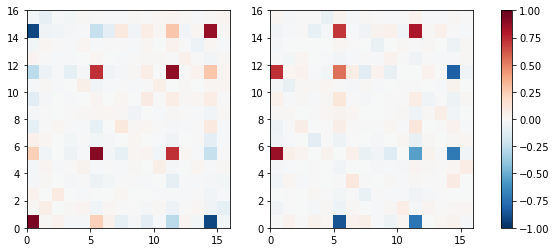

In [12]:
fig, axes = plt.subplots(1,2, figsize=(10,4))
im0 = axes[0].pcolormesh(np.real(reconstruction), cmap='RdBu_r', vmin=-1, vmax=1)
im1 = axes[1].pcolormesh(np.imag(reconstruction), cmap='RdBu_r', vmin=-1, vmax=1)
plt.colorbar(im0, ax=axes)

(0.8764152335768552-3.7752675113469786e-17j)

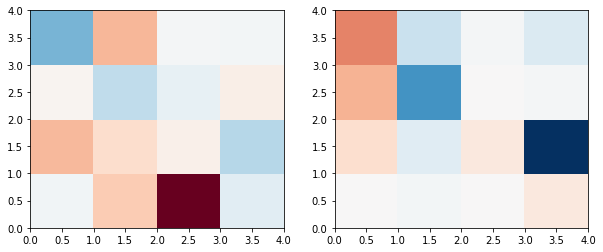

In [13]:
values, vectors = np.linalg.eig(reconstruction.data)
figs, axes = plt.subplots(1,2, figsize=(10,4))
axes[0].pcolormesh(np.real(np.reshape(vectors[:,-1]*2, (4,4))), cmap='RdBu_r', vmin=-1, vmax=1)
axes[1].pcolormesh(np.imag(np.reshape(vectors[:,-1]*2, (4,4))), cmap='RdBu_r', vmin=-1, vmax=1)
np.max(values)/4

In [13]:
from qsweepy.qubit_calibrations import state_tomography
from qsweepy.qubit_calibrations import parametric_two_qubit_gate
reload(parametric_two_qubit_gate)
reload(state_tomography)
qubit_ids = ['1', '3']
iswap = parametric_two_qubit_gate.get_gate_calibration(device, device.get_two_qubit_gates()['iSWAP(1,3)'])
process_tomography_inst = state_tomography.ProcessTomography(device, qubit_ids, pause_length=50e-9)
process_tomography_inst.set_prepare_seq(excitation_pulse.get_s(device, '1', np.pi/2.)+\
                                        iswap.get_pulse_sequence(0.0)+\
                                        excitation_pulse.get_s(device, '1', -np.pi/2.))

tomography = sweeper.sweep(process_tomography_inst, measurement_type='process_tomography_iswap_pihalf_q1')
tomography

Requested:  metadata: {'coil_f13_2': '0.82'} references: {}
Obtained:  metadata: {'coil_f13_2': '0.82'} references: {}
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-14\000714-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-14\000713-two_photon_parametric_iSWAP_calibration-1906-002_4_down
reference: channel_amplitudes : 708
reference: Rabi_rect : 713
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-14\000708-channel_amplitudes-1906-002_4_down
reference: process : 720
reference: process : 720
reference: fit_source : 749
reference: fit_source : 751
reference: channel_amplitudes : 708
reference: Rabi_rect : 713
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-14\000708-channel_amplitudes-1906-002_4_down
reference: frequency_controls : 113
reference: channel_calibration : 140
reference: 

D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  196128 last_point:  196552 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 3048 pre_delay 195952 pre_delay_reg 24494
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196096 last_point:  196136 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3464 pre_delay 195936 pre_delay_reg 24492
first_point:  196096 last_point:  196136 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3464 pre_delay 195936 pre_delay_reg 24492
first_point:  196096 last_point:  196136 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 marker

first_point:  196096 last_point:  196136 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3464 pre_delay 195936 pre_delay_reg 24492
first_point:  196096 last_point:  196136 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3464 pre_delay 195936 pre_delay_reg 24492
first_point:  196096 last_point:  196136 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3464 pre_delay 195936 pre_delay_reg 24492
first_point:  196096 last_point:  196136 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3464 pre_delay 195936 pre_delay_reg 24492
first_point:  196064 last_point:  196136 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196032 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196032 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196032 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 marke

first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196032 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2976 pre_delay 196024 pre_delay_reg 24503
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 marke

first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196032 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2976 pre_delay 196024 pre_delay_reg 24503
first_point:  196032 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2976 pre_delay 196024 pre_delay_reg 24503
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 marker

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196032 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196032 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196032 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2976 pre_delay 196024 pre_delay_reg 24503
first_point:  196032 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 marke

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 marker

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196032 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196032 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2976 pre_delay 196024 pre_delay_reg 24503
first_point:  196032 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 marke

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 marker

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196032 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 marker

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196032 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 marker

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196032 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:661: RuntimeWarning:

overflow encountered in long_scalars

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:662: RuntimeWarning:

overflow encountered in long_scalars

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:661: RuntimeWarning:

overflow encountered in long_scalars

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:662: RuntimeWarning:

overflow encountered in long_scalars



     pcost       dcost       gap    pres   dres   k/t
 0:  0.0000e+00 -1.0000e+00  7e+03  1e+00  7e+01  1e+00
 1:  9.7755e+00  8.7541e+00  2e+03  7e-01  4e+01  5e-03
 2:  1.4336e+01  1.3851e+01  5e+02  3e-01  2e+01  4e-03
 3:  1.8784e+01  1.8475e+01  3e+02  2e-01  1e+01  3e-03
 4:  2.9228e+01  2.9081e+01  1e+02  1e-01  5e+00  1e-03
 5:  4.1986e+01  4.1914e+01  6e+01  5e-02  3e+00  3e-03
 6:  4.2707e+01  4.2631e+01  7e+01  5e-02  3e+00  4e-03
 7:  4.8748e+01  4.8724e+01  2e+01  2e-02  9e-01  1e-03
 8:  5.0279e+01  5.0265e+01  1e+01  1e-02  6e-01  1e-03
 9:  5.2074e+01  5.2073e+01  2e+00  1e-03  6e-02  1e-04
10:  5.2307e+01  5.2307e+01  1e-01  8e-05  4e-03  9e-06
11:  5.2322e+01  5.2322e+01  9e-03  7e-06  4e-04  9e-07
12:  5.2324e+01  5.2324e+01  9e-04  6e-07  3e-05  8e-08
13:  5.2324e+01  5.2324e+01  9e-05  7e-08  4e-06  1e-08
14:  5.2324e+01  5.2324e+01  6e-06  4e-09  2e-07  6e-10
15:  5.2324e+01  5.2324e+01  9e-07  7e-10  4e-08  1e-10
Optimal solution found.
+Z+Z+Z+Z-P0
+Z+Z+Z+Z-P1
+Z

+X-Y-Z-Y-P2
+X-Y-Z-Y-P3
+X-Y-X+Z-P0
+X-Y-X+Z-P1
+X-Y-X+Z-P2
+X-Y-X+Z-P3
+X-Y-X+X-P0
+X-Y-X+X-P1
+X-Y-X+X-P2
+X-Y-X+X-P3
+X-Y-X+Y-P0
+X-Y-X+Y-P1
+X-Y-X+Y-P2
+X-Y-X+Y-P3
+X-Y-X-Z-P0
+X-Y-X-Z-P1
+X-Y-X-Z-P2
+X-Y-X-Z-P3
+X-Y-X-X-P0
+X-Y-X-X-P1
+X-Y-X-X-P2
+X-Y-X-X-P3
+X-Y-X-Y-P0
+X-Y-X-Y-P1
+X-Y-X-Y-P2
+X-Y-X-Y-P3
+X-Y-Y+Z-P0
+X-Y-Y+Z-P1
+X-Y-Y+Z-P2
+X-Y-Y+Z-P3
+X-Y-Y+X-P0
+X-Y-Y+X-P1
+X-Y-Y+X-P2
+X-Y-Y+X-P3
+X-Y-Y+Y-P0
+X-Y-Y+Y-P1
+X-Y-Y+Y-P2
+X-Y-Y+Y-P3
+X-Y-Y-Z-P0
+X-Y-Y-Z-P1
+X-Y-Y-Z-P2
+X-Y-Y-Z-P3
+X-Y-Y-X-P0
+X-Y-Y-X-P1
+X-Y-Y-X-P2
+X-Y-Y-X-P3
+X-Y-Y-Y-P0
+X-Y-Y-Y-P1
+X-Y-Y-Y-P2
+X-Y-Y-Y-P3
+Y+Z+Z+Z-P0
+Y+Z+Z+Z-P1
+Y+Z+Z+Z-P2
+Y+Z+Z+Z-P3
+Y+Z+Z+X-P0
+Y+Z+Z+X-P1
+Y+Z+Z+X-P2
+Y+Z+Z+X-P3
+Y+Z+Z+Y-P0
+Y+Z+Z+Y-P1
+Y+Z+Z+Y-P2
+Y+Z+Z+Y-P3
+Y+Z+Z-Z-P0
+Y+Z+Z-Z-P1
+Y+Z+Z-Z-P2
+Y+Z+Z-Z-P3
+Y+Z+Z-X-P0
+Y+Z+Z-X-P1
+Y+Z+Z-X-P2
+Y+Z+Z-X-P3
+Y+Z+Z-Y-P0
+Y+Z+Z-Y-P1
+Y+Z+Z-Y-P2
+Y+Z+Z-Y-P3
+Y+Z+X+Z-P0
+Y+Z+X+Z-P1
+Y+Z+X+Z-P2
+Y+Z+X+Z-P3
+Y+Z+X+X-P0
+Y+Z+X+X-P1
+Y+Z+X+X-P2
+Y+Z+X+X-P3
+Y+Z+X+Y-P0
+Y+Z

-Z-Z-Y+X-P0
-Z-Z-Y+X-P1
-Z-Z-Y+X-P2
-Z-Z-Y+X-P3
-Z-Z-Y+Y-P0
-Z-Z-Y+Y-P1
-Z-Z-Y+Y-P2
-Z-Z-Y+Y-P3
-Z-Z-Y-Z-P0
-Z-Z-Y-Z-P1
-Z-Z-Y-Z-P2
-Z-Z-Y-Z-P3
-Z-Z-Y-X-P0
-Z-Z-Y-X-P1
-Z-Z-Y-X-P2
-Z-Z-Y-X-P3
-Z-Z-Y-Y-P0
-Z-Z-Y-Y-P1
-Z-Z-Y-Y-P2
-Z-Z-Y-Y-P3
-Z-X+Z+Z-P0
-Z-X+Z+Z-P1
-Z-X+Z+Z-P2
-Z-X+Z+Z-P3
-Z-X+Z+X-P0
-Z-X+Z+X-P1
-Z-X+Z+X-P2
-Z-X+Z+X-P3
-Z-X+Z+Y-P0
-Z-X+Z+Y-P1
-Z-X+Z+Y-P2
-Z-X+Z+Y-P3
-Z-X+Z-Z-P0
-Z-X+Z-Z-P1
-Z-X+Z-Z-P2
-Z-X+Z-Z-P3
-Z-X+Z-X-P0
-Z-X+Z-X-P1
-Z-X+Z-X-P2
-Z-X+Z-X-P3
-Z-X+Z-Y-P0
-Z-X+Z-Y-P1
-Z-X+Z-Y-P2
-Z-X+Z-Y-P3
-Z-X+X+Z-P0
-Z-X+X+Z-P1
-Z-X+X+Z-P2
-Z-X+X+Z-P3
-Z-X+X+X-P0
-Z-X+X+X-P1
-Z-X+X+X-P2
-Z-X+X+X-P3
-Z-X+X+Y-P0
-Z-X+X+Y-P1
-Z-X+X+Y-P2
-Z-X+X+Y-P3
-Z-X+X-Z-P0
-Z-X+X-Z-P1
-Z-X+X-Z-P2
-Z-X+X-Z-P3
-Z-X+X-X-P0
-Z-X+X-X-P1
-Z-X+X-X-P2
-Z-X+X-X-P3
-Z-X+X-Y-P0
-Z-X+X-Y-P1
-Z-X+X-Y-P2
-Z-X+X-Y-P3
-Z-X+Y+Z-P0
-Z-X+Y+Z-P1
-Z-X+Y+Z-P2
-Z-X+Y+Z-P3
-Z-X+Y+X-P0
-Z-X+Y+X-P1
-Z-X+Y+X-P2
-Z-X+Y+X-P3
-Z-X+Y+Y-P0
-Z-X+Y+Y-P1
-Z-X+Y+Y-P2
-Z-X+Y+Y-P3
-Z-X+Y-Z-P0
-Z-X+Y-Z-P1
-Z-X+Y-Z-P2
-Z-X

-X-X-X-Y-P0
-X-X-X-Y-P1
-X-X-X-Y-P2
-X-X-X-Y-P3
-X-X-Y+Z-P0
-X-X-Y+Z-P1
-X-X-Y+Z-P2
-X-X-Y+Z-P3
-X-X-Y+X-P0
-X-X-Y+X-P1
-X-X-Y+X-P2
-X-X-Y+X-P3
-X-X-Y+Y-P0
-X-X-Y+Y-P1
-X-X-Y+Y-P2
-X-X-Y+Y-P3
-X-X-Y-Z-P0
-X-X-Y-Z-P1
-X-X-Y-Z-P2
-X-X-Y-Z-P3
-X-X-Y-X-P0
-X-X-Y-X-P1
-X-X-Y-X-P2
-X-X-Y-X-P3
-X-X-Y-Y-P0
-X-X-Y-Y-P1
-X-X-Y-Y-P2
-X-X-Y-Y-P3
-X-Y+Z+Z-P0
-X-Y+Z+Z-P1
-X-Y+Z+Z-P2
-X-Y+Z+Z-P3
-X-Y+Z+X-P0
-X-Y+Z+X-P1
-X-Y+Z+X-P2
-X-Y+Z+X-P3
-X-Y+Z+Y-P0
-X-Y+Z+Y-P1
-X-Y+Z+Y-P2
-X-Y+Z+Y-P3
-X-Y+Z-Z-P0
-X-Y+Z-Z-P1
-X-Y+Z-Z-P2
-X-Y+Z-Z-P3
-X-Y+Z-X-P0
-X-Y+Z-X-P1
-X-Y+Z-X-P2
-X-Y+Z-X-P3
-X-Y+Z-Y-P0
-X-Y+Z-Y-P1
-X-Y+Z-Y-P2
-X-Y+Z-Y-P3
-X-Y+X+Z-P0
-X-Y+X+Z-P1
-X-Y+X+Z-P2
-X-Y+X+Z-P3
-X-Y+X+X-P0
-X-Y+X+X-P1
-X-Y+X+X-P2
-X-Y+X+X-P3
-X-Y+X+Y-P0
-X-Y+X+Y-P1
-X-Y+X+Y-P2
-X-Y+X+Y-P3
-X-Y+X-Z-P0
-X-Y+X-Z-P1
-X-Y+X-Z-P2
-X-Y+X-Z-P3
-X-Y+X-X-P0
-X-Y+X-X-P1
-X-Y+X-X-P2
-X-Y+X-X-P3
-X-Y+X-Y-P0
-X-Y+X-Y-P1
-X-Y+X-Y-P2
-X-Y+X-Y-P3
-X-Y+Y+Z-P0
-X-Y+Y+Z-P1
-X-Y+Y+Z-P2
-X-Y+Y+Z-P3
-X-Y+Y+X-P0
-X-Y+Y+X-P1
-X-Y+Y+X-P2
-X-Y

load time:  0.12392473220825195
pre_trace_time:  0.007996559143066406
trace 0 time:  0.11892342567443848
trace 1 time:  0.14890503883361816
trace 2 time: 

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\memmap.py:331: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



 0.17688727378845215
trace 3 time:  0.20387005805969238
trace 4 time:  0.23485064506530762


start: 2019-08-16 09:01:44.908595, started/done/total sweeps: 0/1/1.0, 
Measured data: 
'measurement': parameters: ax0 (projection),:[0, 5] (6 points) without setter
ax1 (projection),:[0, 5] (6 points) without setter
ax2 (projection),:[0, 5] (6 points) without setter
ax3 (projection),:[0, 5] (6 points) without setter
ax4 (projection),:[0, 3] (4 points) without setter
data: [[[[[6532. 1440. 1685.  343.]
    [3560. 4218.  986. 1236.]
    [3659. 3984. 1126. 1231.]
    [ 914. 6488.  291. 2307.]
    [3412. 3683. 1412. 1493.]
    [3792. 4274.  868. 1066.]]

   [[4019. 1019. 3944. 1018.]
    [2190. 2642. 2255. 2913.]
    [2096. 2666. 2310. 2928.]
    [ 681. 4342.  646. 4331.]
    [2442. 2535. 2330. 2693.]
    [2339. 2549. 2460. 2652.]]

   [[4302.  963. 3823.  912.]
    [2066. 2491. 2456. 2987.]
    [2548. 2857. 2156. 2439.]
    [ 695. 4693.  551. 4061.]
    [2574. 2699. 2222. 2505.]
    [2443. 2770. 2204. 2583.]]

   [[1456.  398. 6407. 1739.]
    [ 846. 1035. 3658. 4461.]
    [ 935. 1190. 3

In [6]:
from qsweepy.qubit_calibrations import state_tomography
from qsweepy.qubit_calibrations import parametric_two_qubit_gate
reload(parametric_two_qubit_gate)
reload(state_tomography)
qubit_ids = ['1', '3']
iswap = parametric_two_qubit_gate.get_gate_calibration(device, device.get_two_qubit_gates()['iSWAP(1,3)'])
process_tomography_inst = state_tomography.ProcessTomography(device, qubit_ids, pause_length=50e-9)
process_tomography_inst.set_prepare_seq(excitation_pulse.get_s(device, '3', np.pi/2.)+\
                                        iswap.get_pulse_sequence(0.0)+\
                                        excitation_pulse.get_s(device, '3', -np.pi/2.))

tomography = sweeper.sweep(process_tomography_inst, measurement_type='process_tomography_iswap_pihalf_q3')
tomography

Requested:  metadata: {'coil_f13_2': '0.82'} references: {}
Obtained:  metadata: {'coil_f13_2': '0.82'} references: {}
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-14\000714-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-14\000713-two_photon_parametric_iSWAP_calibration-1906-002_4_down
reference: channel_amplitudes : 708
reference: Rabi_rect : 713
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-14\000708-channel_amplitudes-1906-002_4_down
reference: process : 720
reference: process : 720
reference: fit_source : 749
reference: fit_source : 751
reference: channel_amplitudes : 708
reference: Rabi_rect : 713
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-14\000708-channel_amplitudes-1906-002_4_down
reference: frequency_controls : 113
reference: channel_calibration : 140
reference: 

D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  196128 last_point:  196552 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 3048 pre_delay 195952 pre_delay_reg 24494
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196096 last_point:  196136 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3464 pre_delay 195936 pre_delay_reg 24492
first_point:  196096 last_point:  196136 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3464 pre_delay 195936 pre_delay_reg 24492
first_point:  196096 last_point:  196136 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 marker

first_point:  196096 last_point:  196136 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3464 pre_delay 195936 pre_delay_reg 24492
first_point:  196096 last_point:  196136 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3464 pre_delay 195936 pre_delay_reg 24492
first_point:  196096 last_point:  196136 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3464 pre_delay 195936 pre_delay_reg 24492
first_point:  196096 last_point:  196136 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3464 pre_delay 195936 pre_delay_reg 24492
first_point:  196064 last_point:  196136 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196032 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196032 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196032 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 marke

first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196032 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2976 pre_delay 196024 pre_delay_reg 24503
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 marke

first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196032 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2976 pre_delay 196024 pre_delay_reg 24503
first_point:  196032 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2976 pre_delay 196024 pre_delay_reg 24503
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 marker

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196032 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196032 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196032 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2976 pre_delay 196024 pre_delay_reg 24503
first_point:  196032 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 marke

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 marker

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196032 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196032 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2976 pre_delay 196024 pre_delay_reg 24503
first_point:  196032 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 marke

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 marker

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196032 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 marker

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196032 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 marker

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196032 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:661: RuntimeWarning:

overflow encountered in long_scalars

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:662: RuntimeWarning:

overflow encountered in long_scalars

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:661: RuntimeWarning:

overflow encountered in long_scalars

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:662: RuntimeWarning:

overflow encountered in long_scalars



     pcost       dcost       gap    pres   dres   k/t
 0:  0.0000e+00 -1.0000e+00  7e+03  1e+00  7e+01  1e+00
 1:  1.1602e+01  1.0576e+01  2e+03  7e-01  4e+01  5e-03
 2:  1.7533e+01  1.7074e+01  4e+02  3e-01  2e+01  5e-03
 3:  2.4564e+01  2.4300e+01  2e+02  2e-01  1e+01  3e-03
 4:  4.0898e+01  4.0783e+01  1e+02  8e-02  4e+00  3e-03
 5:  5.1806e+01  5.1742e+01  6e+01  4e-02  2e+00  3e-03
 6:  5.7096e+01  5.7058e+01  4e+01  3e-02  2e+00  3e-03
 7:  6.1562e+01  6.1554e+01  9e+00  6e-03  3e-01  7e-04
 8:  6.2765e+01  6.2765e+01  7e-01  4e-04  2e-02  7e-05
 9:  6.2869e+01  6.2869e+01  5e-02  3e-05  2e-03  6e-06
10:  6.2877e+01  6.2877e+01  5e-03  3e-06  2e-04  6e-07
11:  6.2878e+01  6.2878e+01  4e-04  2e-07  1e-05  5e-08
12:  6.2878e+01  6.2878e+01  5e-05  3e-08  2e-06  7e-09
13:  6.2878e+01  6.2878e+01  9e-06  5e-09  3e-07  1e-09
14:  6.2878e+01  6.2878e+01  1e-06  8e-10  5e-08  2e-10
Optimal solution found.
+Z+Z+Z+Z-P0
+Z+Z+Z+Z-P1
+Z+Z+Z+Z-P2
+Z+Z+Z+Z-P3
+Z+Z+Z+X-P0
+Z+Z+Z+X-P1
+Z+Z+Z+X-P

+Y+X+X-Y-P0
+Y+X+X-Y-P1
+Y+X+X-Y-P2
+Y+X+X-Y-P3
+Y+X+Y+Z-P0
+Y+X+Y+Z-P1
+Y+X+Y+Z-P2
+Y+X+Y+Z-P3
+Y+X+Y+X-P0
+Y+X+Y+X-P1
+Y+X+Y+X-P2
+Y+X+Y+X-P3
+Y+X+Y+Y-P0
+Y+X+Y+Y-P1
+Y+X+Y+Y-P2
+Y+X+Y+Y-P3
+Y+X+Y-Z-P0
+Y+X+Y-Z-P1
+Y+X+Y-Z-P2
+Y+X+Y-Z-P3
+Y+X+Y-X-P0
+Y+X+Y-X-P1
+Y+X+Y-X-P2
+Y+X+Y-X-P3
+Y+X+Y-Y-P0
+Y+X+Y-Y-P1
+Y+X+Y-Y-P2
+Y+X+Y-Y-P3
+Y+X-Z+Z-P0
+Y+X-Z+Z-P1
+Y+X-Z+Z-P2
+Y+X-Z+Z-P3
+Y+X-Z+X-P0
+Y+X-Z+X-P1
+Y+X-Z+X-P2
+Y+X-Z+X-P3
+Y+X-Z+Y-P0
+Y+X-Z+Y-P1
+Y+X-Z+Y-P2
+Y+X-Z+Y-P3
+Y+X-Z-Z-P0
+Y+X-Z-Z-P1
+Y+X-Z-Z-P2
+Y+X-Z-Z-P3
+Y+X-Z-X-P0
+Y+X-Z-X-P1
+Y+X-Z-X-P2
+Y+X-Z-X-P3
+Y+X-Z-Y-P0
+Y+X-Z-Y-P1
+Y+X-Z-Y-P2
+Y+X-Z-Y-P3
+Y+X-X+Z-P0
+Y+X-X+Z-P1
+Y+X-X+Z-P2
+Y+X-X+Z-P3
+Y+X-X+X-P0
+Y+X-X+X-P1
+Y+X-X+X-P2
+Y+X-X+X-P3
+Y+X-X+Y-P0
+Y+X-X+Y-P1
+Y+X-X+Y-P2
+Y+X-X+Y-P3
+Y+X-X-Z-P0
+Y+X-X-Z-P1
+Y+X-X-Z-P2
+Y+X-X-Z-P3
+Y+X-X-X-P0
+Y+X-X-X-P1
+Y+X-X-X-P2
+Y+X-X-X-P3
+Y+X-X-Y-P0
+Y+X-X-Y-P1
+Y+X-X-Y-P2
+Y+X-X-Y-P3
+Y+X-Y+Z-P0
+Y+X-Y+Z-P1
+Y+X-Y+Z-P2
+Y+X-Y+Z-P3
+Y+X-Y+X-P0
+Y+X-Y+X-P1
+Y+X-Y+X-P2
+Y+X

-X+X-Y+X-P3
-X+X-Y+Y-P0
-X+X-Y+Y-P1
-X+X-Y+Y-P2
-X+X-Y+Y-P3
-X+X-Y-Z-P0
-X+X-Y-Z-P1
-X+X-Y-Z-P2
-X+X-Y-Z-P3
-X+X-Y-X-P0
-X+X-Y-X-P1
-X+X-Y-X-P2
-X+X-Y-X-P3
-X+X-Y-Y-P0
-X+X-Y-Y-P1
-X+X-Y-Y-P2
-X+X-Y-Y-P3
-X+Y+Z+Z-P0
-X+Y+Z+Z-P1
-X+Y+Z+Z-P2
-X+Y+Z+Z-P3
-X+Y+Z+X-P0
-X+Y+Z+X-P1
-X+Y+Z+X-P2
-X+Y+Z+X-P3
-X+Y+Z+Y-P0
-X+Y+Z+Y-P1
-X+Y+Z+Y-P2
-X+Y+Z+Y-P3
-X+Y+Z-Z-P0
-X+Y+Z-Z-P1
-X+Y+Z-Z-P2
-X+Y+Z-Z-P3
-X+Y+Z-X-P0
-X+Y+Z-X-P1
-X+Y+Z-X-P2
-X+Y+Z-X-P3
-X+Y+Z-Y-P0
-X+Y+Z-Y-P1
-X+Y+Z-Y-P2
-X+Y+Z-Y-P3
-X+Y+X+Z-P0
-X+Y+X+Z-P1
-X+Y+X+Z-P2
-X+Y+X+Z-P3
-X+Y+X+X-P0
-X+Y+X+X-P1
-X+Y+X+X-P2
-X+Y+X+X-P3
-X+Y+X+Y-P0
-X+Y+X+Y-P1
-X+Y+X+Y-P2
-X+Y+X+Y-P3
-X+Y+X-Z-P0
-X+Y+X-Z-P1
-X+Y+X-Z-P2
-X+Y+X-Z-P3
-X+Y+X-X-P0
-X+Y+X-X-P1
-X+Y+X-X-P2
-X+Y+X-X-P3
-X+Y+X-Y-P0
-X+Y+X-Y-P1
-X+Y+X-Y-P2
-X+Y+X-Y-P3
-X+Y+Y+Z-P0
-X+Y+Y+Z-P1
-X+Y+Y+Z-P2
-X+Y+Y+Z-P3
-X+Y+Y+X-P0
-X+Y+Y+X-P1
-X+Y+Y+X-P2
-X+Y+Y+X-P3
-X+Y+Y+Y-P0
-X+Y+Y+Y-P1
-X+Y+Y+Y-P2
-X+Y+Y+Y-P3
-X+Y+Y-Z-P0
-X+Y+Y-Z-P1
-X+Y+Y-Z-P2
-X+Y+Y-Z-P3
-X+Y+Y-X-P0
-X+Y+Y-X-P1
-X+Y

load time:  0.1069333553314209
pre_trace_time:  0.0009999275207519531
trace 0 time:  0.04996919631958008
trace 1 time:  0.07595348358154297
trace 2 time:  0.10193729400634766
trace 3 time:  0.12792277336120605
trace 4 time:  0.15590572357177734


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\memmap.py:331: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



start: 2019-08-15 20:05:46.375871, started/done/total sweeps: 0/1/1.0, 
Measured data: 
'measurement': parameters: ax0 (projection),:[0, 5] (6 points) without setter
ax1 (projection),:[0, 5] (6 points) without setter
ax2 (projection),:[0, 5] (6 points) without setter
ax3 (projection),:[0, 5] (6 points) without setter
ax4 (projection),:[0, 3] (4 points) without setter
data: [[[[[6859. 1306. 1554.  281.]
    [3843. 4248.  992.  917.]
    [4018. 4017.  989.  976.]
    [1291. 6812.  333. 1564.]
    [4251. 3919. 1006.  824.]
    [4171. 4048.  984.  797.]]

   [[4379.  569. 4495.  557.]
    [2417. 2569. 2510. 2504.]
    [2670. 2372. 2629. 2329.]
    [ 845. 4473.  777. 3905.]
    [2334. 2331. 2799. 2536.]
    [2225. 2461. 2607. 2707.]]

   [[3706.  717. 4812.  765.]
    [2098. 2369. 2661. 2872.]
    [2442. 2326. 2664. 2568.]
    [ 714. 4012.  799. 4475.]
    [2423. 2411. 2678. 2488.]
    [2096. 2239. 2770. 2895.]]

   [[1500.  347. 6862. 1291.]
    [ 821.  981. 3994. 4204.]
    [ 855.  929. 4

0.7024969127786589

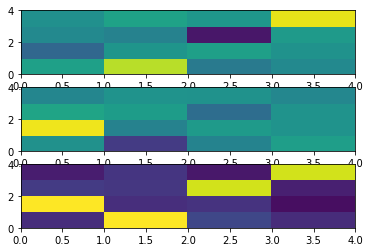

In [57]:
values, vectors = np.linalg.eigh(tomography_cnot.datasets['reconstruction'].data)
figs, axes = plt.subplots(3,1)
axes[0].pcolormesh(np.real(np.reshape(vectors[:,-1]*2, (4,4))), vmin=-1, vmax=1)
axes[1].pcolormesh(np.imag(np.reshape(vectors[:,-1]*2, (4,4))), vmin=-1, vmax=1)
axes[2].pcolormesh(np.abs(np.reshape(vectors[:,-1]*2, (4,4))), vmin=0, vmax=1)
np.max(values)/4

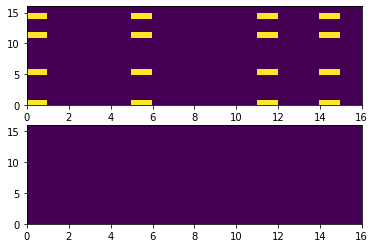

In [41]:
q1_angle = 0
q2_angle = 0
U_iswap = [[1, 0, 0, 0], [0, 1, 0, 0], [0, 0, 0, 1], [0, 0, 1, 0]]
U_angles = np.asarray([[1, 0, 0, 0], 
                       [0, np.exp(1j*q1_angle), 0, 0], 
                       [0, 0, np.exp(1j*q2_angle), 0], 
                       [0, 0, 0, np.exp(1j*(q1_angle+q2_angle))]])
#X_iswap = np.reshape(np.transpose(np.reshape(np.kron(U_iswap@U_angles, np.conj(U_iswap@U_angles)), (4,4,4,4)),(0,2,1,3)), (16,16))
X_iswap = np.reshape(U_iswap@U_angles, (-1, 1))*np.reshape(np.conj(U_iswap@U_angles), (-1,))
figs, axes = plt.subplots(2,1)
axes[0].pcolormesh(np.real(X_iswap))
axes[1].pcolormesh(np.imag(X_iswap))

In [87]:
from qsweepy.qubit_calibrations import state_tomography
from qsweepy.qubit_calibrations import parametric_two_qubit_gate
reload(parametric_two_qubit_gate)
reload(state_tomography)
qubit_ids = ['1', '3']
iswap = parametric_two_qubit_gate.get_gate_calibration(device, device.get_two_qubit_gates()['iSWAP(1,3)'])
process_tomography_inst = state_tomography.ProcessTomography(device, qubit_ids, pause_length=50e-9)
process_tomography_inst.set_prepare_seq(iswap.get_pulse_sequence(0))

tomography = sweeper.sweep(process_tomography_inst, measurement_type='process_tomography_iswap')

Requested:  metadata: {'coil_f13_2': '0.795'} references: {}
Obtained:  metadata: {'coil_f13_2': '0.795'} references: {}
Requested:  metadata: {'coil_f13_2': '0.795'} references: {}
Obtained:  metadata: {'coil_f13_2': '0.795'} references: {}
SELECT fit_id FROM (
    SELECT
        channel_amplitudes.id channel_amplitudes_id,
        fit.id fit_id,
         LEAST(CAST(num_periods_scan.value AS DECIMAL),
               CASE WHEN num_periods_decay.value='inf' THEN 3 ELSE CAST(num_periods_decay.value AS DECIMAL) END)	 score
    --fit.id,
    --Rabi_freq.value as f,
    --num_periods_decay.value,
    --num_periods_scan.value,
    --MIN(CAST (channel_calibration_frequency.value AS DECIMAL)) min_freq,
    --MAX(CAST (channel_calibration_frequency.value AS DECIMAL)) max_freq

    --MAX(fit.id) fit_id

    --channel_amplitudes.*

    FROM
    data measurement

    INNER JOIN reference fit_measurement_reference ON
        fit_measurement_reference.ref_type = 'fit_source' AND
        fit_measurem

Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-18\001007-two_photon_parametric_iSWAP_calibration-1906-002_4_down
candidates:  [5.289538748775214e-07, 5.691790596492552e-07, 1.0780203421409096e-06, 2.0112592385867032e-08]
target values of candidates:  [-5677.79937492 -5492.71977839  6010.95518599  6574.07133913]
length:  5.289538748775214e-07
reference: channel_amplitudes : 938
reference: Rabi_rect : 1007
reference: gate_settings : 937
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-16\000938-channel_amplitudes-1906-002_4_down
reference: process : 1009
reference: process : 1009
reference: fit_source : 1010
reference: fit_source : 1012
reference: channel_amplitudes : 938
reference: Rabi_rect : 1007
reference: gate_settings : 937
reference: phase_scan_q1 : 1010
reference: phase_scan_q2 : 1012
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-16\000938-channel_

RuntimeError: ZIAPINotFoundException with status code: 16387 - Value or Node not found. Extended information: Path '/dev8108/SIGOUTS/2/OFFSET'.

In [84]:
iswap.metadata

{'rotation_angle': 'None',
 'pulse_type': 'rect',
 'length': '4.796075802500595e-07',
 'tail_length': '0',
 'phase_q1': '3.4195469749606113',
 'phase_q2': '0.6734667073161802',
 'q1': '1',
 'q2': '3',
 'frequency_shift': '-109738.83882303792',
 'carrier_name': 'coil_f13_2',
 'carrier_harmonic': '0.5'}

In [14]:
np.sum(tomography.datasets['reconstruction'].data*np.conj(X_iswap))/16

(0.8006389712219047+3.469446951953614e-18j)

In [113]:
vz_compensation_pulses = excitation_pulse.get_s(device, qubit_id='1', phase=q1_angle)+\
excitation_pulse.get_s(device, qubit_id='3', phase=q2_angle)

from qsweepy.qubit_calibrations import state_tomography
from qsweepy.qubit_calibrations import parametric_two_qubit_gate
reload(parametric_two_qubit_gate)
reload(state_tomography)
qubit_ids = ['1', '3']
iswap = parametric_two_qubit_gate.get_gate_calibration(device, device.get_two_qubit_gates()['iSWAP(1,3)'])
process_tomography_inst = state_tomography.ProcessTomography(device, qubit_ids, pause_length=50e-9)
process_tomography_inst.set_prepare_seq(iswap.get_pulse_sequence(0)+vz_compensation_pulses+[device.pg.pmulti(100e-9)])

tomography = sweeper.sweep(process_tomography_inst, measurement_type='process_tomography_iswap_compensated_inverse')

reference: channel_amplitudes : 351
reference: gauss_hd_Rabi_amplitude_adaptive : 523
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000351-channel_amplitudes-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000351-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 345
reference: gauss_hd_Rabi_amplitude_adaptive : 532
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000345-channel_amplitudes-1906-002_4_down
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000345-channel_amplitudes-1906-002_4_down
Requested:  metadata: {'coil_f13_2': '0.82'} references: {}
Obtained:  metadata: {'coil_f13_2': '0.82'} references: {}
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-14\000714-fit_dataset_1d-1906-002_4_down
Exdir_db.select_measurement_

D:\qtlab_replacement\qsweepy\instrument_drivers\HDAWG_1808_new.py:607: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  196128 last_point:  196552 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 3048 pre_delay 195952 pre_delay_reg 24494
first_point:  196104 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2976 pre_delay 196024 pre_delay_reg 24503
first_point:  196096 last_point:  196136 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3464 pre_delay 195936 pre_delay_reg 24492
first_point:  196096 last_point:  196136 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3464 pre_delay 195936 pre_delay_reg 24492
first_point:  196096 last_point:  196136 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196096 last_point:  196136 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3464 pre_delay 195936 pre_delay_reg 24492
first_point:  196096 last_point:  196136 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3464 pre_delay 195936 pre_delay_reg 24492
first_point:  196096 last_point:  196136 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3464 pre_delay 195936 pre_delay_reg 24492
first_point:  196096 last_point:  196136 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3464 pre_delay 195936 pre_delay_reg 24492
first_point:  196064 last_point:  196136 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196032 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196032 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196032 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 marke

first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196032 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2976 pre_delay 196024 pre_delay_reg 24503
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 marke

first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196032 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2976 pre_delay 196024 pre_delay_reg 24503
first_point:  196032 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2976 pre_delay 196024 pre_delay_reg 24503
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 marker

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196032 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196032 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196032 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2976 pre_delay 196024 pre_delay_reg 24503
first_point:  196032 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 marke

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2944 pre_delay 196056 pre_delay_reg 24507
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 marker

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196032 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196032 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 600 nop 199600 post_delay 2976 pre_delay 196024 pre_delay_reg 24503
first_point:  196032 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 marke

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 marker

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196032 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 marker

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196032 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ

first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196064 last_point:  196104 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 3496 pre_delay 195904 pre_delay_reg 24488
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196064 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 marker

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2944 pre_delay 196456 pre_delay_reg 24557
first_point:  196032 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mark

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196616 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196000 last_point:  196624 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2976 pre_delay 194624 pre_delay_reg 24328
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 2944 pre_delay 194656 pre_delay_reg 24332
first_point:  196032 last_point:  196656 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 mar

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:661: RuntimeWarning:

overflow encountered in long_scalars

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:662: RuntimeWarning:

overflow encountered in long_scalars

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:661: RuntimeWarning:

overflow encountered in long_scalars

C:\ProgramData\Anaconda3\lib\site-packages\cvxpy\problems\problem.py:662: RuntimeWarning:

overflow encountered in long_scalars



     pcost       dcost       gap    pres   dres   k/t
 0:  0.0000e+00 -1.0000e+00  7e+03  1e+00  7e+01  1e+00
 1:  7.8358e+00  6.8184e+00  2e+03  7e-01  4e+01  5e-03
 2:  1.1212e+01  1.0749e+01  4e+02  3e-01  2e+01  3e-03
 3:  1.4176e+01  1.3893e+01  2e+02  2e-01  1e+01  2e-03
 4:  2.0994e+01  2.0847e+01  1e+02  1e-01  5e+00  1e-03
 5:  2.8660e+01  2.8556e+01  8e+01  7e-02  4e+00  3e-03
 6:  3.4287e+01  3.4240e+01  4e+01  3e-02  2e+00  2e-03
 7:  3.6491e+01  3.6456e+01  3e+01  2e-02  1e+00  2e-03
 8:  3.9057e+01  3.9046e+01  9e+00  8e-03  4e-01  7e-04
 9:  3.9093e+01  3.9082e+01  9e+00  7e-03  4e-01  9e-04
10:  4.0201e+01  4.0199e+01  1e+00  1e-03  6e-02  1e-04
11:  4.0256e+01  4.0255e+01  1e+00  8e-04  4e-02  1e-04
12:  4.0404e+01  4.0404e+01  7e-02  6e-05  3e-03  7e-06
13:  4.0412e+01  4.0412e+01  2e-02  1e-05  8e-04  2e-06
14:  4.0415e+01  4.0415e+01  2e-03  2e-06  1e-04  3e-07
15:  4.0415e+01  4.0415e+01  6e-04  5e-07  3e-05  8e-08
16:  4.0415e+01  4.0415e+01  1e-04  9e-08  5e-06  

+Y+X+X+Z-P1
+Y+X+X+Z-P2
+Y+X+X+Z-P3
+Y+X+X+X-P0
+Y+X+X+X-P1
+Y+X+X+X-P2
+Y+X+X+X-P3
+Y+X+X+Y-P0
+Y+X+X+Y-P1
+Y+X+X+Y-P2
+Y+X+X+Y-P3
+Y+X+X-Z-P0
+Y+X+X-Z-P1
+Y+X+X-Z-P2
+Y+X+X-Z-P3
+Y+X+X-X-P0
+Y+X+X-X-P1
+Y+X+X-X-P2
+Y+X+X-X-P3
+Y+X+X-Y-P0
+Y+X+X-Y-P1
+Y+X+X-Y-P2
+Y+X+X-Y-P3
+Y+X+Y+Z-P0
+Y+X+Y+Z-P1
+Y+X+Y+Z-P2
+Y+X+Y+Z-P3
+Y+X+Y+X-P0
+Y+X+Y+X-P1
+Y+X+Y+X-P2
+Y+X+Y+X-P3
+Y+X+Y+Y-P0
+Y+X+Y+Y-P1
+Y+X+Y+Y-P2
+Y+X+Y+Y-P3
+Y+X+Y-Z-P0
+Y+X+Y-Z-P1
+Y+X+Y-Z-P2
+Y+X+Y-Z-P3
+Y+X+Y-X-P0
+Y+X+Y-X-P1
+Y+X+Y-X-P2
+Y+X+Y-X-P3
+Y+X+Y-Y-P0
+Y+X+Y-Y-P1
+Y+X+Y-Y-P2
+Y+X+Y-Y-P3
+Y+X-Z+Z-P0
+Y+X-Z+Z-P1
+Y+X-Z+Z-P2
+Y+X-Z+Z-P3
+Y+X-Z+X-P0
+Y+X-Z+X-P1
+Y+X-Z+X-P2
+Y+X-Z+X-P3
+Y+X-Z+Y-P0
+Y+X-Z+Y-P1
+Y+X-Z+Y-P2
+Y+X-Z+Y-P3
+Y+X-Z-Z-P0
+Y+X-Z-Z-P1
+Y+X-Z-Z-P2
+Y+X-Z-Z-P3
+Y+X-Z-X-P0
+Y+X-Z-X-P1
+Y+X-Z-X-P2
+Y+X-Z-X-P3
+Y+X-Z-Y-P0
+Y+X-Z-Y-P1
+Y+X-Z-Y-P2
+Y+X-Z-Y-P3
+Y+X-X+Z-P0
+Y+X-X+Z-P1
+Y+X-X+Z-P2
+Y+X-X+Z-P3
+Y+X-X+X-P0
+Y+X-X+X-P1
+Y+X-X+X-P2
+Y+X-X+X-P3
+Y+X-X+Y-P0
+Y+X-X+Y-P1
+Y+X-X+Y-P2
+Y+X-X+Y-P3
+Y+X

-Z-Y-Y-Y-P0
-Z-Y-Y-Y-P1
-Z-Y-Y-Y-P2
-Z-Y-Y-Y-P3
-X+Z+Z+Z-P0
-X+Z+Z+Z-P1
-X+Z+Z+Z-P2
-X+Z+Z+Z-P3
-X+Z+Z+X-P0
-X+Z+Z+X-P1
-X+Z+Z+X-P2
-X+Z+Z+X-P3
-X+Z+Z+Y-P0
-X+Z+Z+Y-P1
-X+Z+Z+Y-P2
-X+Z+Z+Y-P3
-X+Z+Z-Z-P0
-X+Z+Z-Z-P1
-X+Z+Z-Z-P2
-X+Z+Z-Z-P3
-X+Z+Z-X-P0
-X+Z+Z-X-P1
-X+Z+Z-X-P2
-X+Z+Z-X-P3
-X+Z+Z-Y-P0
-X+Z+Z-Y-P1
-X+Z+Z-Y-P2
-X+Z+Z-Y-P3
-X+Z+X+Z-P0
-X+Z+X+Z-P1
-X+Z+X+Z-P2
-X+Z+X+Z-P3
-X+Z+X+X-P0
-X+Z+X+X-P1
-X+Z+X+X-P2
-X+Z+X+X-P3
-X+Z+X+Y-P0
-X+Z+X+Y-P1
-X+Z+X+Y-P2
-X+Z+X+Y-P3
-X+Z+X-Z-P0
-X+Z+X-Z-P1
-X+Z+X-Z-P2
-X+Z+X-Z-P3
-X+Z+X-X-P0
-X+Z+X-X-P1
-X+Z+X-X-P2
-X+Z+X-X-P3
-X+Z+X-Y-P0
-X+Z+X-Y-P1
-X+Z+X-Y-P2
-X+Z+X-Y-P3
-X+Z+Y+Z-P0
-X+Z+Y+Z-P1
-X+Z+Y+Z-P2
-X+Z+Y+Z-P3
-X+Z+Y+X-P0
-X+Z+Y+X-P1
-X+Z+Y+X-P2
-X+Z+Y+X-P3
-X+Z+Y+Y-P0
-X+Z+Y+Y-P1
-X+Z+Y+Y-P2
-X+Z+Y+Y-P3
-X+Z+Y-Z-P0
-X+Z+Y-Z-P1
-X+Z+Y-Z-P2
-X+Z+Y-Z-P3
-X+Z+Y-X-P0
-X+Z+Y-X-P1
-X+Z+Y-X-P2
-X+Z+Y-X-P3
-X+Z+Y-Y-P0
-X+Z+Y-Y-P1
-X+Z+Y-Y-P2
-X+Z+Y-Y-P3
-X+Z-Z+Z-P0
-X+Z-Z+Z-P1
-X+Z-Z+Z-P2
-X+Z-Z+Z-P3
-X+Z-Z+X-P0
-X+Z-Z+X-P1
-X+Z-Z+X-P2
-X+Z

load time:  0.1069340705871582
pre_trace_time:  0.0019989013671875
trace 0 time:  0.04996967315673828
trace 1 time:  0.07695579528808594
trace 2 time:  0.10493707656860352
trace 3 time:  0.13192033767700195
trace 4 time:  0.15790462493896484


C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\memmap.py:331: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: ComplexWarning:

Casting complex values to real discards the imaginary part



0.7839151521124441 1953 (38, 15)
4.775220833456486 1.884955592153876


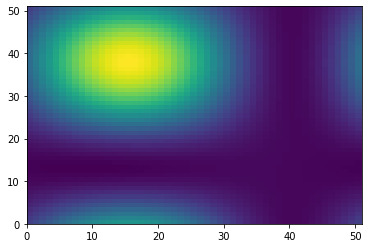

In [15]:
U_iswap = [[1, 0, 0, 0], [0, 0, 1j, 0], [0, 1j, 0, 0], [0, 0, 0, 1]]
fidelities = np.zeros((51,51))
for q1_id, q1_angle in enumerate(np.linspace(0, 2*np.pi, 51)):
    for q2_id, q2_angle in enumerate(np.linspace(0, 2*np.pi, 51)):
        U_angles = np.asarray([[1, 0, 0, 0], 
                               [0, np.exp(1j*q1_angle), 0, 0], 
                               [0, 0, np.exp(1j*q2_angle), 0], 
                               [0, 0, 0, np.exp(1j*(q1_angle+q2_angle))]])
#plt.pcolormesh((np.real(np.tensordot(np.asarray(U_iswap).ravel(), np.conj(np.asarray(U_iswap)).ravel()))))
        X_iswap = np.reshape(np.transpose(np.reshape(np.kron(U_iswap@U_angles, np.conj(U_iswap@U_angles)), (4,4,4,4)),(0,2,1,3)), (16,16))
#figs, axes = plt.subplots(2,1)
#axes[0].pcolormesh(np.real(X_iswap))
#axes[1].pcolormesh(np.imag(X_iswap))
        fidelity = np.sum(X_iswap*np.conj(tomography.datasets['reconstruction'].data))/16
        fidelities[q1_id, q2_id] =fidelity
print (np.max(fidelities.ravel()), 
       np.argmax(fidelities.ravel()), 
       np.unravel_index(np.argmax(fidelities.ravel()), fidelities.shape))
q1_angle = np.linspace(0, 2*np.pi, 51)[np.unravel_index(np.argmax(fidelities.ravel()), fidelities.shape)[0]]
q2_angle = np.linspace(0, 2*np.pi, 51)[np.unravel_index(np.argmax(fidelities.ravel()), fidelities.shape)[1]]
print (q1_angle, q2_angle)
plt.pcolormesh(np.real(fidelities))

(array([ 0.05963048+0.00441459j,  0.03167051+0.00587463j,
        -0.06526532-0.12528449j,  0.11570335-0.07486403j,
         0.00553962+0.01073033j, -0.02504412-0.05668975j,
         0.09169304+0.31728776j, -0.24149892-0.11505781j,
         0.37985674-0.09985282j, -0.02625337-0.08068906j,
        -0.25869297+0.00035187j, -0.45643697-0.21693117j,
        -0.07219275-0.09407795j,  0.09628519-0.0938921j ,
         0.06295884-0.0191949j ,  0.47194233+0.16977943j]), 3.1666822615095462)

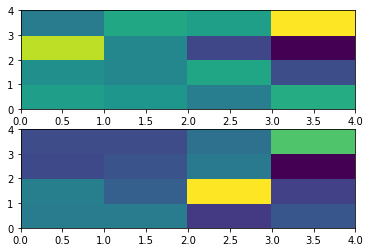

In [20]:
values, vectors = np.linalg.eigh(tomography.datasets['reconstruction'].data)
fig, axes = plt.subplots(2,1)
axes[0].pcolormesh(np.reshape(np.real(vectors[-1]), (4,4)))
axes[1].pcolormesh(np.reshape(np.imag(vectors[-1]), (4,4)))
vectors[-1], values[-1]

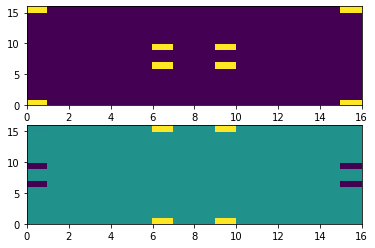

In [10]:
q1_angle = np.pi
q2_angle = np.pi
U_iswap = [[1, 0, 0, 0], [0, 0, 1j, 0], [0, 1j, 0, 0], [0, 0, 0, 1]]
U_angles = np.asarray([[1, 0, 0, 0], 
                       [0, np.exp(1j*q1_angle), 0, 0], 
                       [0, 0, np.exp(1j*q2_angle), 0], 
                       [0, 0, 0, np.exp(1j*(q1_angle+q2_angle))]])
X_iswap = np.reshape(np.transpose(np.reshape(np.kron(U_iswap@U_angles, np.conj(U_iswap@U_angles)), (4,4,4,4)),(0,2,1,3)), (16,16))
figs, axes = plt.subplots(2,1)
axes[0].pcolormesh(np.real(X_iswap))
axes[1].pcolormesh(np.imag(X_iswap))

In [74]:
np.unravel_index?

In [20]:
from qsweepy.qubit_calibrations import state_tomography
reload(state_tomography)
qubit_ids = ['1']
process_tomography_inst = state_tomography.ProcessTomography(device, qubit_ids, pause_length=50e-9)
process_tomography_inst.set_prepare_seq([])
tomography = sweeper.sweep(process_tomography_inst, measurement_type='process_tomography_identity')

reference: frequency_controls : 113
reference: channel_calibration : 140
reference: fidelity_scan : 594
reference: ('readout_pulse', '1') : 596
reference: readout_pulse : 597
reference: delay_calibration : 142
reference: channel_amplitudes : 351
reference: gauss_hd_Rabi_amplitude_adaptive : 504
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000351-channel_amplitudes-1906-002_4_down
reference: ('excitation_pulse', '1') : 534
reference: readout_pulse : 597
reference: channel_amplitudes : 351
reference: gauss_hd_Rabi_amplitude_adaptive : 523
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000351-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 351
reference: gauss_hd_Rabi_amplitude_adaptive : 523
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  d:\data\2019-08-13\000351-channel_amplitudes-1906-002_4_down
reference: channel_amplitudes : 351
reference: 

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\numeric.py:538: ComplexWarning:

Casting complex values to real discards the imaginary part



first_point:  197000 last_point:  198600 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 1000 pre_delay 196600 pre_delay_reg 24575
first_point:  197000 last_point:  198600 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 2000 nop 199600 post_delay 1000 pre_delay 196600 pre_delay_reg 24575
first_point:  196712 last_point:  196752 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2848 pre_delay 196552 pre_delay_reg 24569
first_point:  196712 last_point:  196752 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 markerQ length 199600 wave_length 200 nop 199600 post_delay 2848 pre_delay 196552 pre_delay_reg 24569
first_point:  196712 last_point:  196752 waveformI length (199600,) waveformQ length (199600,) markerI length 199600 marke

TypeError: 'NoneType' object is not iterable

In [43]:
def process_matrix(process, process_type='chi', plot=False, plot_name=''):
    import numpy as np
    import itertools
    operators_1Q = { 'I': np.matrix([[1,0],[0,1]]),
                     'X': np.matrix([[0,1],[1,0]]),
                     'Y': np.matrix([[0,-1j],[1j,0]]),
                     'Z': np.matrix([[1,0],[0,-1]])}
    operators_2Q=dict()
    for i,j in operators_1Q.items():
        for k,l in operators_1Q.items():
            operators_2Q[i+k]=np.kron(j,l)
    if process_type=='chi':
        process_tensor = np.reshape(process, (4,4,4,4))
    matrix={}
    for ind1,op1 in operators_2Q.items():
        for ind2,op2 in operators_2Q.items():
            if process_type=='chi':
                matrix[ind1,ind2]=0.25*np.einsum('ijkl,ij,kl->', process_tensor, op1, op2)
            else:
                matrix[ind1,ind2]=(0.25*np.trace(op1@process@op2@np.conj(process.T)))
                
    basis = ['I','X','Y','Z']
    double_basis = [i+j for i,j in itertools.product(basis, basis)]
    double_basis
    matrix_np = np.zeros((16,16))
    for i,f in itertools.product(double_basis, double_basis):
        i_id = double_basis.index(i)
        f_id = double_basis.index(f)
        matrix_np[i_id, f_id] = matrix[(i,f)]
    if plot:
        plt.figure()
        plt.pcolormesh(np.rot90(matrix_np),cmap='RdBu',vmax=1,vmin=-1)
        plt.xticks(np.arange(len(double_basis))+0.5,double_basis)
        plt.yticks(np.arange(len(double_basis))+0.5,double_basis[::-1])
        plt.colorbar()
        plt.grid()
        fig = plt.gcf()
        fig.canvas.set_window_title('Pauli transfer matrix '+plot_name)
    return matrix_np

In [32]:
chi = np.transpose(np.reshape(tomography.datasets['reconstruction'].data, (4,4,4,4)), (0, 3, 1, 2))
process_matrix(chi, plot=True)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:29: ComplexWarning:

Casting complex values to real discards the imaginary part



array([[ 5.05136028e-01, -5.29652659e-02, -4.60033543e-02,
         3.83556476e-01,  2.93946468e-03,  7.67843477e-02,
         2.28219364e-03, -1.04680350e-02, -3.10673205e-02,
        -5.76058246e-02,  9.98113071e-02,  3.81951306e-02,
         4.19551176e-01, -4.13012404e-02, -2.31722119e-02,
         9.15894391e-02],
       [-5.29652659e-02,  4.31865352e-02,  2.46398563e-01,
        -3.08522224e-02,  3.73369501e-02,  2.44303759e-02,
        -2.41788626e-02,  1.39394092e-01,  9.07498918e-02,
         1.53523447e-02,  2.05994912e-02,  2.73350755e-01,
         1.38465466e-03,  1.65802634e-02,  1.38569555e-01,
        -1.03862482e-02],
       [ 4.60033543e-02, -2.46398563e-01, -1.81260434e-01,
         2.44985499e-02, -1.58220532e-01, -2.44979328e-02,
         2.28287613e-02, -2.83259500e-01, -1.43864267e-02,
        -1.88820988e-02, -2.41130565e-02,  1.40999725e-01,
         1.40171768e-02, -1.39021620e-01, -1.73468685e-01,
         1.93522404e-02],
       [ 3.83556476e-01, -3.08522224e

## ZZ-crosstalk calibration

In [ ]:
Ramsey.calibrate_all_crosstalks(device)

## Cross-channel Ramsey

In [ ]:
cross_ramsey_data = Ramsey.calibrate_all_cross_Ramsey(device)

In [ ]:
qubit_readout_pulse, readout_device = calibrated_readout.get_calibrated_measurer(device, device.get_qubit_list())
confusion_matrix = calibrated_readout.calibrate_preparation_and_readout_confusion(device, qubit_readout_pulse, readout_device)

In [ ]:
confusion_matrix.datasets['resultnumbers'].parameters

# Default settings

## qubit settings

In [4]:
#Параметры кубитов.all keys should be str
qubits = {
          '1': {'r':{
                     'Fr': 4.9536e9, # first sample # second sample 7.0848e9,# second sample 7.085e9,#6.59783e9,
                     'Fr_min': 4.9532e9,#6.575e9,
                     'Fr_max': 4.9542e9,#7.100e9# down 6.702e9,#7.110e9,##6.62e9,
                     'dFr': 0.1e6,#0.1e6, # tolerance of resonator frequency
                     'P': -45,
                     'iq_devices':{'iq_ro_q1': 'iq_ro'}}, # channel name : device name
               'q': {'iq_devices':{'coil_q1': 'coil',
                                   #'iq_ex2_q3': 'iq_ex2', 
                                   #'iq_ex3_q1': 'iq_ex3'
                                  },
                     'iq_devices_transitions':{'coil_q1': '01'},
                     'F':
                       {'F01_min': 0.0974e9}, #  0.0978e9 4.17799e9#4.1173e9 #4.242e9#4.23819e9#4.159e9},#4.535e9}, #4.622e9 - up},#5.505e9}, # was 5.508e9,last 5.51812
                     'P':
                     {'nndac_coil_id':0,#0,
                      'awg_tek_coil_channel':4,
                      'coil_device_channel':4,
                     'P':None,    
                     }
                    }}
         }

reload(qubit_device)
reload(exdir_db)
reload(database)
reload(sweep_extras)


# setting pony 
db = database.MyDatabase()
sweeper = sweep_extras.Sweeper(db, sample_name=sample_name)
exdir_db_inst = exdir_db.Exdir_db(db=db, sample_name=sample_name)
device = qubit_device.qubit_device(exdir_db_inst, sweeper, controls={'coil':hardware.coil})
device.set_frequency_controls(qubit_id='1', controls=['coil'])
device.set_frequency_controls(qubit_id='3', controls=['coil'])
device.set_qubits_from_dict(qubits)

 <class 'AssertionError'>
 <class 'AssertionError'>


In [12]:
# когда спектроскопия не рабтает и всё плохо, тыкай сюды!
# вектнй анлизатр цепей - в режим свипа по частоте
hardware.pna.set_sweep_mode("LIN")


#awg1.set_trigger_mode(2)
#awg1.trigger_source_types = [6,6,6,6]
#awg1.trigger_source_channels = [4000, 4000,4000,4000]
#awg1.trigger_delays = [7+10,7+10,7+10,7+10] # wait 60 ns for sync with awg2
#awg1.trigger_behaviours = [4,4,4,4]
#awg1.stop()

for channel in range(0,2):
    hardware.coil.awg.set_amplitude(0.05, channel=channel)
    hardware.coil.awg.set_offset(0.7,channel=channel)
    hardware.coil.awg.set_output(1, channel=channel)
    #hardware.coil.awg.set_waveform(waveform = [0]*99500, channel=channel)

#hardware.coil.awg.set_digital(length=200, delay=0, channel=0, pxi_channels=2)
hardware.coil.awg.run()

In [ ]:
hardware.pna.

In [8]:
#dac = nndac('TCPIP0::10.20.61.12::1000::SOCKET')
#coil_device = awg_tek
#coil_device = dac
current_src1 = Yokogawa_GS210(address = 'GPIB1::1::INSTR')
coil_device = current_src1

In [16]:
coil_device.set_range(0.01)

True

In [19]:
if coil_device != current_src1:
    if coil_device ==awg_tek:
        raise ValueError('awg_tek is the active coil control device. This cell is for current_src1 (Yokogawa)')
    if coil_device ==dac:
        raise ValueError('dac is the active coil control device. This cell is for current_src1 (Yokogawa).')
#coil = 'z1'
#current_max = 1.5e-3
current_max = 0.3e-3 # 7 mA - max on coil
#voltage_max = 1
current_nop =151
current_nop =151
currents=np.linspace(-current_max,current_max,current_nop)


#current_src1.set_status(1)
hardware.pna.set_nop(301)
hardware.pna.set_bandwidth(50)
#pna.set_power(qubits[qubit_id]['r']['P']+55) 
hardware.pna.set_power(-30) #-30

def sleep(x):
    coil_device.set_current(x)
    #time.sleep(4)

for qubit_id in ['1']:#,'2','3','4','5','6']:
        
        coil_device.set_status(1)
        coil_device.set_current(0)
        coil = 'DC_coil'
        
        hardware.pna.set_xlim(4.9533e9, 4.9539e9)
        result = sweeper.sweep(hardware.pna, 
                        (currents, lambda x: sleep(x), 'Coil #{} current, qubit{}'.format(coil,qubit_id)), 
                        measurement_type='resonator_anticrossing',
                        metadata={'qubit':qubit_id,'coil':coil,'pna_power':hardware.pna.get_power()})
                               #filename='Fluxonium 1902-057-2 Coil #{} anticrossings qubit {}'.format(coil, qubit_id))
        coil_device.set_current(0)#0)
        coil_device.set_status(0)


S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-pa

In [28]:
if coil_device != dac:
    if coil_device ==awg_tek:
        raise ValueError('awg_tek is the active coil control device. This cell is for nndac')



nndac_coil_id=2

#hardware.coil.awg.set_output(output=0, channel=4)
#hardware.coil.awg.set_amplitude(amplitude=1, channel=4)
hardware.pna.set_power(-25) #-30
amplitudes=np.linspace(0.01,0.46,16)

freq_nop =501

freqs= np.linspace(0.03e9,0.08e9,freq_nop)
freqs= np.linspace(0.08e9,0.17e9,freq_nop)
freqs= np.linspace(0.04e9,0.16e9,freq_nop)
freqs= np.linspace(0.08e9,0.11e9,freq_nop)
#freqs= np.linspace(5e9,10e9,freq_nop)
freqs= np.linspace(0.2e9,0.3e9,freq_nop)
hardware.pna.set_nop(1)
hardware.pna.set_bandwidth(1)
base_power = -10
frequency_gain  = 6.8


delay = 70e-9
voltage=0.682
def sleep(x,channel):
    dac.set_voltage(x, channel=channel)
for qubit_id in ['1']:#['1', '3']:
        
        dac.set_voltage(0.682, channel=nndac_coil_id)
        coil = 'NNDAC-'+str(nndac_coil_id)
        res_freq = 4.953597e9#qubits[qubit_id]['r']['Fr']
        res_freq = 4.95356e9#qubits[qubit_id]['r']['Fr']
        res_freq = 4.9536e9#qubits[qubit_id]['r']['Fr']
        
        hardware.pna.set_frequency(res_freq)
        hardware.pna.set_centerfreq(res_freq)
        hardware.coil.awg.run()
        hardware.coil.awg.set_output(output=1, channel=4)

                   
        def set_corrected_frequency(x):
            hardware.coil.awg.set_frequency(osc_num=4, freq=x)
            hardware.coil.awg.run()
            #hardware.coil.awg.set_output(output=1, channel=4)
            
        def set_amplitude(x):
            hardware.coil.awg.set_amplitude(amplitude=x, channel=4)
            hardware.coil.awg.run()
            #hardware.coil.awg.set_output(output=1, channel=4)
            #lo1.set_power(x/1e9*frequency_gain+base_power)
            
        result = sweeper.sweep(hardware.pna,
                                 (amplitudes,set_amplitude, '2 tone amplitude at {}'.format(qubit_id), 'V'),
                                 (freqs,set_corrected_frequency, 'Excitation frequency', 'Hz'),
                                 measurement_type='tone_tone_spectroscopy',
                                 metadata = {'resonator_id': qubit_id,
                                             'voltage':  voltage,
                                             'probe_power': hardware.pna.get_power(),
                                             'freq_nop': freq_nop,
                                             'bw': hardware.pna.get_bandwidth(),
                                             'fr': res_freq,
                                             'coil': coil,
                                            })
            
        for nndac_channel in range(24):
            dac.set_voltage(0, channel=nndac_channel)#0)
hardware.coil.awg.set_output(output=0, channel=4)
hardware.coil.awg.stop()

S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-pa

S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-pa

S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-pa

S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-pa

S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-pa

S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-pa

S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-pa

S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-pa

S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-pa

S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-parameter
S-pa

KeyboardInterrupt: 

TypeError: 'qubit_device' object is not callable

## sample globals (scan ranges etc.)

In [6]:
sample_globals={
            'readout_passthrough_points':21,
            'readout_passthrough_amplitude':1.0,
    'readout_length': 1.7e-6,
    'readout_background_nums': 10000,
    'Rabi_rect_length': 400e-9,
    'Rabi_rect_step': 2e-9,
    'Ramsey_length': 10e-6,
    'Ramsey_step': 100e-9,
    'adaptive_Rabi_min_step':1e-9,
    'adaptive_Rabi_scan_points': 80,
    'adaptive_Rabi_range':10,
    'adaptive_Rabi_max_scan_length':20e-6,
    'adaptive_Ramsey_max_scan_length':100e-6,
    'adaptive_Ramsey_points_per_oscillation':10,
    'frequency_rounding':5e3,
    'amplitude_default':1.0,
    'cross_Ramsey_initial_delay':0e-9, ## fix the fitter!!
    'max_parasitic_Rabi_ratio': 0.1, ## maximum Ω_R/Δ for non-target qubits that is 
                ## used to choose the excitation amplitude for the target qubit
    'max_Rabi_freq': 50e9, ## maximum Rabi frequency for target qubit
    'pulse_length_alignment': 32e-9,
    'sigmas_in_gauss': 4,
    'adaptive_Rabi_amplitude_scan_points': 20,
    'adaptive_Rabi_amplitude_range':2,
    'delay_calibration_sequence_length': 10000,
    'uncalibrated_readout_nums': 50000,
    'calibrated_readout_nums': 10000,
    'delay_calibration_nums': 200,
    'delay_calibration_nop': 32768,
    'readout_adc_points': 2048,
    'process_phase_scan_points': 50,
    'two_qubit_pulse_post_pause': 0e-9,
    'parametric_frequency_shift_calibration_frequency_offset': 5e6,
}

reload(exdir_db)
reload(database)
reload(sweep_extras)
db = database.MyDatabase()
sweeper = sweep_extras.Sweeper(db, sample_name=sample_name)
exdir_db_inst = exdir_db.Exdir_db(db=db, sample_name=sample_name)
device = qubit_device.qubit_device(exdir_db_inst, sweeper)
device.set_sample_globals(sample_globals)

sample_name

'Fluxonium_1907_063_2'

# Shamil's little playground

In [ ]:
### SHAMIL'S LITTLE PLAYGROUND
data_records = list(device.exdir_db.select_measurements_db(measurement_type="qubit_readout_channel_list",
                                                           metadata={"qubit_id":'1'}).limit(5))
record_idx = 0
data_record = data_records[record_idx]
metadata = list(data_record.metadata)
ref_this = list(data_record.reference_one)
ref_that = list(data_record.reference_two)
display(data_record.measurement_type,
        data_record.filename,
        metadata,
        ref_this,
        ref_that)
metadata[0]

In [93]:
# 8348 - unit process tomography
# 8376 - also unit process tomography but with strange matrix
# 8374 - iswap process tomography

import pickle as pkl
import os

for uid in [8348,8376,8374]:
    data = device.exdir_db.select_measurement_by_id(uid)
    with open(os.path.join(r"C:\Users\cryopxi\Downloads\exchange temp",
                           str(uid) + ".pkl"),"wb") as pkl_file:
        for key in data.datasets.keys():
            custom_dict[key] = np.array(data.datasets[key].data)
            print(custom_dict[key].shape)
        pkl.dump(custom_dict, pkl_file)

Exdir_db.select_measurement_by_id: trying to load measurement state by id:  c:\data\2019-07-30\008348-process_tomography_identity-1906-001_1_down
(6, 6, 6, 6, 4)
(16, 16)
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  c:\data\2019-07-30\008376-process_tomography_identity-1906-001_1_down
(6, 6, 2)
(4, 4)
Exdir_db.select_measurement_by_id: trying to load measurement state by id:  c:\data\2019-07-30\008374-process_tomography_iswap-1906-001_1_down
(6, 6, 6, 6, 4)
(16, 16)


In [ ]:
qubit_readout_pulse, readout_device = calibrated_readout.get_calibrated_measurer(device, ['1'])